In [1]:
import numpy as np
import random as rd
import tensorflow as tf

from keras.layers import Dense, Embedding, Flatten, Input, BatchNormalization
from keras.models import Model
from keras.optimizers import RMSprop

#Import another jupyter notebook
import import_ipynb
from AttentionLayer import *
from Productive_CrossValidation_inclTest import *
from Productive_Data_GetTrainTest import samEval

C:\Users\twitter\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


importing Jupyter notebook from AttentionLayer.ipynb
importing Jupyter notebook from Productive_CrossValidation_inclTest.ipynb
importing Jupyter notebook from Productive_TimeHistory.ipynb
importing Jupyter notebook from Productive_Data_GetTrainTest.ipynb


In [2]:
#for reproducability of the results
seed = 7
np.random.seed(seed)
tf.set_random_seed(seed)
rd.seed(seed)

In [3]:
path = 'data/'
outputpath ='outputs/02_activation_SamEval2018/'

In [4]:
#Load necessary data
train_data, train_labels, test_data, test_labels, word_index, MAX_SEQUENCE_LENGTH = samEval()

In [5]:
#Load pretrained embeddings
import gensim
from gensim.models import KeyedVectors

#Pretrained Google News Embeddings, Dimension 300
GOOGLEEMB = path + 'GoogleNews-vectors-negative300.bin'

embedding= KeyedVectors.load_word2vec_format(GOOGLEEMB, binary=True)

word_vectors = embedding.wv

C:\Users\twitter\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).
  # Remove the CWD from sys.path while we load stuff.


In [6]:
#Create embedding-matrix, serves the Keras Embedding Layer as weigths
EMBEDDING_DIM=300

embedding_matrix = np.zeros((len(word_index)+1, EMBEDDING_DIM))

for word, i in word_index.items():
    try:
        embedding_vector = word_vectors[word]
        embedding_matrix[i] = embedding_vector   
    except:
        # words not found in embeddings will be zero
        pass

## Hyperparameter for all models

In [7]:
EPOCHS = 30
BATCH_SIZE = 64
softmax = True
optimizer = RMSprop(lr=0.001, rho = 0.9, epsilon = 0.0000001)
lossfunction ='binary_crossentropy'

Instructions for updating:
Colocations handled automatically by placer.


## MLP with one hidden layer and 600 neurons

### Change activationfunction in hidden layer

In [8]:
wv_layer = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences = wv_layer(comment_input)

#First Dense Layer
x = Dense(600, activation='sigmoid')(embedded_sequences)
x = Flatten()(x)

#Output (Dense) Layer
preds = Dense(2, activation='softmax')(x)

# build the model
model = Model(inputs=[comment_input], outputs=preds)

Instructions for updating:
Use tf.cast instead.

-----Fold 1--------


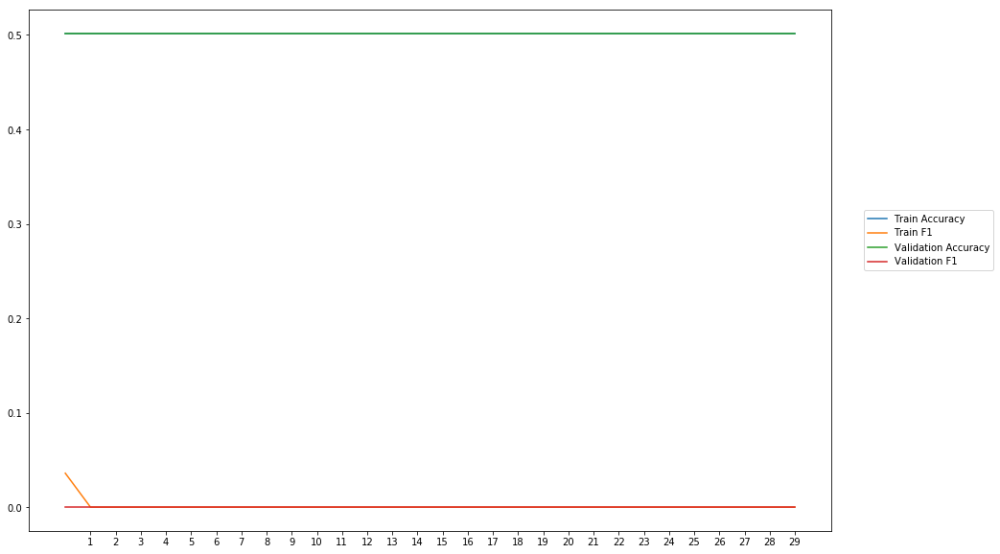

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 2--------


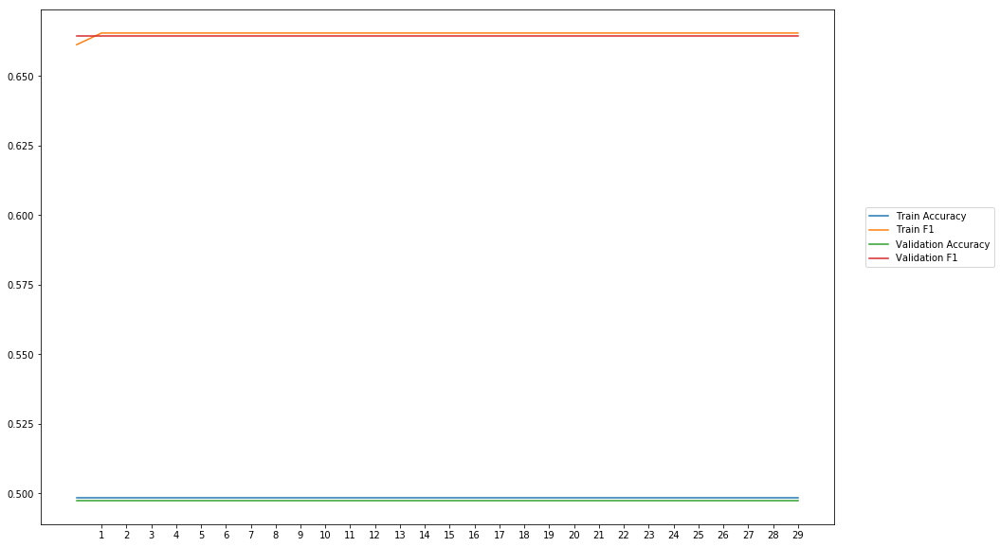

Average Accuracy: 49.74%
Average Precision: 49.74%
Average Recall: 100.00%
Average F1: 66.43%

-----Fold 3--------


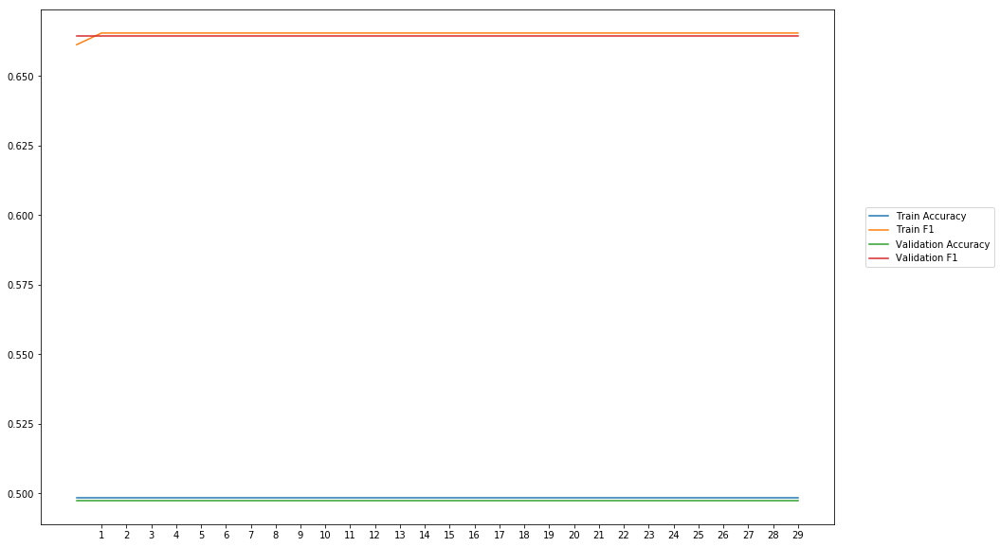

Average Accuracy: 49.74%
Average Precision: 49.74%
Average Recall: 100.00%
Average F1: 66.43%

-----Fold 4--------


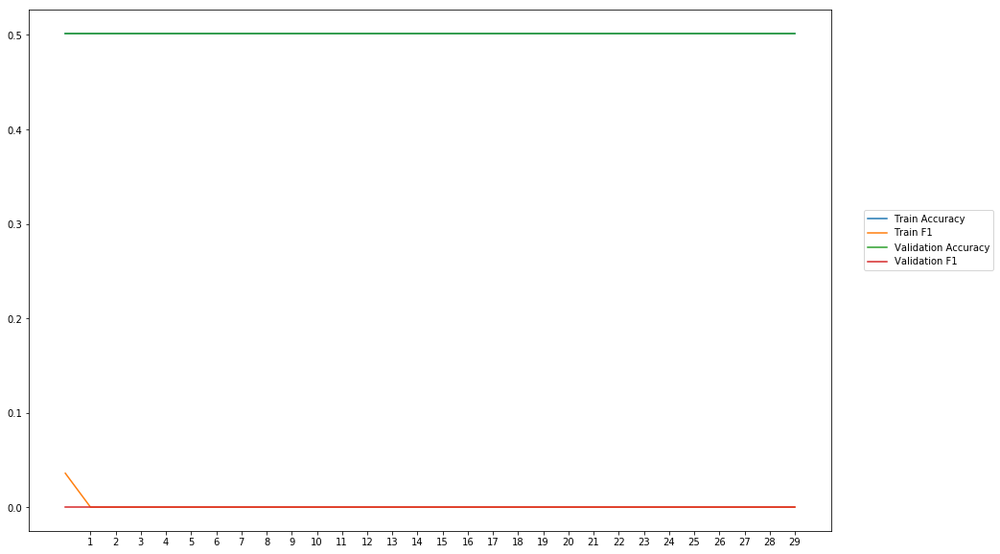

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 5--------


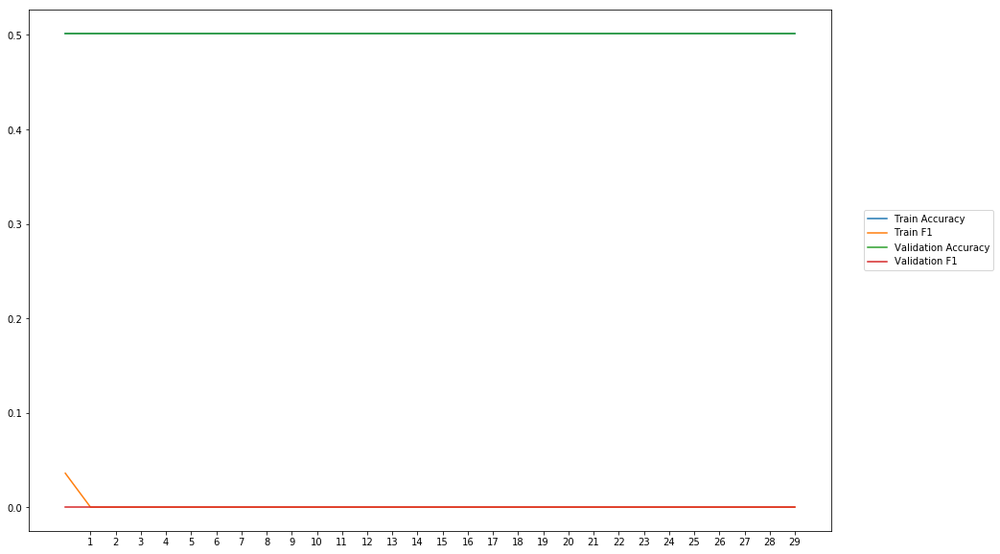

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 6--------


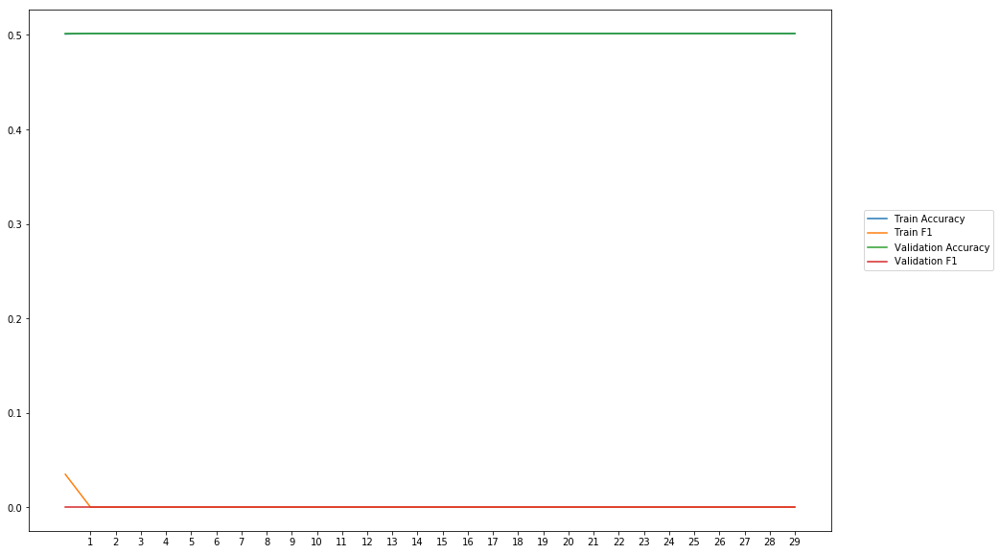

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 7--------


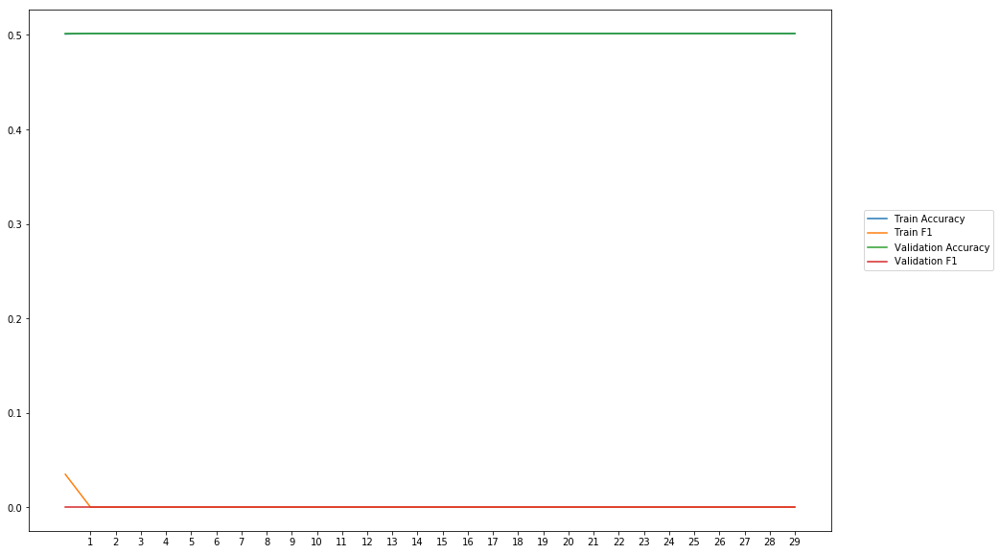

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 8--------


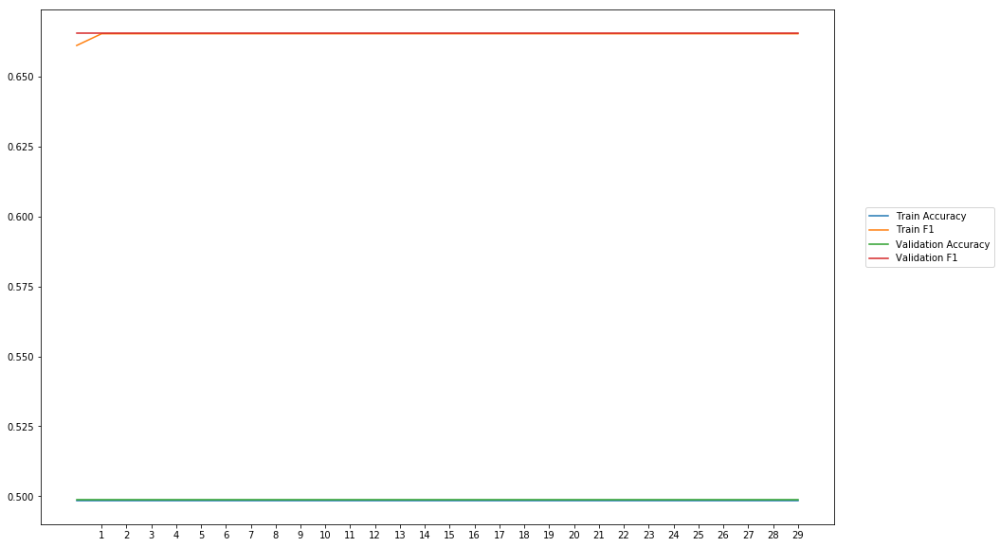

Average Accuracy: 49.87%
Average Precision: 49.87%
Average Recall: 100.00%
Average F1: 66.55%

-----Fold 9--------


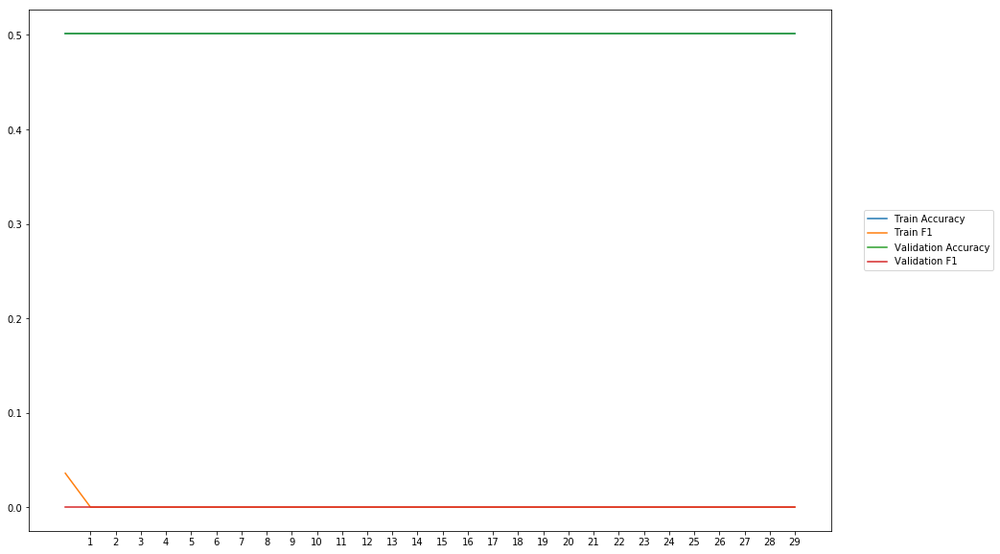

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 10--------


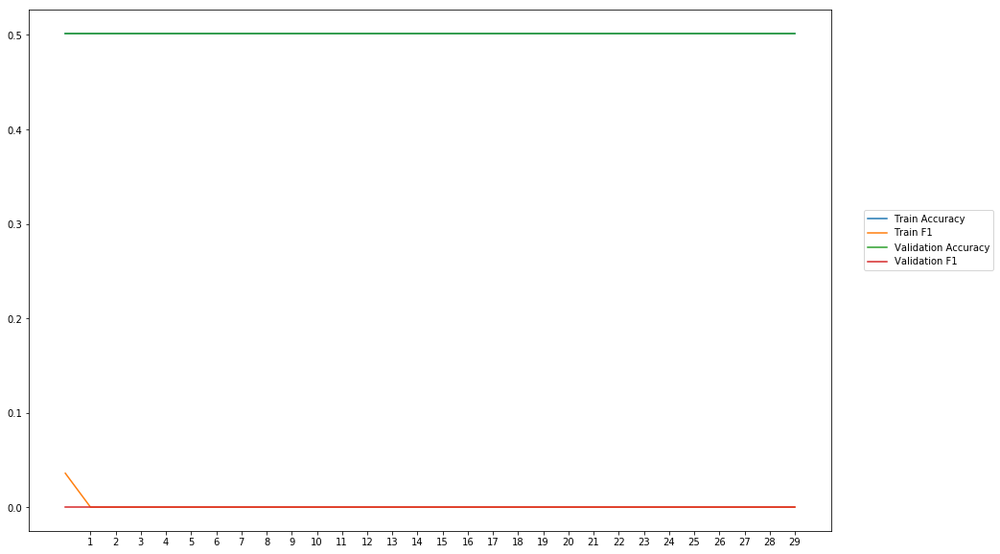

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-------Overallresults-------


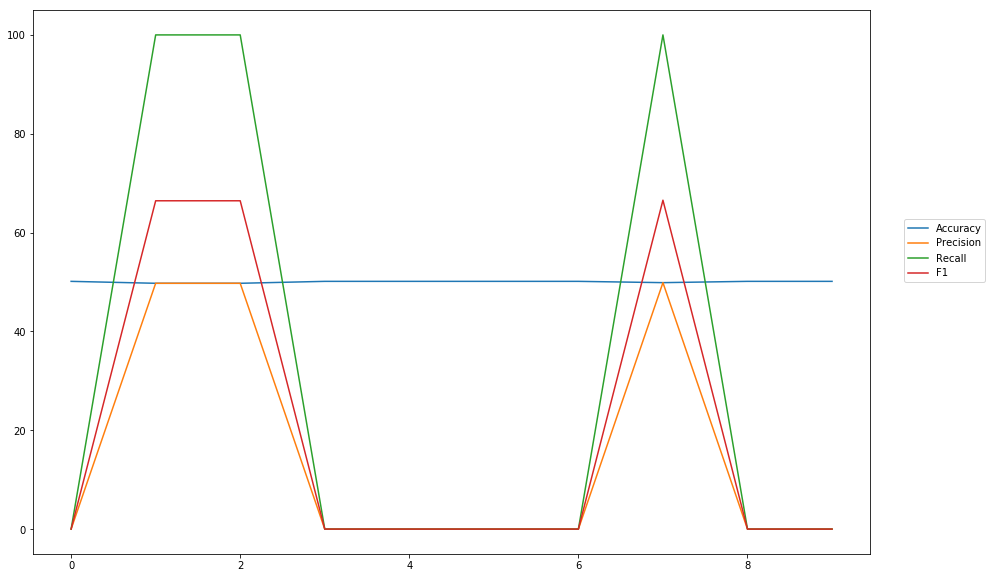

Accuracy: Mean = 50.03% (+/- 0.16%), Max = 50.13%, Min =  49.74%
Precision: Mean = 14.93% (+/- 22.81%), Max = 49.87%, Min =  0.00%
Recall: Mean = 30.00% (+/- 45.83%), Max = 100.00%, Min =  0.00%
F1: Mean = 19.94% (+/- 30.46%), Max = 66.55%, Min =  0.00%


In [10]:
cross_val(model, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'hidden_sigmoid')

In [11]:
wv_layer_2 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_2 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_2 = wv_layer_2(comment_input_2)

#First Dense Layer
x_2 = Dense(600, activation='hard_sigmoid')(embedded_sequences_2)

x_2 = Flatten()(x_2)

#Output (Dense) Layer
preds_2 = Dense(2, activation='softmax')(x_2)

# build the model
model_2 = Model(inputs=[comment_input_2], outputs=preds_2)


-----Fold 1--------


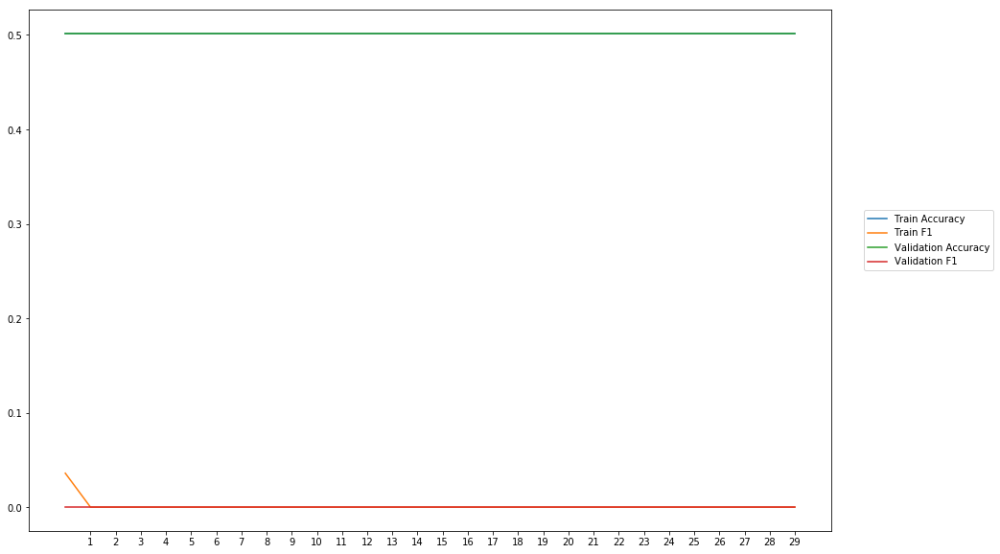

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 2--------


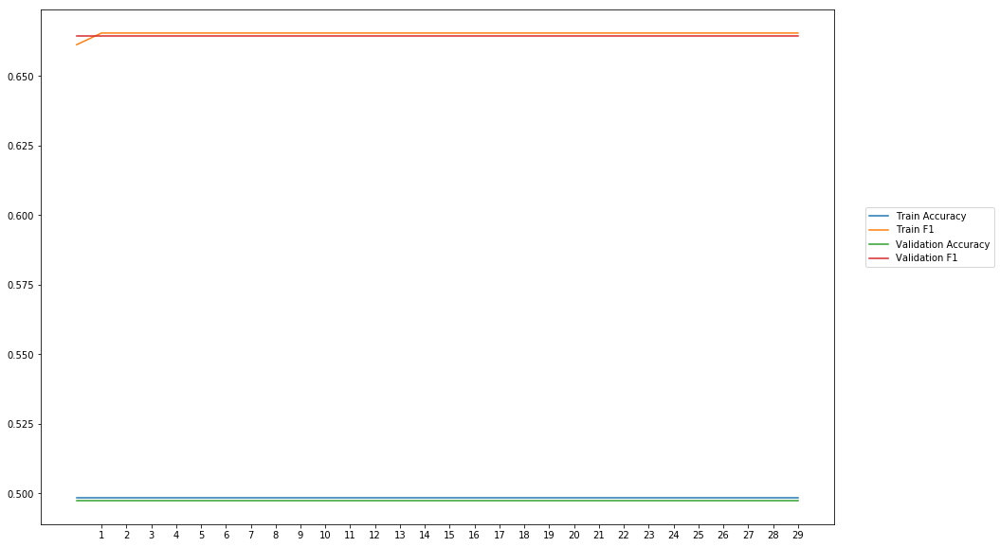

Average Accuracy: 49.74%
Average Precision: 49.74%
Average Recall: 100.00%
Average F1: 66.43%

-----Fold 3--------


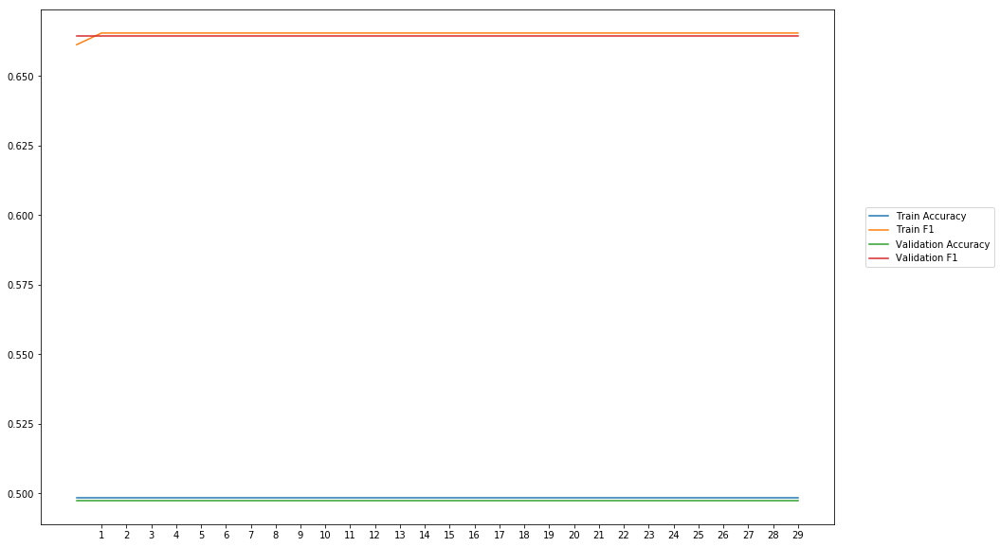

Average Accuracy: 49.74%
Average Precision: 49.74%
Average Recall: 100.00%
Average F1: 66.43%

-----Fold 4--------


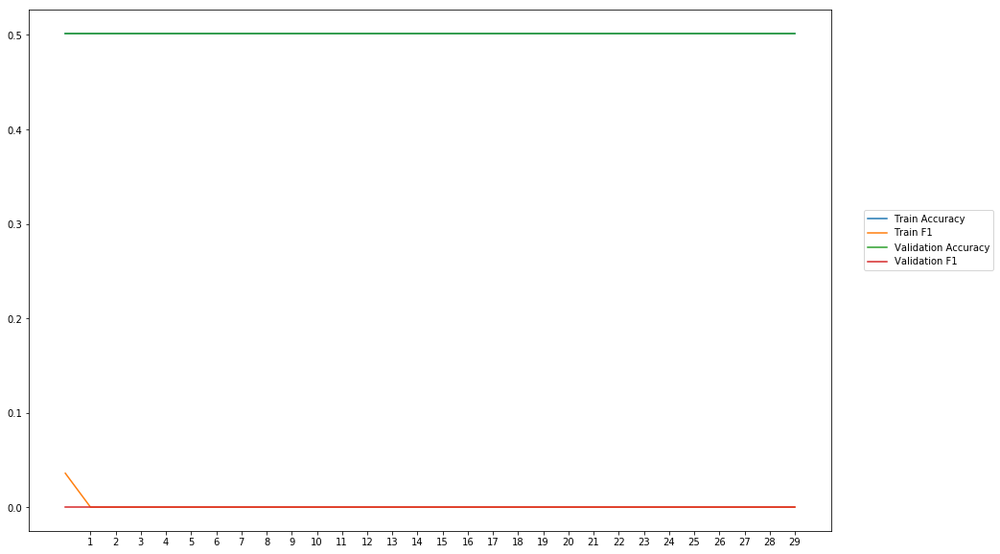

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 5--------


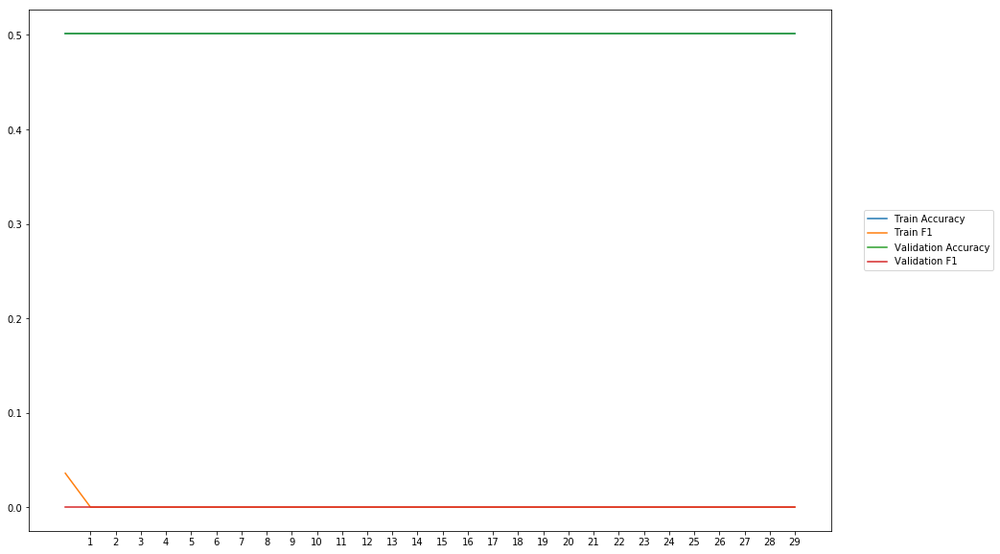

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 6--------


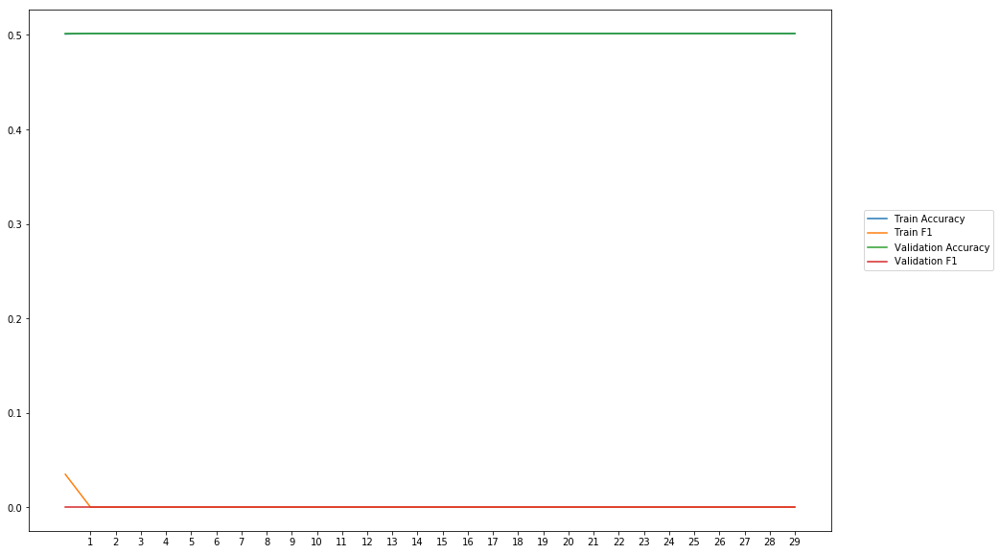

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 7--------


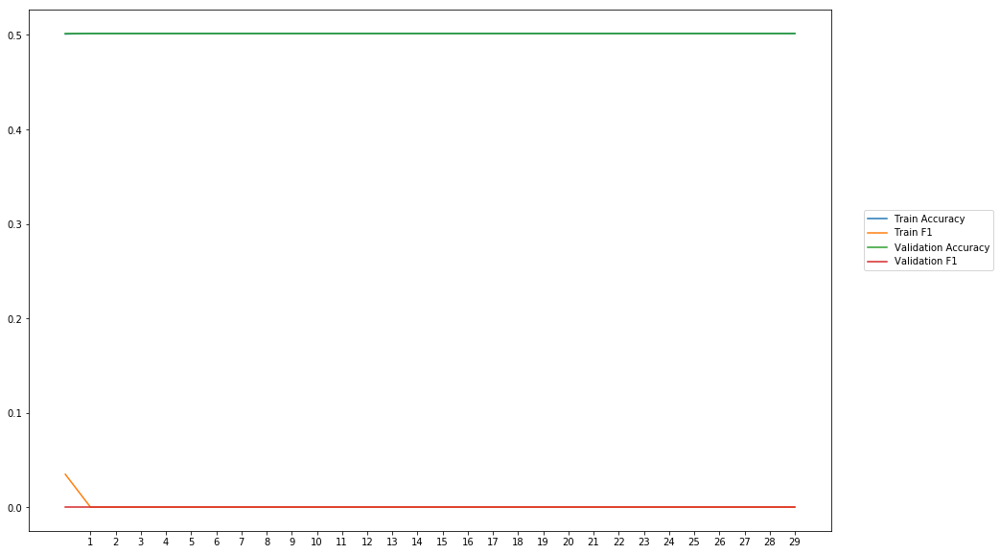

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 8--------


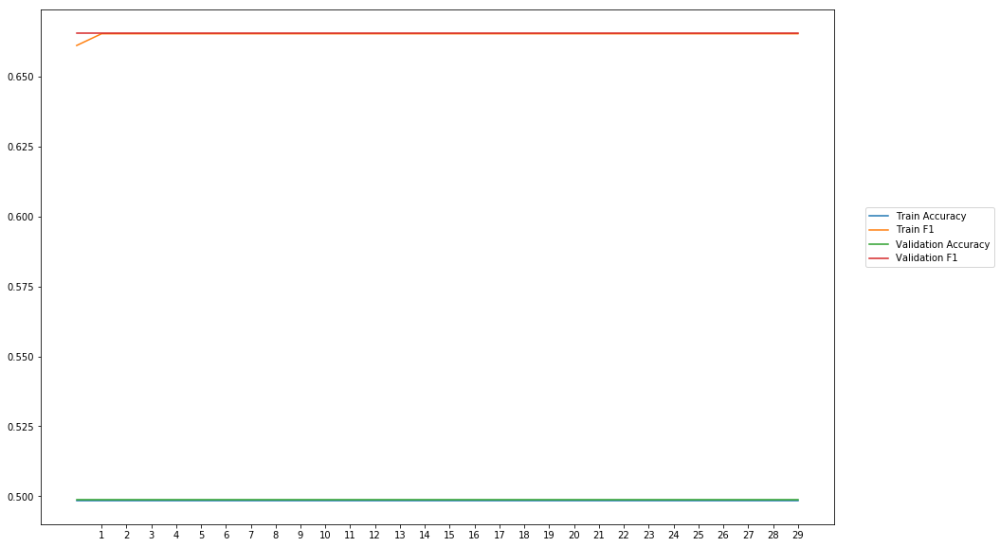

Average Accuracy: 49.87%
Average Precision: 49.87%
Average Recall: 100.00%
Average F1: 66.55%

-----Fold 9--------


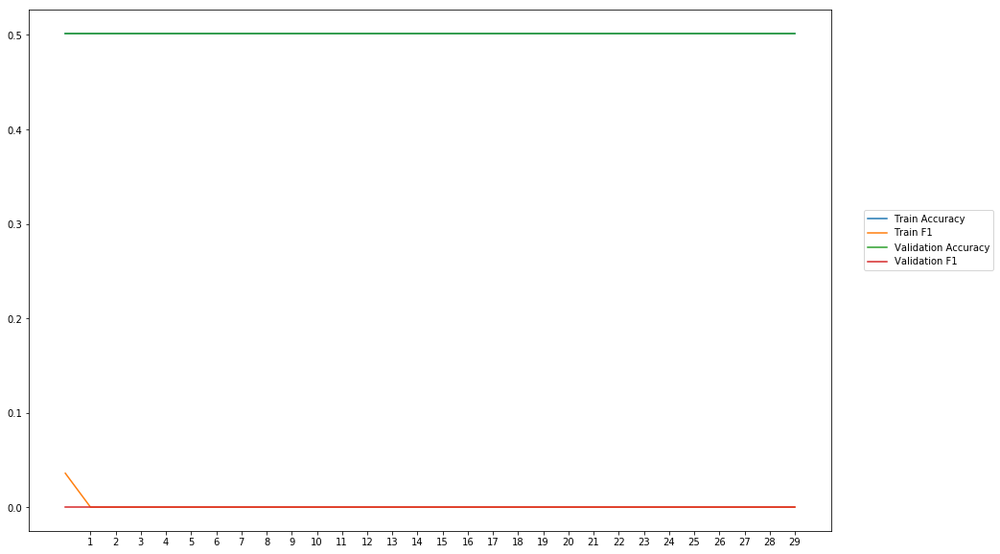

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 10--------


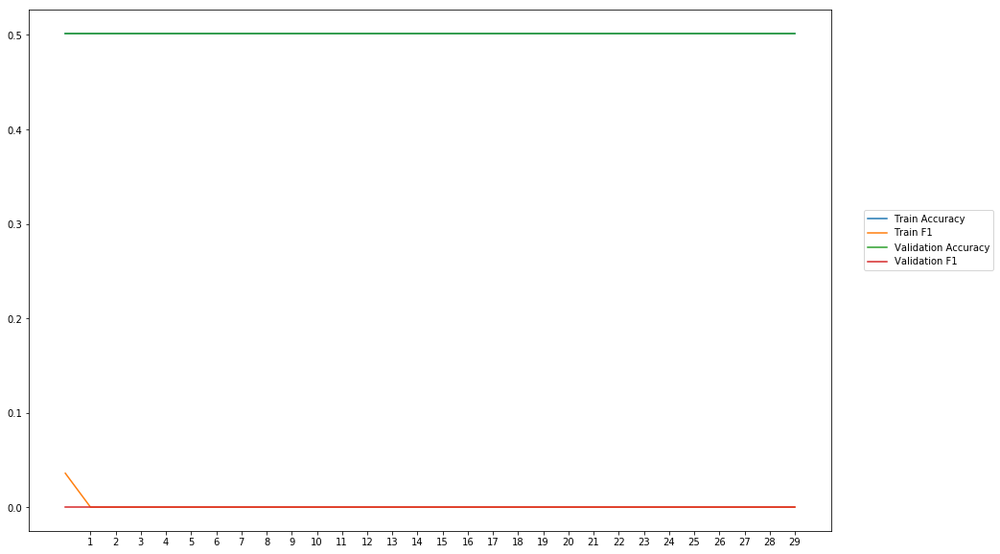

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-------Overallresults-------


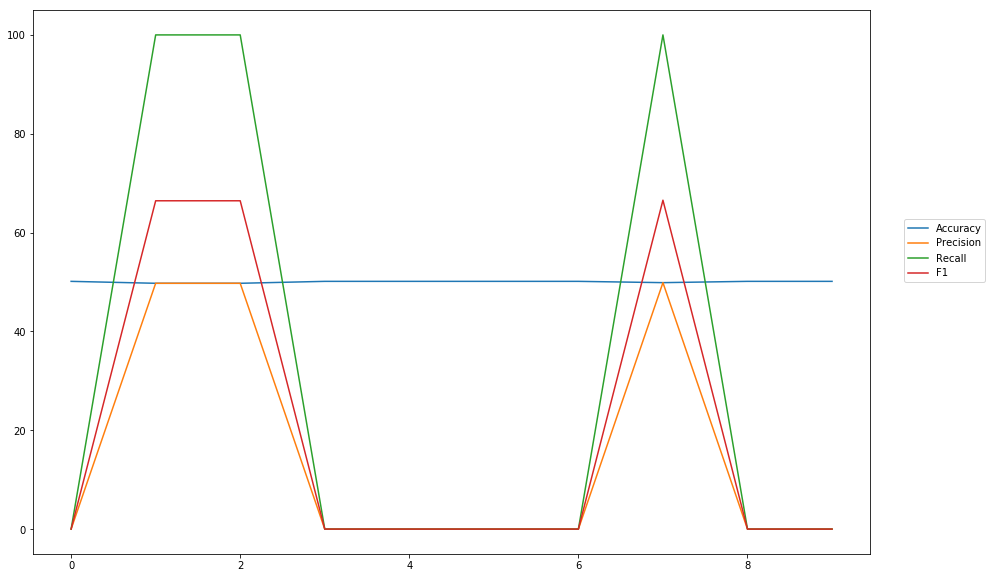

Accuracy: Mean = 50.03% (+/- 0.16%), Max = 50.13%, Min =  49.74%
Precision: Mean = 14.93% (+/- 22.81%), Max = 49.87%, Min =  0.00%
Recall: Mean = 30.00% (+/- 45.83%), Max = 100.00%, Min =  0.00%
F1: Mean = 19.94% (+/- 30.46%), Max = 66.55%, Min =  0.00%


In [12]:
cross_val(model_2, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'hidden_hard_sigmoid')

In [20]:
wv_layer_3 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_3 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_3 = wv_layer_3(comment_input_3)

#First Dense Layer
x_3 = Dense(600, activation='tanh')(embedded_sequences_3)

x_3 = Flatten()(x_3)

#Output (Dense) Layer
preds_3 = Dense(2, activation='softmax')(x_3)

# build the model
model_3 = Model(inputs=[comment_input_3], outputs=preds_3)


-----Fold 1--------


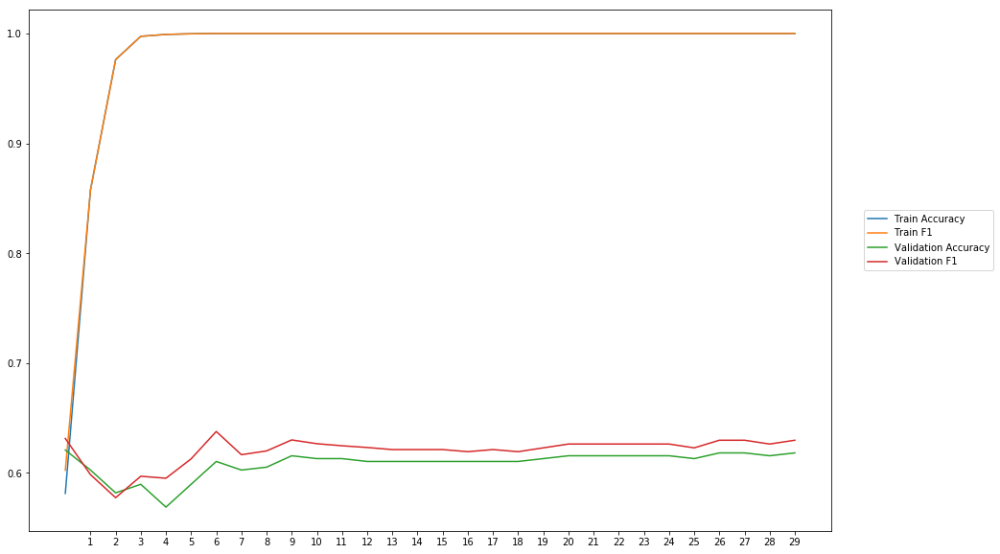

Average Accuracy: 60.87%
Average Precision: 60.10%
Average Recall: 64.10%
Average F1: 62.02%

-----Fold 2--------


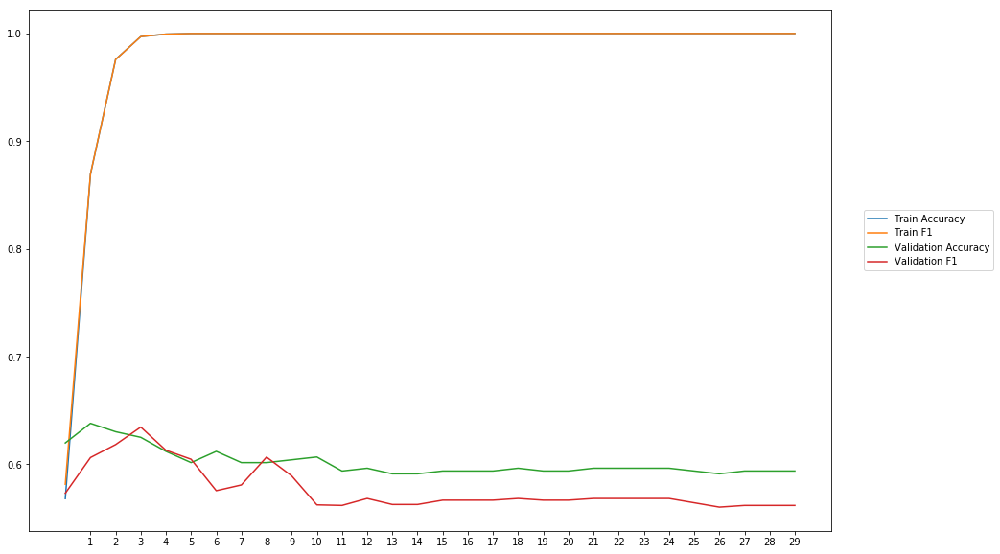

Average Accuracy: 60.14%
Average Precision: 61.12%
Average Recall: 54.73%
Average F1: 57.68%

-----Fold 3--------


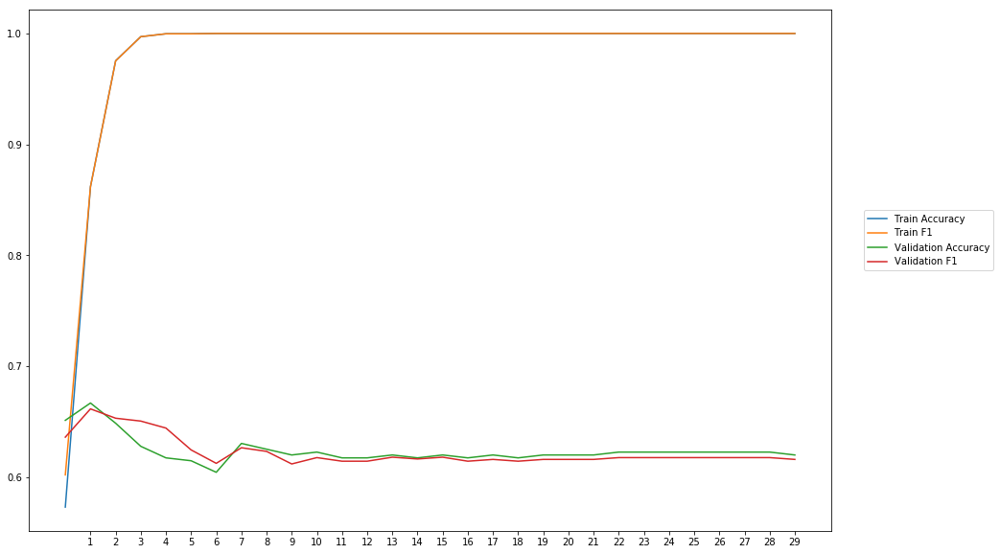

Average Accuracy: 62.36%
Average Precision: 62.15%
Average Recall: 62.37%
Average F1: 62.23%

-----Fold 4--------


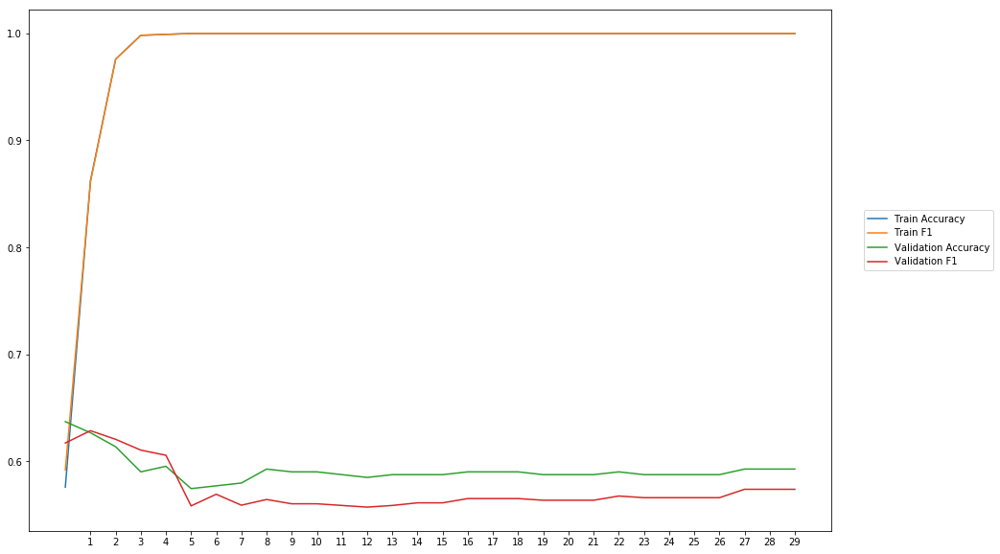

Average Accuracy: 59.17%
Average Precision: 59.88%
Average Recall: 55.03%
Average F1: 57.29%

-----Fold 5--------


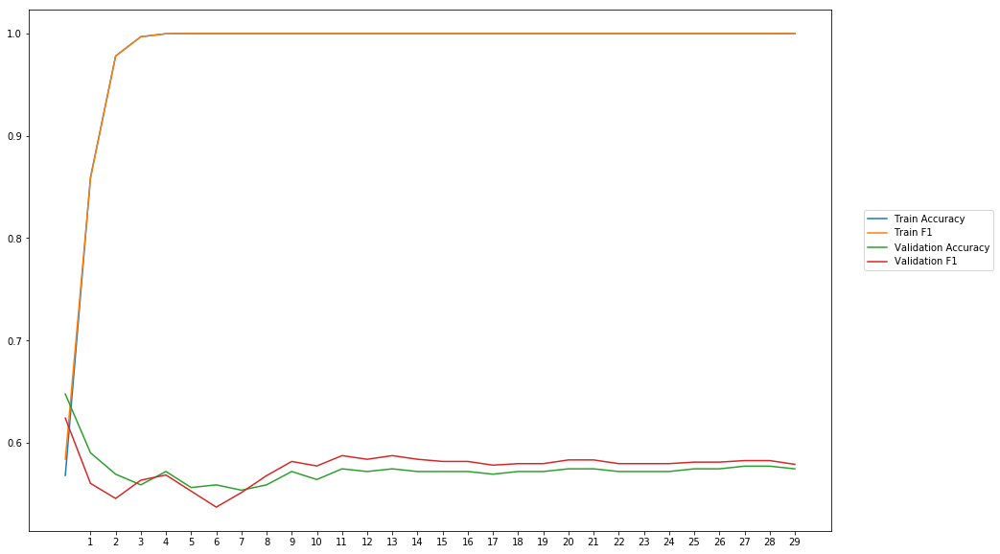

Average Accuracy: 57.30%
Average Precision: 57.11%
Average Recall: 58.20%
Average F1: 57.61%

-----Fold 6--------


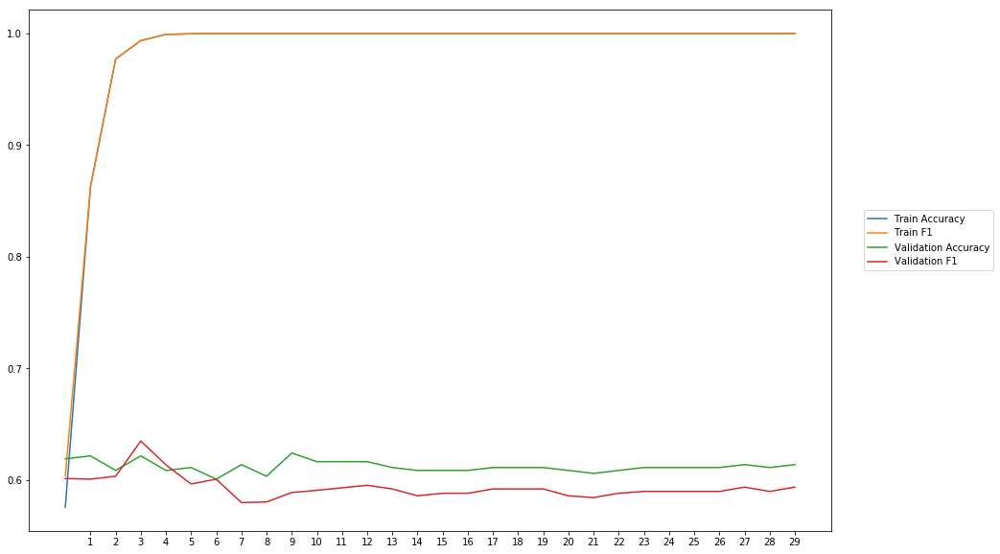

Average Accuracy: 61.17%
Average Precision: 62.14%
Average Recall: 56.82%
Average F1: 59.32%

-----Fold 7--------


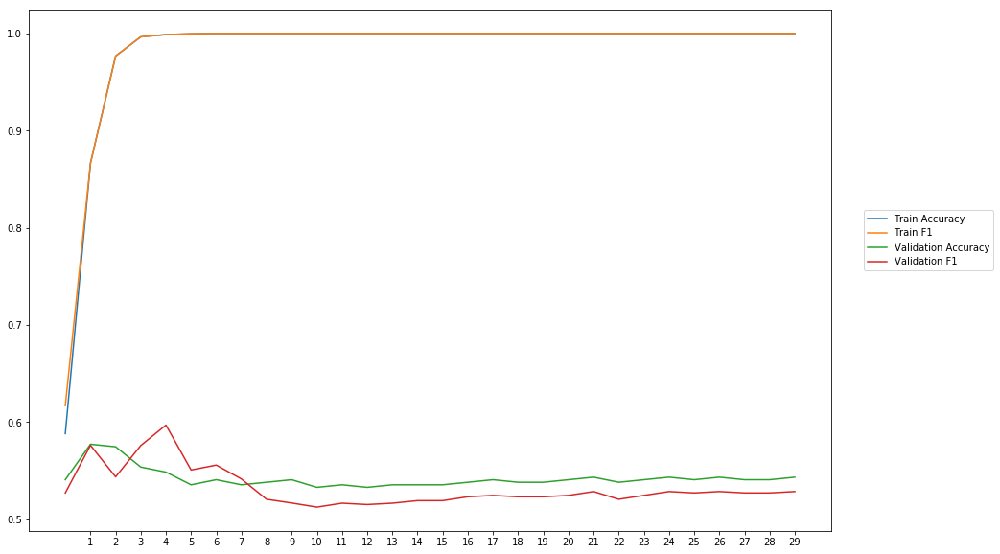

Average Accuracy: 54.19%
Average Precision: 54.23%
Average Recall: 52.32%
Average F1: 53.19%

-----Fold 8--------


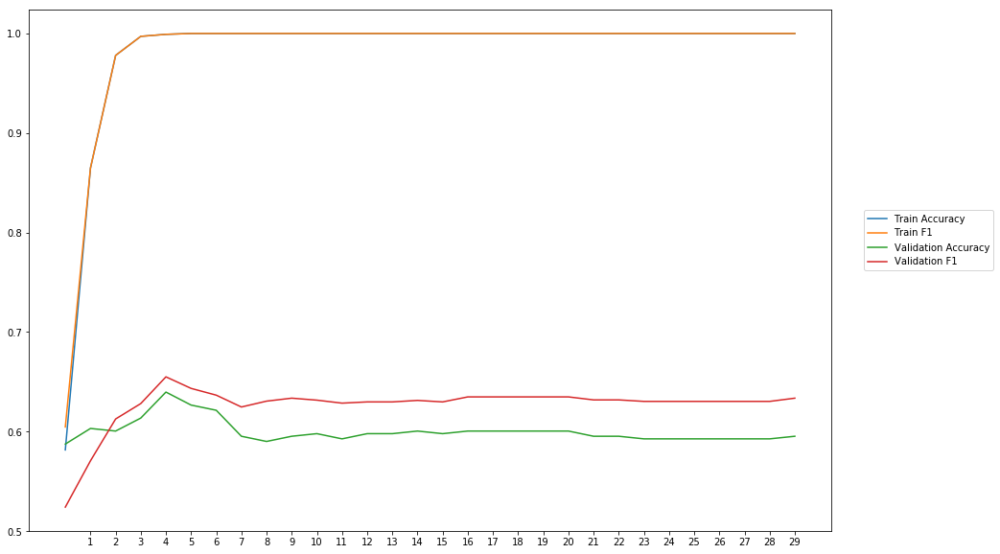

Average Accuracy: 60.01%
Average Precision: 58.70%
Average Recall: 67.52%
Average F1: 62.65%

-----Fold 9--------


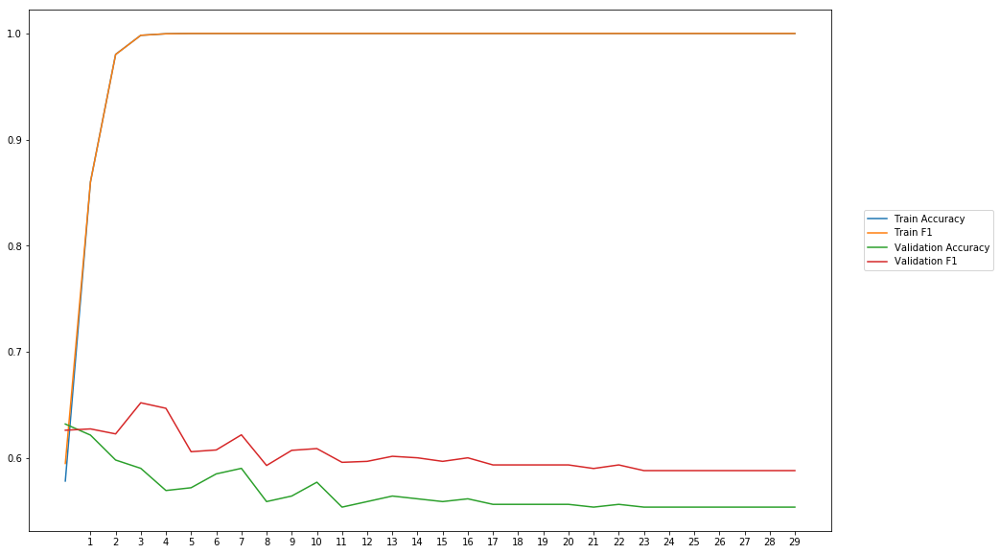

Average Accuracy: 56.74%
Average Precision: 55.68%
Average Recall: 65.83%
Average F1: 60.27%

-----Fold 10--------


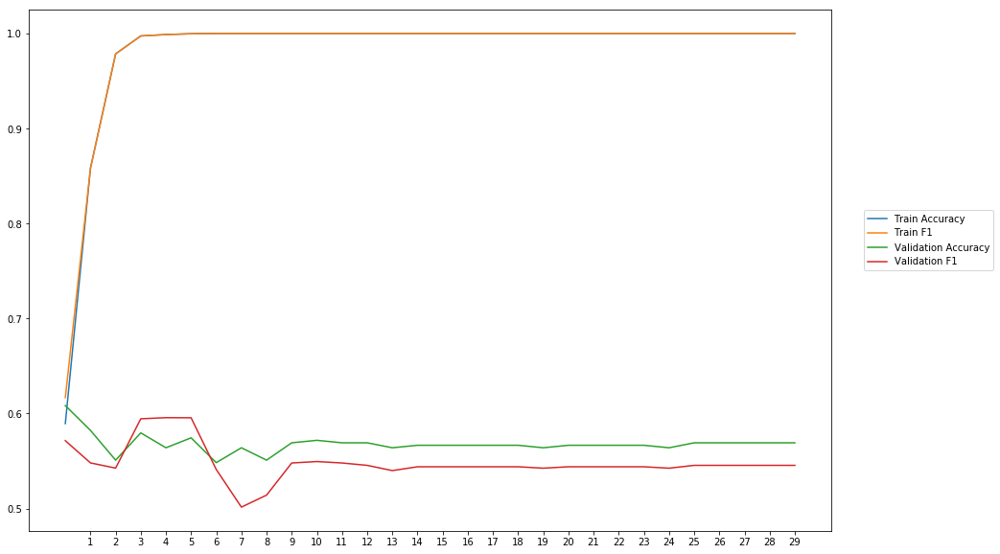

Average Accuracy: 56.80%
Average Precision: 57.32%
Average Recall: 52.67%
Average F1: 54.81%

-------Overallresults-------


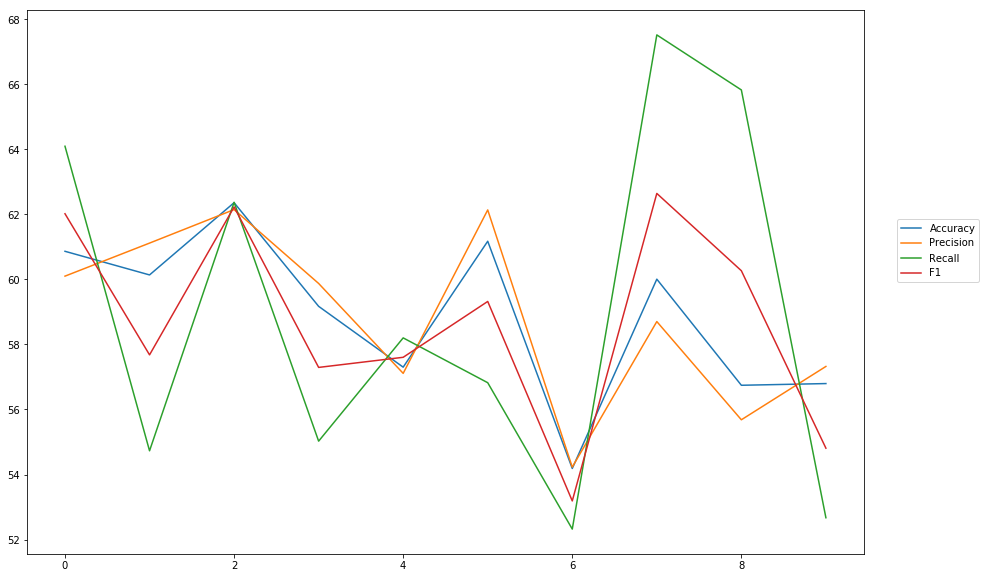

Accuracy: Mean = 58.88% (+/- 2.40%), Max = 62.36%, Min =  54.19%
Precision: Mean = 58.84% (+/- 2.57%), Max = 62.15%, Min =  54.23%
Recall: Mean = 58.96% (+/- 5.30%), Max = 67.52%, Min =  52.32%
F1: Mean = 58.71% (+/- 3.03%), Max = 62.65%, Min =  53.19%


In [14]:
cross_val(model_3, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'hidden_tanh')

In [8]:
wv_layer_4 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_4 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_4 = wv_layer_4(comment_input_4)

#First Dense Layer
x_4 = Dense(600, activation='softmax')(embedded_sequences_4)

x_4 = Flatten()(x_4)

#Output (Dense) Layer
preds_4 = Dense(2, activation='softmax')(x_4)

# build the model
model_4 = Model(inputs=[comment_input_4], outputs=preds_4)

Instructions for updating:
Deprecated in favor of operator or tf.math.divide.

-----Fold 1--------


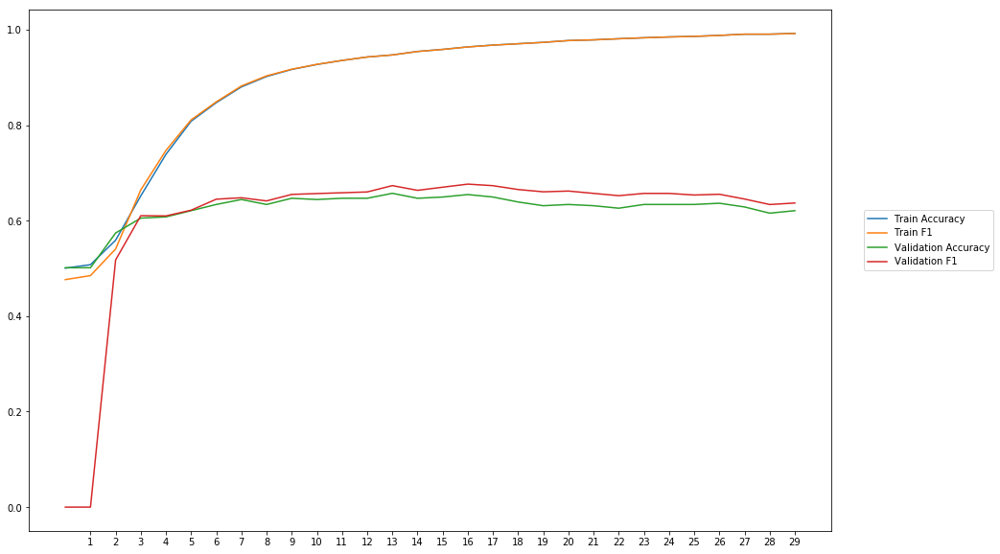

Average Accuracy: 62.42%
Average Precision: 57.96%
Average Recall: 63.19%
Average F1: 60.38%

-----Fold 2--------


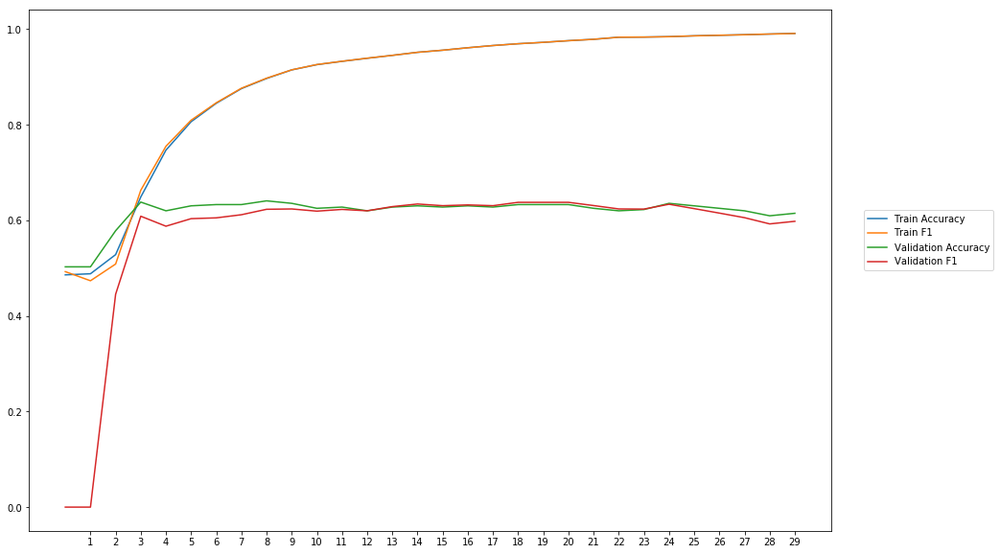

Average Accuracy: 61.76%
Average Precision: 58.83%
Average Recall: 56.18%
Average F1: 57.28%

-----Fold 3--------


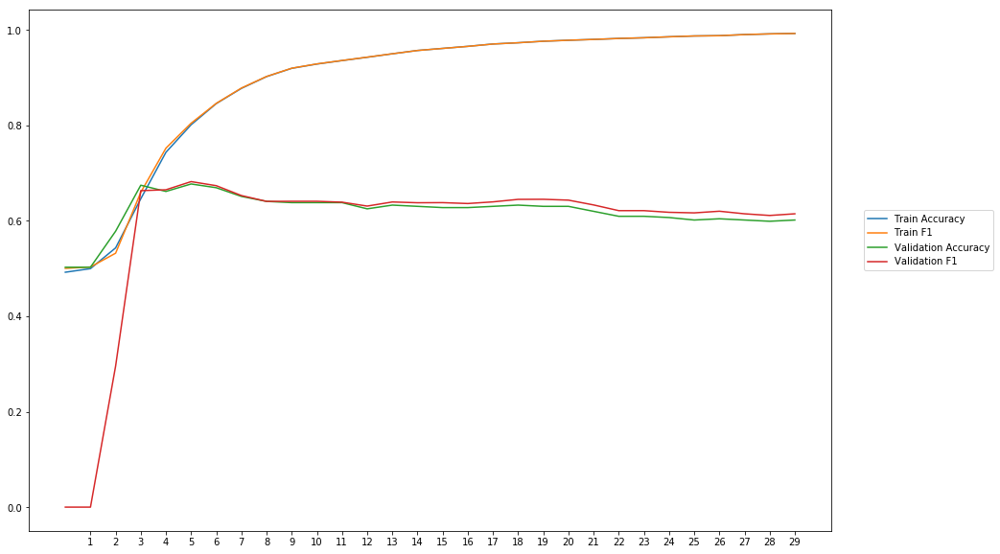

Average Accuracy: 61.97%
Average Precision: 58.89%
Average Recall: 59.53%
Average F1: 58.39%

-----Fold 4--------


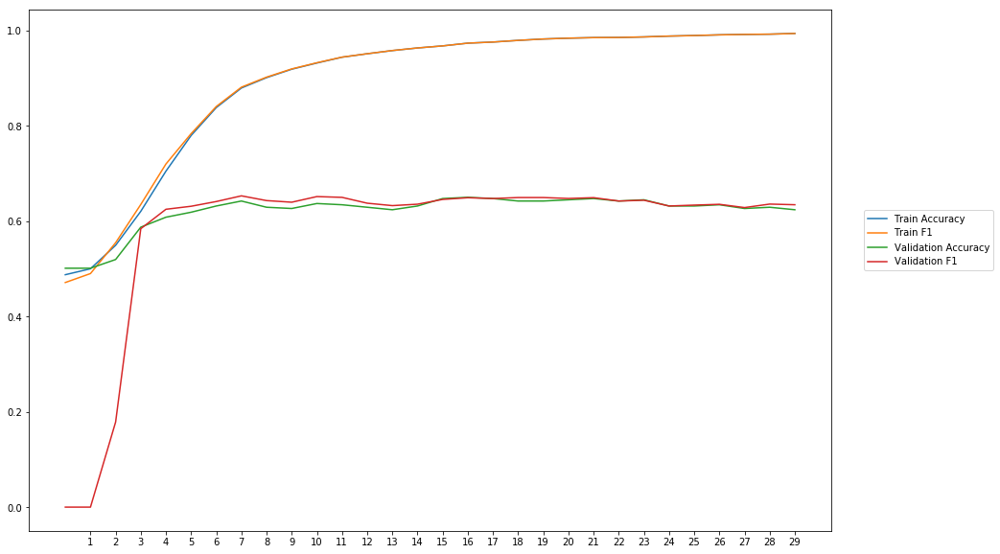

Average Accuracy: 62.04%
Average Precision: 58.47%
Average Recall: 58.97%
Average F1: 58.10%

-----Fold 5--------


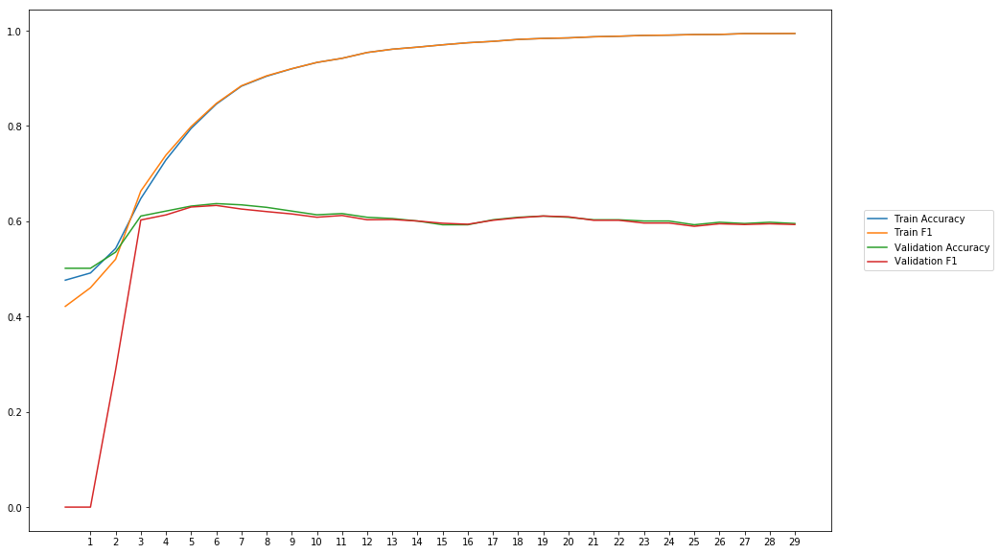

Average Accuracy: 59.90%
Average Precision: 56.84%
Average Recall: 54.83%
Average F1: 55.46%

-----Fold 6--------


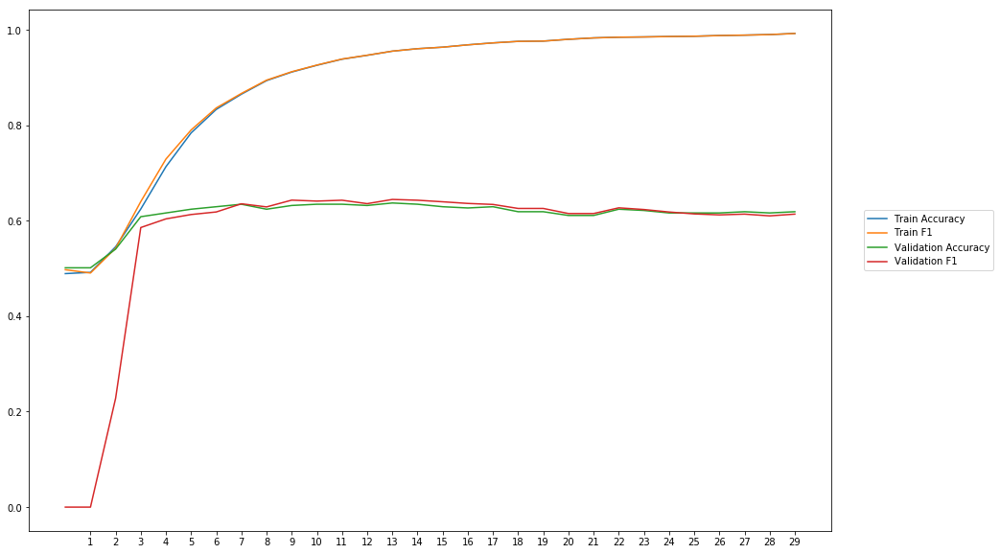

Average Accuracy: 61.25%
Average Precision: 58.24%
Average Recall: 57.00%
Average F1: 56.95%

-----Fold 7--------


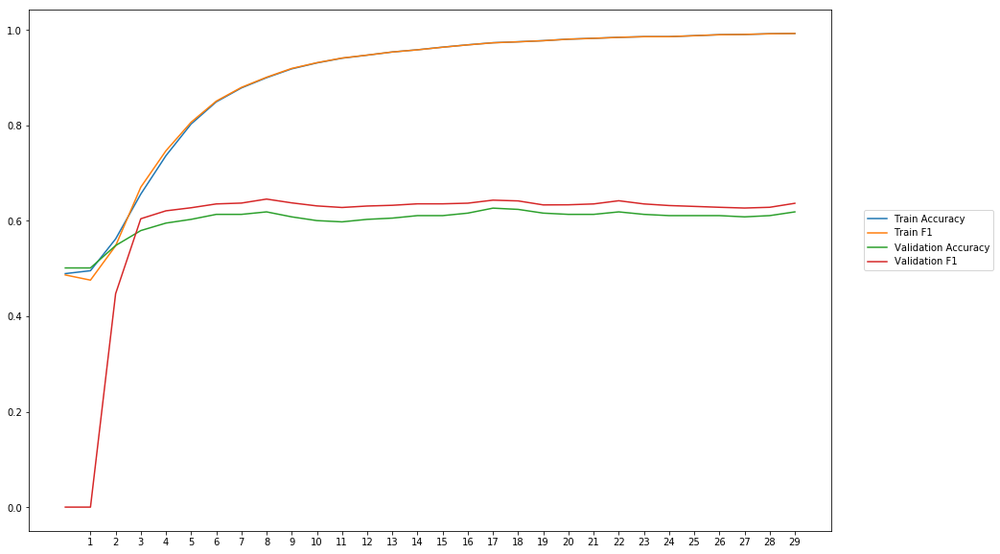

Average Accuracy: 60.09%
Average Precision: 55.62%
Average Recall: 61.87%
Average F1: 58.45%

-----Fold 8--------


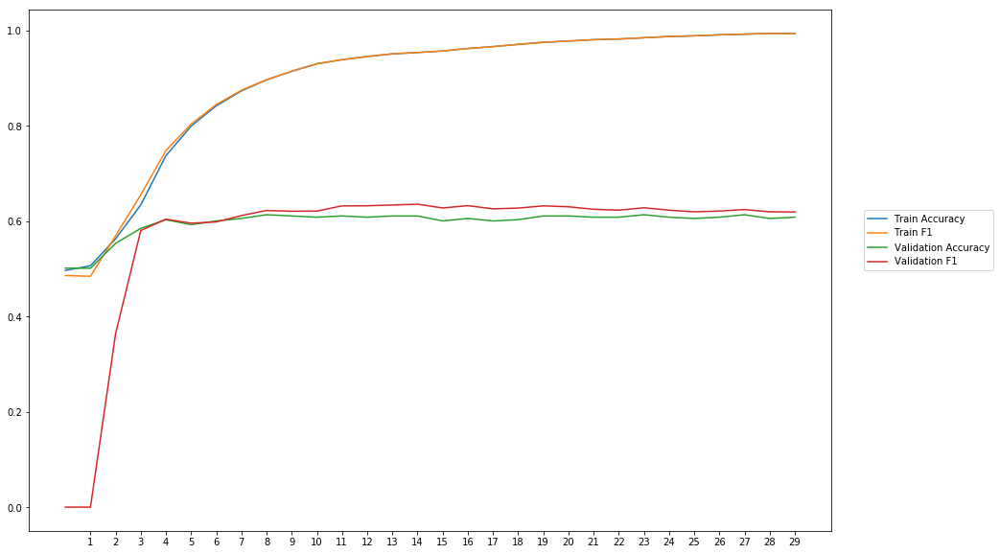

Average Accuracy: 59.77%
Average Precision: 55.85%
Average Recall: 59.13%
Average F1: 57.11%

-----Fold 9--------


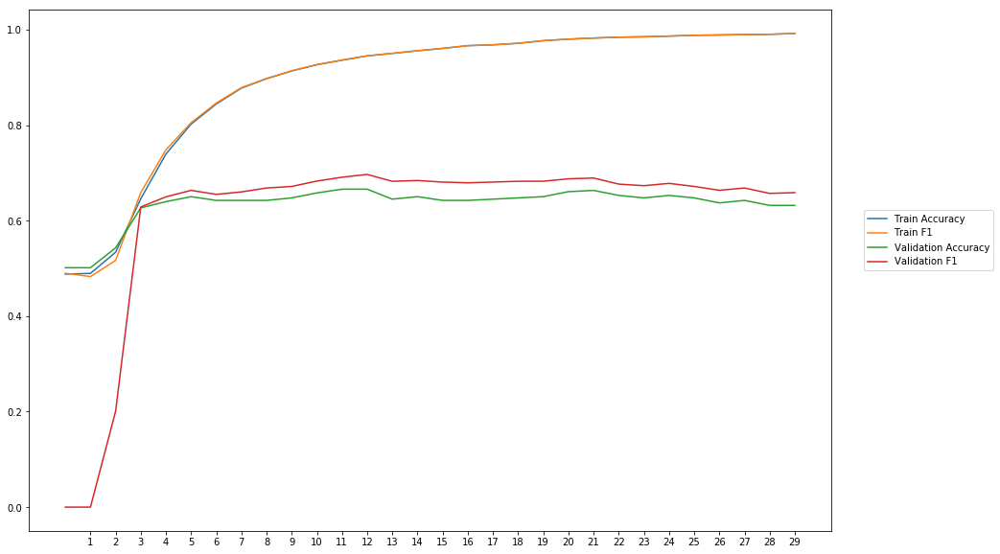

Average Accuracy: 63.39%
Average Precision: 58.93%
Average Recall: 65.92%
Average F1: 61.21%

-----Fold 10--------


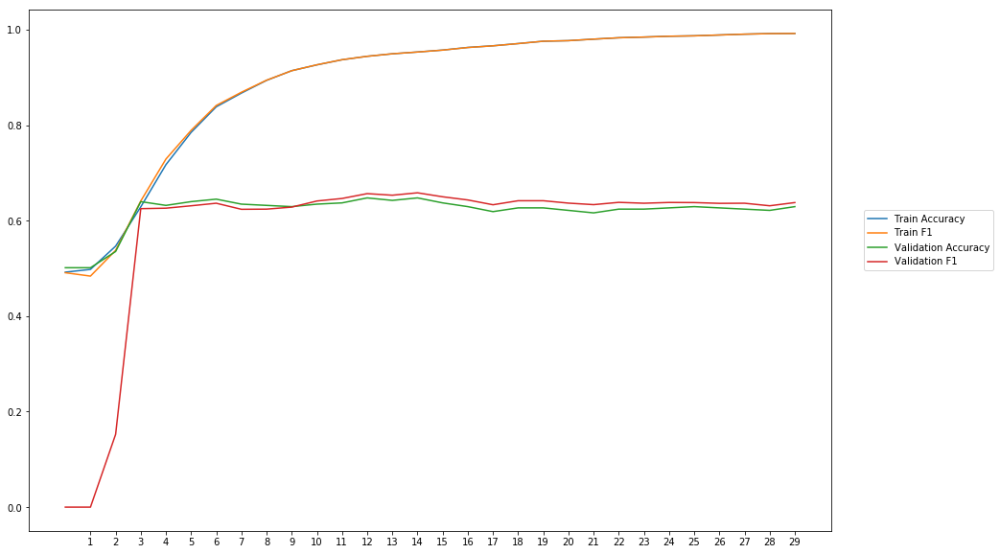

Average Accuracy: 61.93%
Average Precision: 59.09%
Average Recall: 58.92%
Average F1: 57.91%

-------Overallresults-------


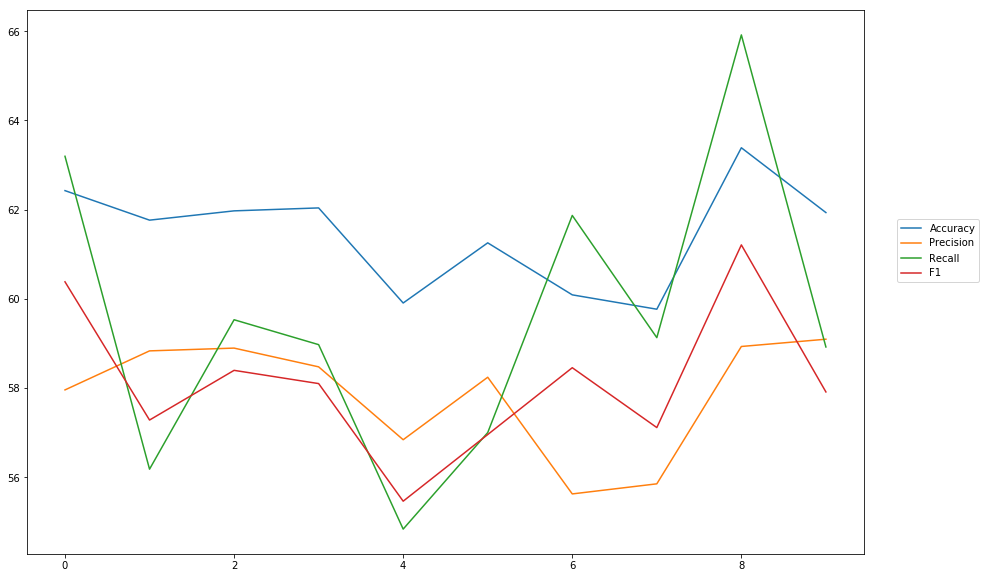

Accuracy: Mean = 61.45% (+/- 1.13%), Max = 63.39%, Min =  59.77%
Precision: Mean = 57.87% (+/- 1.24%), Max = 59.09%, Min =  55.62%
Recall: Mean = 59.55% (+/- 3.17%), Max = 65.92%, Min =  54.83%
F1: Mean = 58.12% (+/- 1.58%), Max = 61.21%, Min =  55.46%


In [16]:
cross_val(model_4, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'hiddem_softmax')

In [17]:
wv_layer_5 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_5 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_5 = wv_layer_5(comment_input_5)

#First Dense Layer
x_5 = Dense(600, activation='elu')(embedded_sequences_5)

x_5 = Flatten()(x_5)

#Output (Dense) Layer
preds_5 = Dense(2, activation='softmax')(x_5)

# build the model
model_5 = Model(inputs=[comment_input_5], outputs=preds_5)


-----Fold 1--------


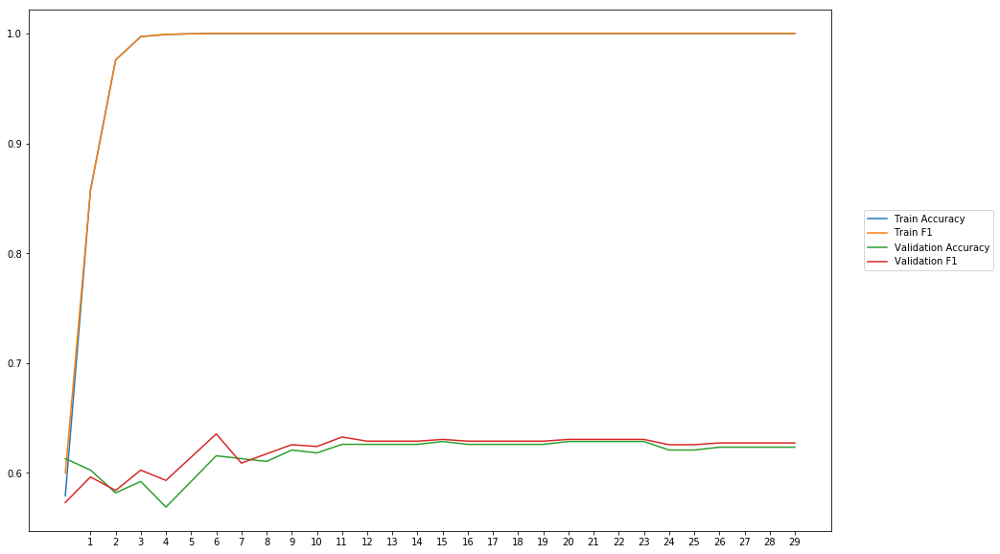

Average Accuracy: 61.71%
Average Precision: 61.38%
Average Recall: 62.86%
Average F1: 62.07%

-----Fold 2--------


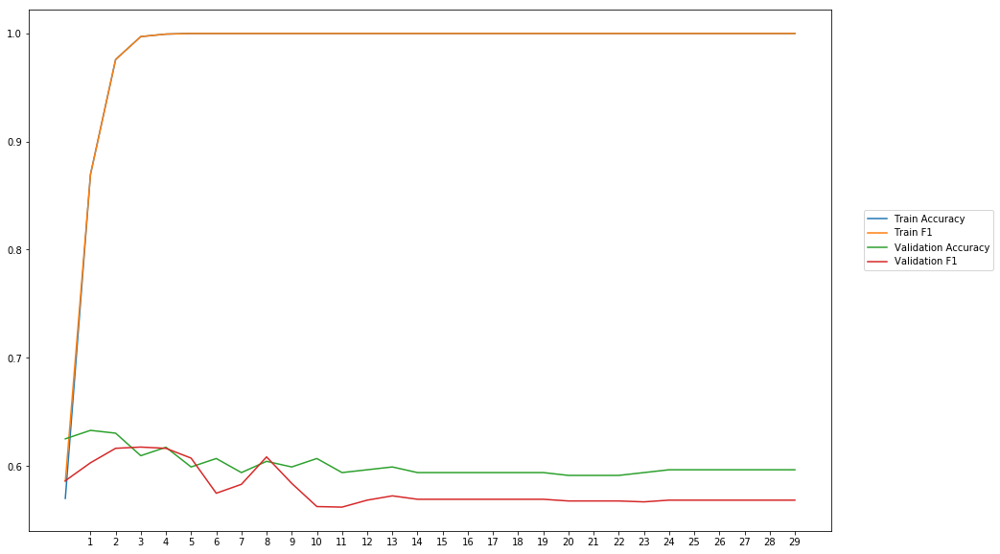

Average Accuracy: 60.07%
Average Precision: 60.92%
Average Recall: 55.17%
Average F1: 57.84%

-----Fold 3--------


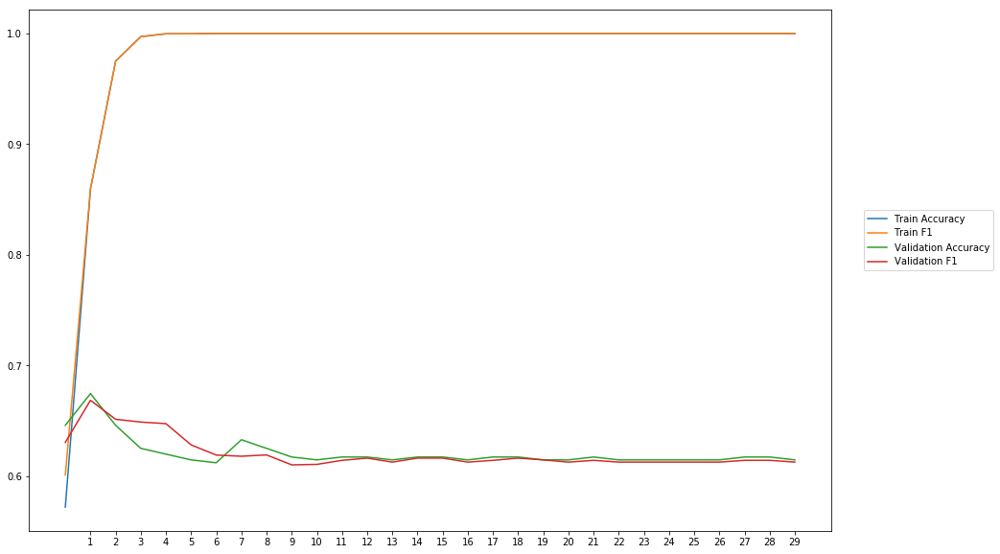

Average Accuracy: 62.09%
Average Precision: 61.83%
Average Recall: 62.34%
Average F1: 62.05%

-----Fold 4--------


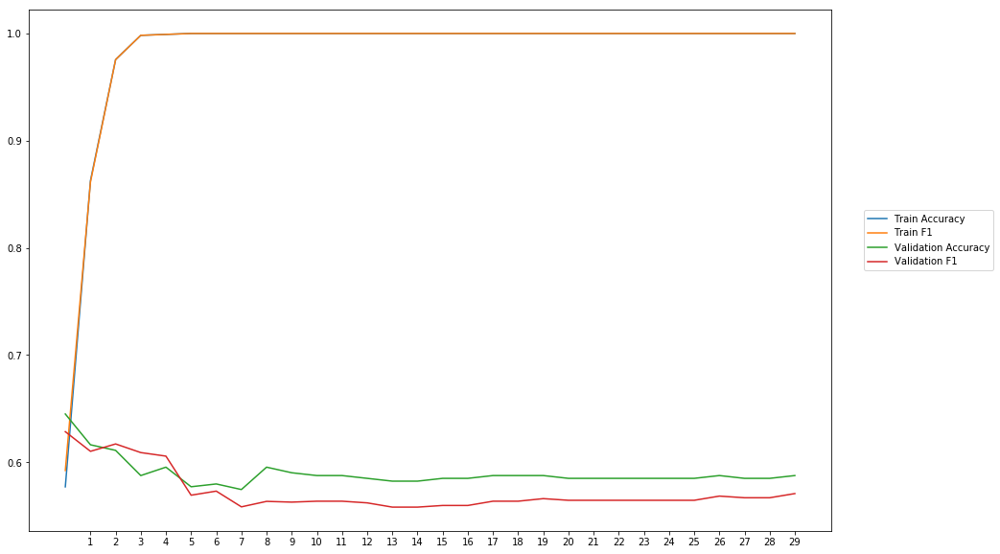

Average Accuracy: 58.94%
Average Precision: 59.54%
Average Recall: 55.20%
Average F1: 57.24%

-----Fold 5--------


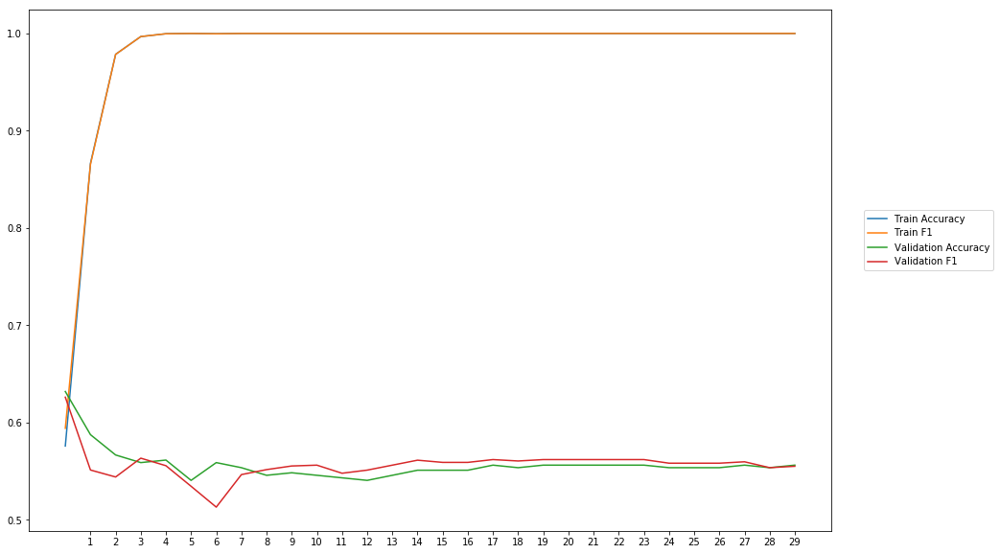

Average Accuracy: 55.66%
Average Precision: 55.56%
Average Recall: 55.90%
Average F1: 55.68%

-----Fold 6--------


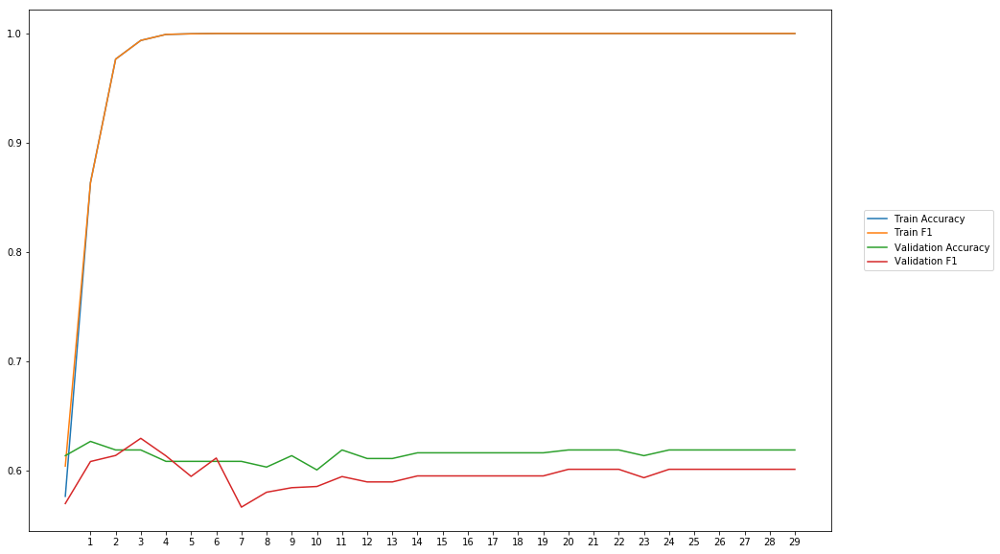

Average Accuracy: 61.50%
Average Precision: 62.48%
Average Recall: 57.21%
Average F1: 59.68%

-----Fold 7--------


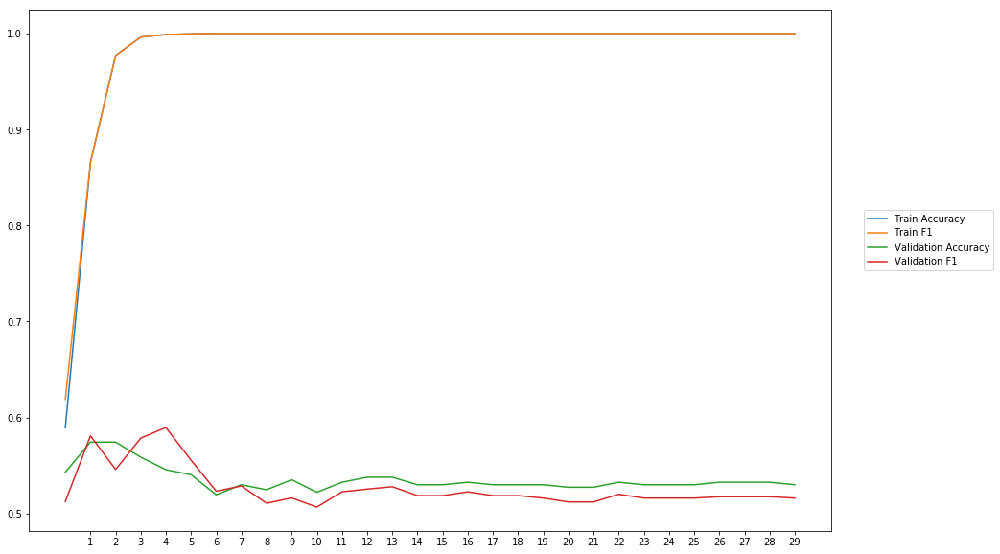

Average Accuracy: 53.55%
Average Precision: 53.53%
Average Recall: 51.94%
Average F1: 52.67%

-----Fold 8--------


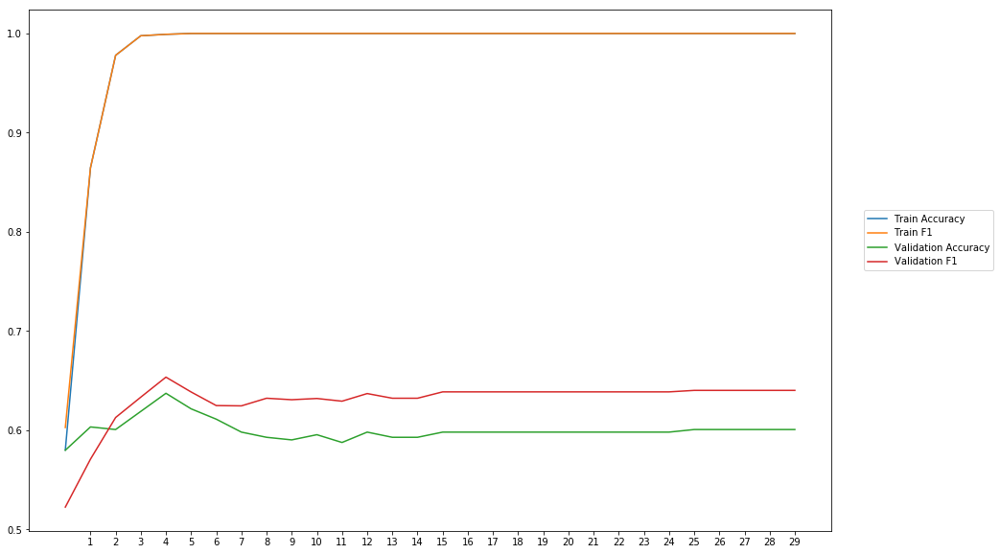

Average Accuracy: 60.00%
Average Precision: 58.54%
Average Recall: 68.50%
Average F1: 62.96%

-----Fold 9--------


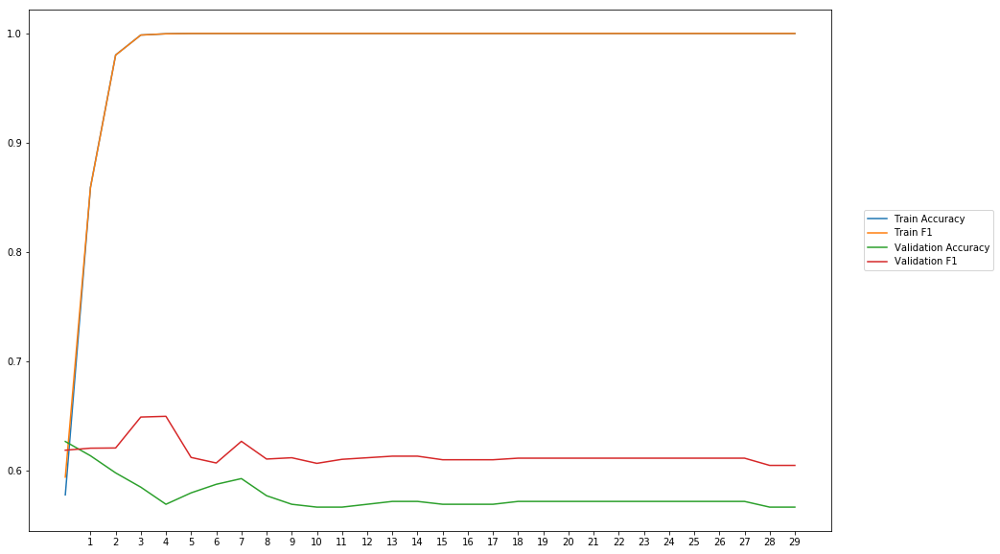

Average Accuracy: 57.68%
Average Precision: 56.38%
Average Recall: 67.70%
Average F1: 61.45%

-----Fold 10--------


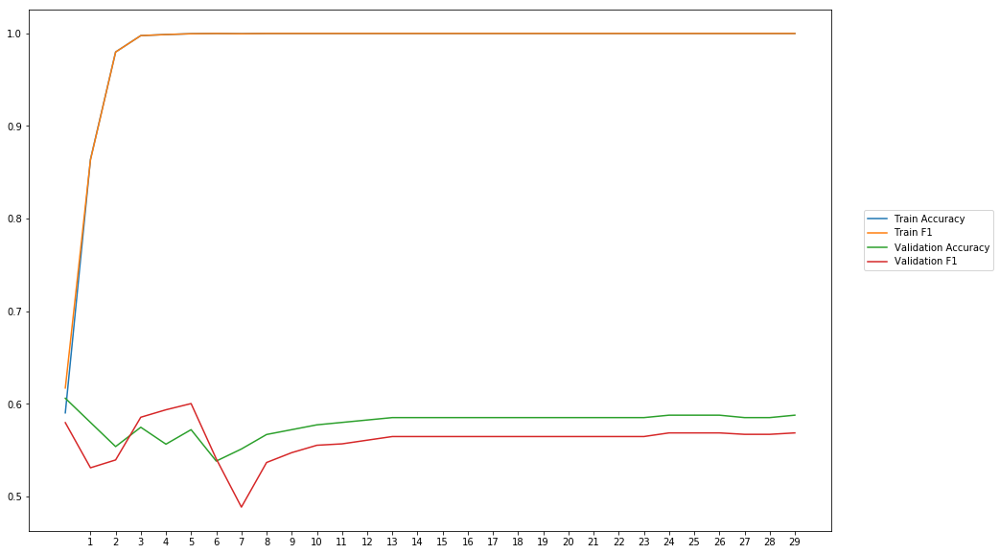

Average Accuracy: 57.87%
Average Precision: 58.46%
Average Recall: 54.08%
Average F1: 56.09%

-------Overallresults-------


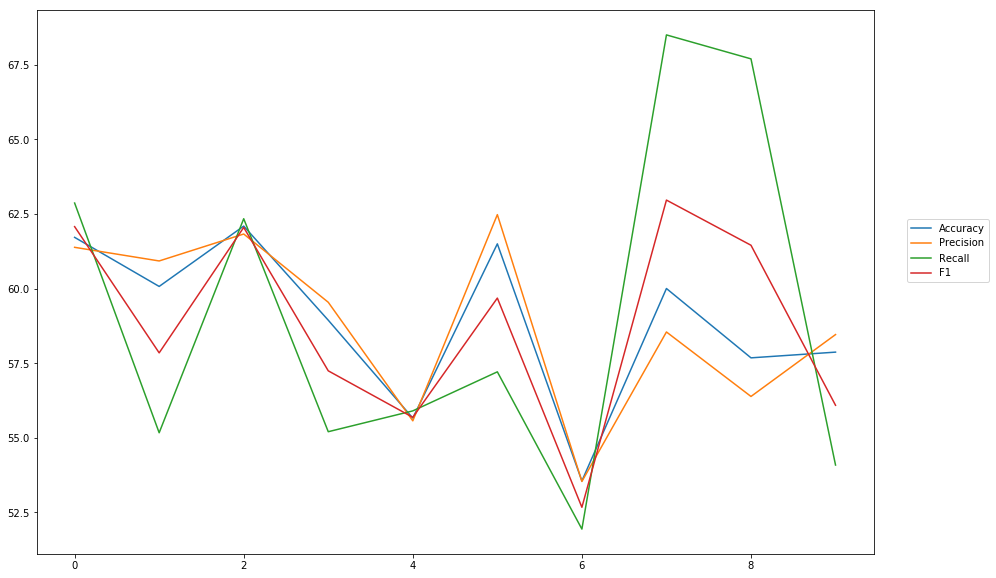

Accuracy: Mean = 58.91% (+/- 2.63%), Max = 62.09%, Min =  53.55%
Precision: Mean = 58.86% (+/- 2.80%), Max = 62.48%, Min =  53.53%
Recall: Mean = 59.09% (+/- 5.55%), Max = 68.50%, Min =  51.94%
F1: Mean = 58.77% (+/- 3.23%), Max = 62.96%, Min =  52.67%


In [18]:
cross_val(model_5, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'hiddem_elu')

In [19]:
wv_layer_6 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_6 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_6 = wv_layer_6(comment_input_6)

#First Dense Layer
x_6 = Dense(600, activation='selu')(embedded_sequences_6)

x_6 = Flatten()(x_6)

#Output (Dense) Layer
preds_6 = Dense(2, activation='softmax')(x_6)

# build the model
model_6 = Model(inputs=[comment_input_6], outputs=preds_6)


-----Fold 1--------


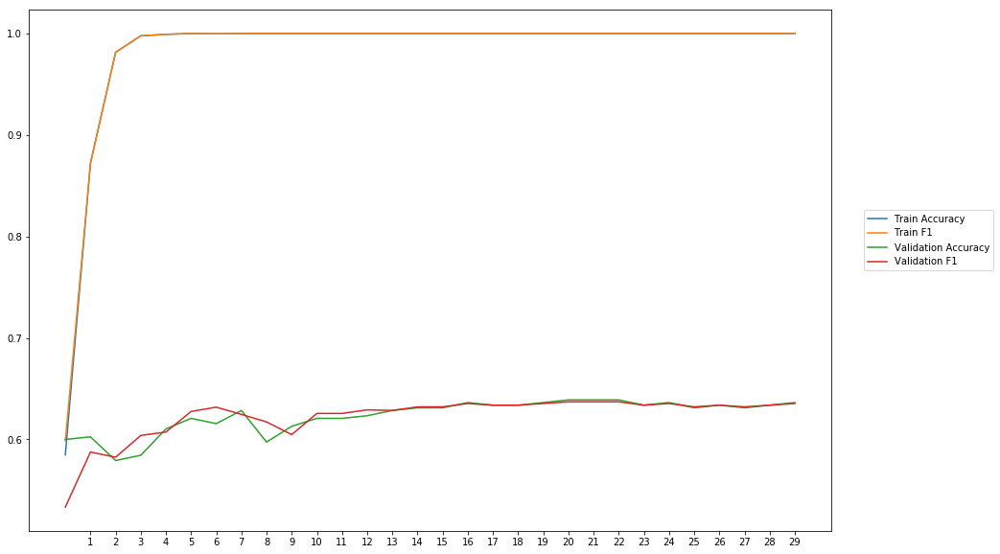

Average Accuracy: 62.34%
Average Precision: 62.24%
Average Recall: 62.43%
Average F1: 62.27%

-----Fold 2--------


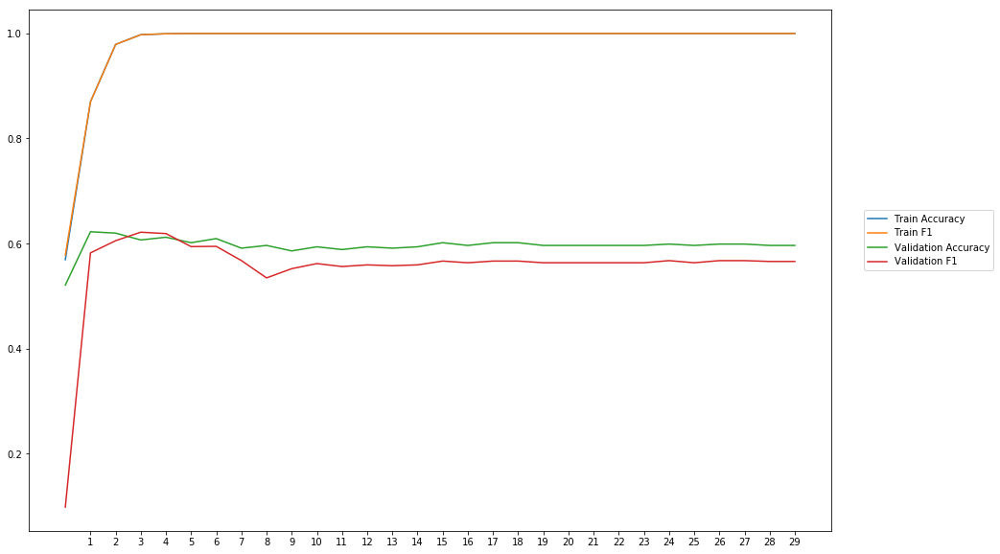

Average Accuracy: 59.65%
Average Precision: 61.60%
Average Recall: 52.02%
Average F1: 55.47%

-----Fold 3--------


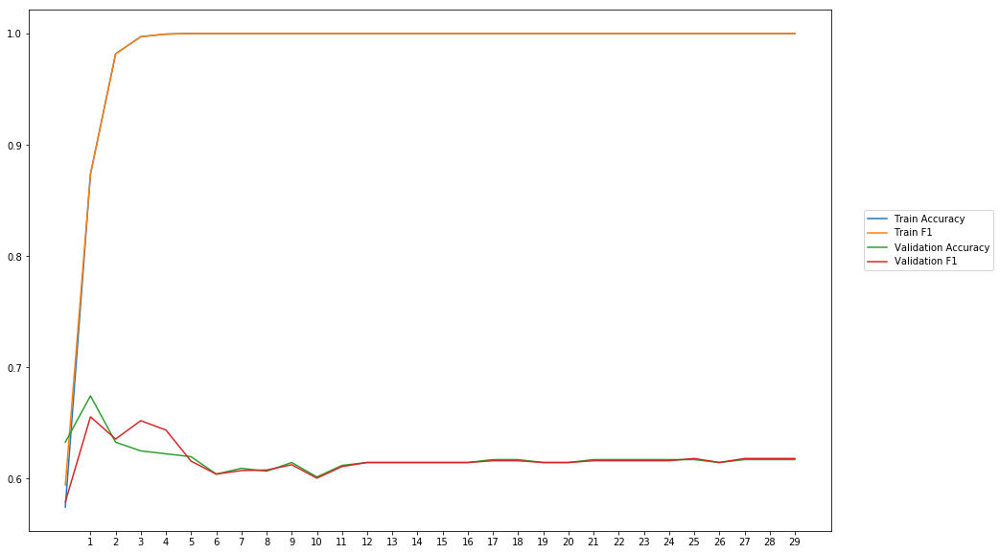

Average Accuracy: 61.81%
Average Precision: 61.63%
Average Recall: 61.92%
Average F1: 61.71%

-----Fold 4--------


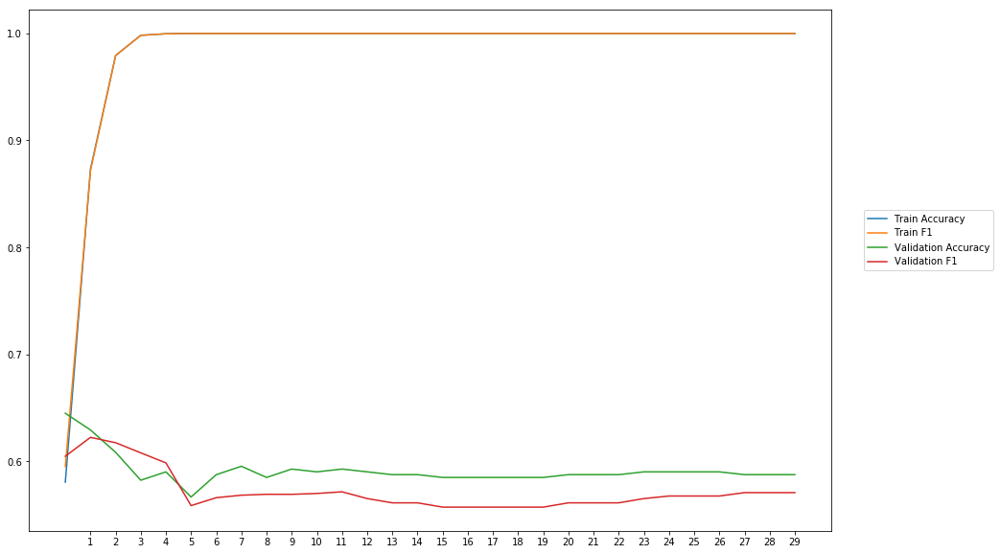

Average Accuracy: 59.13%
Average Precision: 59.91%
Average Recall: 54.83%
Average F1: 57.19%

-----Fold 5--------


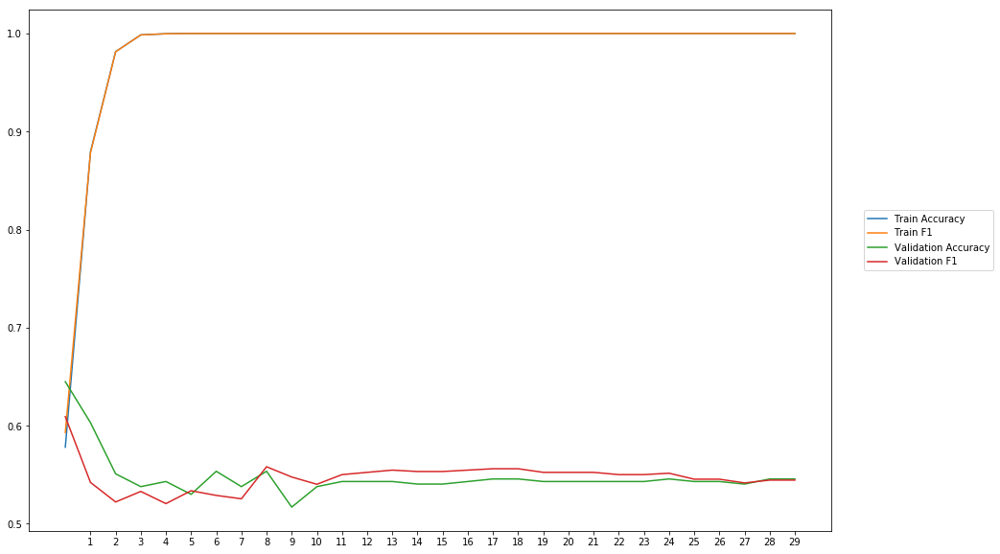

Average Accuracy: 54.78%
Average Precision: 54.84%
Average Recall: 54.85%
Average F1: 54.74%

-----Fold 6--------


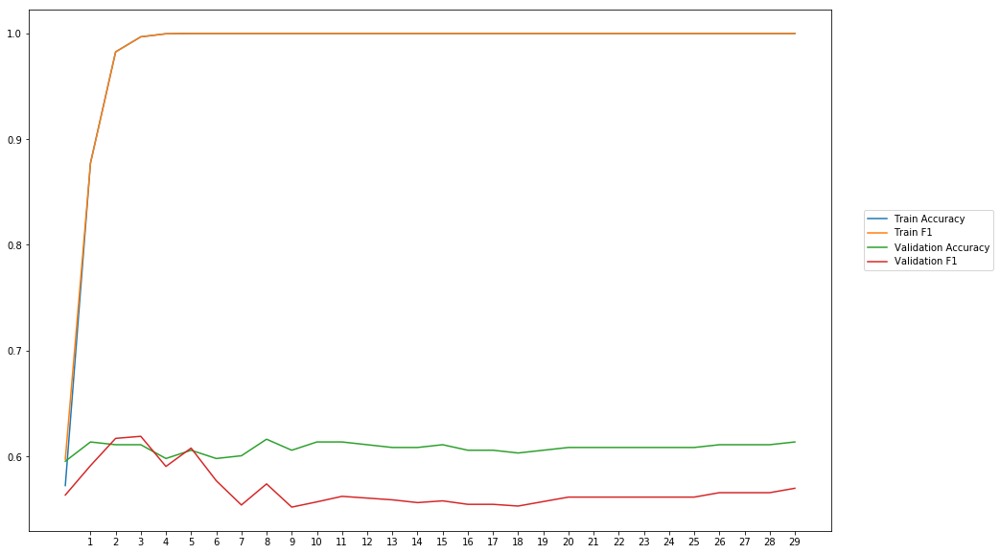

Average Accuracy: 60.79%
Average Precision: 63.08%
Average Recall: 51.94%
Average F1: 56.84%

-----Fold 7--------


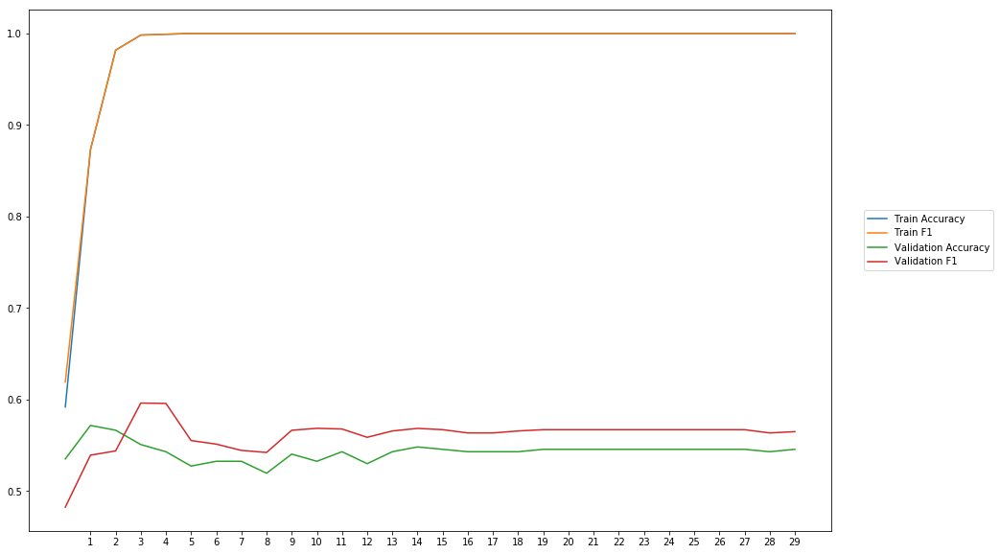

Average Accuracy: 54.31%
Average Precision: 53.90%
Average Recall: 58.80%
Average F1: 56.14%

-----Fold 8--------


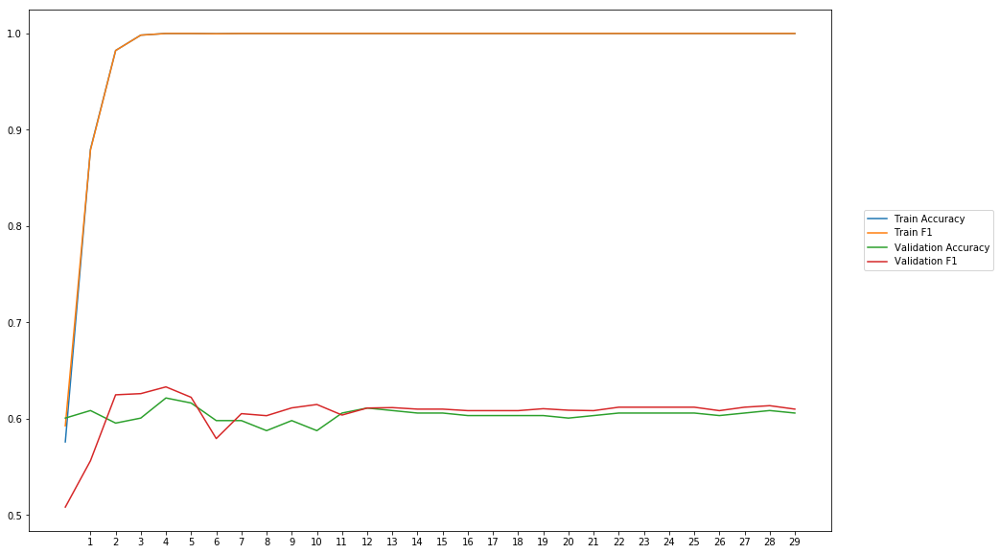

Average Accuracy: 60.37%
Average Precision: 60.19%
Average Recall: 61.31%
Average F1: 60.57%

-----Fold 9--------


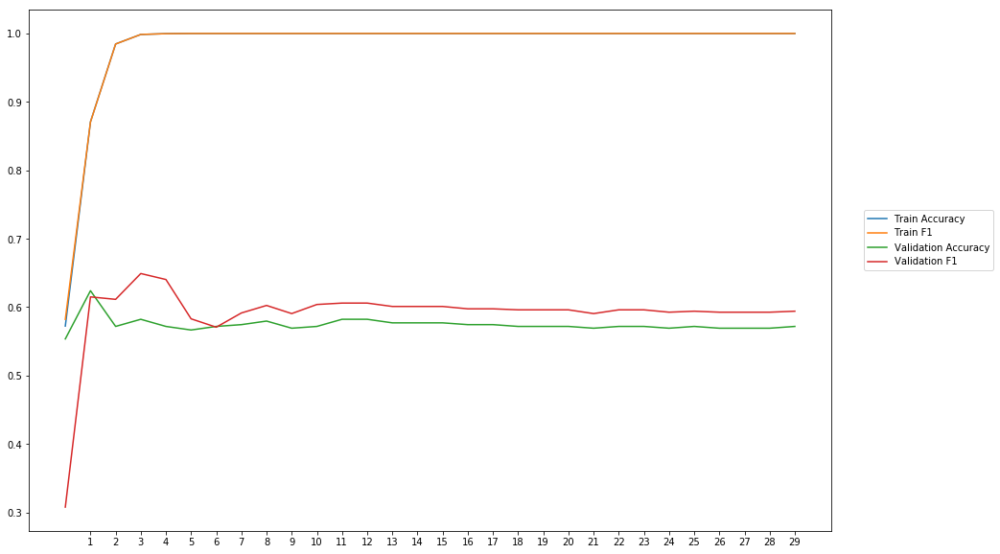

Average Accuracy: 57.43%
Average Precision: 56.96%
Average Recall: 62.53%
Average F1: 59.02%

-----Fold 10--------


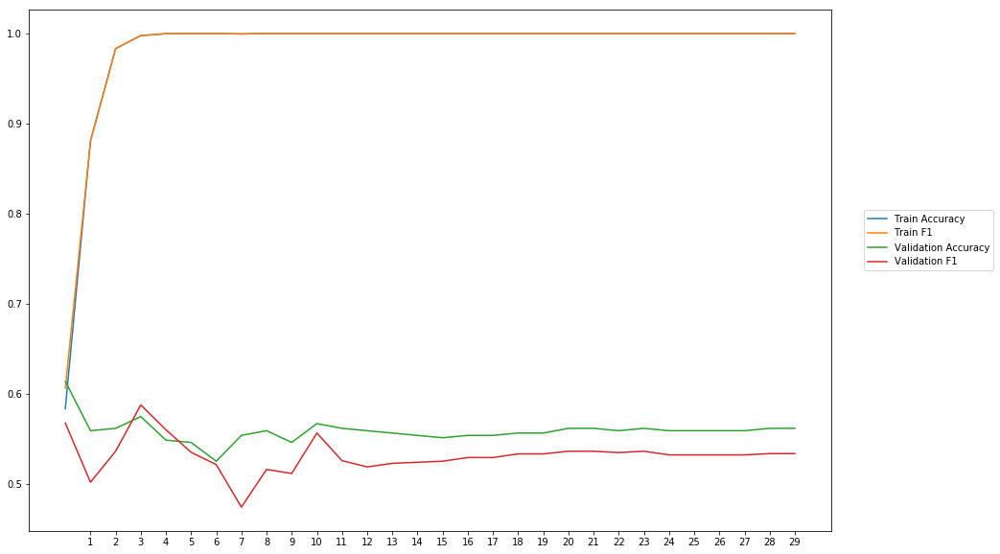

Average Accuracy: 55.84%
Average Precision: 56.49%
Average Recall: 50.30%
Average F1: 53.13%

-------Overallresults-------


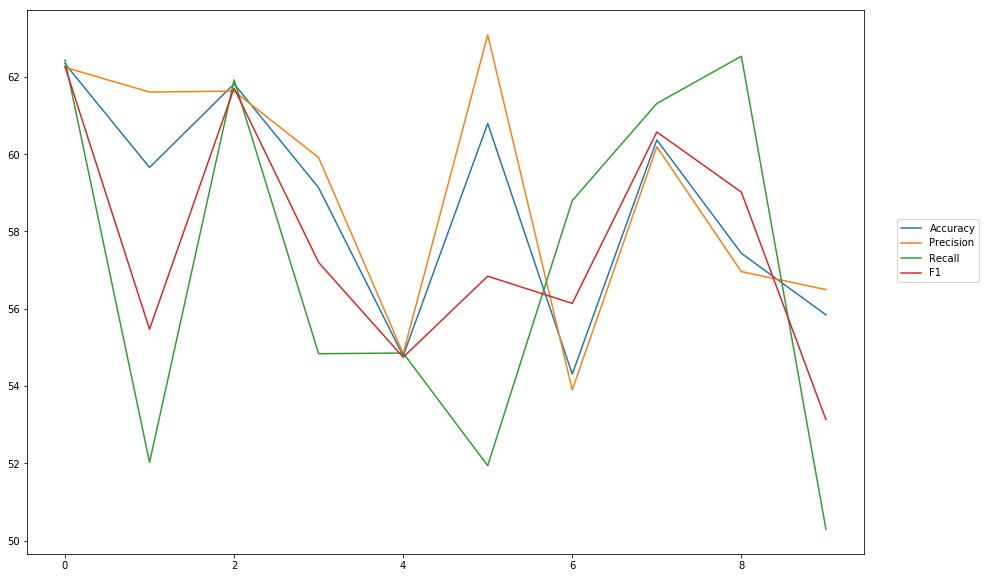

Accuracy: Mean = 58.65% (+/- 2.75%), Max = 62.34%, Min =  54.31%
Precision: Mean = 59.08% (+/- 3.11%), Max = 63.08%, Min =  53.90%
Recall: Mean = 57.09% (+/- 4.59%), Max = 62.53%, Min =  50.30%
F1: Mean = 57.71% (+/- 2.91%), Max = 62.27%, Min =  53.13%


In [20]:
cross_val(model_6, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'hiddem_selu')

In [21]:
wv_layer_7 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_7 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_7 = wv_layer_7(comment_input_7)

#First Dense Layer
x_7 = Dense(600, activation='softplus')(embedded_sequences_7)

x_7 = Flatten()(x_7)

#Output (Dense) Layer
preds_7 = Dense(2, activation='softmax')(x_7)

# build the model
model_7 = Model(inputs=[comment_input_7], outputs=preds_7)


-----Fold 1--------


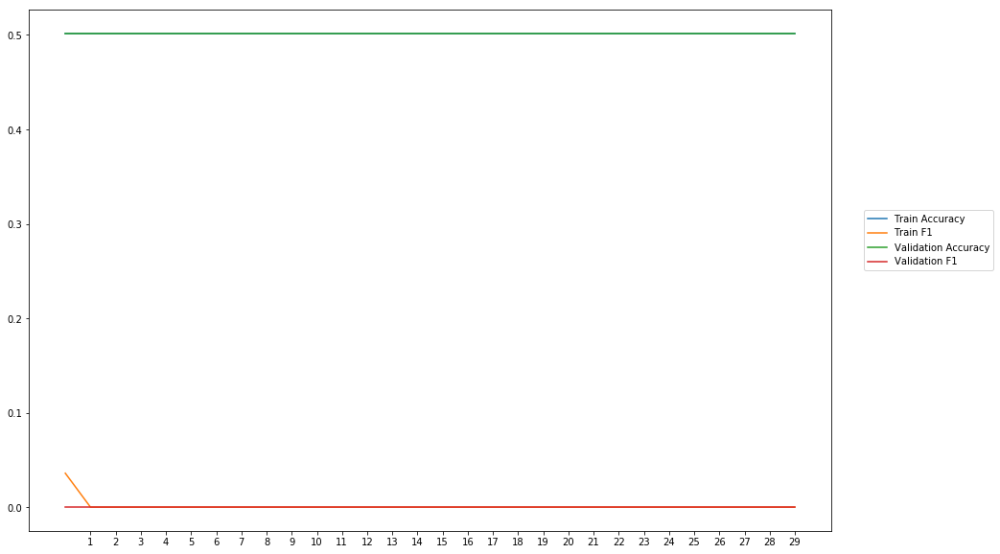

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 2--------


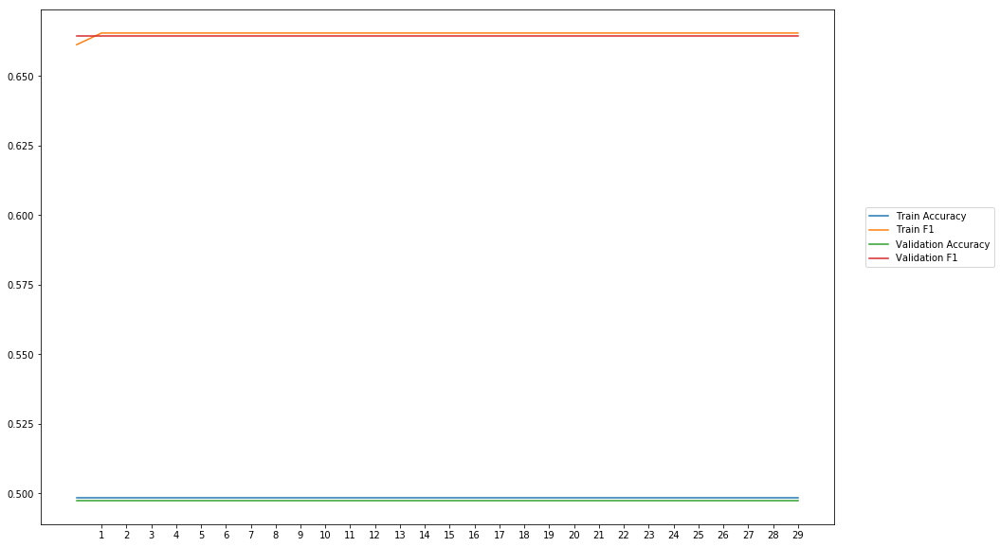

Average Accuracy: 49.74%
Average Precision: 49.74%
Average Recall: 100.00%
Average F1: 66.43%

-----Fold 3--------


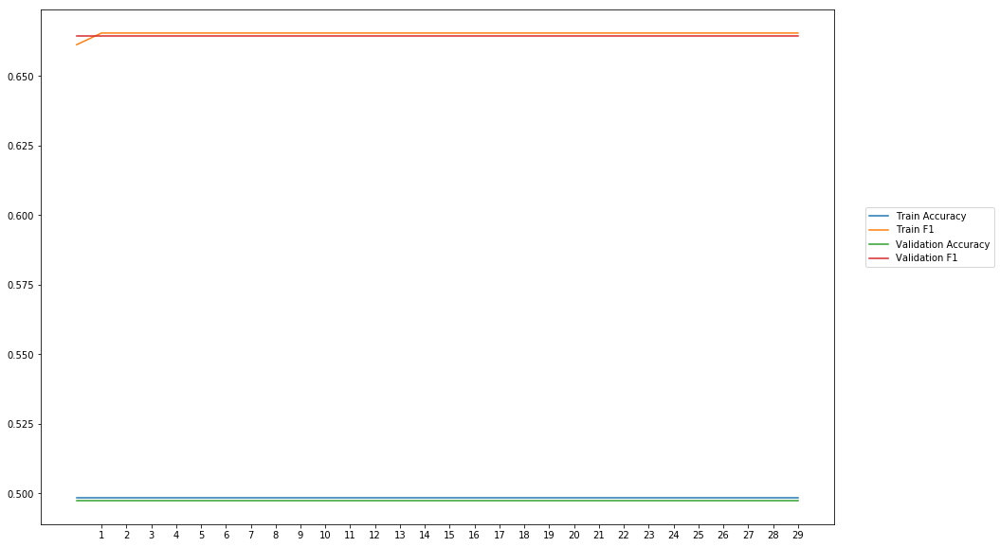

Average Accuracy: 49.74%
Average Precision: 49.74%
Average Recall: 100.00%
Average F1: 66.43%

-----Fold 4--------


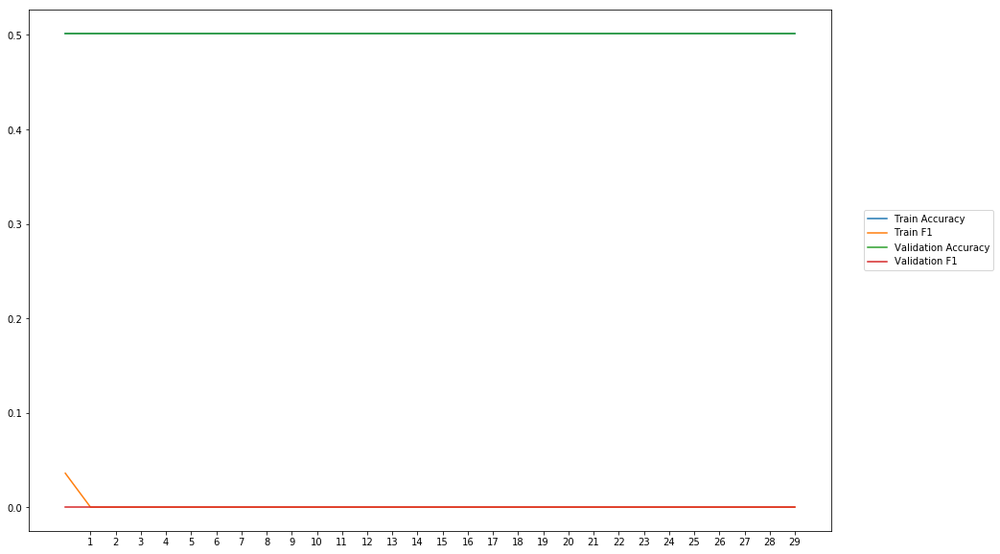

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 5--------


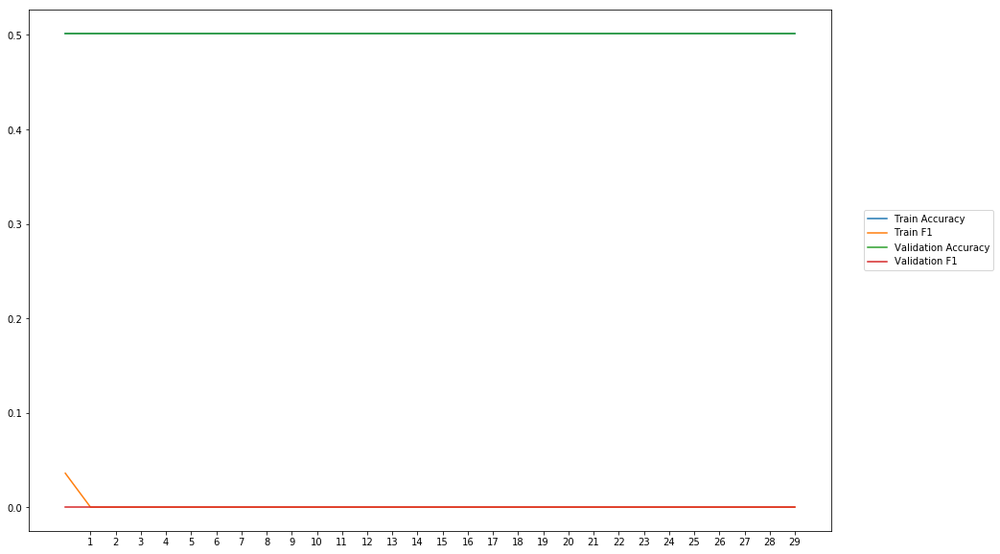

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 6--------


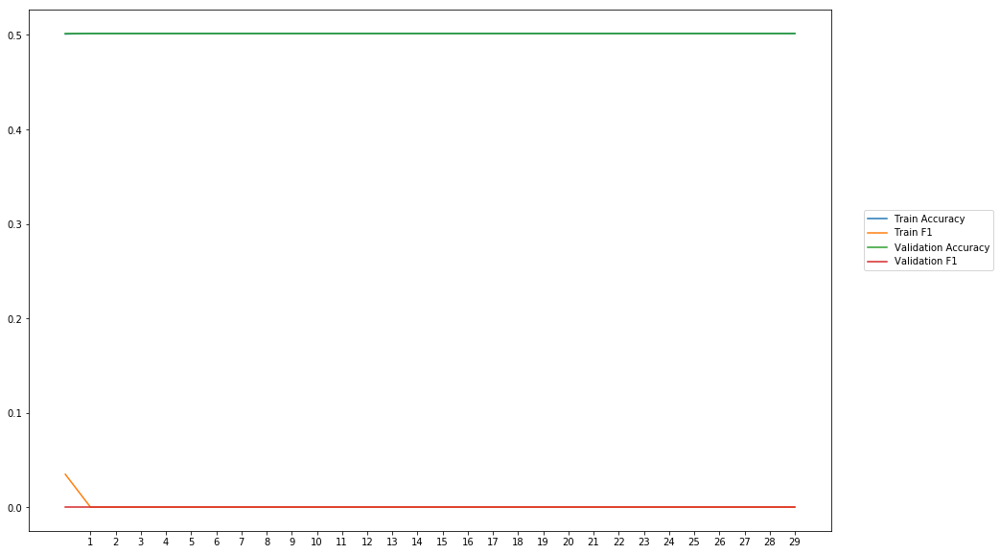

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 7--------


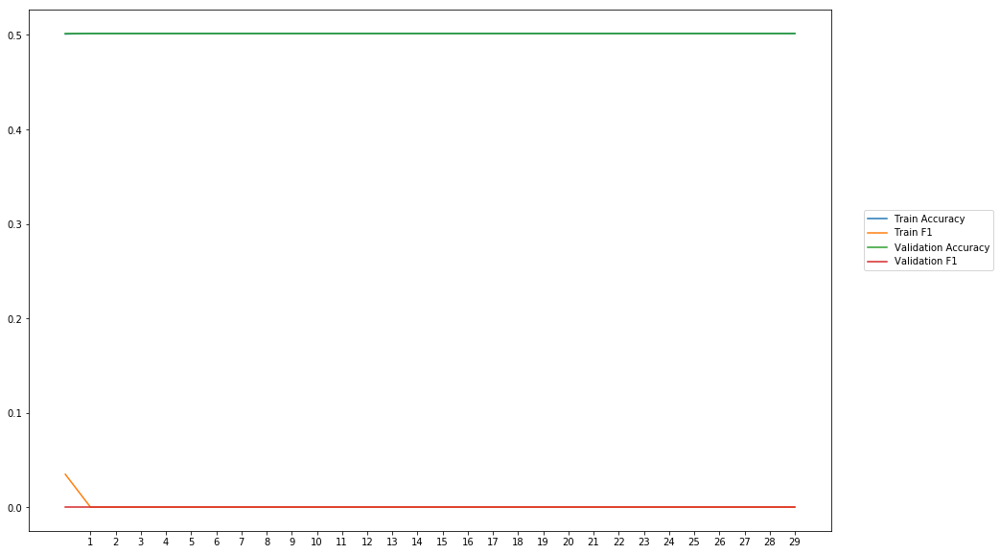

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 8--------


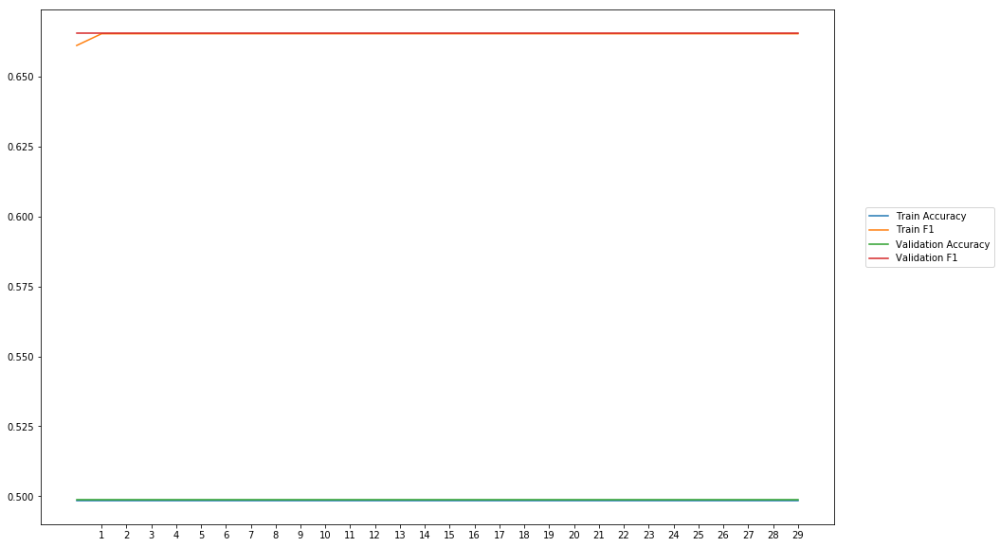

Average Accuracy: 49.87%
Average Precision: 49.87%
Average Recall: 100.00%
Average F1: 66.55%

-----Fold 9--------


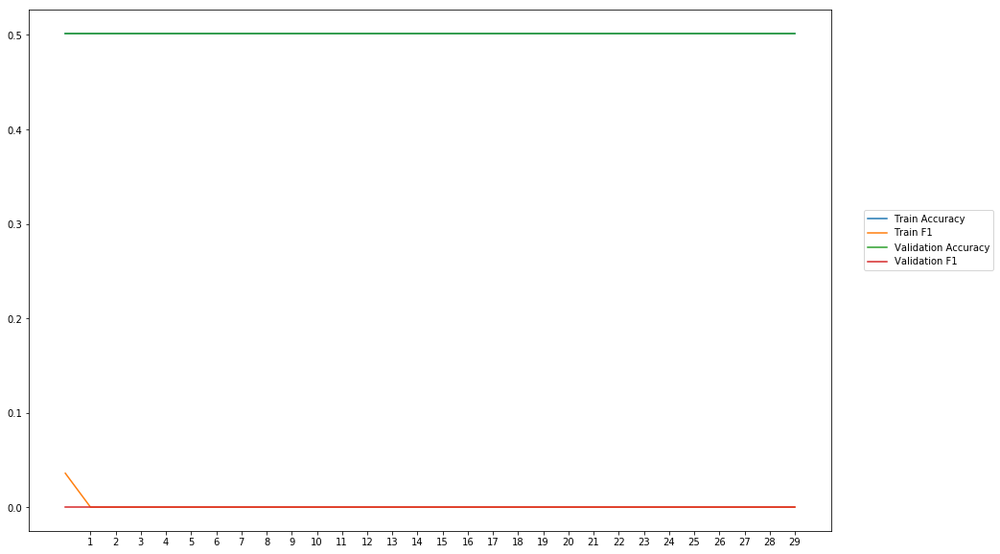

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 10--------


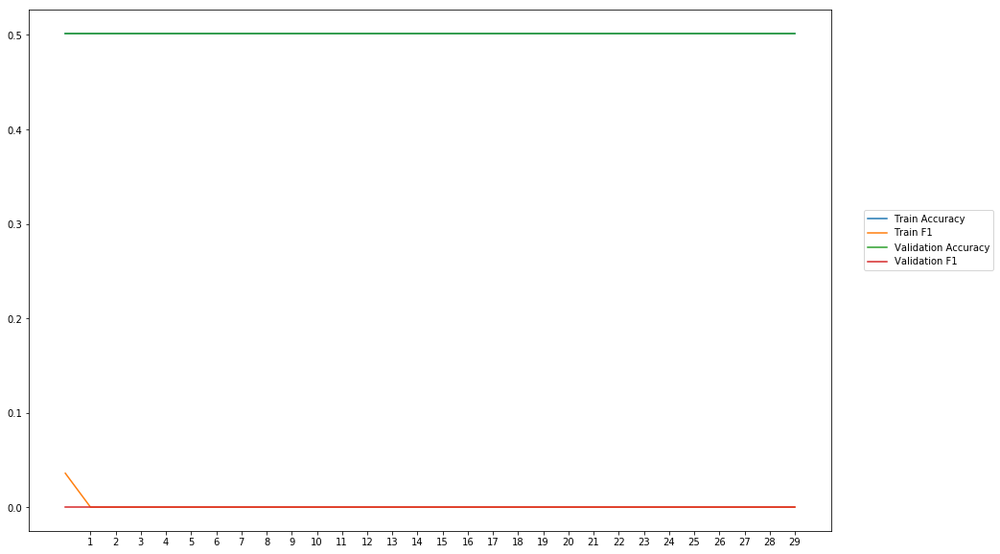

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-------Overallresults-------


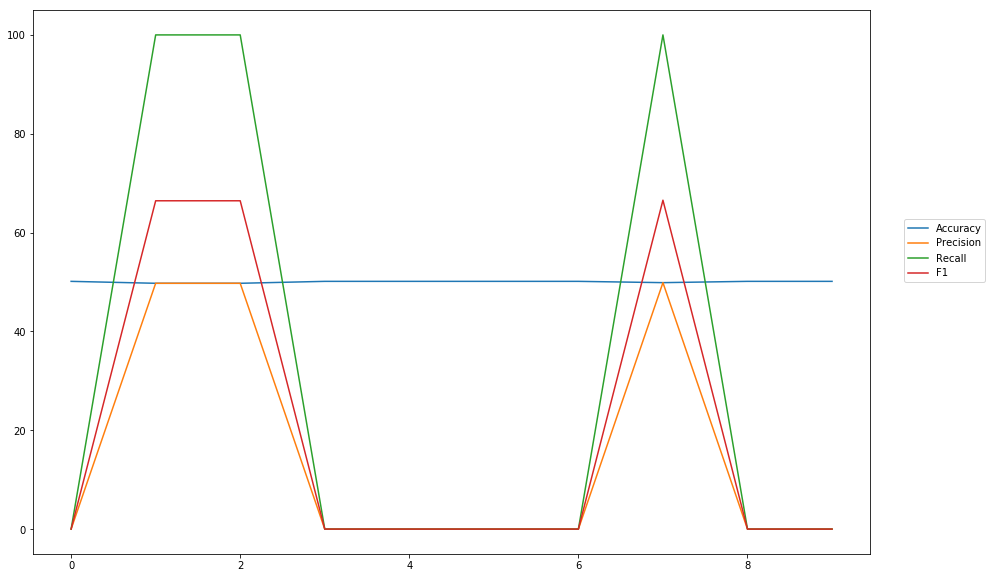

Accuracy: Mean = 50.03% (+/- 0.16%), Max = 50.13%, Min =  49.74%
Precision: Mean = 14.93% (+/- 22.81%), Max = 49.87%, Min =  0.00%
Recall: Mean = 30.00% (+/- 45.83%), Max = 100.00%, Min =  0.00%
F1: Mean = 19.94% (+/- 30.46%), Max = 66.55%, Min =  0.00%


In [22]:
cross_val(model_7, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'hiddem_softplus')

In [23]:
wv_layer_8 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_8 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_8 = wv_layer_8(comment_input_8)

#First Dense Layer
x_8 = Dense(600, activation='softsign')(embedded_sequences_8)

x_8 = Flatten()(x_8)

#Output (Dense) Layer
preds_8 = Dense(2, activation='softmax')(x_8)

# build the model
model_8 = Model(inputs=[comment_input_8], outputs=preds_8)


-----Fold 1--------


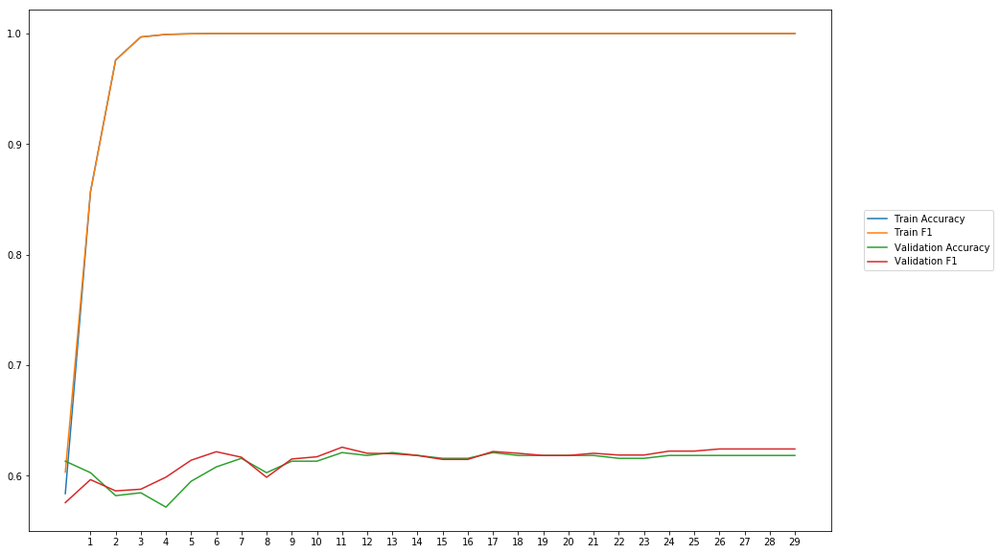

Average Accuracy: 61.14%
Average Precision: 60.89%
Average Recall: 61.96%
Average F1: 61.38%

-----Fold 2--------


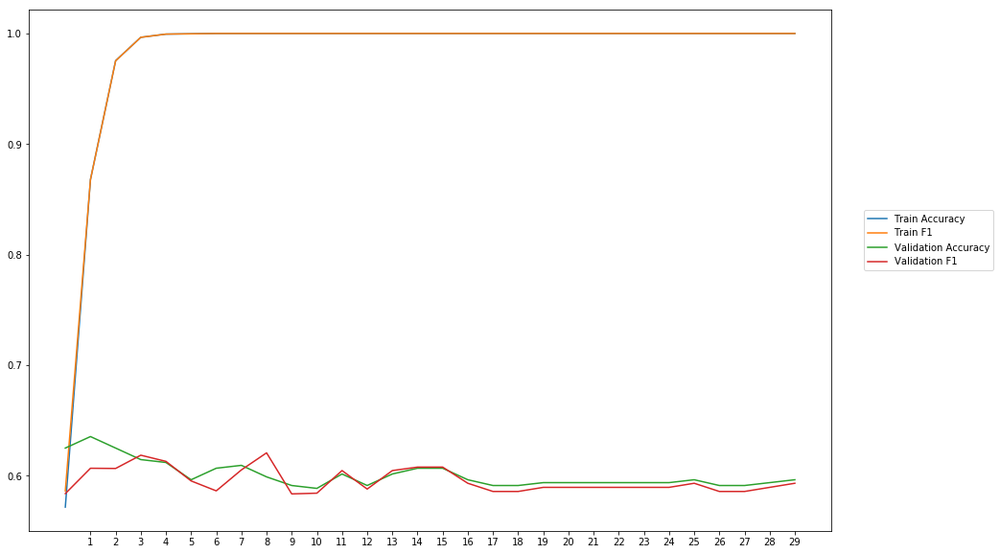

Average Accuracy: 60.07%
Average Precision: 60.08%
Average Recall: 59.13%
Average F1: 59.55%

-----Fold 3--------


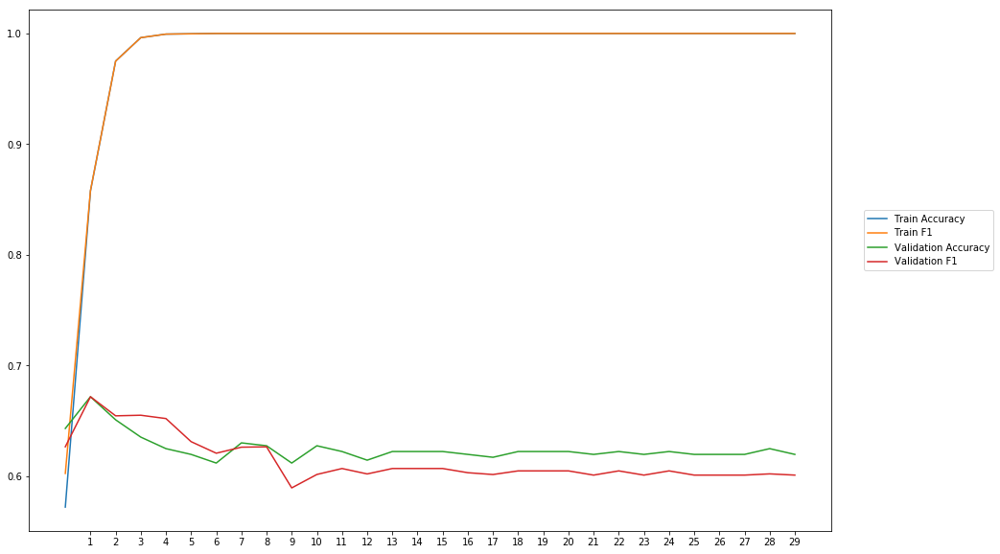

Average Accuracy: 62.51%
Average Precision: 62.91%
Average Recall: 60.14%
Average F1: 61.42%

-----Fold 4--------


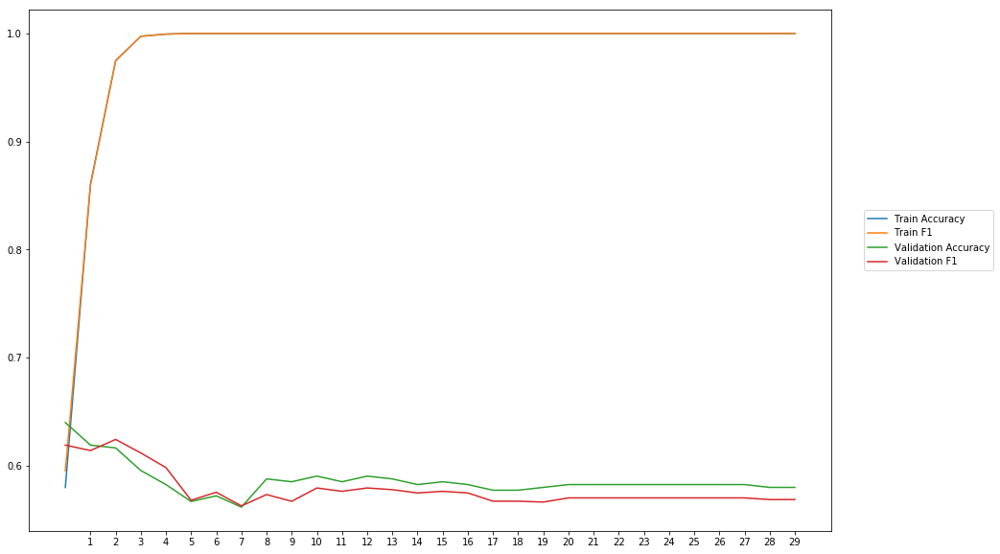

Average Accuracy: 58.59%
Average Precision: 58.78%
Average Recall: 56.93%
Average F1: 57.81%

-----Fold 5--------


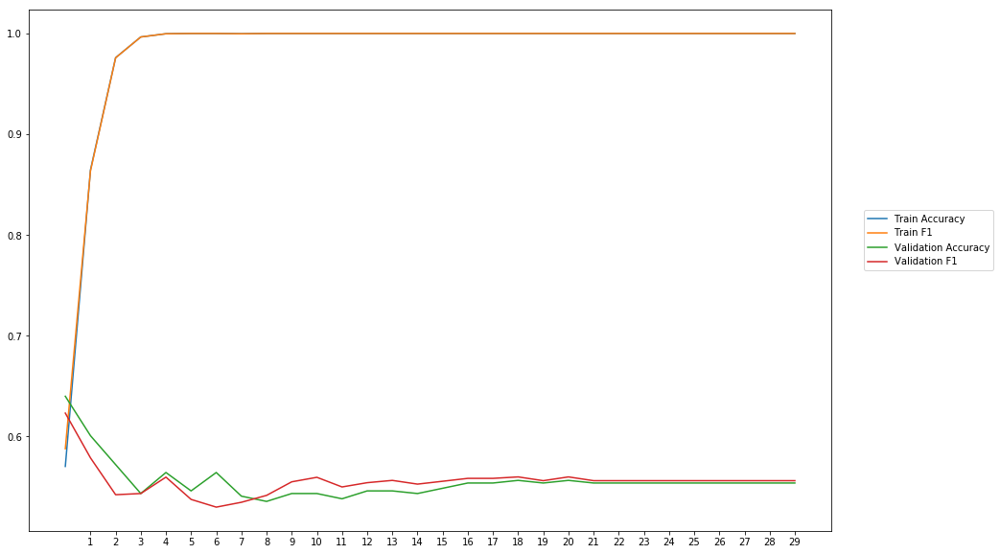

Average Accuracy: 55.55%
Average Precision: 55.50%
Average Recall: 55.67%
Average F1: 55.54%

-----Fold 6--------


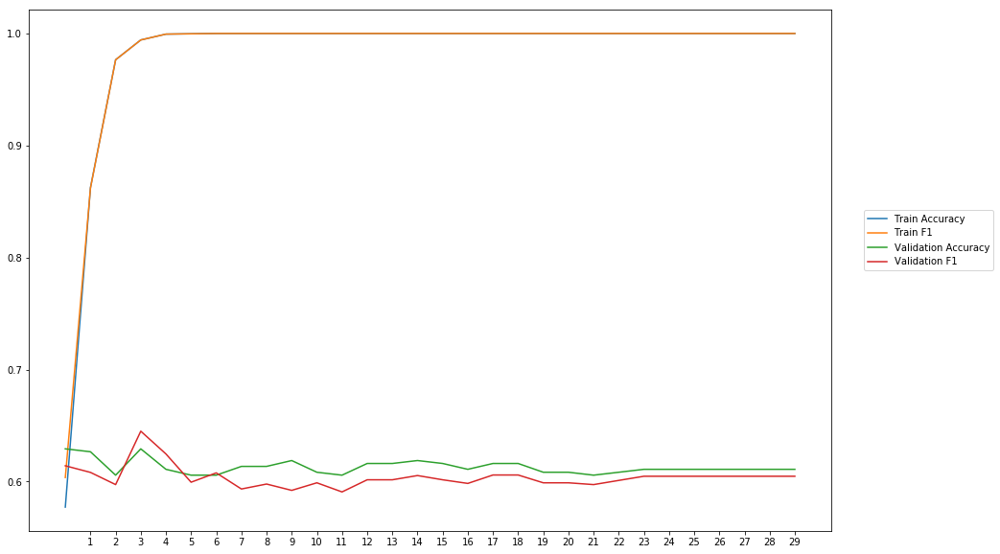

Average Accuracy: 61.31%
Average Precision: 61.69%
Average Recall: 59.21%
Average F1: 60.40%

-----Fold 7--------


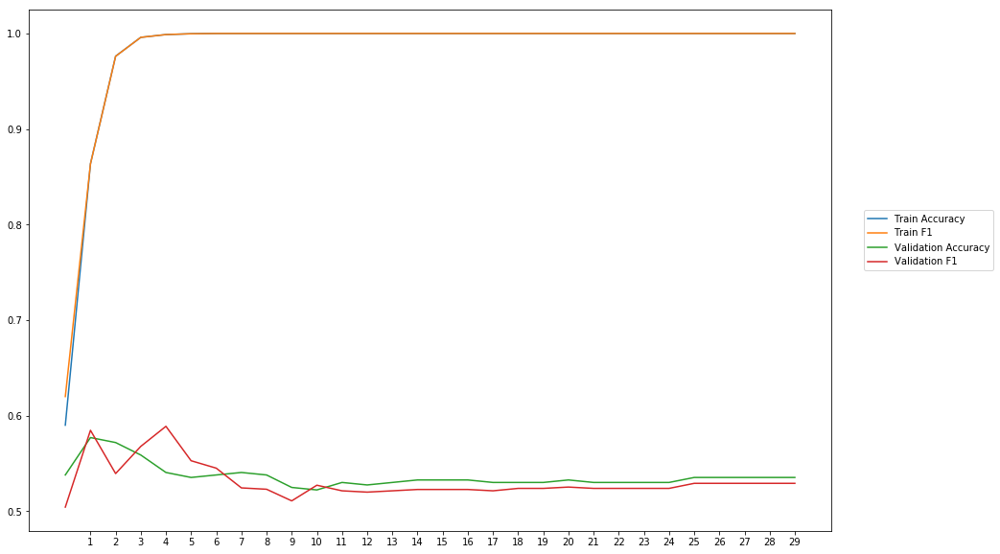

Average Accuracy: 53.63%
Average Precision: 53.58%
Average Recall: 52.76%
Average F1: 53.11%

-----Fold 8--------


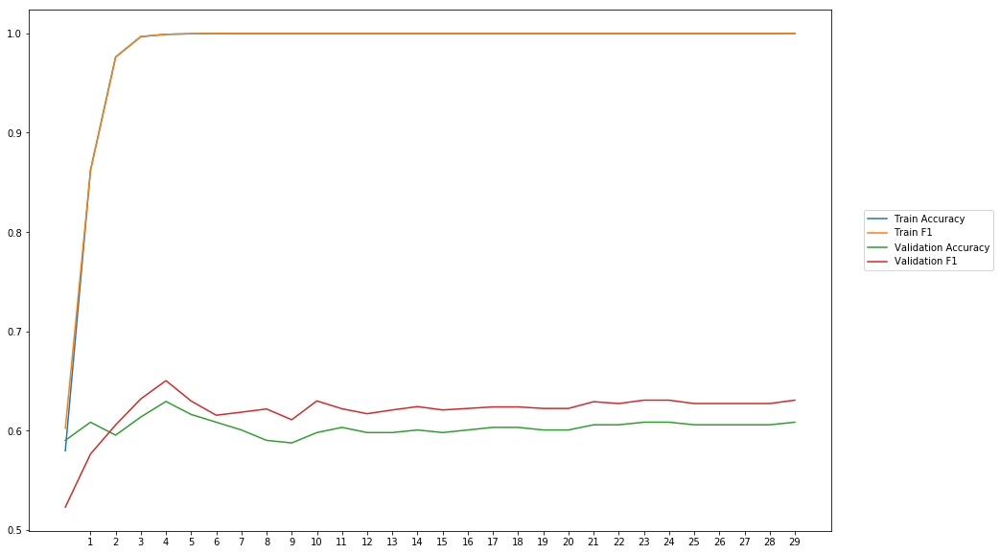

Average Accuracy: 60.34%
Average Precision: 59.42%
Average Recall: 64.99%
Average F1: 61.96%

-----Fold 9--------


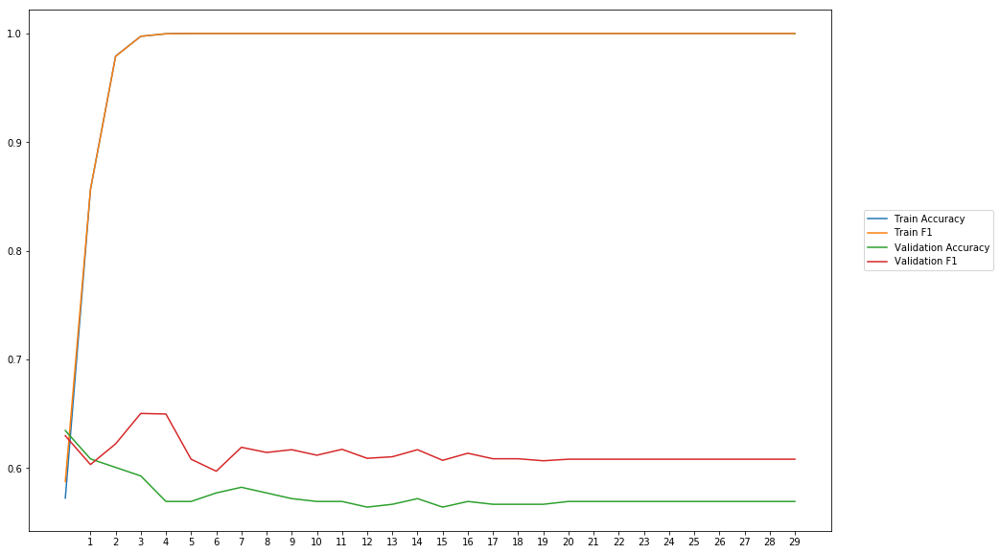

Average Accuracy: 57.49%
Average Precision: 56.22%
Average Recall: 67.66%
Average F1: 61.33%

-----Fold 10--------


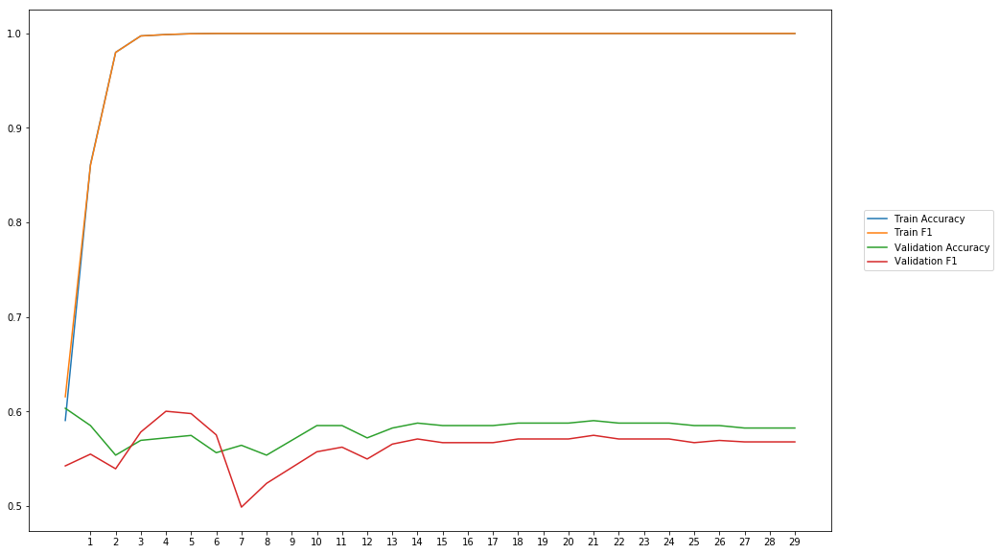

Average Accuracy: 57.99%
Average Precision: 58.56%
Average Recall: 54.42%
Average F1: 56.30%

-------Overallresults-------


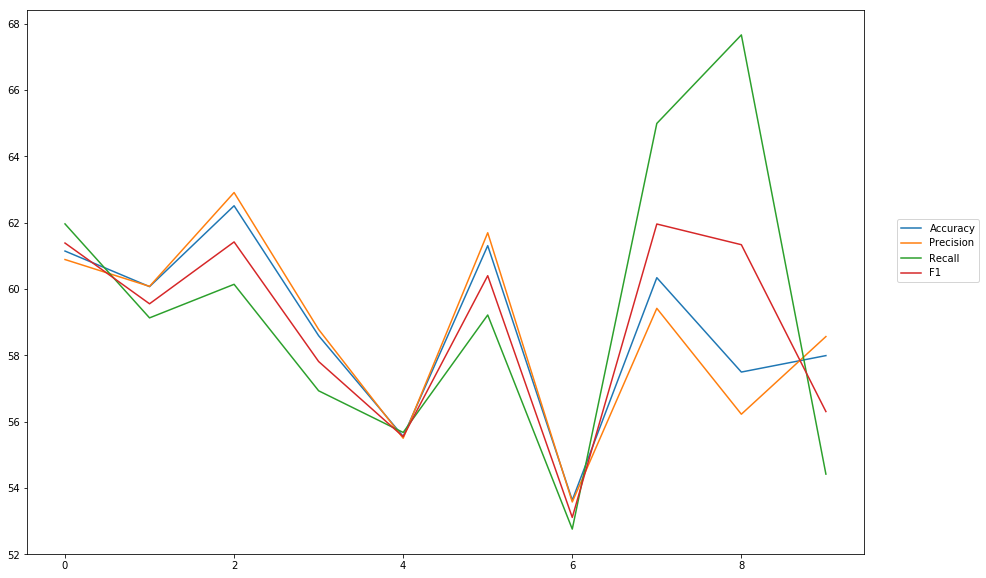

Accuracy: Mean = 58.86% (+/- 2.63%), Max = 62.51%, Min =  53.63%
Precision: Mean = 58.76% (+/- 2.77%), Max = 62.91%, Min =  53.58%
Recall: Mean = 59.29% (+/- 4.42%), Max = 67.66%, Min =  52.76%
F1: Mean = 58.88% (+/- 2.88%), Max = 61.96%, Min =  53.11%


In [25]:
cross_val(model_8, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'hidden_softsign')

In [26]:
wv_layer_9 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_9 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_9 = wv_layer_9(comment_input_9)

#First Dense Layer
x_9 = Dense(600, activation='linear')(embedded_sequences_9)

x_9 = Flatten()(x_9)

#Output (Dense) Layer
preds_9 = Dense(2, activation='softmax')(x_9)

# build the model
model_9 = Model(inputs=[comment_input_9], outputs=preds_9)


-----Fold 1--------


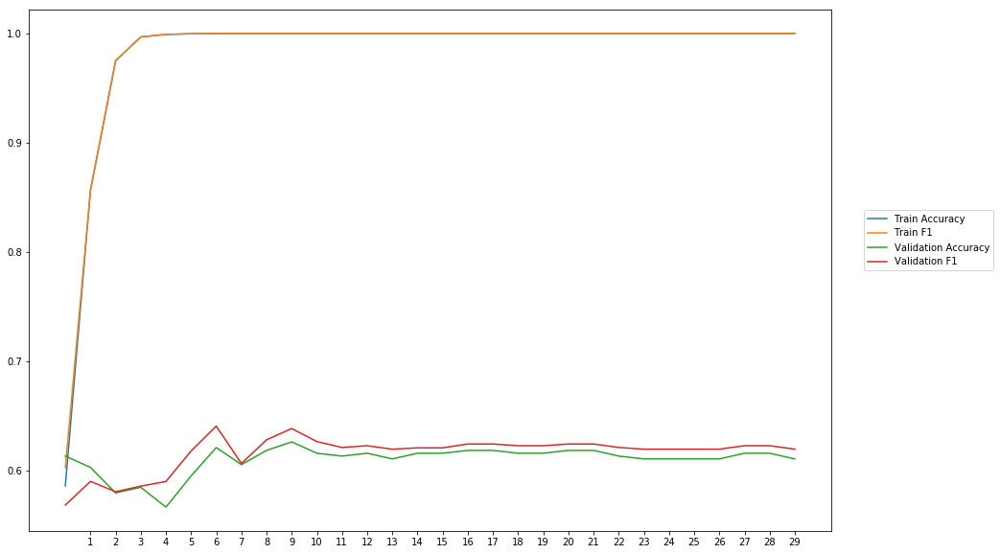

Average Accuracy: 60.99%
Average Precision: 60.52%
Average Recall: 62.80%
Average F1: 61.59%

-----Fold 2--------


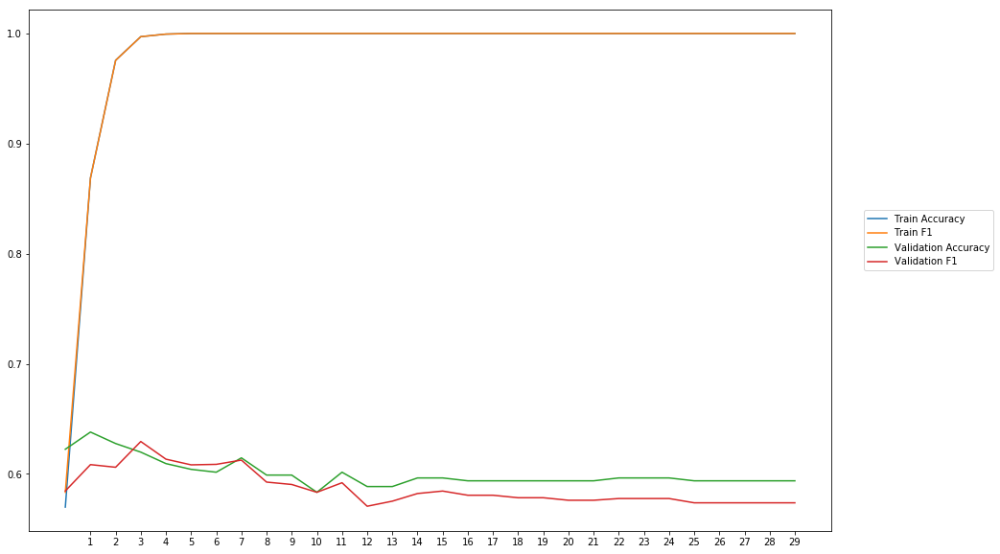

Average Accuracy: 60.03%
Average Precision: 60.41%
Average Recall: 57.19%
Average F1: 58.71%

-----Fold 3--------


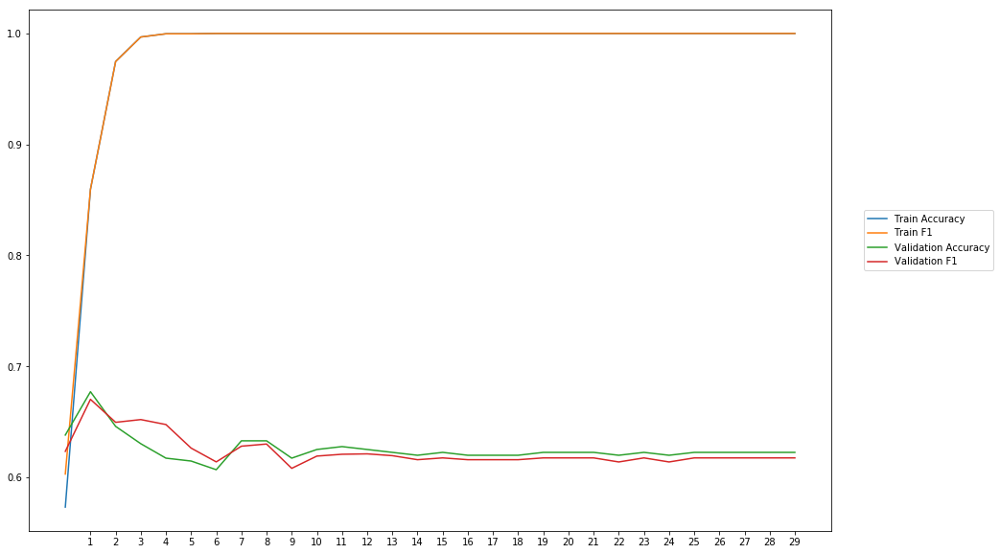

Average Accuracy: 62.52%
Average Precision: 62.35%
Average Recall: 62.34%
Average F1: 62.31%

-----Fold 4--------


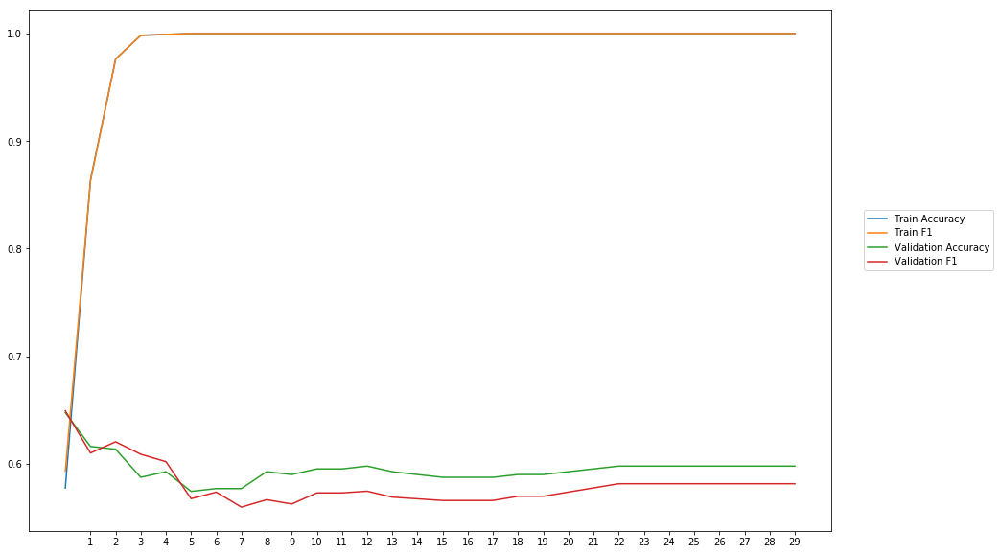

Average Accuracy: 59.51%
Average Precision: 60.04%
Average Recall: 56.30%
Average F1: 58.07%

-----Fold 5--------


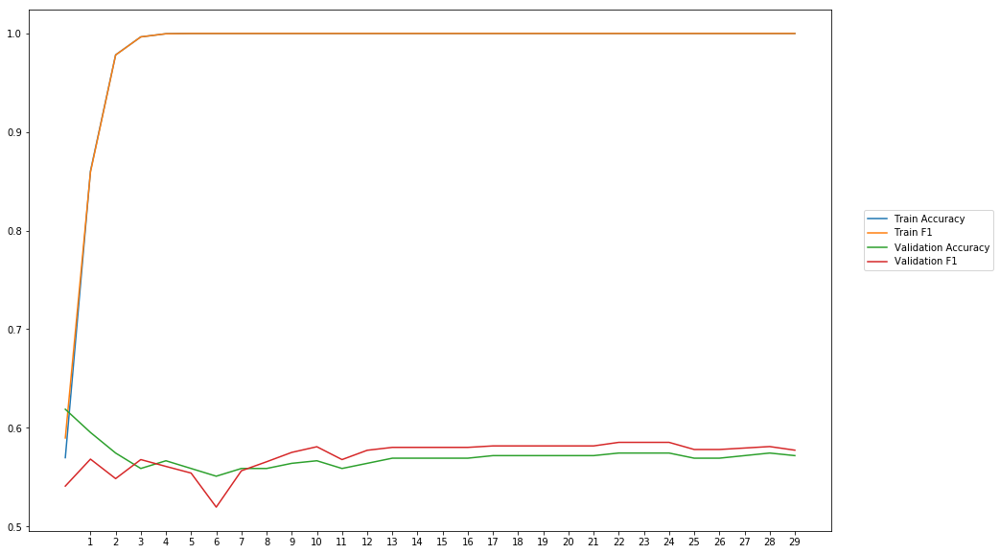

Average Accuracy: 57.03%
Average Precision: 56.97%
Average Recall: 57.70%
Average F1: 57.20%

-----Fold 6--------


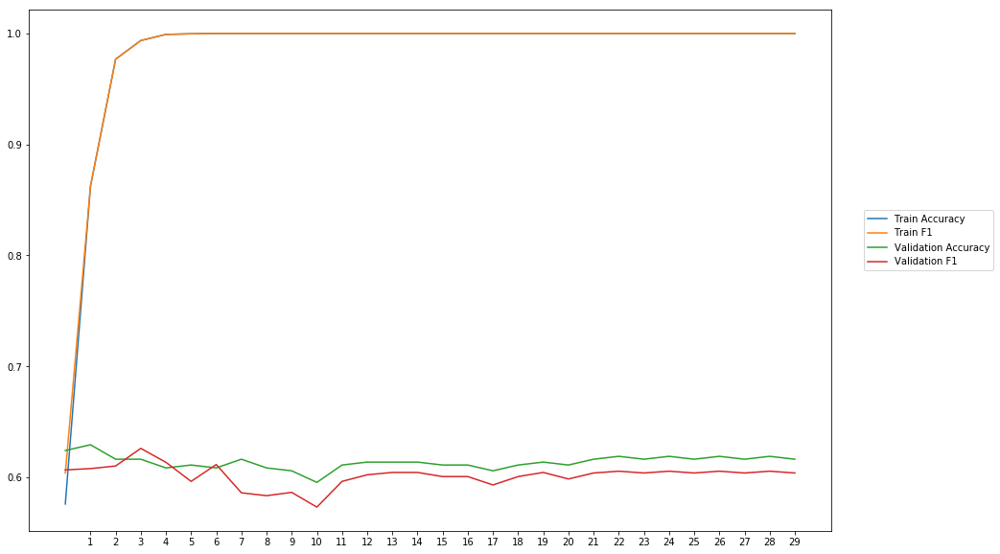

Average Accuracy: 61.37%
Average Precision: 61.95%
Average Recall: 58.50%
Average F1: 60.15%

-----Fold 7--------


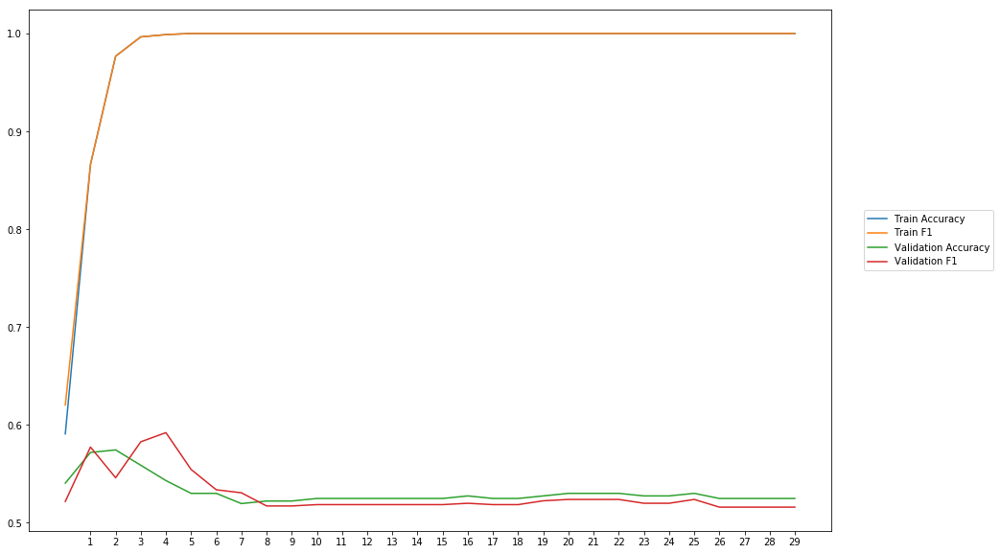

Average Accuracy: 53.13%
Average Precision: 53.03%
Average Recall: 52.83%
Average F1: 52.87%

-----Fold 8--------


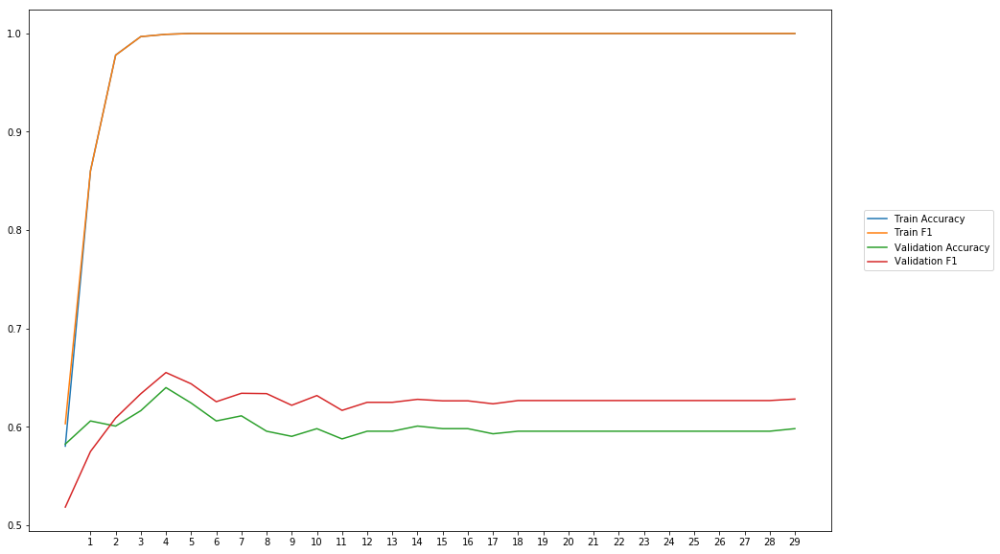

Average Accuracy: 59.94%
Average Precision: 58.77%
Average Recall: 66.42%
Average F1: 62.23%

-----Fold 9--------


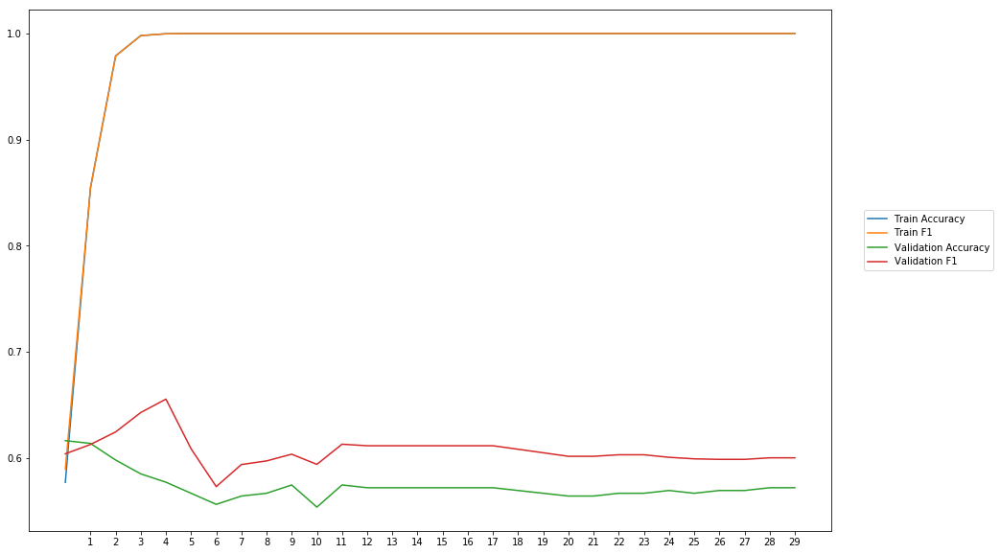

Average Accuracy: 57.30%
Average Precision: 56.17%
Average Recall: 66.20%
Average F1: 60.69%

-----Fold 10--------


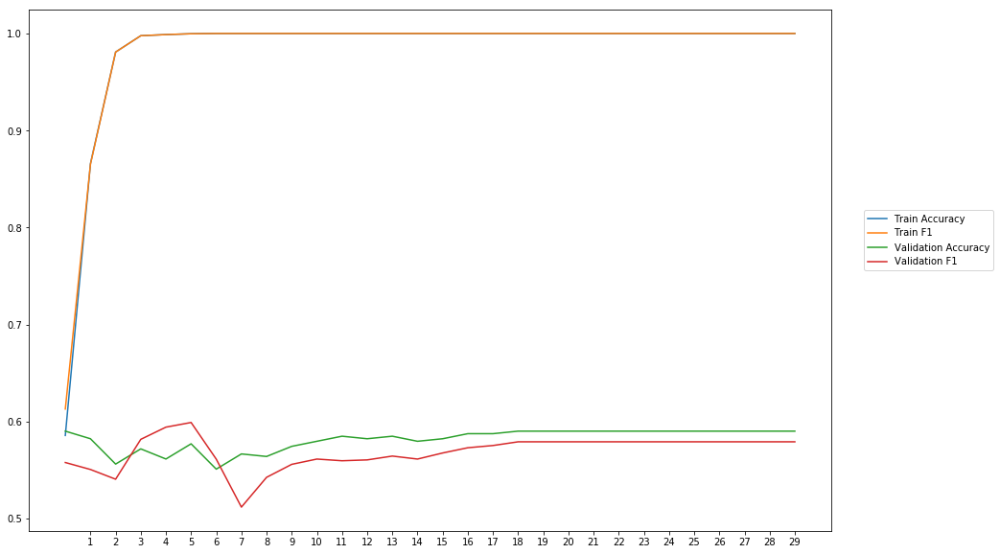

Average Accuracy: 58.15%
Average Precision: 58.53%
Average Recall: 55.48%
Average F1: 56.89%

-------Overallresults-------


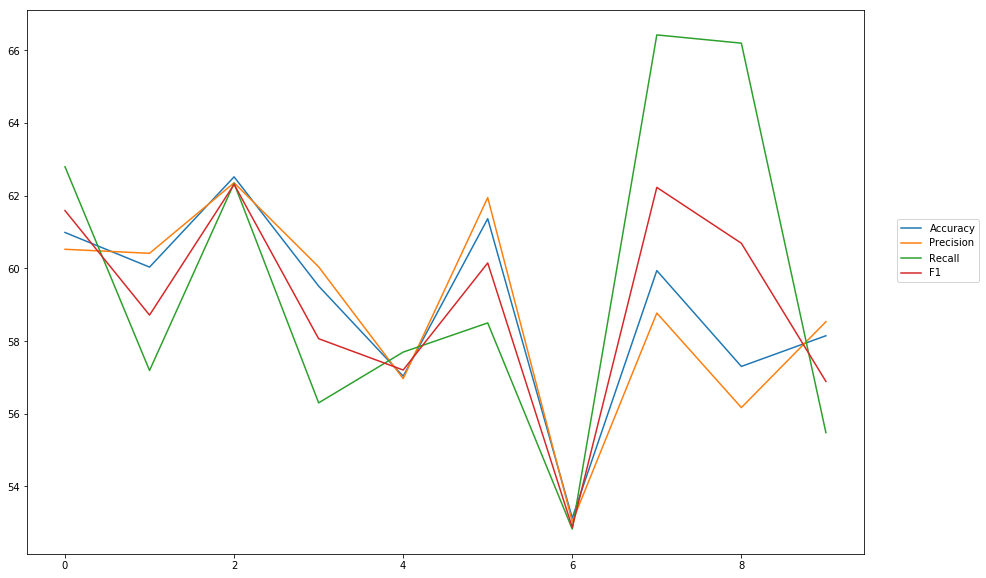

Accuracy: Mean = 59.00% (+/- 2.57%), Max = 62.52%, Min =  53.13%
Precision: Mean = 58.87% (+/- 2.71%), Max = 62.35%, Min =  53.03%
Recall: Mean = 59.57% (+/- 4.38%), Max = 66.42%, Min =  52.83%
F1: Mean = 59.07% (+/- 2.80%), Max = 62.31%, Min =  52.87%


In [27]:
cross_val(model_9, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'hiddem_linear')

### Output Layer

In [9]:
wv_layer_10 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_10 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_10 = wv_layer_10(comment_input_10)

#First Dense Layer
x_10 = Dense(600, activation='relu')(embedded_sequences_10)

x_10 = Flatten()(x_10)

#Output (Dense) Layer
preds_10 = Dense(2, activation='sigmoid')(x_10)

# build the model
model_10 = Model(inputs=[comment_input_10], outputs=preds_10)


-----Fold 1--------


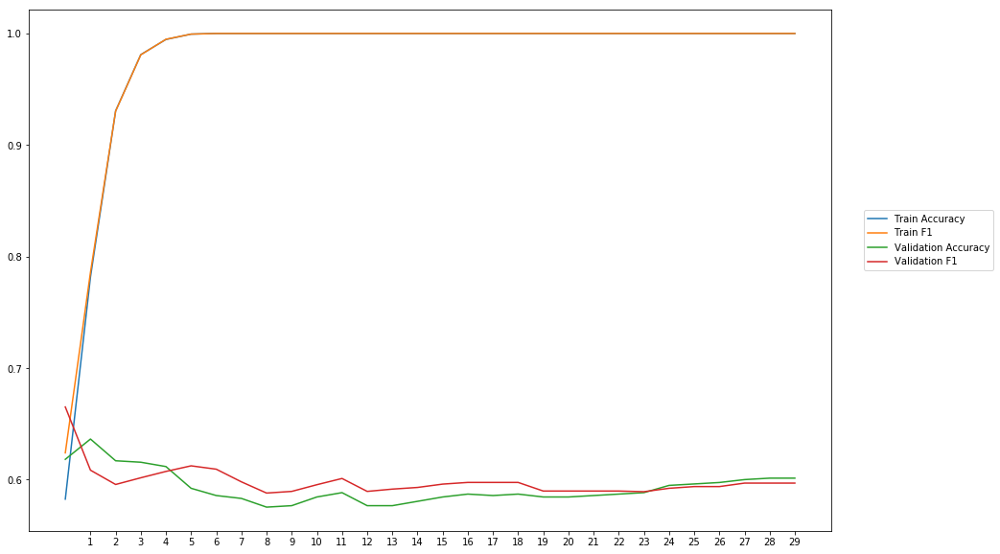

Average Accuracy: 59.28%
Average Precision: 58.96%
Average Recall: 60.90%
Average F1: 59.84%

-----Fold 2--------


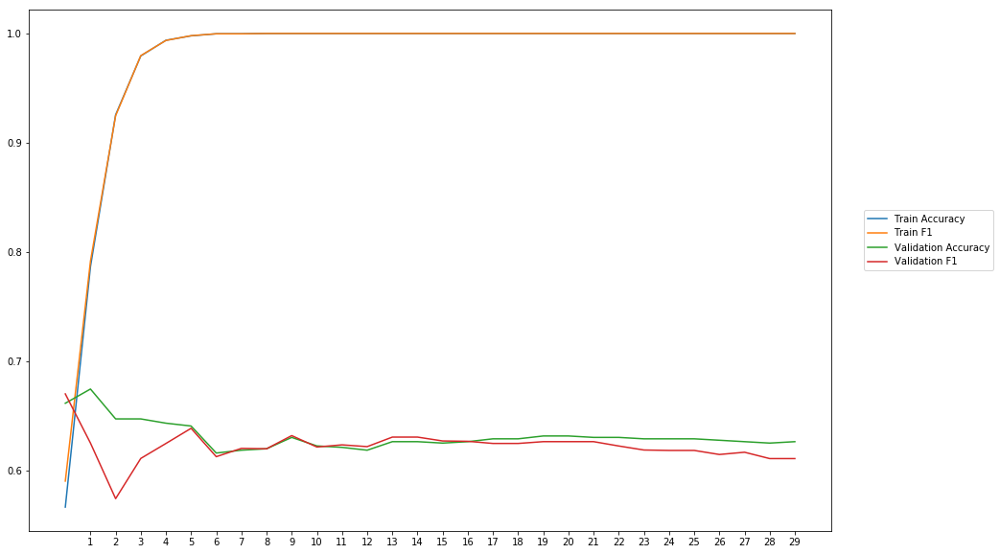

Average Accuracy: 63.12%
Average Precision: 63.63%
Average Recall: 61.15%
Average F1: 62.22%

-----Fold 3--------


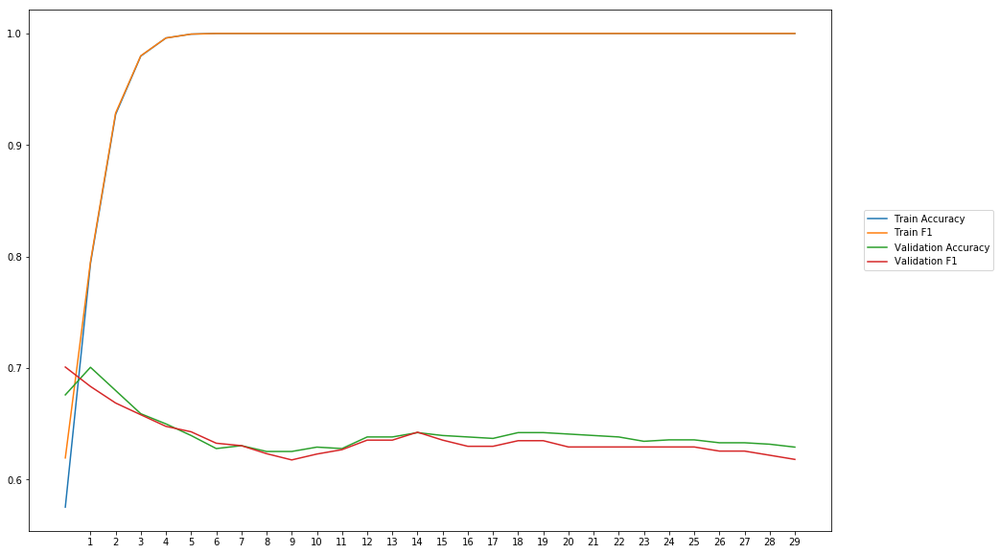

Average Accuracy: 64.11%
Average Precision: 64.39%
Average Recall: 62.98%
Average F1: 63.65%

-----Fold 4--------


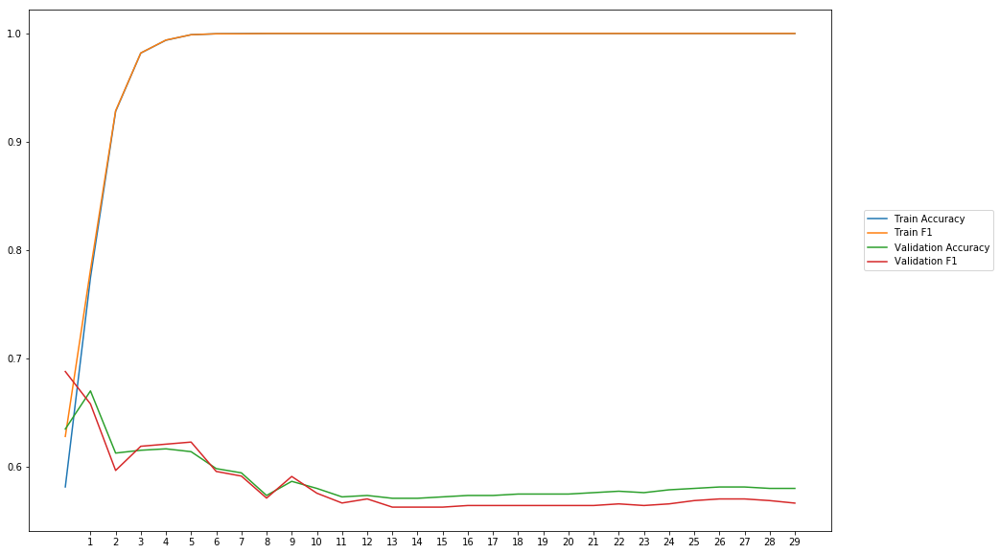

Average Accuracy: 58.76%
Average Precision: 58.62%
Average Recall: 57.98%
Average F1: 58.23%

-----Fold 5--------


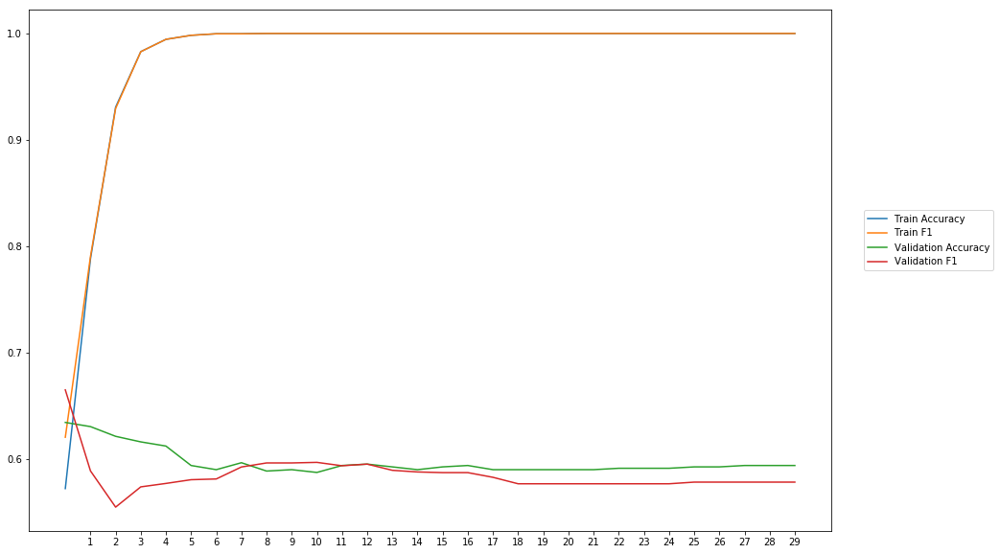

Average Accuracy: 59.71%
Average Precision: 60.21%
Average Recall: 57.16%
Average F1: 58.53%

-----Fold 6--------


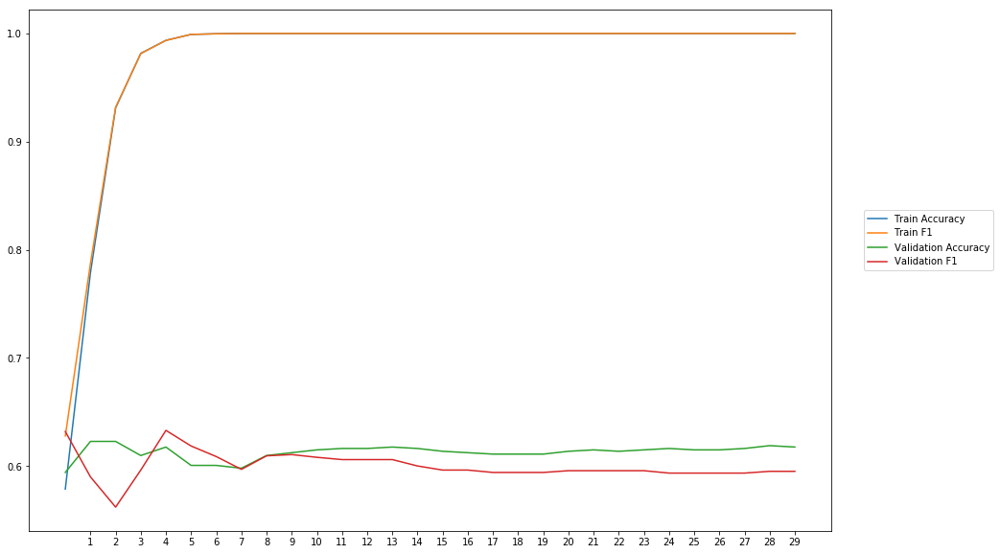

Average Accuracy: 61.28%
Average Precision: 61.84%
Average Recall: 58.48%
Average F1: 60.01%

-----Fold 7--------


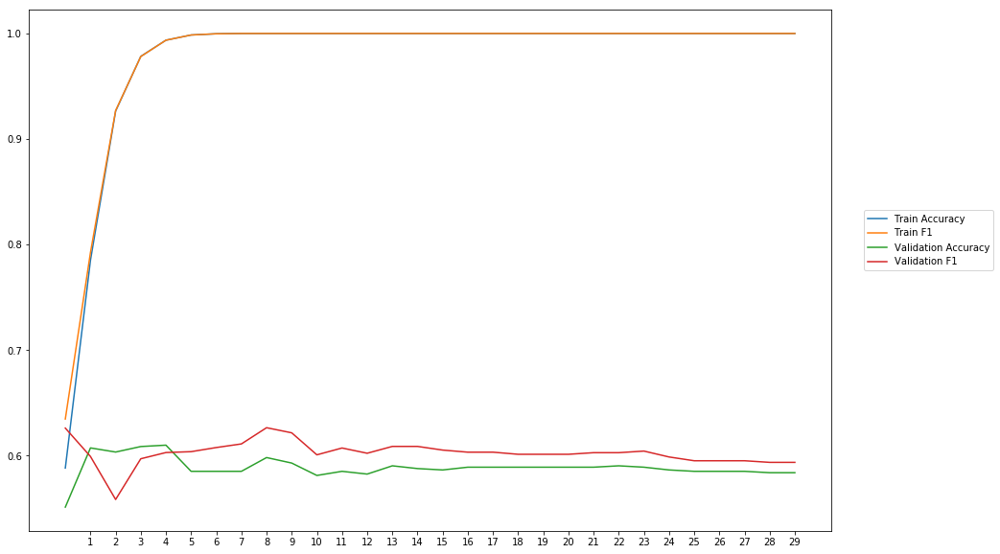

Average Accuracy: 58.85%
Average Precision: 58.35%
Average Recall: 62.48%
Average F1: 60.24%

-----Fold 8--------


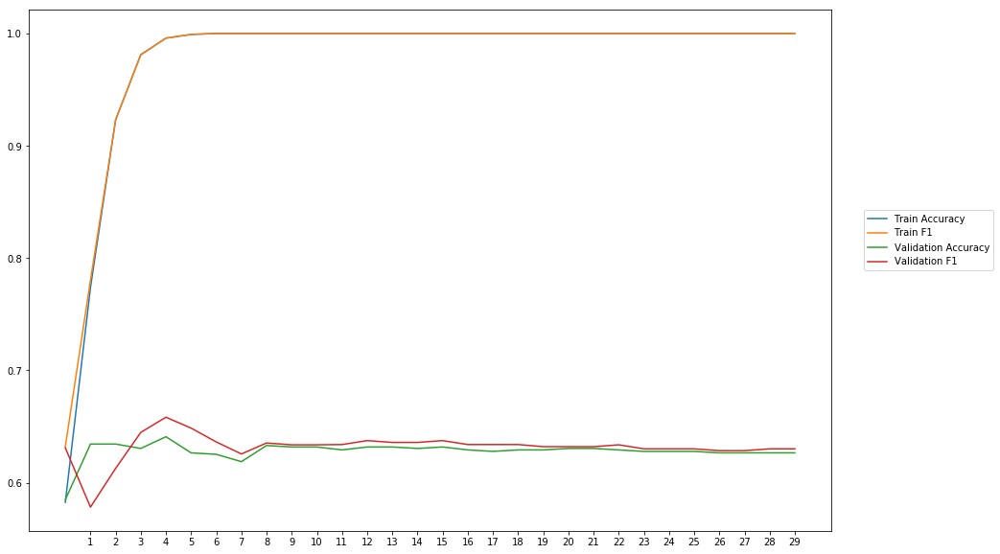

Average Accuracy: 62.82%
Average Precision: 62.55%
Average Recall: 64.07%
Average F1: 63.20%

-----Fold 9--------


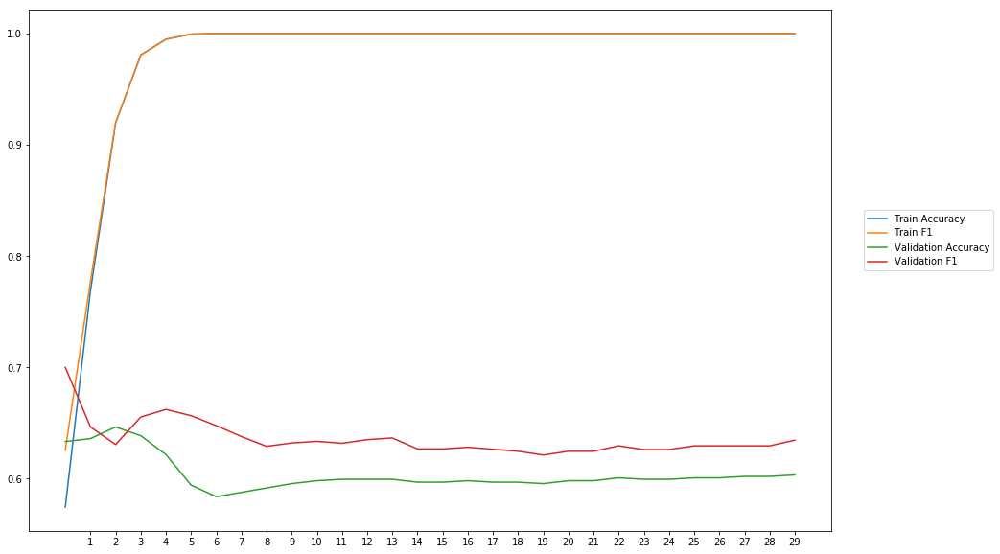

Average Accuracy: 60.35%
Average Precision: 58.82%
Average Recall: 69.34%
Average F1: 63.55%

-----Fold 10--------


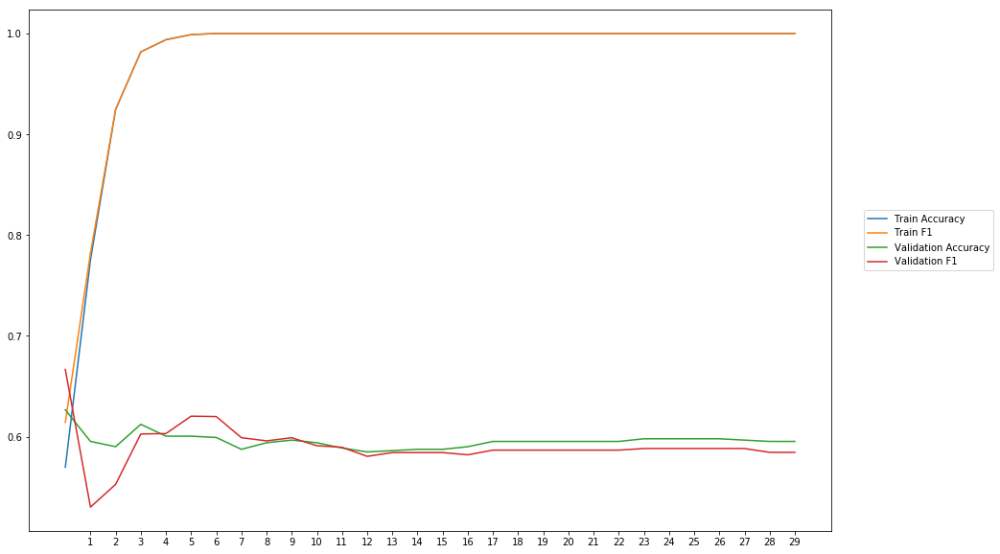

Average Accuracy: 59.57%
Average Precision: 59.65%
Average Recall: 58.67%
Average F1: 59.05%

-------Overallresults-------


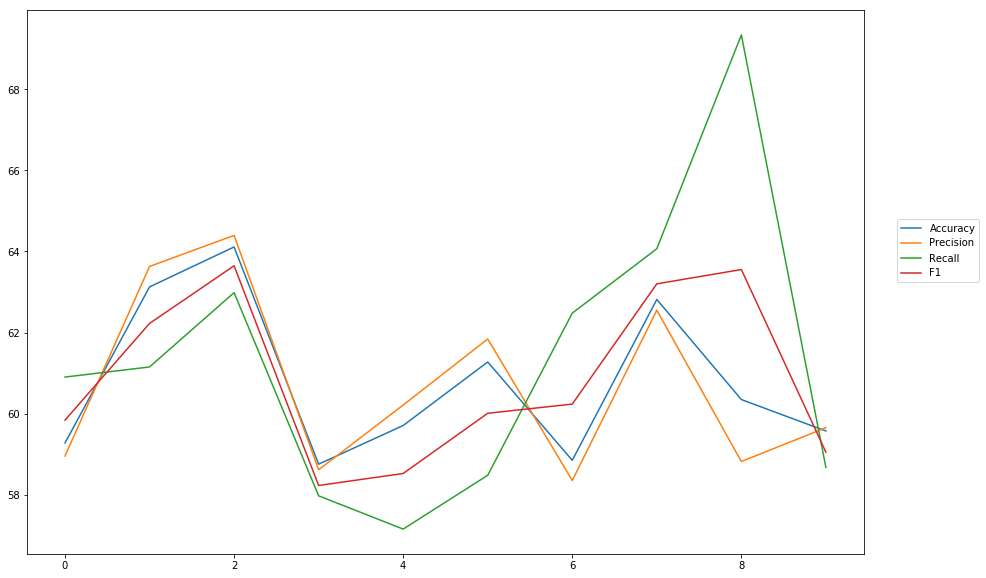

Accuracy: Mean = 60.78% (+/- 1.84%), Max = 64.11%, Min =  58.76%
Precision: Mean = 60.70% (+/- 2.11%), Max = 64.39%, Min =  58.35%
Recall: Mean = 61.32% (+/- 3.46%), Max = 69.34%, Min =  57.16%
F1: Mean = 60.85% (+/- 2.00%), Max = 63.65%, Min =  58.23%


In [29]:
cross_val(model_10, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'output_sigmoid')

In [10]:
wv_layer_11 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_11 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_11 = wv_layer_11(comment_input_11)

#First Dense Layer
x_11 = Dense(600, activation='relu')(embedded_sequences_11)

x_11 = Flatten()(x_11)

#Output (Dense) Layer
preds_11 = Dense(2, activation='hard_sigmoid')(x_11)

# build the model
model_11 = Model(inputs=[comment_input_11], outputs=preds_11)


-----Fold 1--------


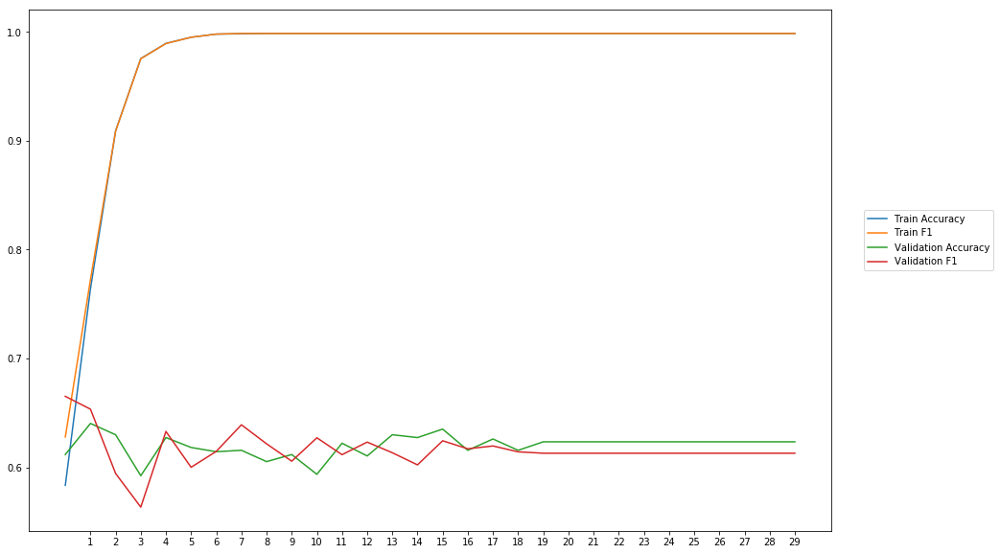

Average Accuracy: 62.00%
Average Precision: 62.34%
Average Recall: 61.20%
Average F1: 61.61%

-----Fold 2--------


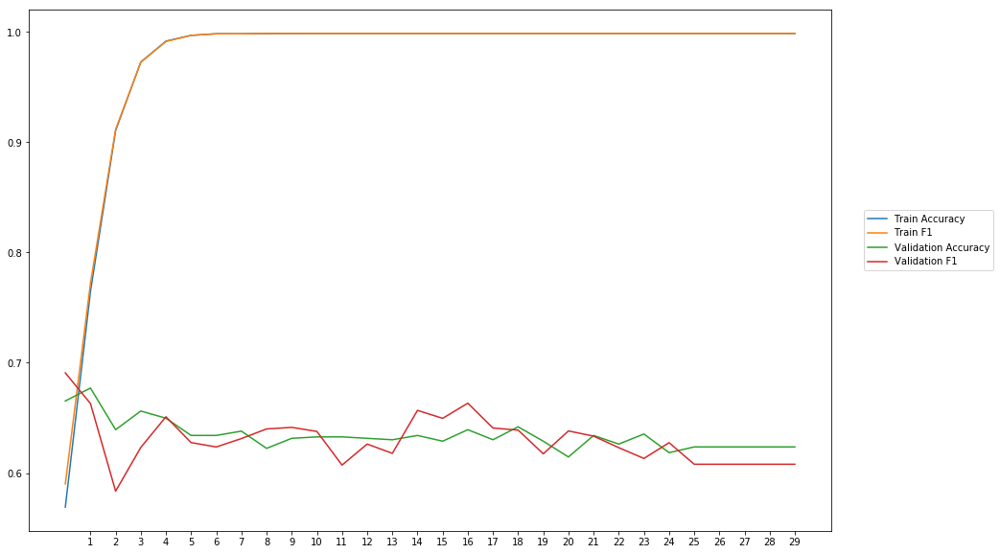

Average Accuracy: 63.42%
Average Precision: 63.56%
Average Recall: 62.77%
Average F1: 63.03%

-----Fold 3--------


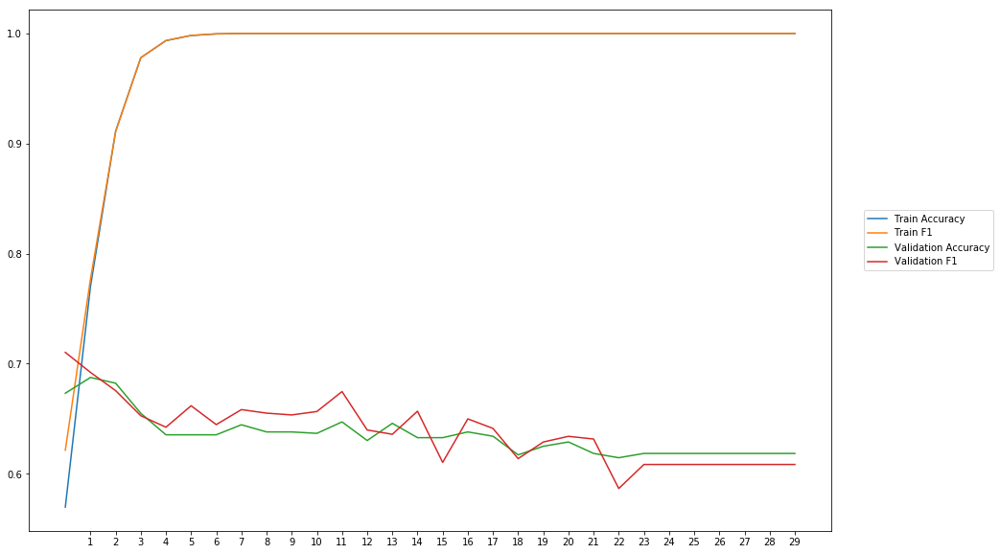

Average Accuracy: 63.52%
Average Precision: 62.85%
Average Recall: 65.15%
Average F1: 63.89%

-----Fold 4--------


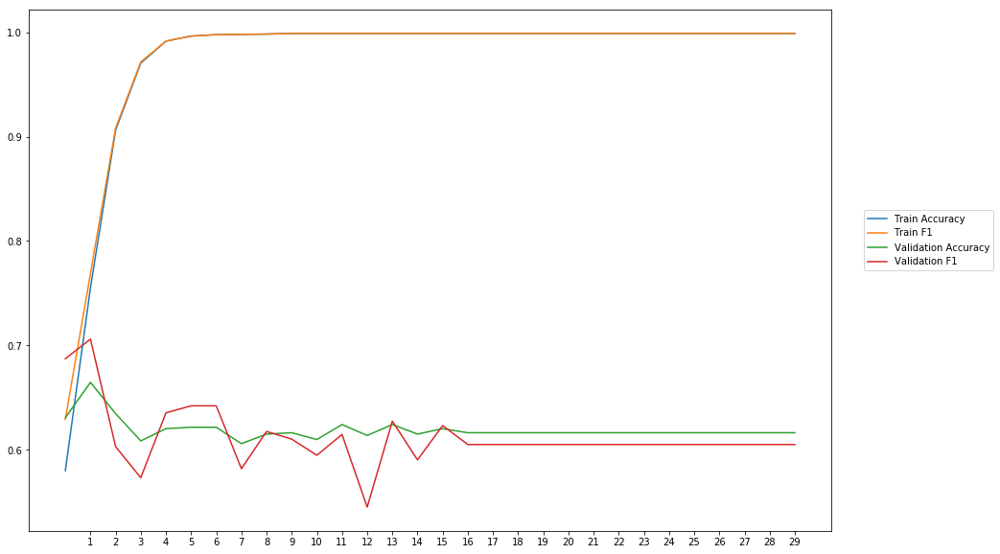

Average Accuracy: 61.90%
Average Precision: 62.58%
Average Recall: 60.38%
Average F1: 61.20%

-----Fold 5--------


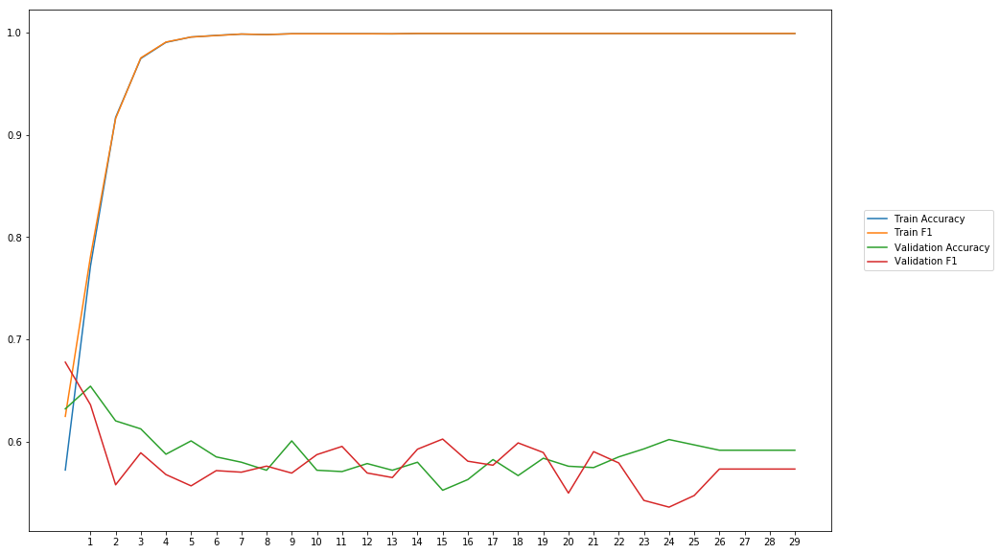

Average Accuracy: 58.85%
Average Precision: 59.12%
Average Recall: 57.21%
Average F1: 57.87%

-----Fold 6--------


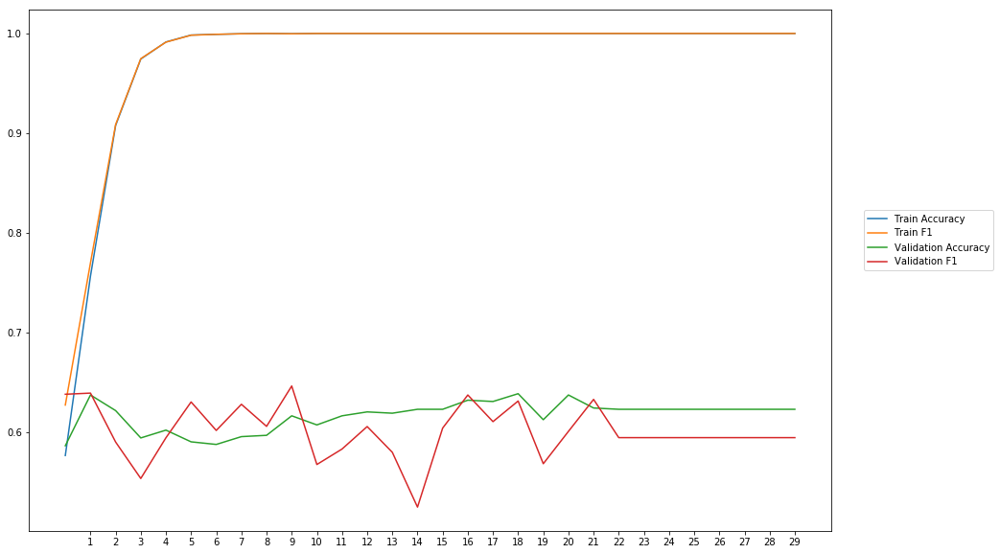

Average Accuracy: 61.63%
Average Precision: 63.01%
Average Recall: 58.08%
Average F1: 60.08%

-----Fold 7--------


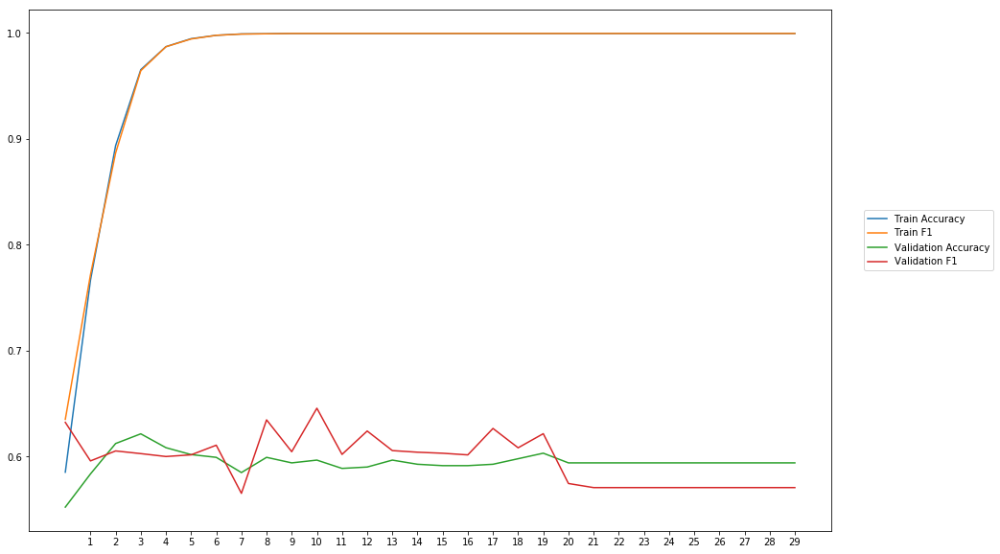

Average Accuracy: 59.46%
Average Precision: 59.14%
Average Recall: 60.63%
Average F1: 59.68%

-----Fold 8--------


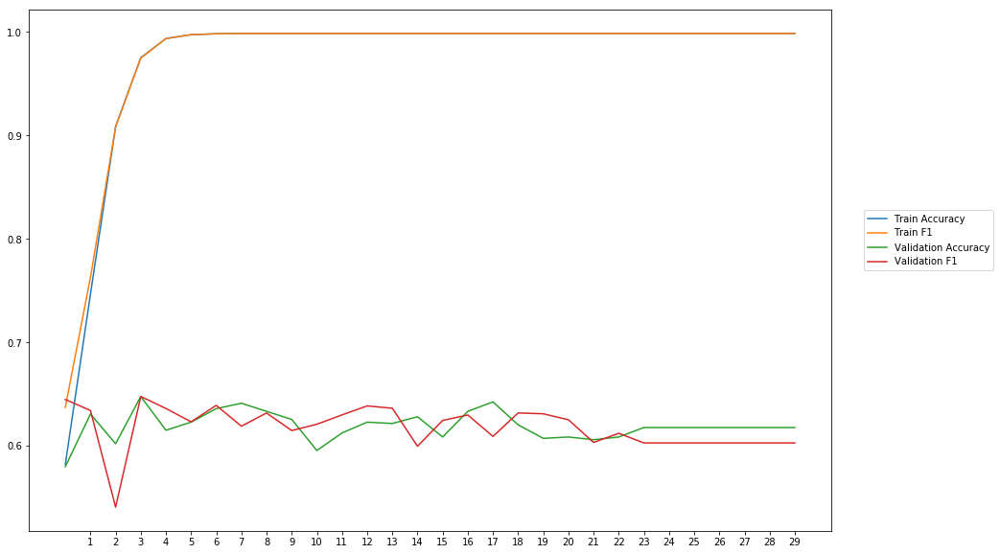

Average Accuracy: 61.89%
Average Precision: 61.18%
Average Recall: 62.79%
Average F1: 61.79%

-----Fold 9--------


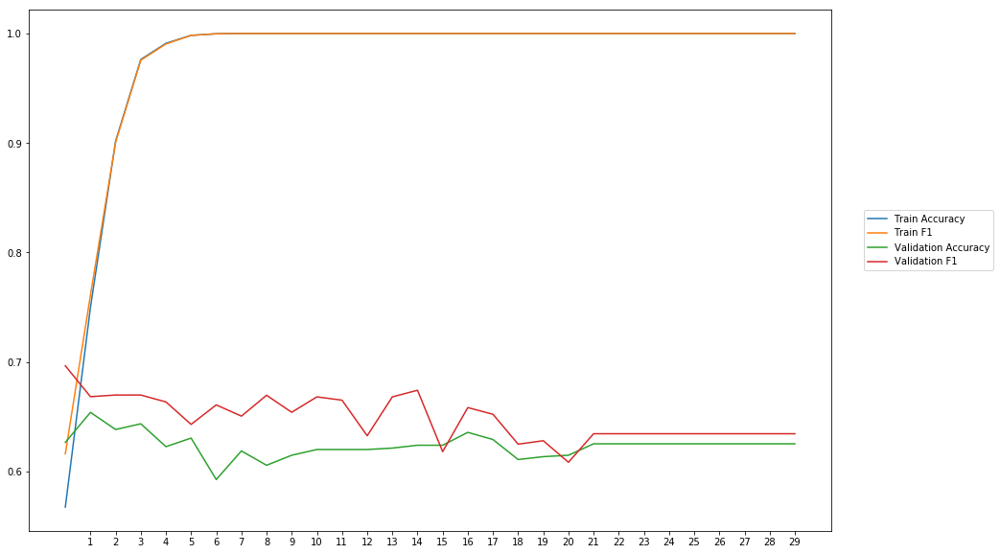

Average Accuracy: 62.37%
Average Precision: 60.72%
Average Recall: 70.00%
Average F1: 64.85%

-----Fold 10--------


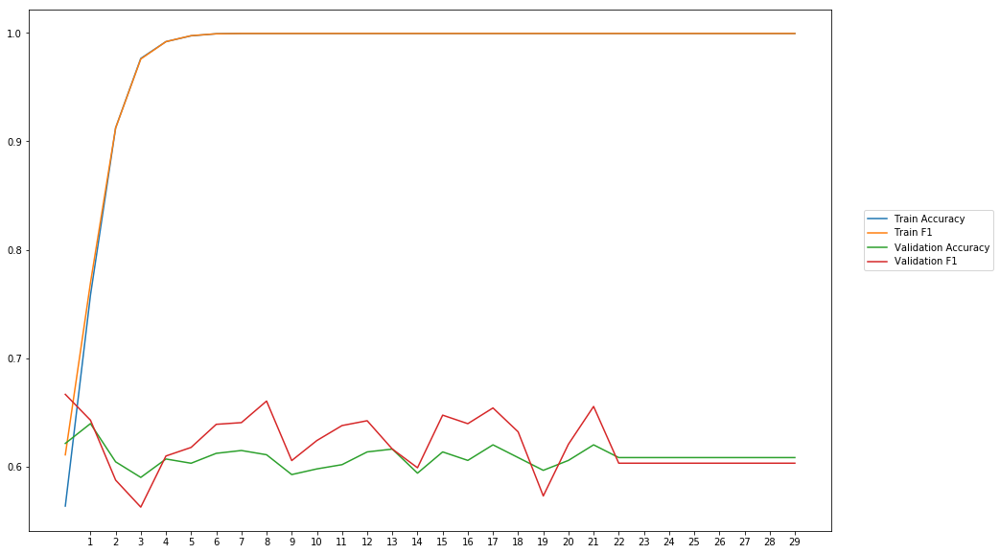

Average Accuracy: 60.86%
Average Precision: 60.08%
Average Recall: 64.38%
Average F1: 62.00%

-------Overallresults-------


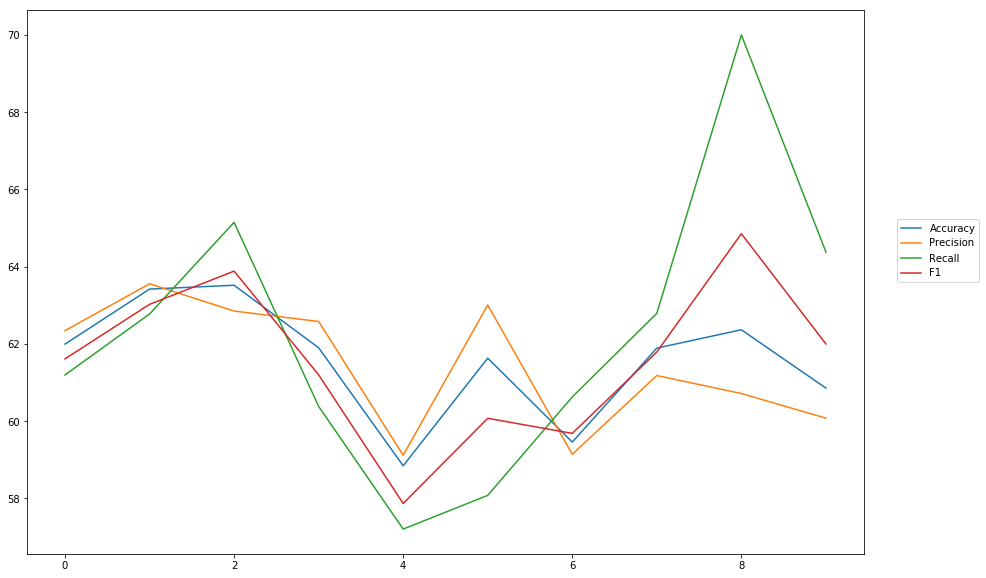

Accuracy: Mean = 61.59% (+/- 1.44%), Max = 63.52%, Min =  58.85%
Precision: Mean = 61.46% (+/- 1.55%), Max = 63.56%, Min =  59.12%
Recall: Mean = 62.26% (+/- 3.52%), Max = 70.00%, Min =  57.21%
F1: Mean = 61.60% (+/- 1.95%), Max = 64.85%, Min =  57.87%


In [31]:
cross_val(model_11, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'output_hard_sigmoid')

In [32]:
wv_layer_12 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_12 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_12 = wv_layer_12(comment_input_12)

#First Dense Layer
x_12 = Dense(600, activation='relu')(embedded_sequences_12)

x_12 = Flatten()(x_12)

#Output (Dense) Layer
preds_12 = Dense(2, activation='tanh')(x_12)

# build the model
model_12 = Model(inputs=[comment_input_12], outputs=preds_12)


-----Fold 1--------


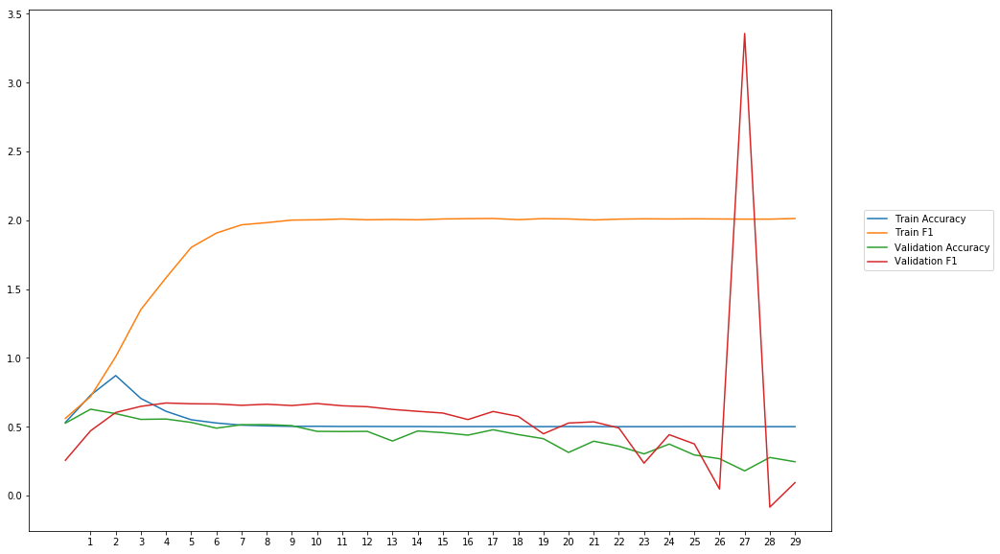

Average Accuracy: 43.05%
Average Precision: 80.68%
Average Recall: 42.14%
Average F1: 59.88%

-----Fold 2--------


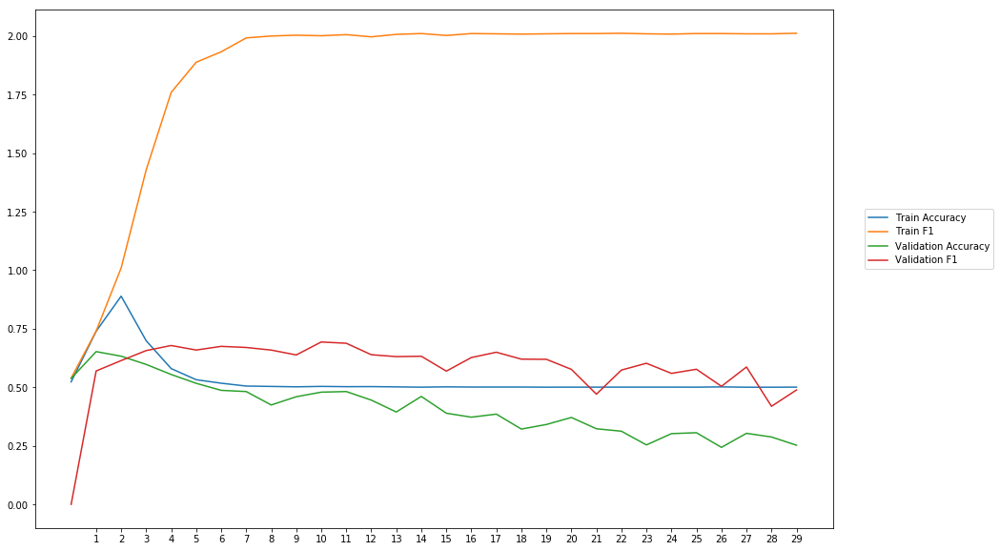

Average Accuracy: 41.24%
Average Precision: 1333333407.15%
Average Recall: 50.61%
Average F1: 58.49%

-----Fold 3--------


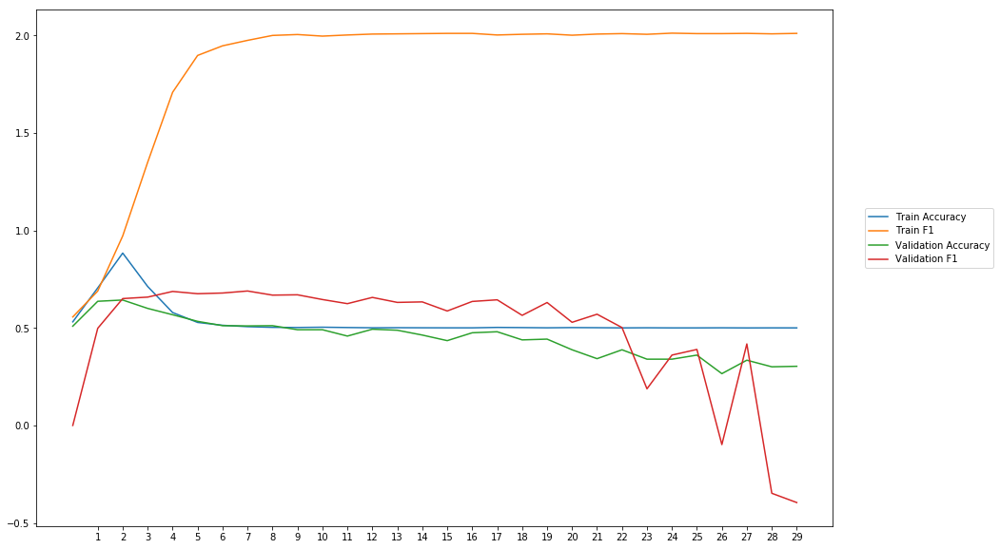

Average Accuracy: 45.15%
Average Precision: 117.12%
Average Recall: 44.89%
Average F1: 47.49%

-----Fold 4--------


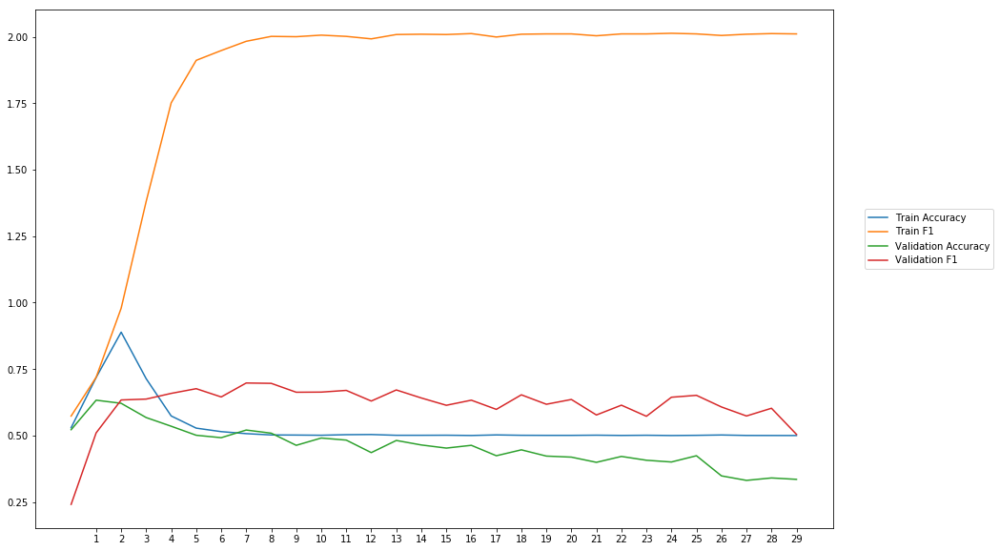

Average Accuracy: 45.87%
Average Precision: 83.68%
Average Recall: 56.02%
Average F1: 61.46%

-----Fold 5--------


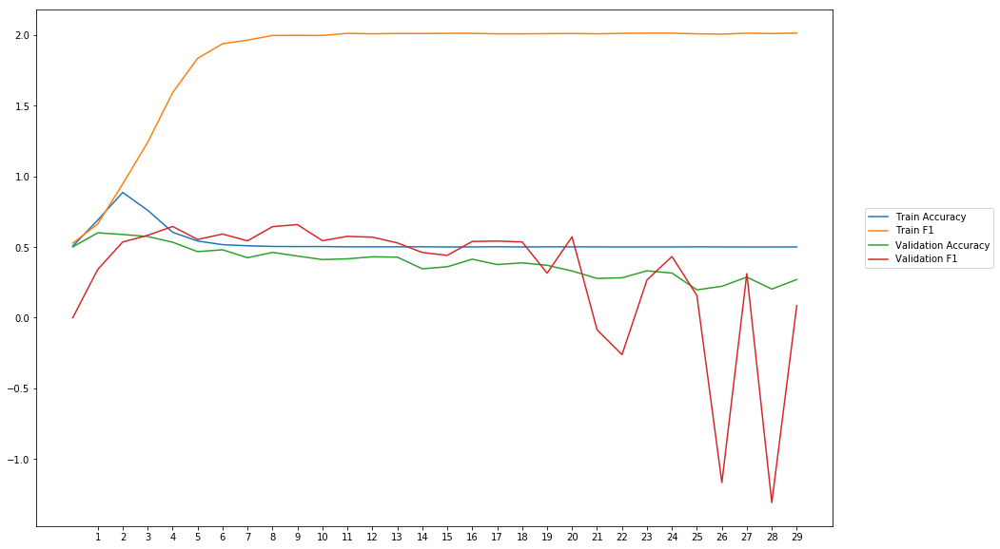

Average Accuracy: 39.09%
Average Precision: 33.27%
Average Recall: 31.73%
Average F1: 30.52%

-----Fold 6--------


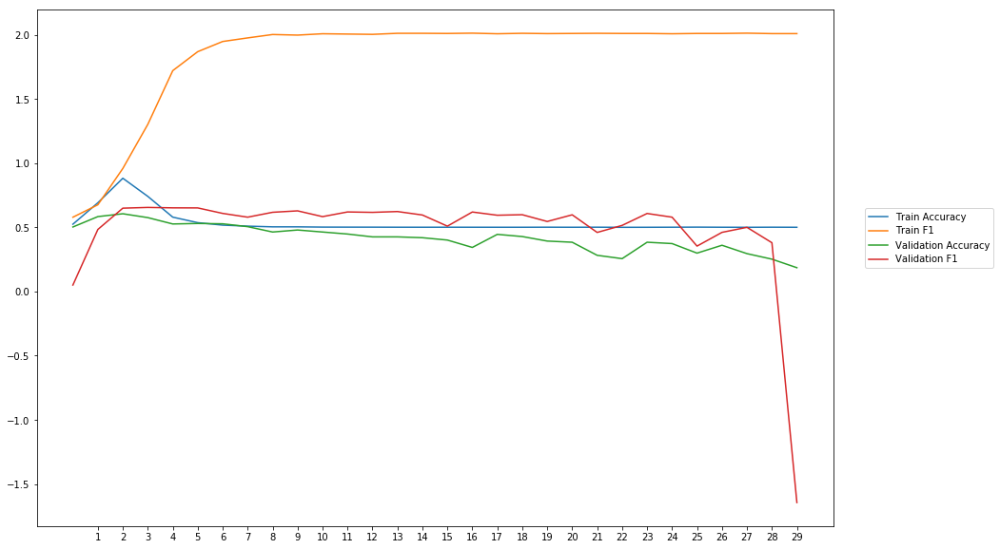

Average Accuracy: 41.87%
Average Precision: 97.66%
Average Recall: 45.60%
Average F1: 47.63%

-----Fold 7--------


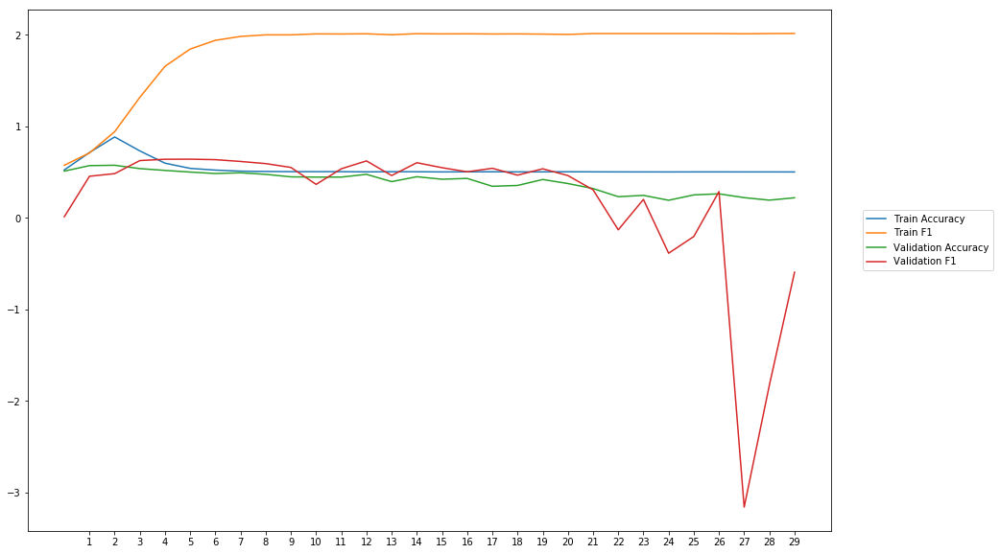

Average Accuracy: 39.20%
Average Precision: 41.26%
Average Recall: 32.98%
Average F1: 17.82%

-----Fold 8--------


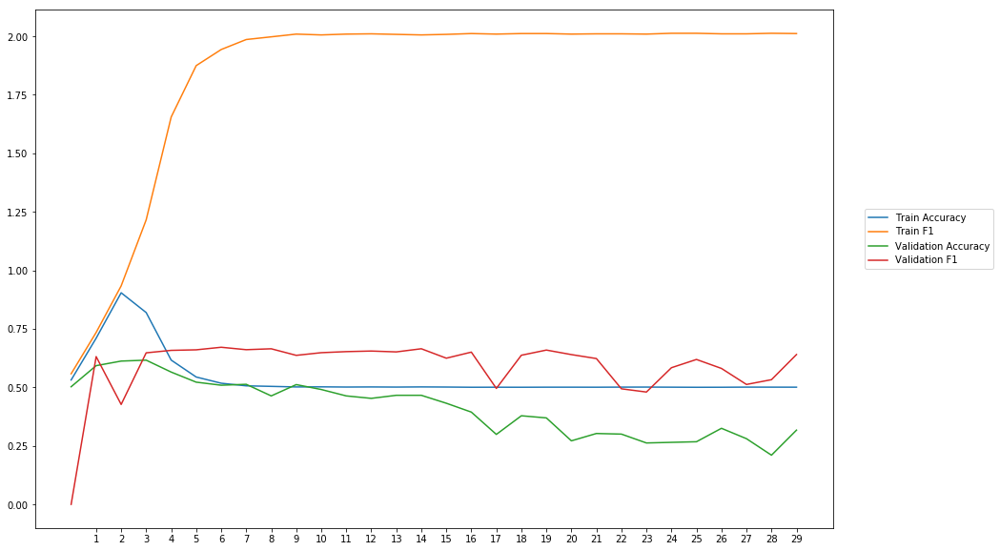

Average Accuracy: 41.41%
Average Precision: 76.36%
Average Recall: 55.65%
Average F1: 59.01%

-----Fold 9--------


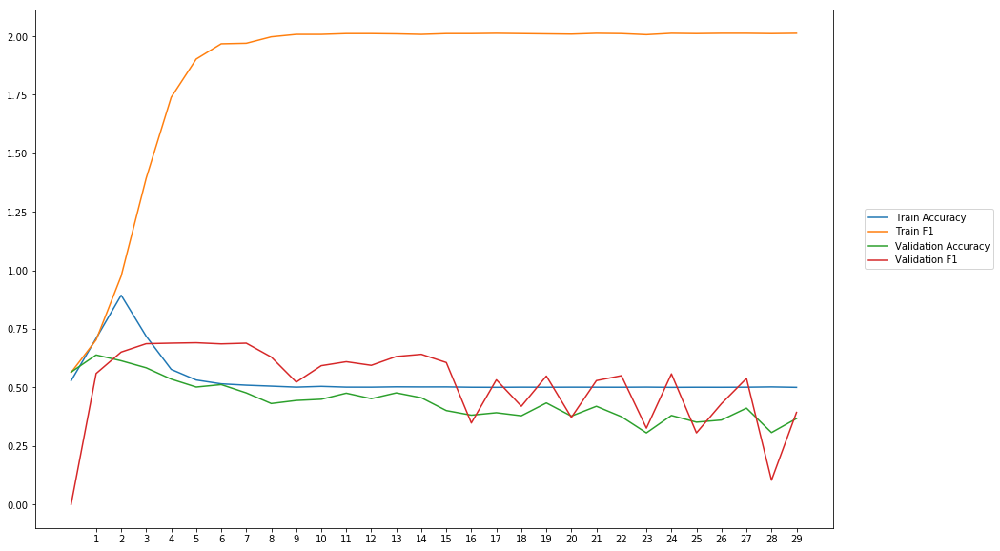

Average Accuracy: 44.16%
Average Precision: 79.13%
Average Recall: 45.67%
Average F1: 51.43%

-----Fold 10--------


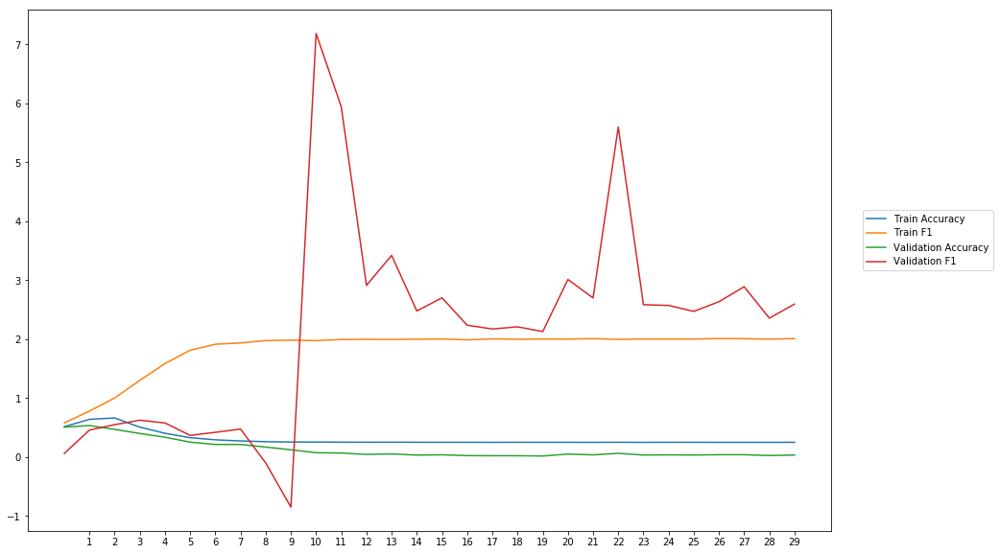

Average Accuracy: 13.32%
Average Precision: 52.99%
Average Recall: -38.90%
Average F1: 217.89%

-------Overallresults-------


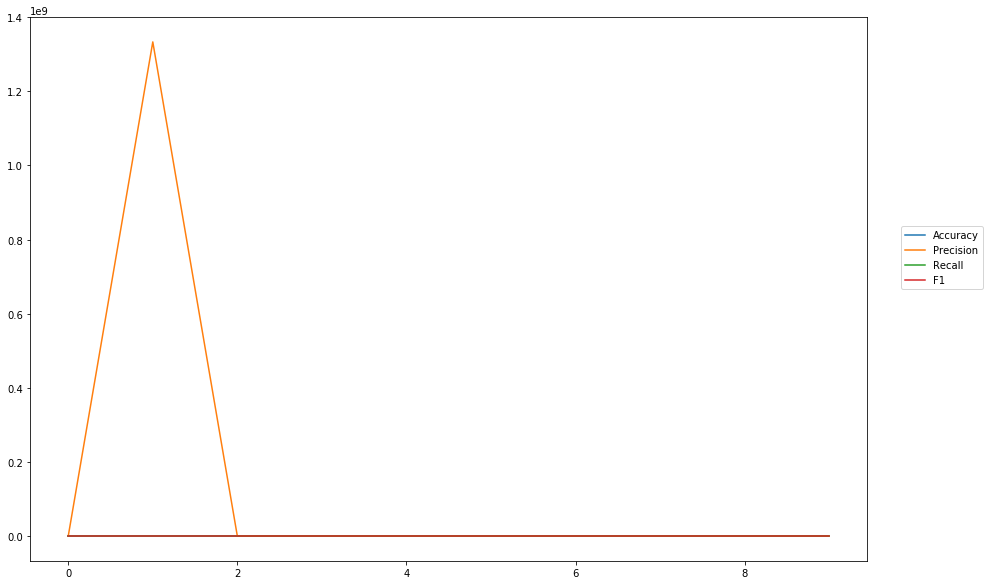

Accuracy: Mean = 39.44% (+/- 8.97%), Max = 45.87%, Min =  13.32%
Precision: Mean = 133333406.93% (+/- 400000000.07%), Max = 1333333407.15%, Min =  33.27%
Recall: Mean = 36.64% (+/- 26.34%), Max = 56.02%, Min =  -38.90%
F1: Mean = 65.16% (+/- 52.63%), Max = 217.89%, Min =  17.82%


In [33]:
cross_val(model_12, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'output_tanh')

In [34]:
wv_layer_13 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_13 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_13 = wv_layer_13(comment_input_13)

#First Dense Layer
x_13 = Dense(600, activation='relu')(embedded_sequences_13)

x_13 = Flatten()(x_13)

#Output (Dense) Layer
preds_13 = Dense(2, activation='relu')(x_13)

# build the model
model_13 = Model(inputs=[comment_input_13], outputs=preds_13)


-----Fold 1--------


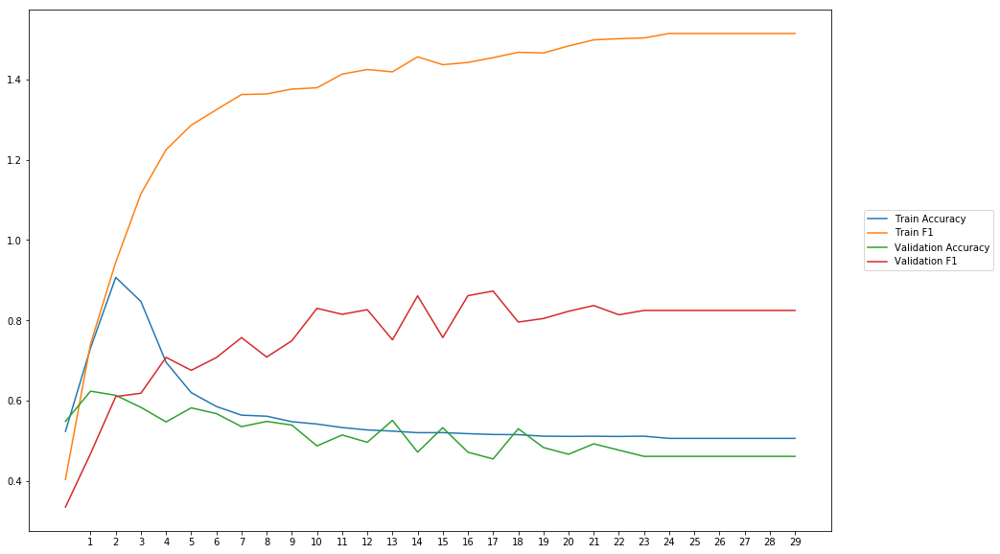

Average Accuracy: 51.13%
Average Precision: 65.58%
Average Recall: 96.34%
Average F1: 75.84%

-----Fold 2--------


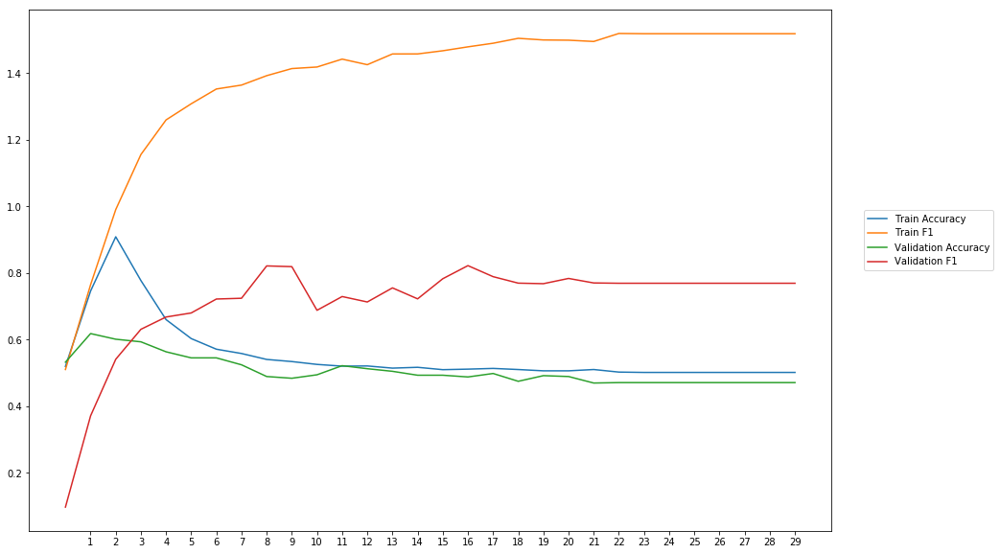

Average Accuracy: 50.69%
Average Precision: 63.09%
Average Recall: 89.69%
Average F1: 71.11%

-----Fold 3--------


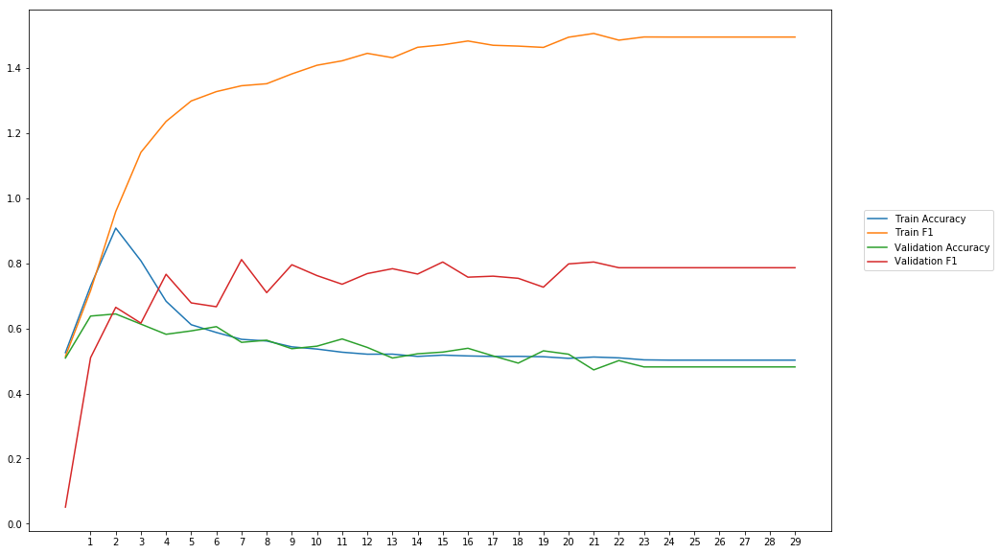

Average Accuracy: 53.35%
Average Precision: 68.99%
Average Recall: 82.79%
Average F1: 72.62%

-----Fold 4--------


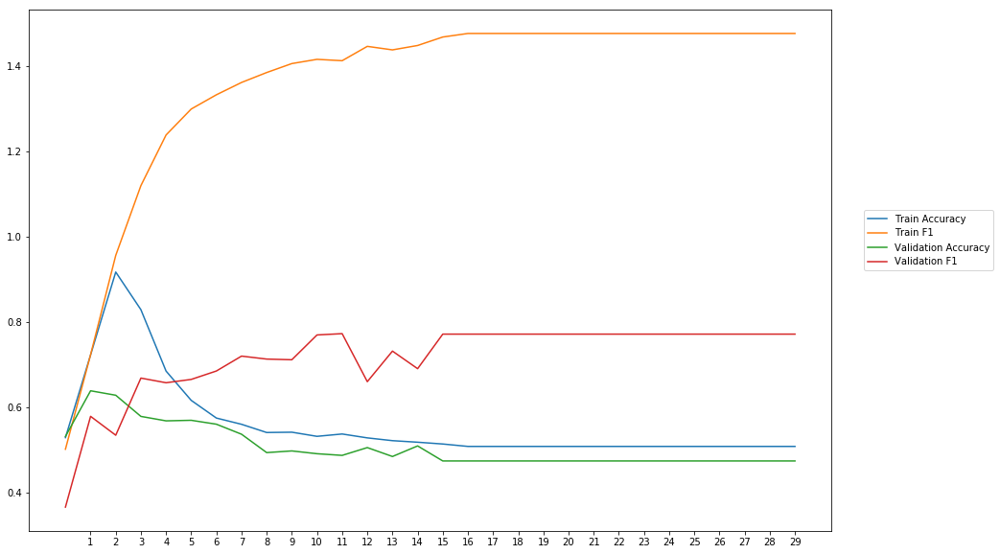

Average Accuracy: 50.62%
Average Precision: 64.40%
Average Recall: 83.77%
Average F1: 71.62%

-----Fold 5--------


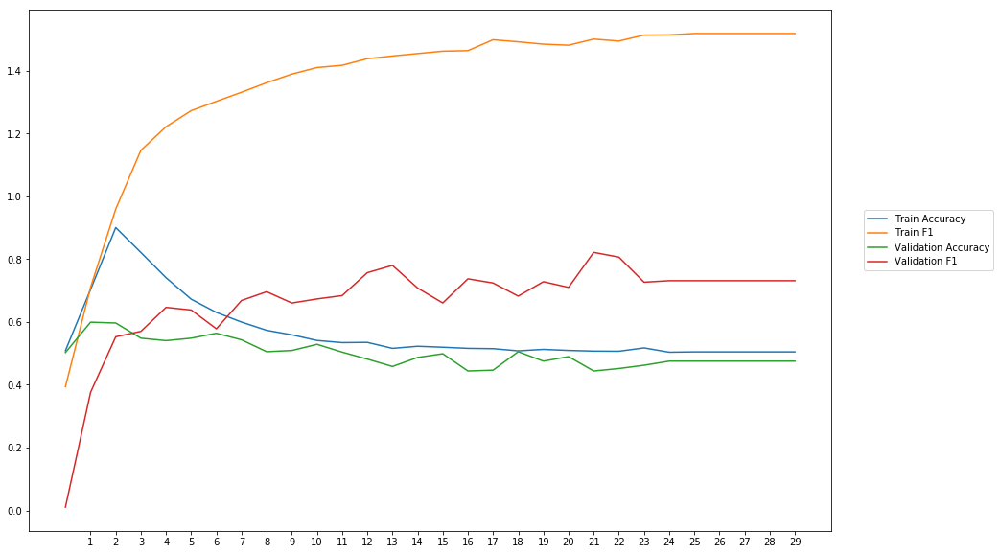

Average Accuracy: 49.95%
Average Precision: 63.19%
Average Recall: 79.63%
Average F1: 66.60%

-----Fold 6--------


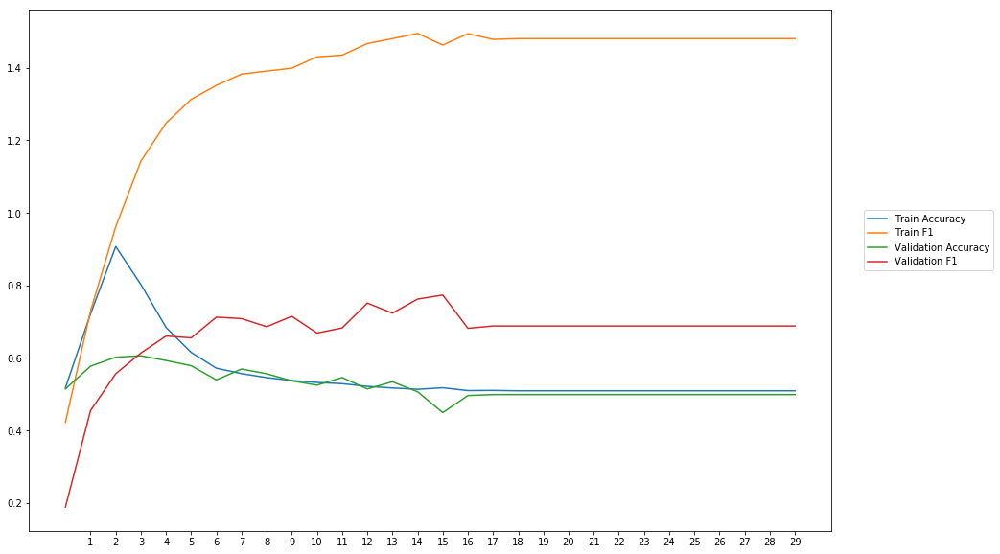

Average Accuracy: 52.42%
Average Precision: 63.30%
Average Recall: 73.11%
Average F1: 66.44%

-----Fold 7--------


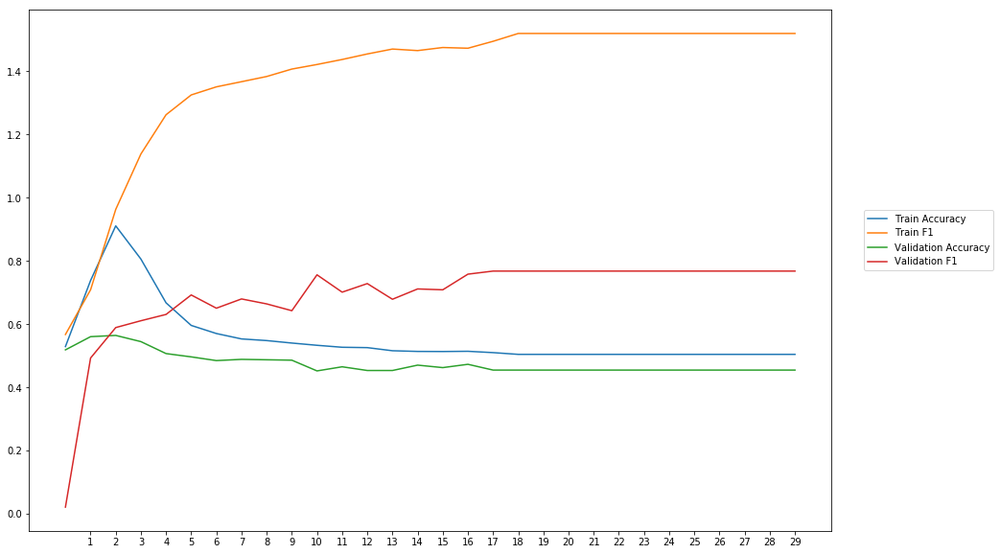

Average Accuracy: 47.56%
Average Precision: 59.93%
Average Recall: 90.28%
Average F1: 68.96%

-----Fold 8--------


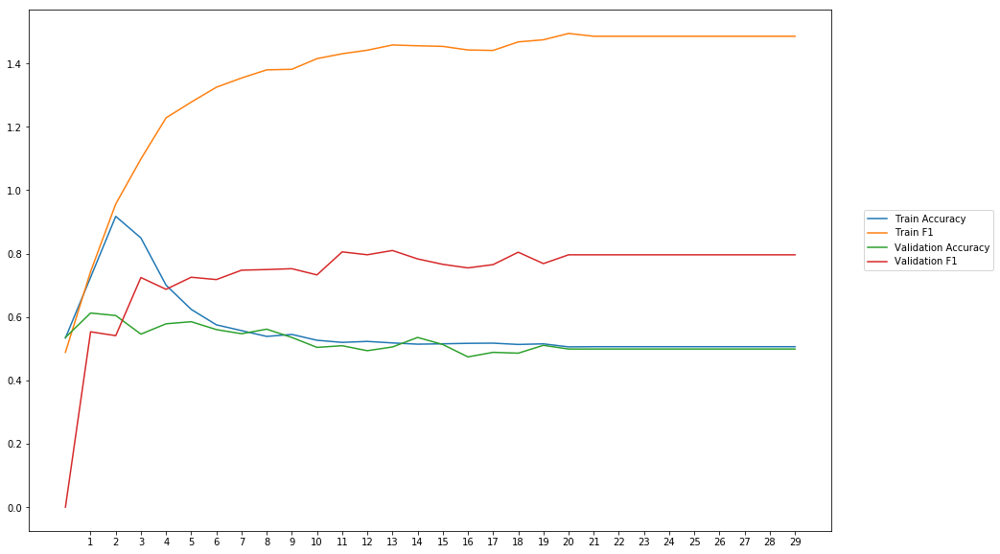

Average Accuracy: 52.23%
Average Precision: 62.99%
Average Recall: 89.39%
Average F1: 73.14%

-----Fold 9--------


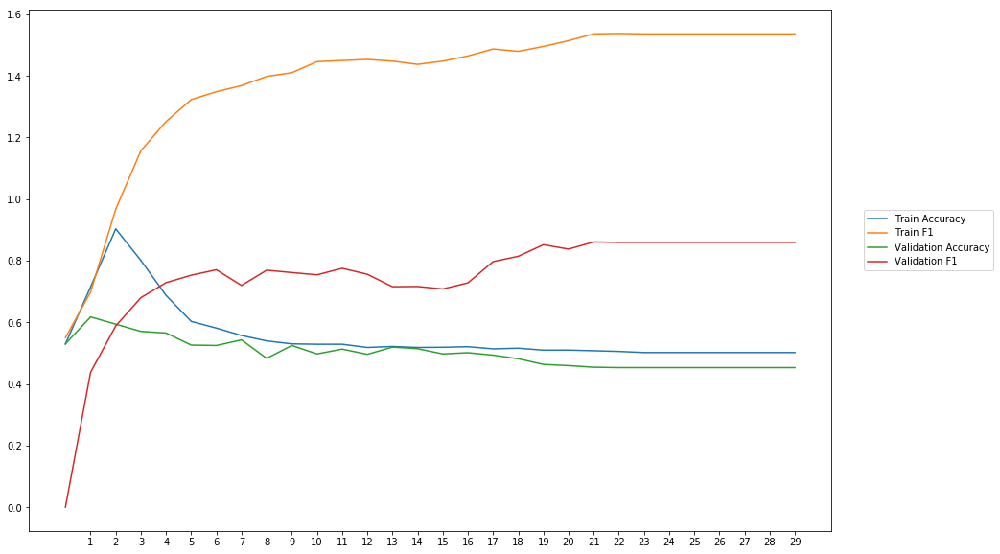

Average Accuracy: 49.98%
Average Precision: 60.26%
Average Recall: 103.96%
Average F1: 74.67%

-----Fold 10--------


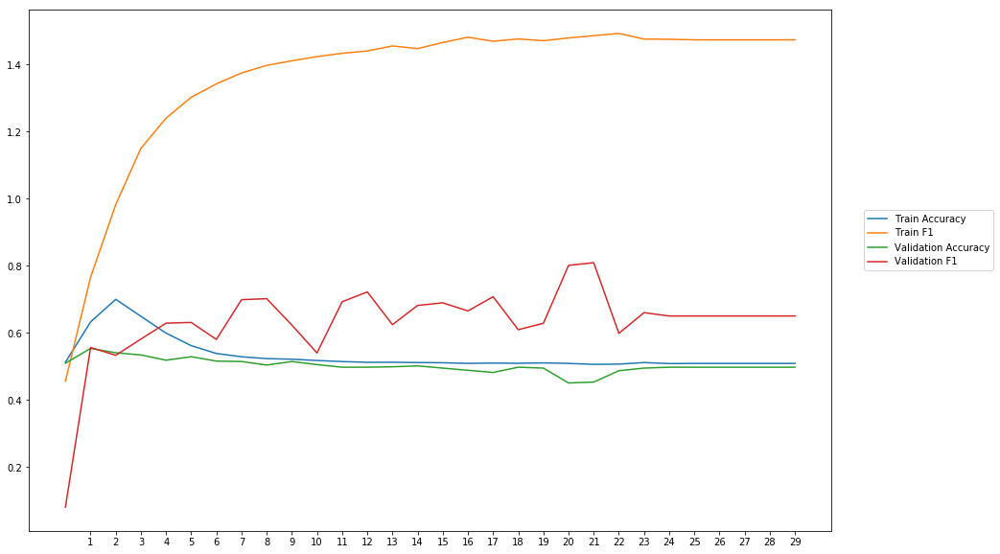

Average Accuracy: 50.20%
Average Precision: 60.80%
Average Recall: 71.41%
Average F1: 63.15%

-------Overallresults-------


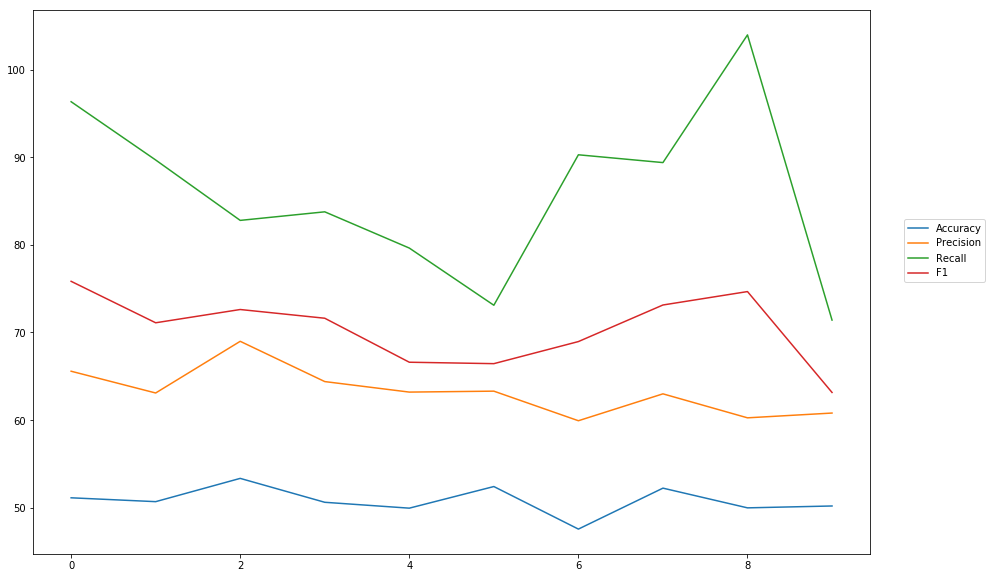

Accuracy: Mean = 50.81% (+/- 1.53%), Max = 53.35%, Min =  47.56%
Precision: Mean = 63.25% (+/- 2.56%), Max = 68.99%, Min =  59.93%
Recall: Mean = 86.04% (+/- 9.53%), Max = 103.96%, Min =  71.41%
F1: Mean = 70.41% (+/- 3.83%), Max = 75.84%, Min =  63.15%


In [35]:
cross_val(model_13, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'output_relu')

In [36]:
wv_layer_14 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_14 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_14 = wv_layer_14(comment_input_14)

#First Dense Layer
x_14 = Dense(600, activation='relu')(embedded_sequences_14)

x_14 = Flatten()(x_14)

#Output (Dense) Layer
preds_14 = Dense(2, activation='elu')(x_14)

# build the model
model_14 = Model(inputs=[comment_input_14], outputs=preds_14)


-----Fold 1--------


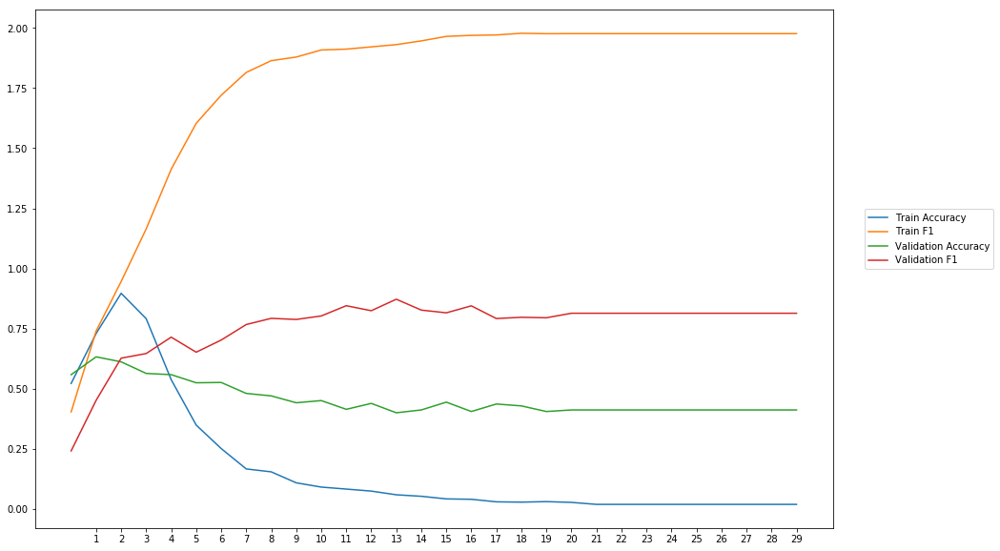

Average Accuracy: 45.73%
Average Precision: 71.03%
Average Recall: 87.22%
Average F1: 75.78%

-----Fold 2--------


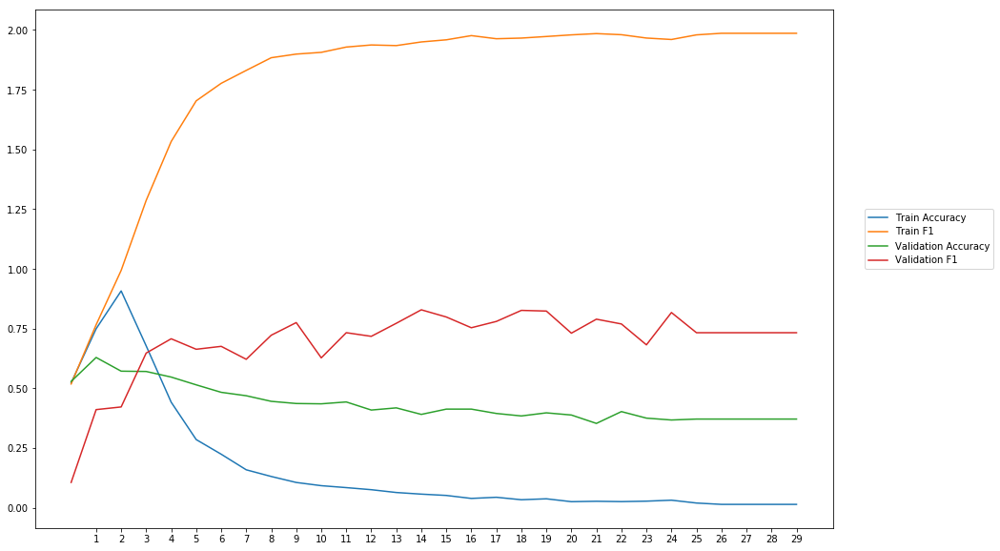

Average Accuracy: 43.44%
Average Precision: 68.72%
Average Recall: 77.09%
Average F1: 69.53%

-----Fold 3--------


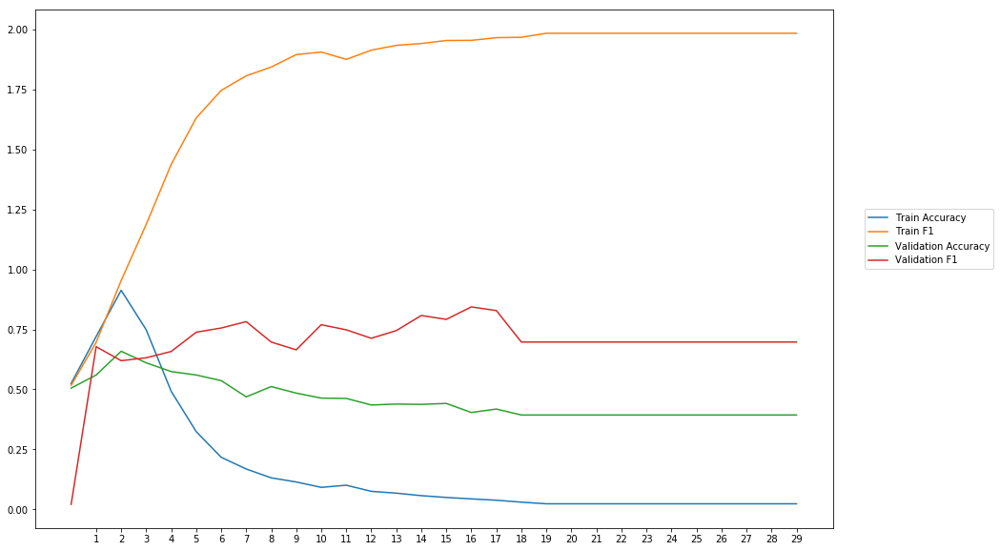

Average Accuracy: 45.63%
Average Precision: 75.74%
Average Recall: 70.89%
Average F1: 69.53%

-----Fold 4--------


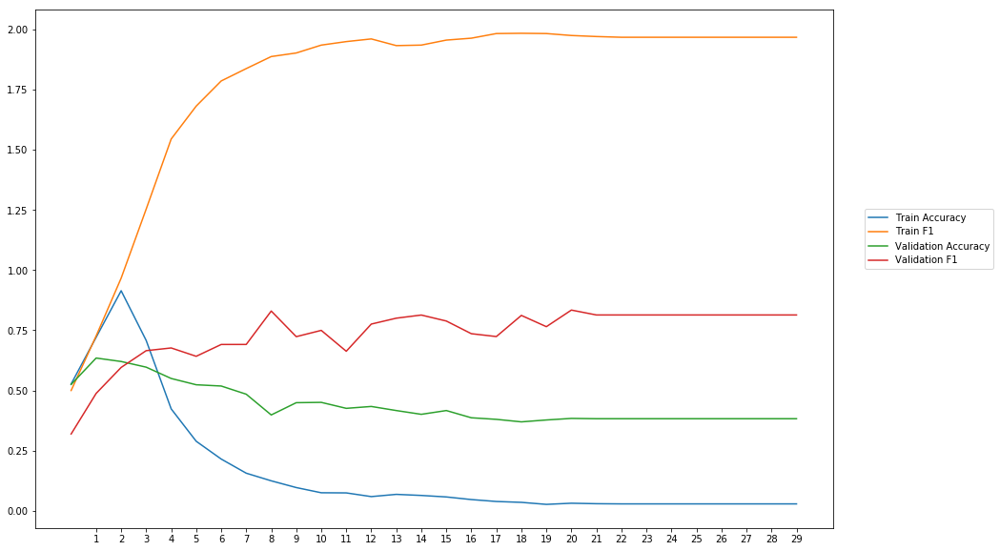

Average Accuracy: 43.94%
Average Precision: 71.19%
Average Recall: 81.05%
Average F1: 73.66%

-----Fold 5--------


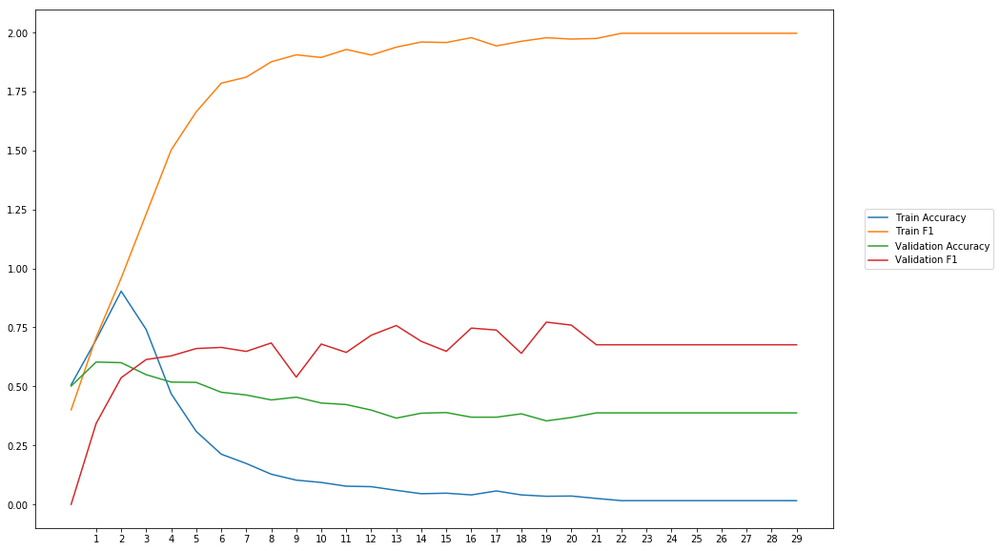

Average Accuracy: 42.84%
Average Precision: 66.49%
Average Recall: 65.55%
Average F1: 64.01%

-----Fold 6--------


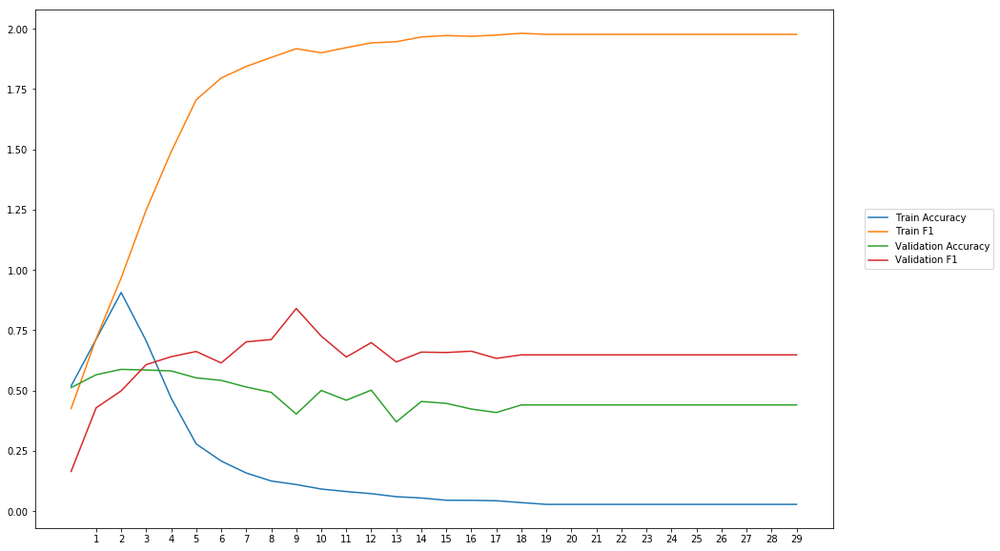

Average Accuracy: 47.25%
Average Precision: 69.08%
Average Recall: 61.10%
Average F1: 63.10%

-----Fold 7--------


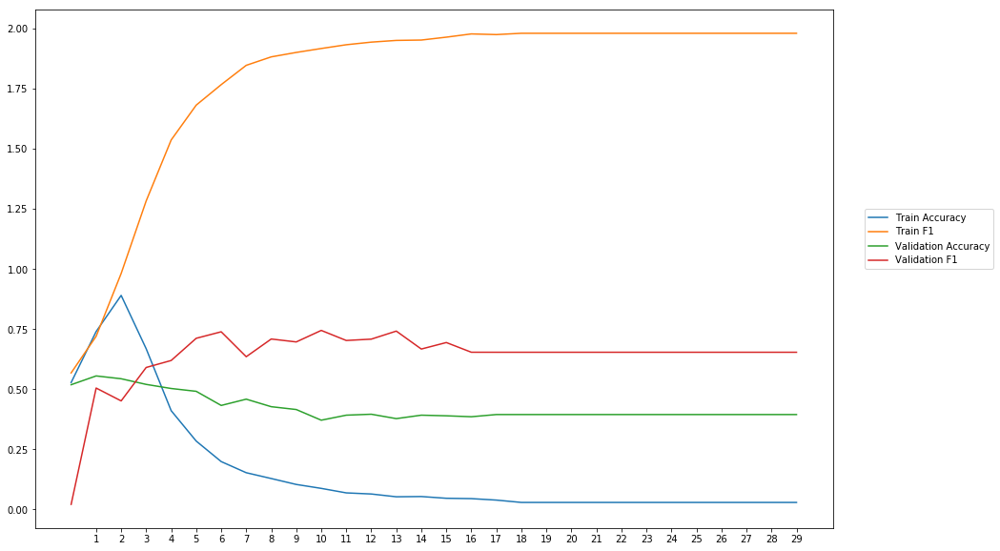

Average Accuracy: 42.29%
Average Precision: 61.92%
Average Recall: 71.55%
Average F1: 63.59%

-----Fold 8--------


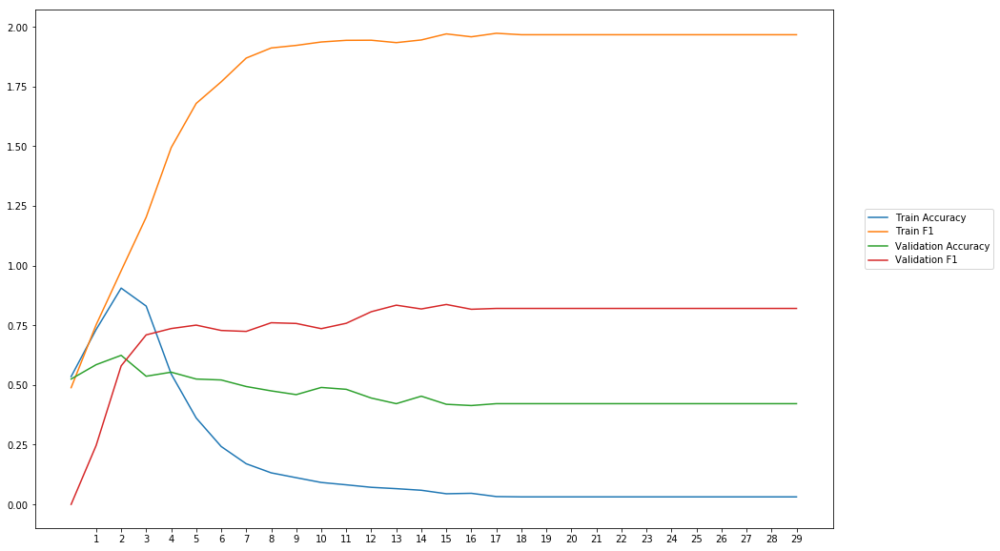

Average Accuracy: 46.34%
Average Precision: 67.81%
Average Recall: 85.34%
Average F1: 74.22%

-----Fold 9--------


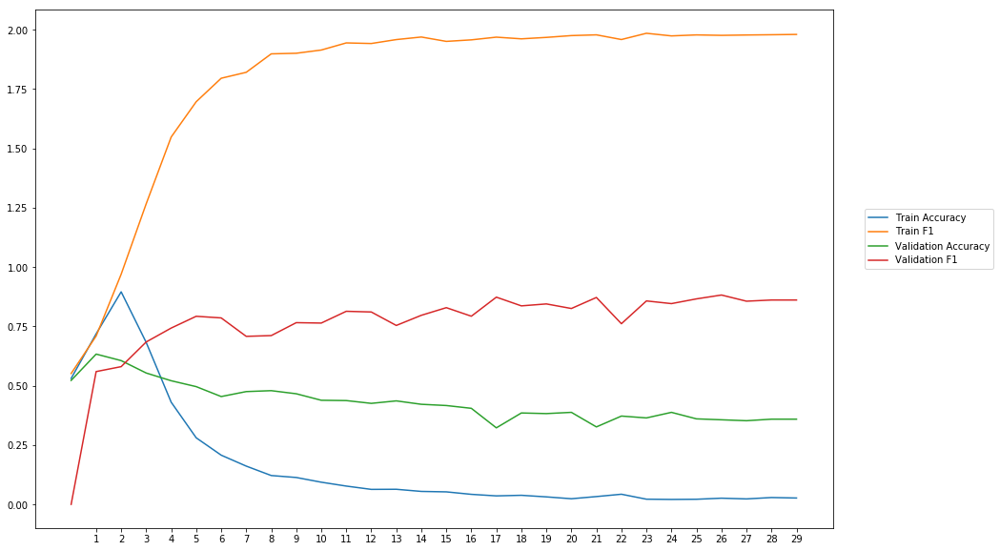

Average Accuracy: 43.01%
Average Precision: 63.91%
Average Recall: 98.99%
Average F1: 76.43%

-----Fold 10--------


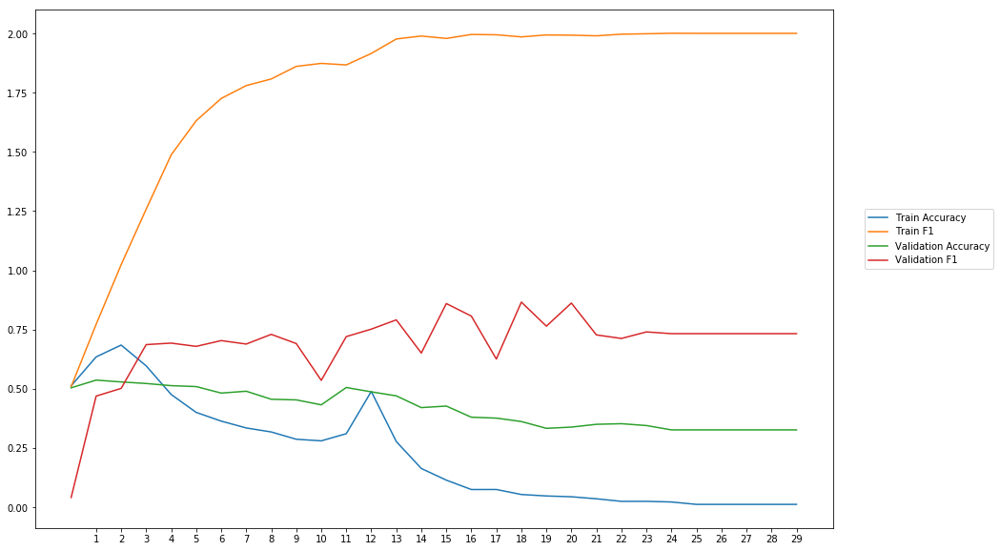

Average Accuracy: 41.76%
Average Precision: 65.19%
Average Recall: 81.36%
Average F1: 68.96%

-------Overallresults-------


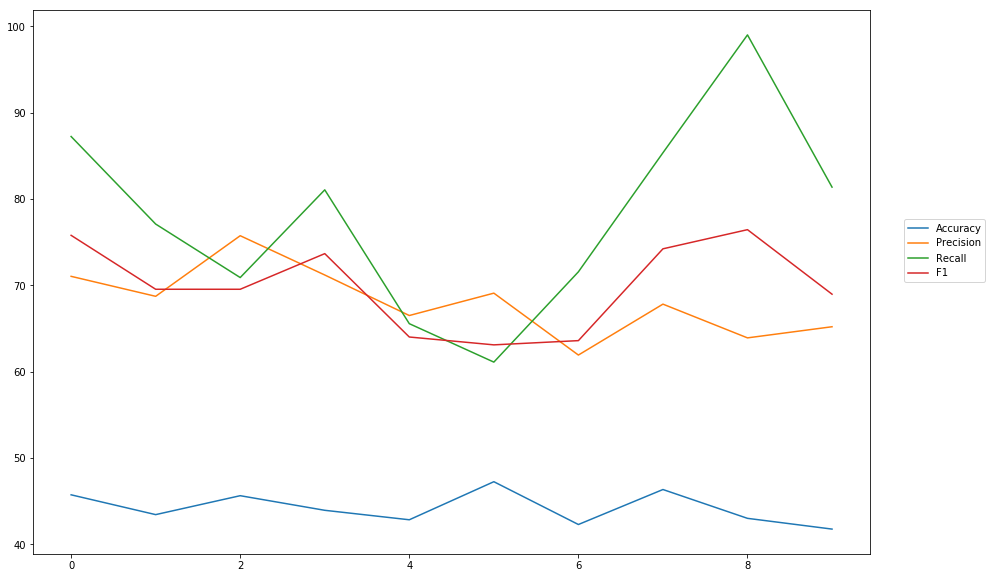

Accuracy: Mean = 44.22% (+/- 1.78%), Max = 47.25%, Min =  41.76%
Precision: Mean = 68.11% (+/- 3.80%), Max = 75.74%, Min =  61.92%
Recall: Mean = 78.01% (+/- 10.65%), Max = 98.99%, Min =  61.10%
F1: Mean = 69.88% (+/- 4.82%), Max = 76.43%, Min =  63.10%


In [37]:
cross_val(model_14, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'output_elu')

In [38]:
wv_layer_15 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_15 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_15 = wv_layer_15(comment_input_15)

#First Dense Layer
x_15 = Dense(600, activation='relu')(embedded_sequences_15)

x_15 = Flatten()(x_15)

#Output (Dense) Layer
preds_15 = Dense(2, activation='selu')(x_15)

# build the model
model_15 = Model(inputs=[comment_input_15], outputs=preds_15)


-----Fold 1--------


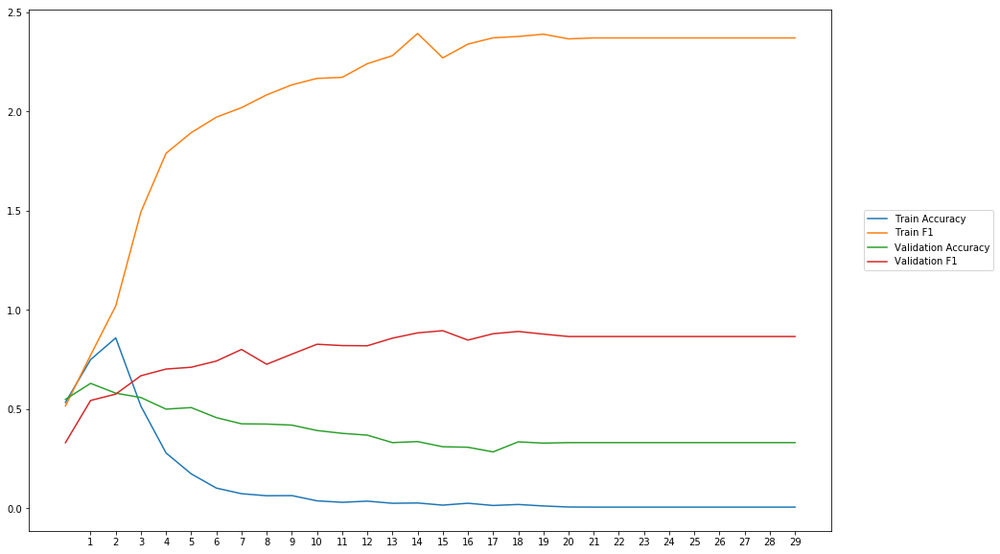

Average Accuracy: 39.13%
Average Precision: 77.76%
Average Recall: 84.90%
Average F1: 79.48%

-----Fold 2--------


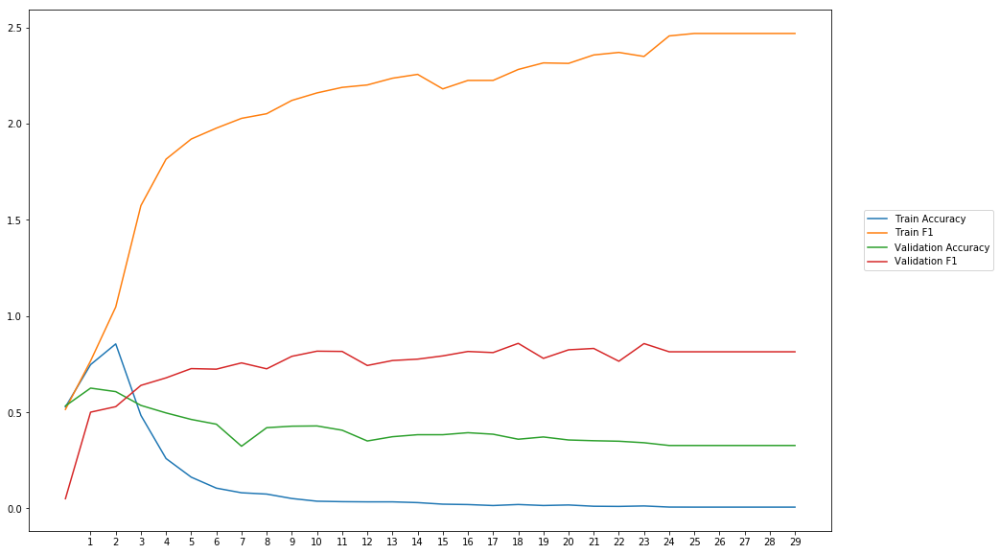

Average Accuracy: 40.18%
Average Precision: 77.49%
Average Recall: 76.81%
Average F1: 74.18%

-----Fold 3--------


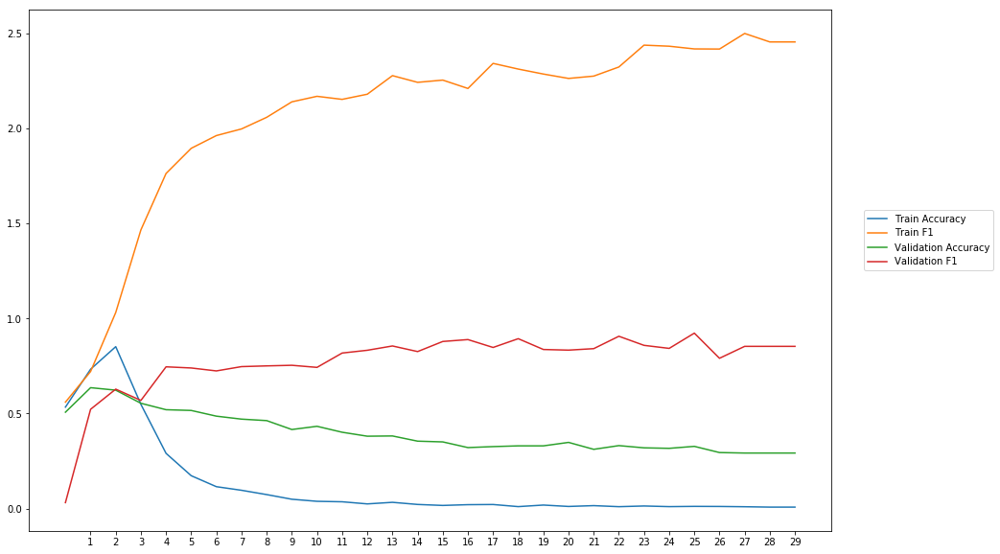

Average Accuracy: 39.70%
Average Precision: 82.50%
Average Recall: 81.97%
Average F1: 77.24%

-----Fold 4--------


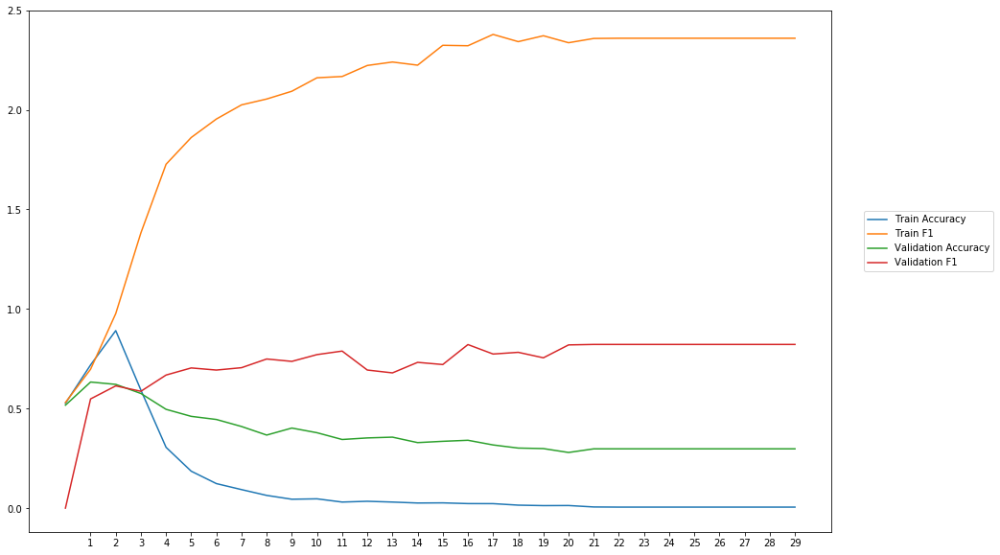

Average Accuracy: 37.47%
Average Precision: 74.71%
Average Recall: 73.00%
Average F1: 72.47%

-----Fold 5--------


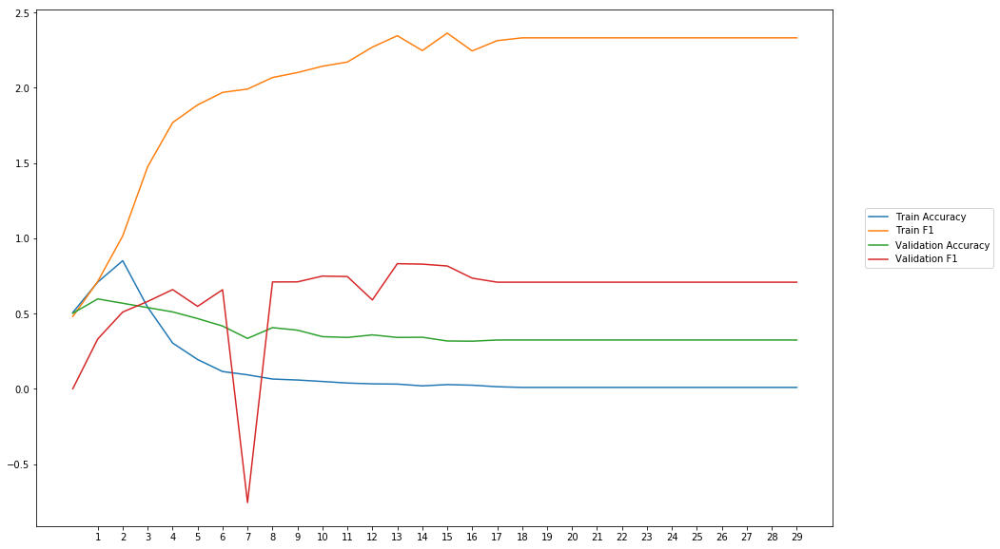

Average Accuracy: 37.65%
Average Precision: 66.32%
Average Recall: 66.44%
Average F1: 61.47%

-----Fold 6--------


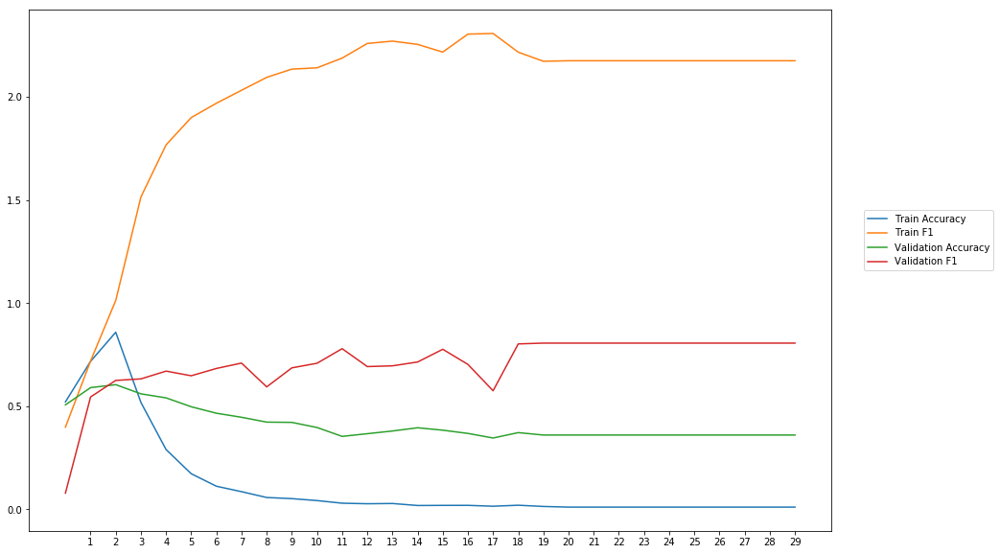

Average Accuracy: 41.28%
Average Precision: 77.62%
Average Recall: 69.32%
Average F1: 70.60%

-----Fold 7--------


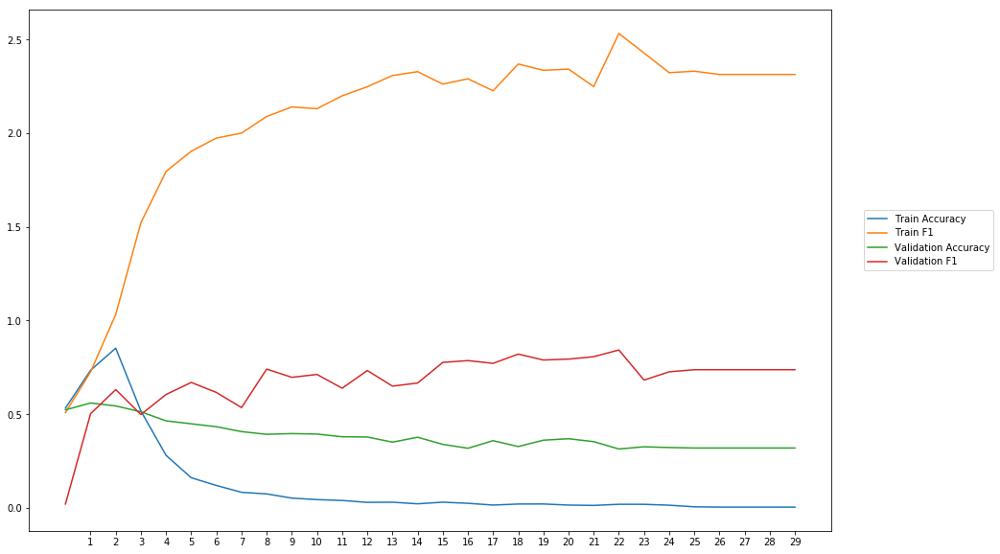

Average Accuracy: 38.53%
Average Precision: 64.64%
Average Recall: 81.19%
Average F1: 68.03%

-----Fold 8--------


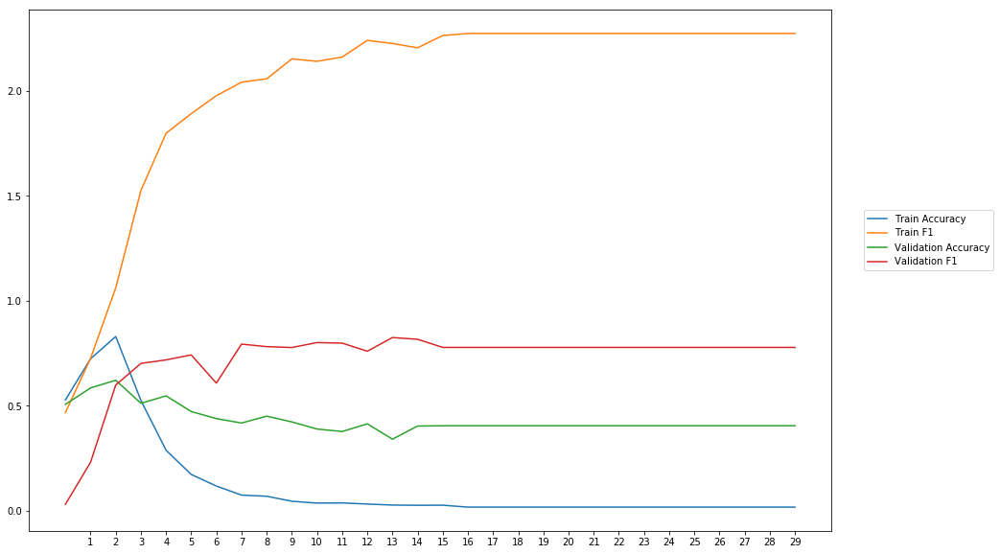

Average Accuracy: 43.23%
Average Precision: 76.19%
Average Recall: 74.83%
Average F1: 72.16%

-----Fold 9--------


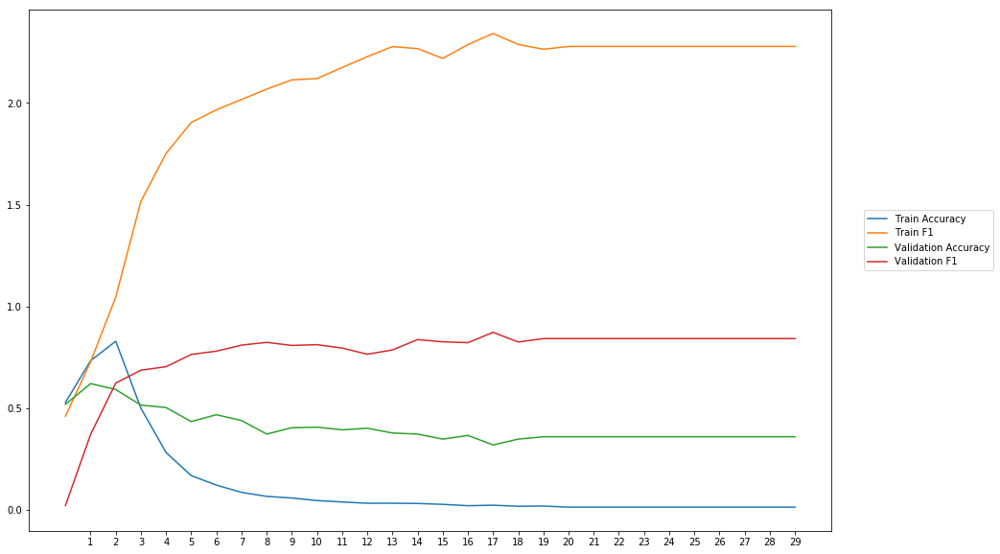

Average Accuracy: 40.46%
Average Precision: 71.05%
Average Recall: 92.13%
Average F1: 76.60%

-----Fold 10--------


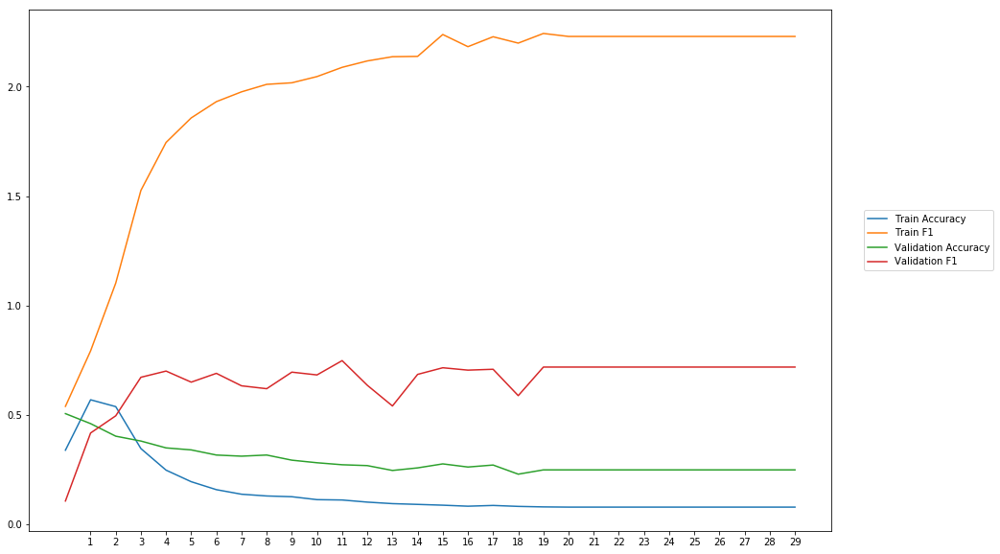

Average Accuracy: 29.19%
Average Precision: 67.33%
Average Recall: 67.07%
Average F1: 65.26%

-------Overallresults-------


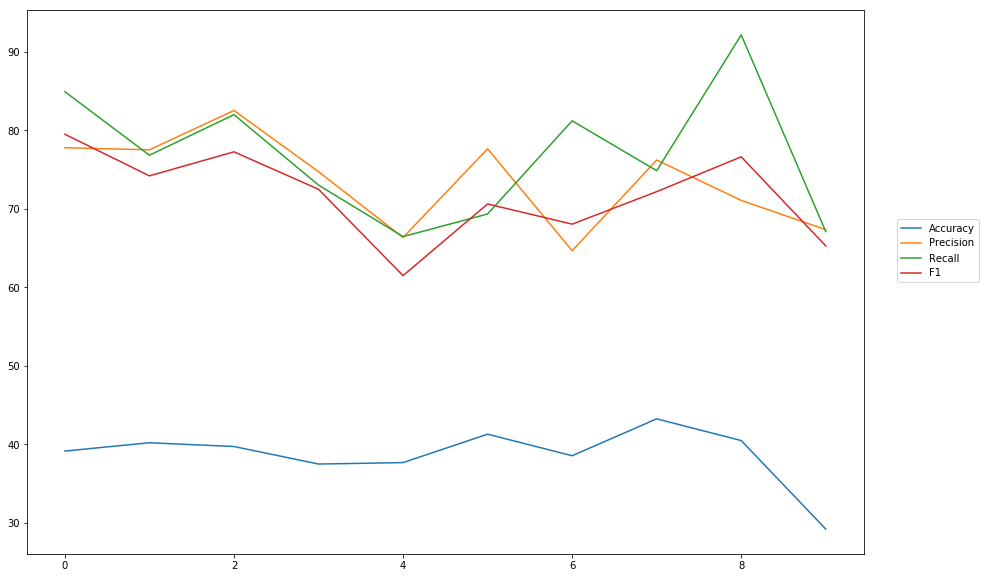

Accuracy: Mean = 38.68% (+/- 3.56%), Max = 43.23%, Min =  29.19%
Precision: Mean = 73.56% (+/- 5.61%), Max = 82.50%, Min =  64.64%
Recall: Mean = 76.77% (+/- 7.89%), Max = 92.13%, Min =  66.44%
F1: Mean = 71.75% (+/- 5.32%), Max = 79.48%, Min =  61.47%


In [39]:
cross_val(model_15, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'output_selu')

In [40]:
wv_layer_16 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_16 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_16 = wv_layer_16(comment_input_16)

#First Dense Layer
x_16 = Dense(600, activation='relu')(embedded_sequences_16)

x_16 = Flatten()(x_16)

#Output (Dense) Layer
preds_16 = Dense(2, activation='softplus')(x_16)

# build the model
model_16 = Model(inputs=[comment_input_16], outputs=preds_16)


-----Fold 1--------


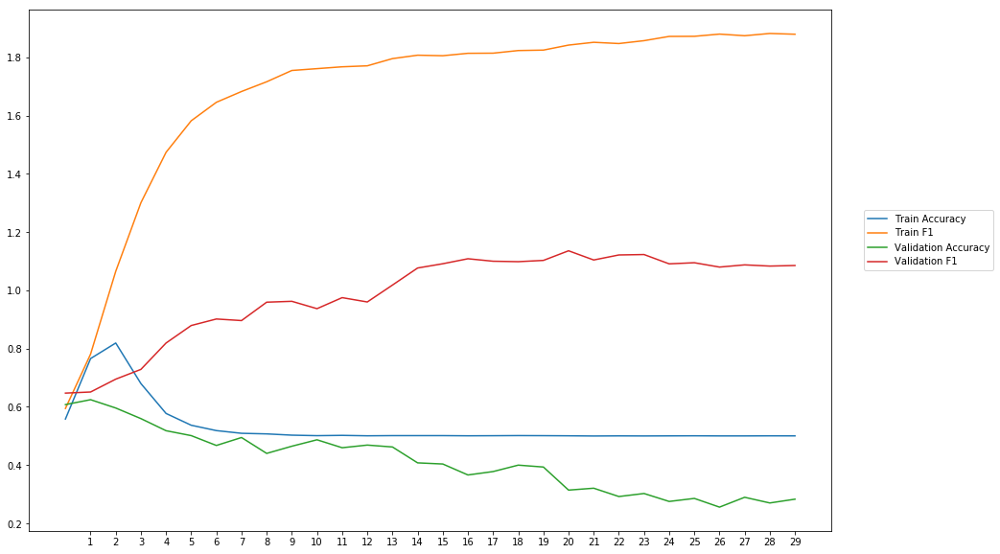

Average Accuracy: 41.31%
Average Precision: 68.11%
Average Recall: 281.79%
Average F1: 98.72%

-----Fold 2--------


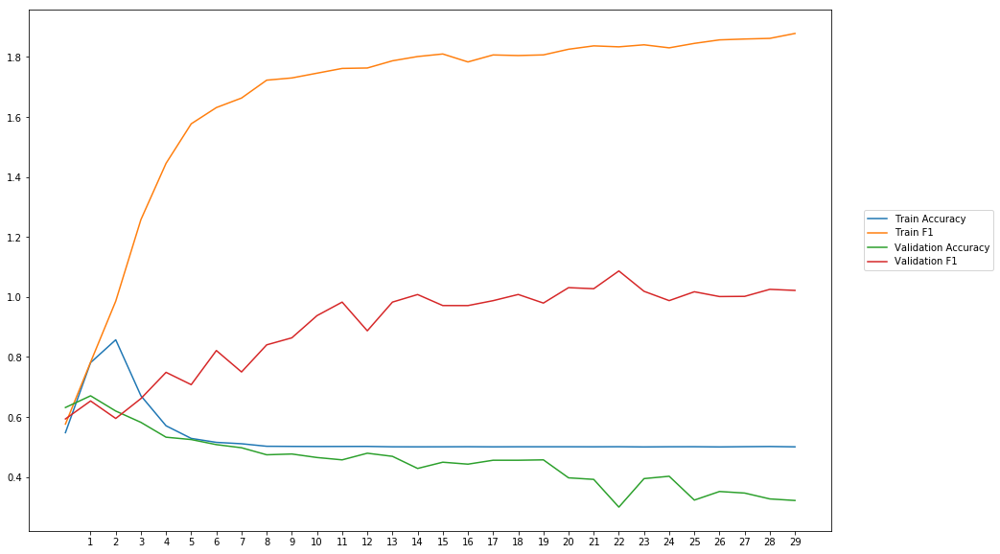

Average Accuracy: 45.43%
Average Precision: 66.11%
Average Recall: 202.53%
Average F1: 90.58%

-----Fold 3--------


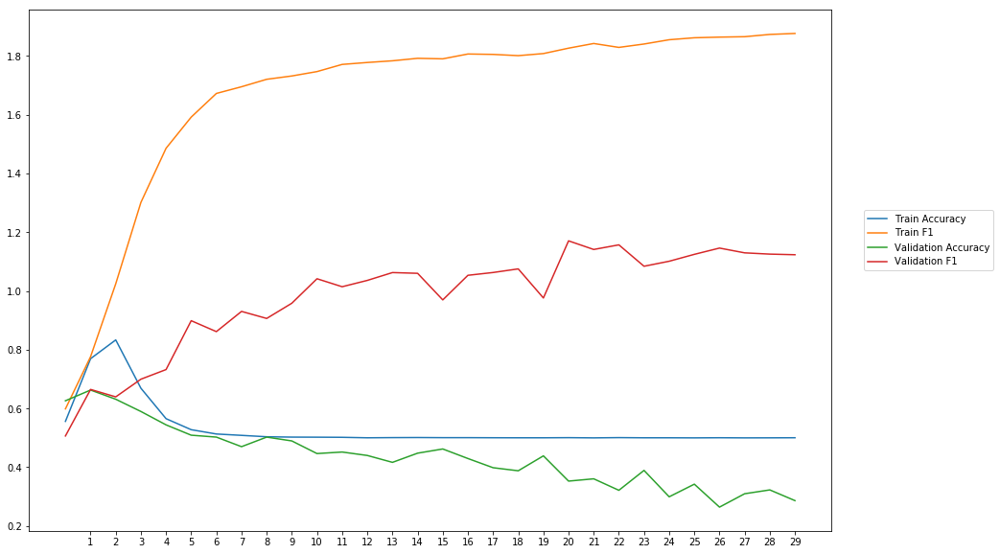

Average Accuracy: 43.66%
Average Precision: 69.90%
Average Recall: 226.98%
Average F1: 98.18%

-----Fold 4--------


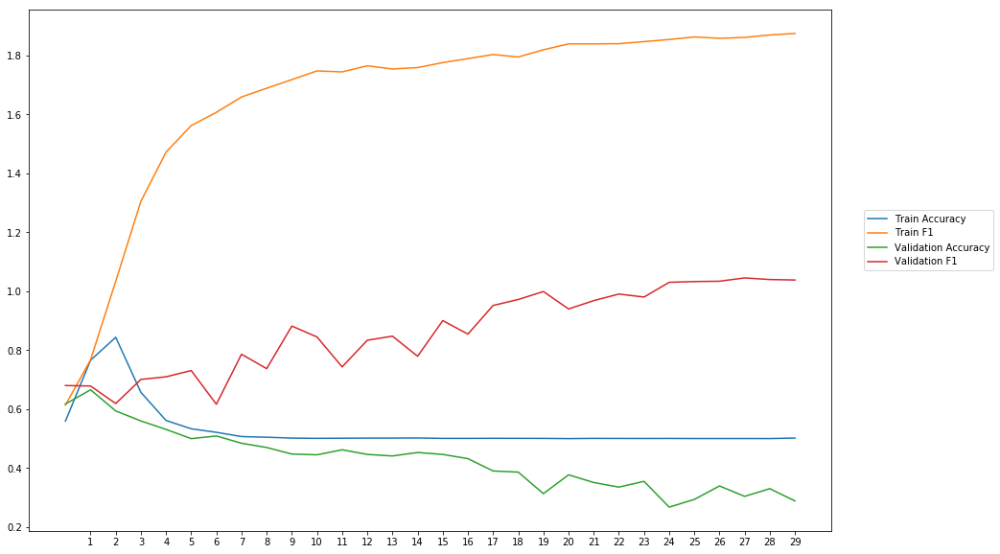

Average Accuracy: 42.80%
Average Precision: 61.51%
Average Recall: 237.61%
Average F1: 86.58%

-----Fold 5--------


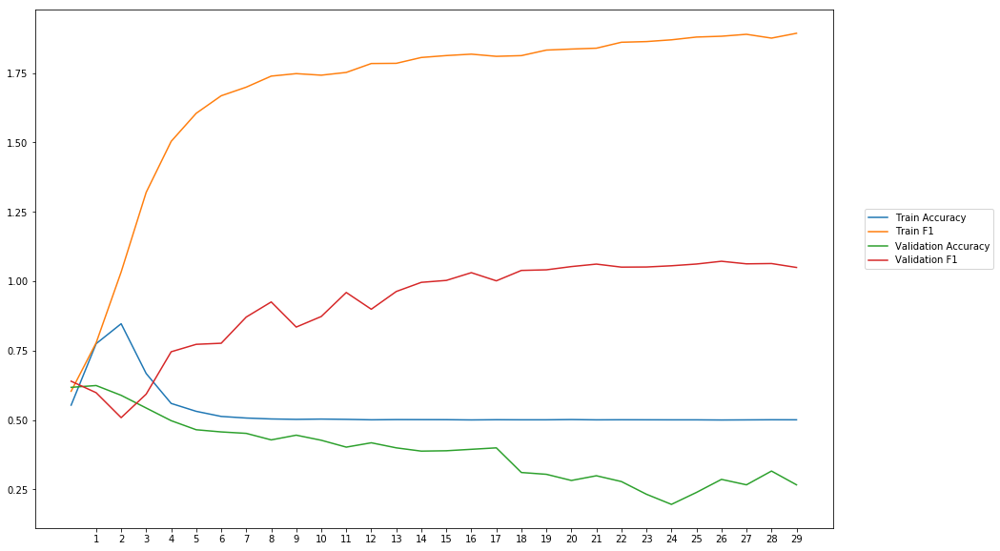

Average Accuracy: 38.70%
Average Precision: 65.11%
Average Recall: 267.84%
Average F1: 92.17%

-----Fold 6--------


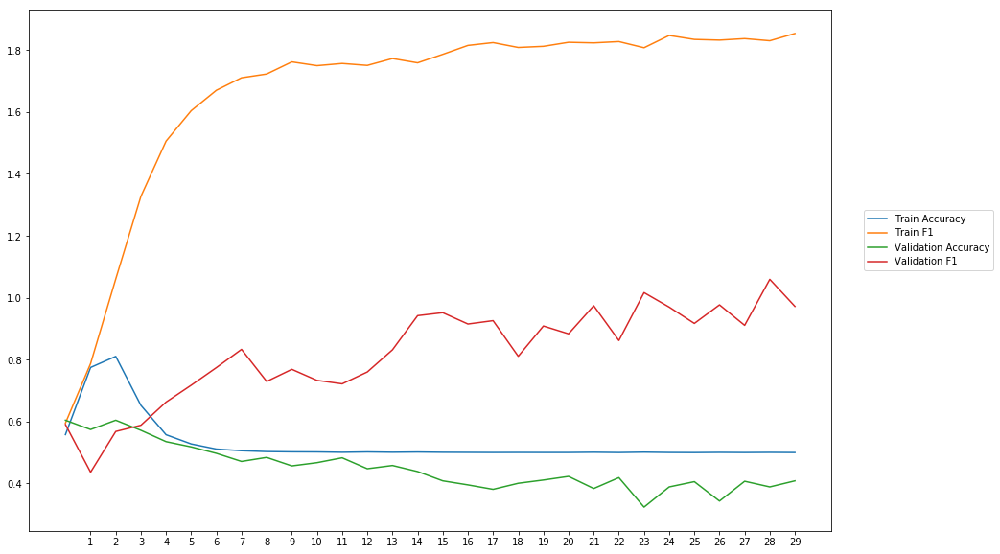

Average Accuracy: 45.01%
Average Precision: 68.49%
Average Recall: 118.57%
Average F1: 82.38%

-----Fold 7--------


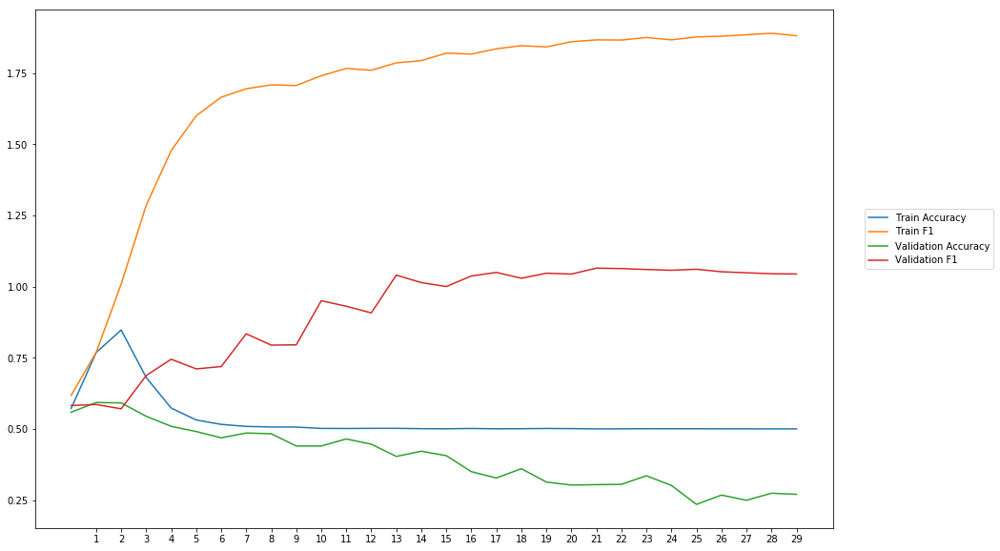

Average Accuracy: 39.81%
Average Precision: 63.09%
Average Recall: 326.84%
Average F1: 91.89%

-----Fold 8--------


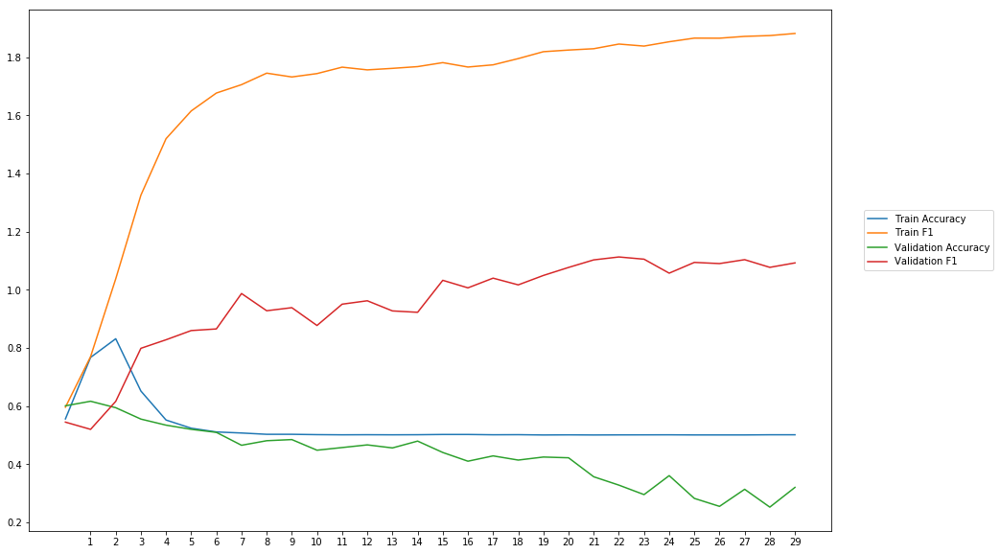

Average Accuracy: 43.21%
Average Precision: 67.49%
Average Recall: 258.39%
Average F1: 95.25%

-----Fold 9--------


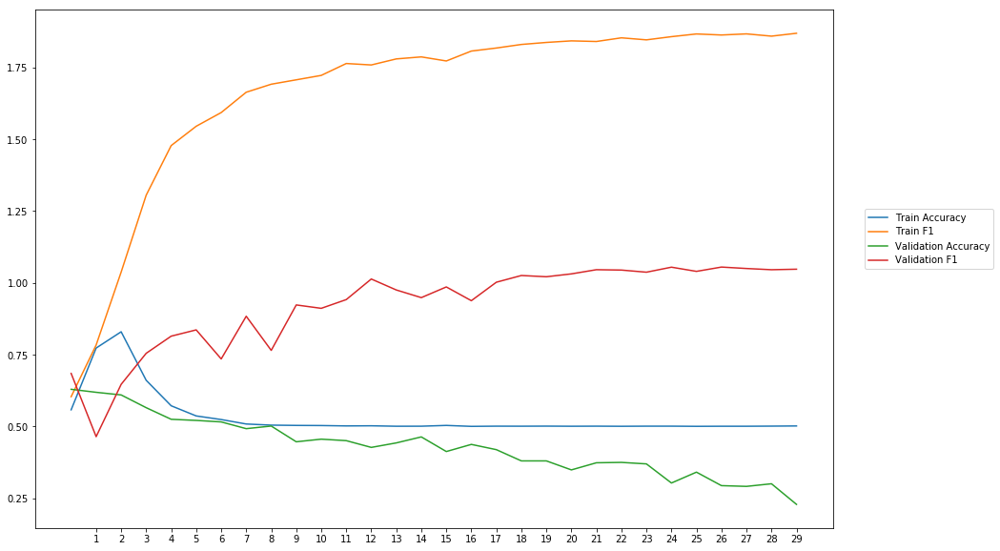

Average Accuracy: 43.05%
Average Precision: 63.90%
Average Recall: 265.03%
Average F1: 92.41%

-----Fold 10--------


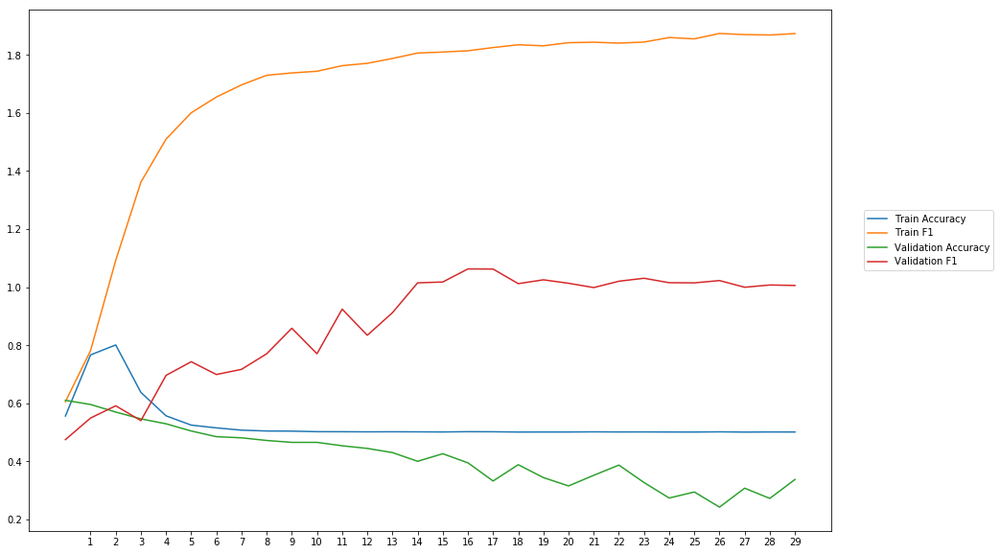

Average Accuracy: 41.43%
Average Precision: 60.96%
Average Recall: 265.34%
Average F1: 87.98%

-------Overallresults-------


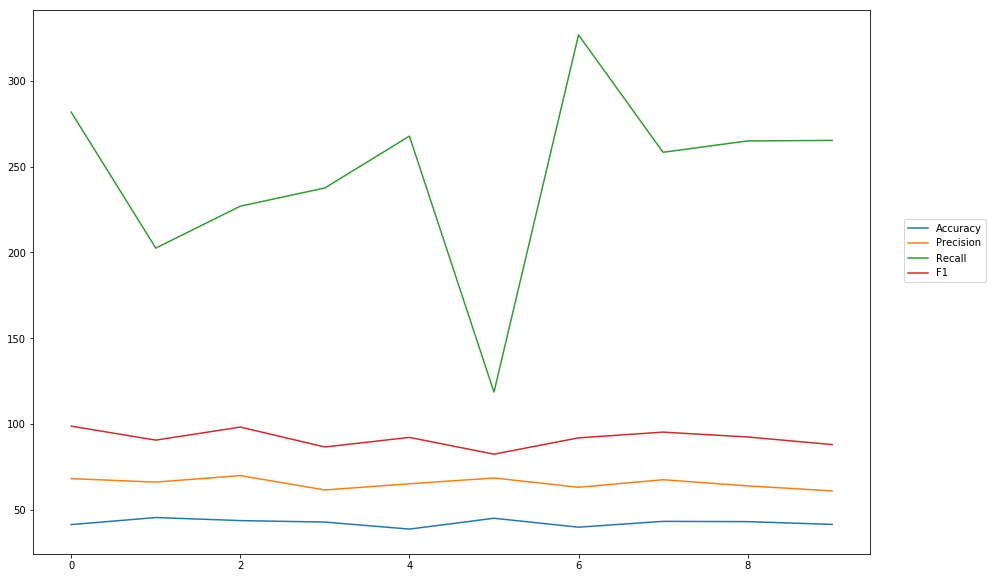

Accuracy: Mean = 42.44% (+/- 2.03%), Max = 45.43%, Min =  38.70%
Precision: Mean = 65.47% (+/- 2.91%), Max = 69.90%, Min =  60.96%
Recall: Mean = 245.09% (+/- 52.66%), Max = 326.84%, Min =  118.57%
F1: Mean = 91.61% (+/- 4.82%), Max = 98.72%, Min =  82.38%


In [41]:
cross_val(model_16, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'output_softplus')

In [42]:
wv_layer_17 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_17 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_17 = wv_layer_17(comment_input_17)

#First Dense Layer
x_17 = Dense(600, activation='relu')(embedded_sequences_17)

x_17 = Flatten()(x_17)

#Output (Dense) Layer
preds_17 = Dense(2, activation='softsign')(x_17)

# build the model
model_17 = Model(inputs=[comment_input_17], outputs=preds_17)


-----Fold 1--------


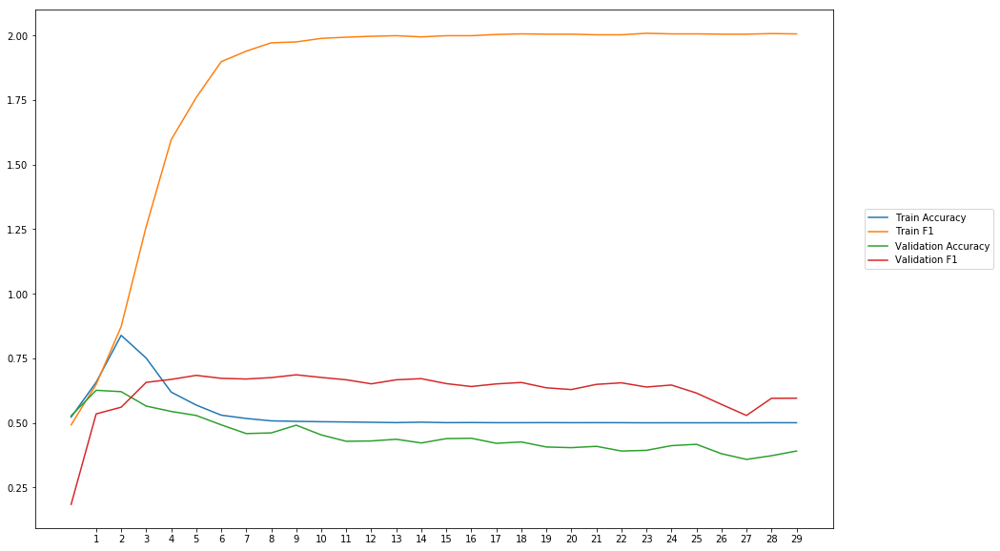

Average Accuracy: 45.15%
Average Precision: 66.07%
Average Recall: 63.00%
Average F1: 62.27%

-----Fold 2--------


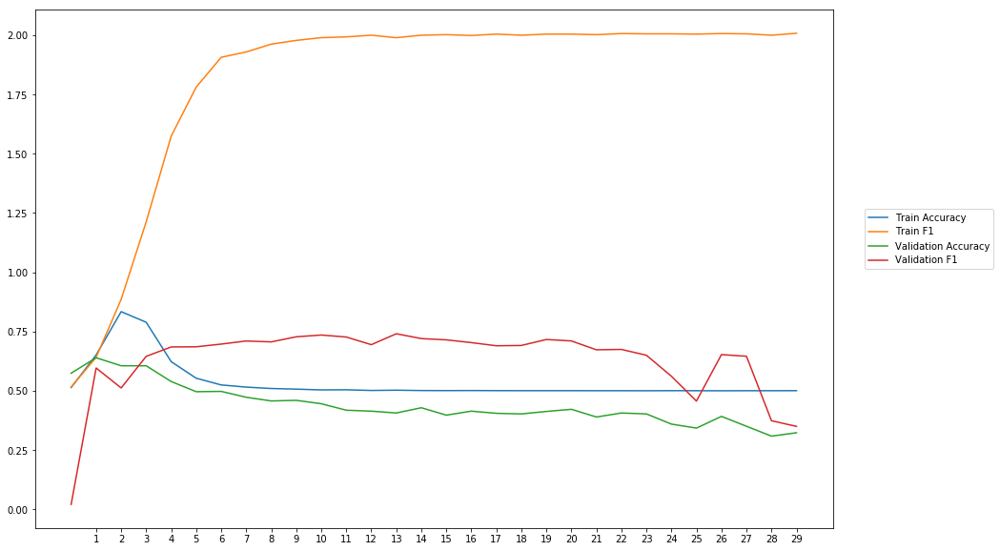

Average Accuracy: 43.95%
Average Precision: 49.99%
Average Recall: 56.89%
Average F1: 62.88%

-----Fold 3--------


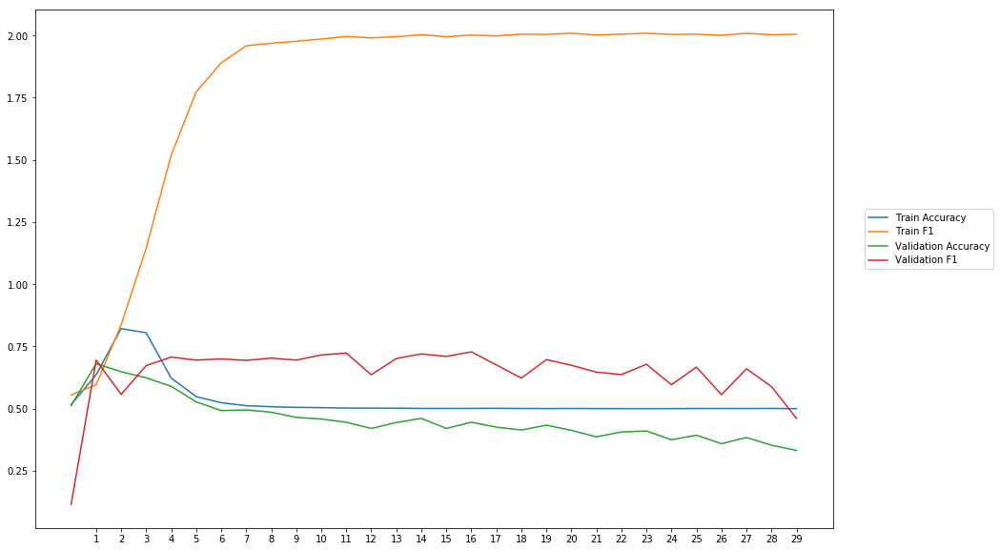

Average Accuracy: 45.67%
Average Precision: 88.51%
Average Recall: 60.92%
Average F1: 64.43%

-----Fold 4--------


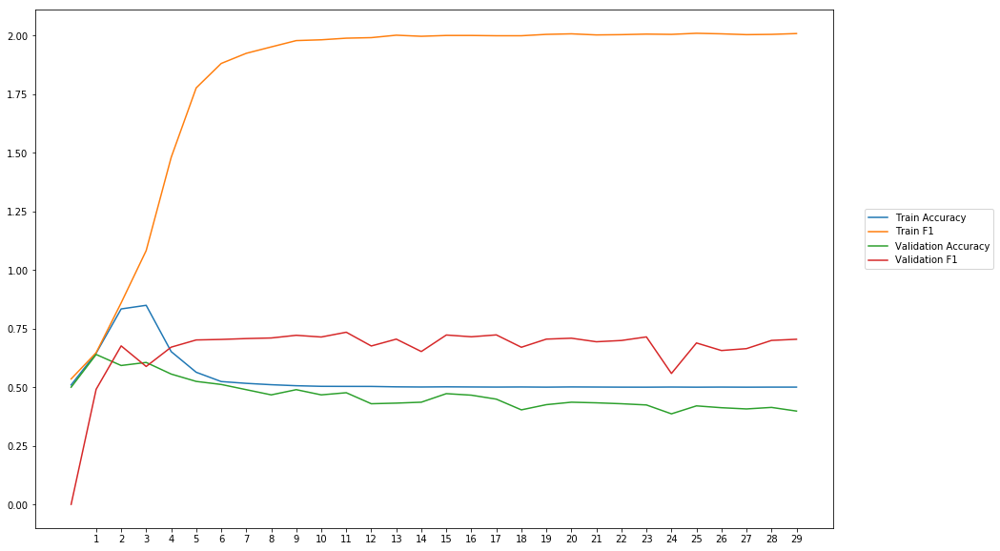

Average Accuracy: 46.66%
Average Precision: 68.48%
Average Recall: 67.85%
Average F1: 65.94%

-----Fold 5--------


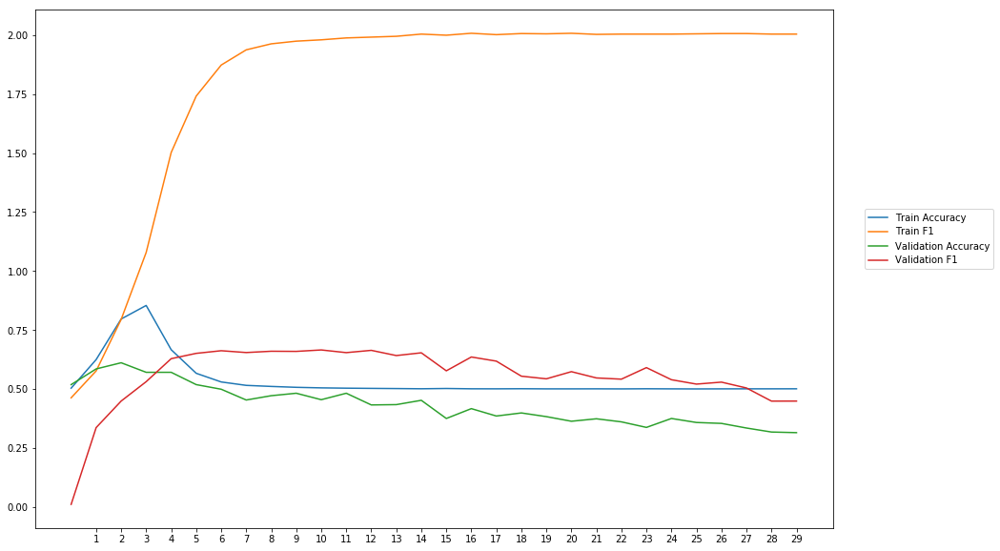

Average Accuracy: 43.25%
Average Precision: 75.18%
Average Recall: 51.82%
Average F1: 55.62%

-----Fold 6--------


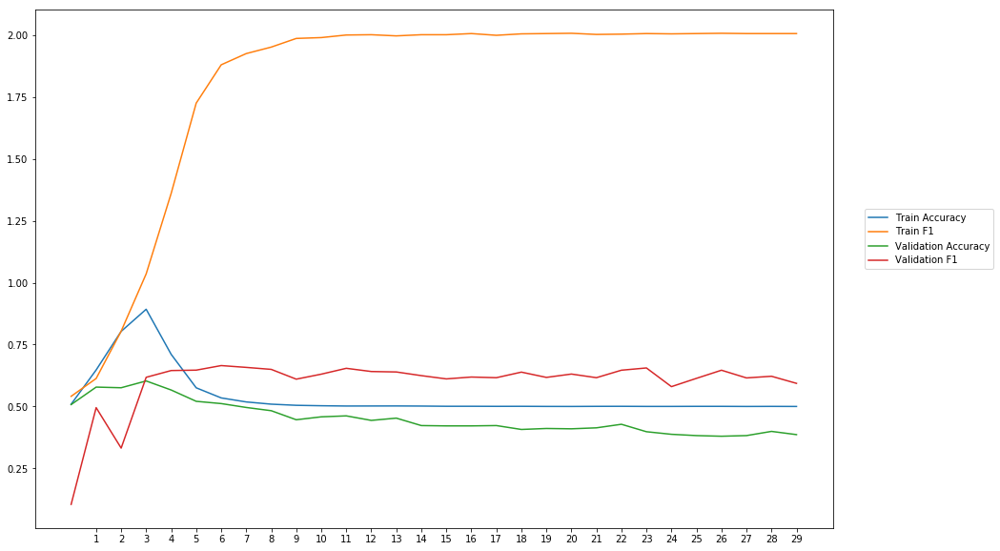

Average Accuracy: 45.28%
Average Precision: 71.74%
Average Recall: 56.25%
Average F1: 59.80%

-----Fold 7--------


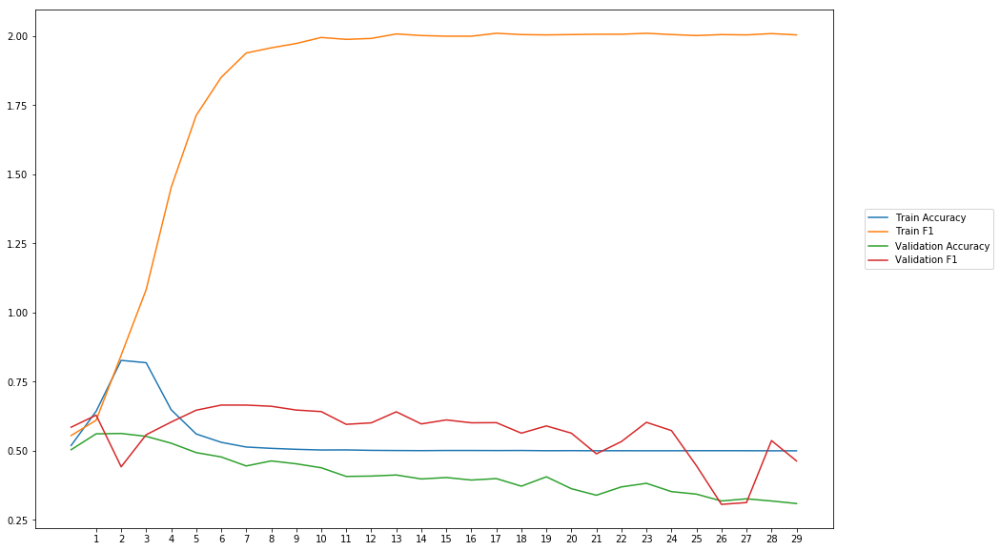

Average Accuracy: 41.68%
Average Precision: 70.62%
Average Recall: 53.89%
Average F1: 56.59%

-----Fold 8--------


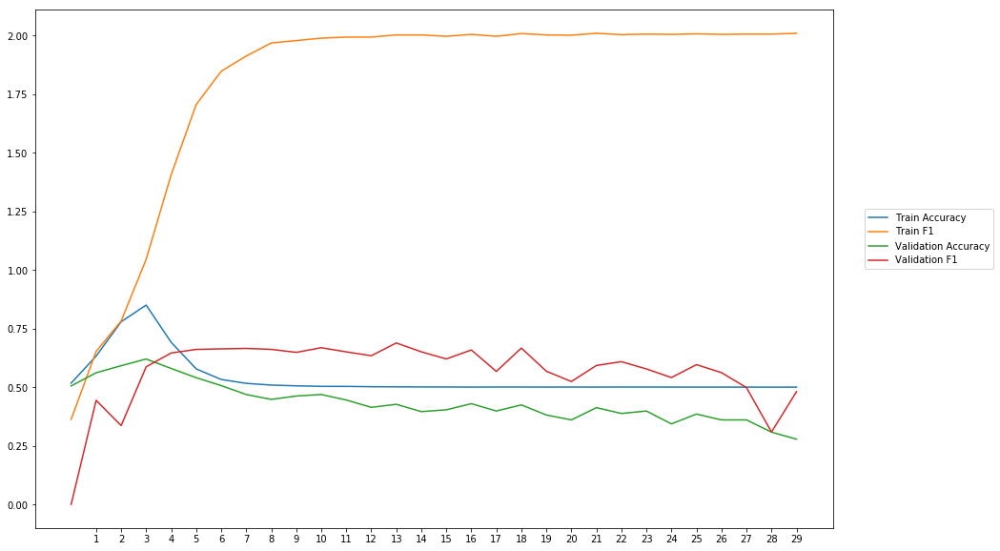

Average Accuracy: 43.55%
Average Precision: 59.01%
Average Recall: 54.26%
Average F1: 56.57%

-----Fold 9--------


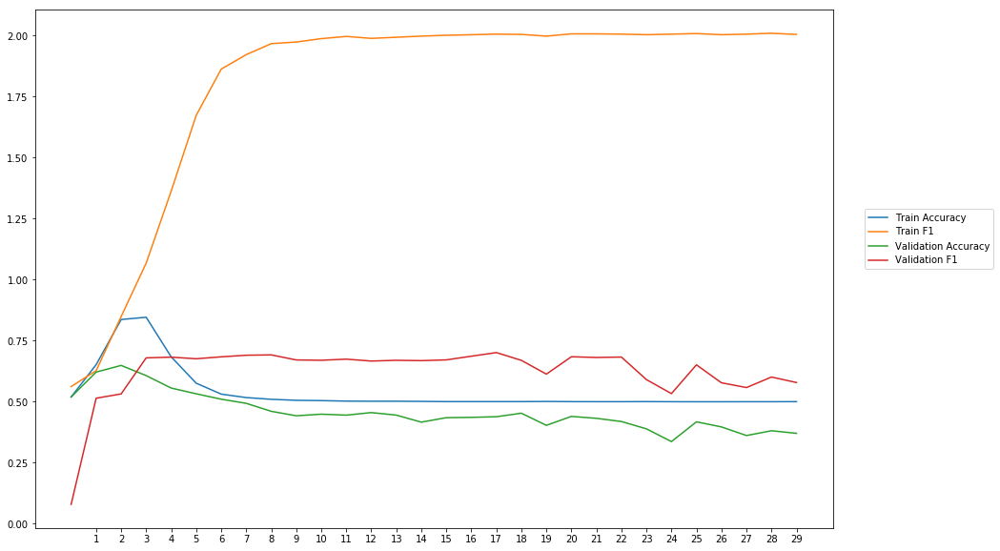

Average Accuracy: 45.72%
Average Precision: 65.39%
Average Recall: 65.60%
Average F1: 62.45%

-----Fold 10--------


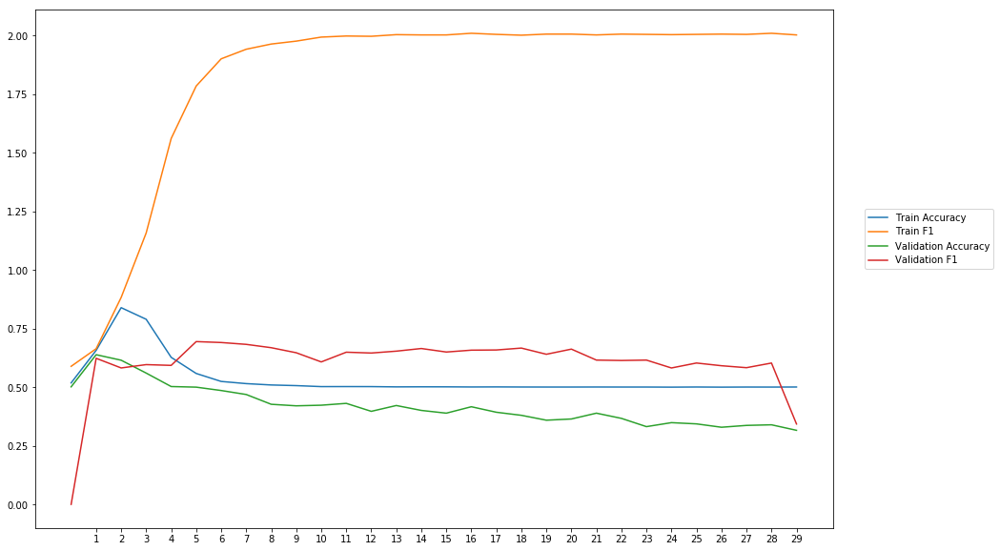

Average Accuracy: 41.98%
Average Precision: 67.34%
Average Recall: 52.22%
Average F1: 60.27%

-------Overallresults-------


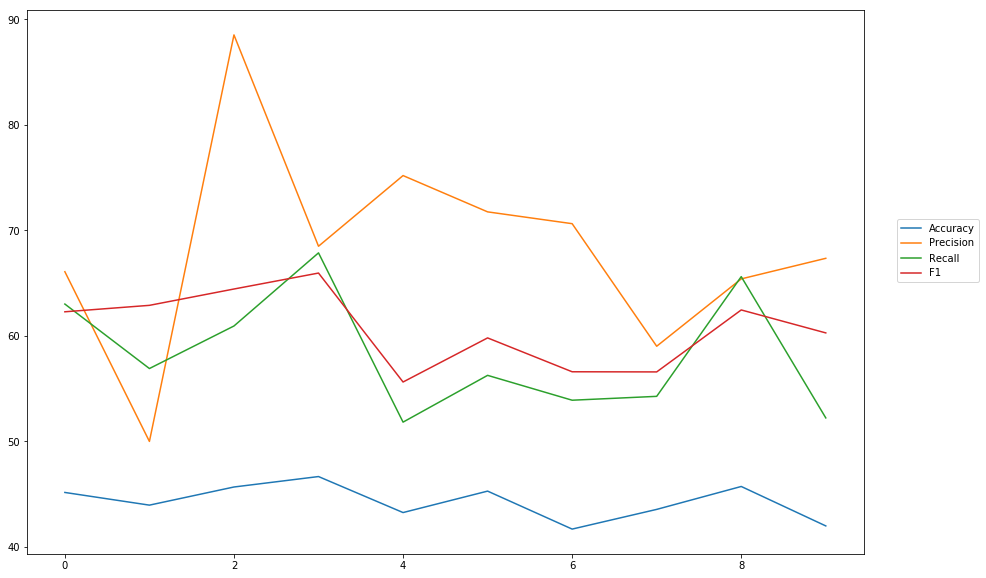

Accuracy: Mean = 44.29% (+/- 1.59%), Max = 46.66%, Min =  41.68%
Precision: Mean = 68.23% (+/- 9.53%), Max = 88.51%, Min =  49.99%
Recall: Mean = 58.27% (+/- 5.43%), Max = 67.85%, Min =  51.82%
F1: Mean = 60.68% (+/- 3.35%), Max = 65.94%, Min =  55.62%


In [43]:
cross_val(model_17, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'output_softsign')

In [44]:
wv_layer_18 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_18 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_18 = wv_layer_18(comment_input_18)

#First Dense Layer
x_18 = Dense(600, activation='relu')(embedded_sequences_18)

x_18 = Flatten()(x_18)

#Output (Dense) Layer
preds_18 = Dense(2, activation='linear')(x_18)

# build the model
model_18 = Model(inputs=[comment_input_18], outputs=preds_18)


-----Fold 1--------


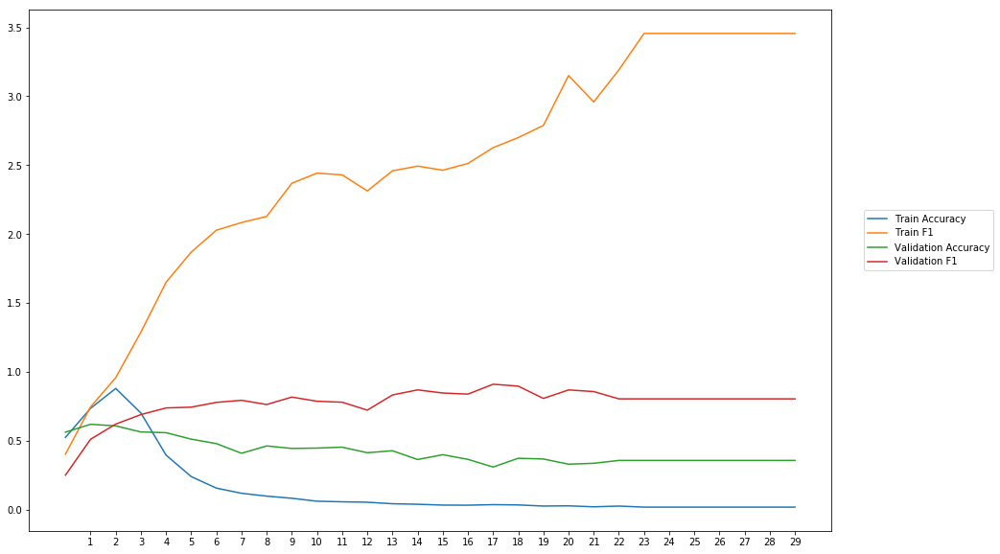

Average Accuracy: 42.06%
Average Precision: 82.66%
Average Recall: 83.51%
Average F1: 77.05%

-----Fold 2--------


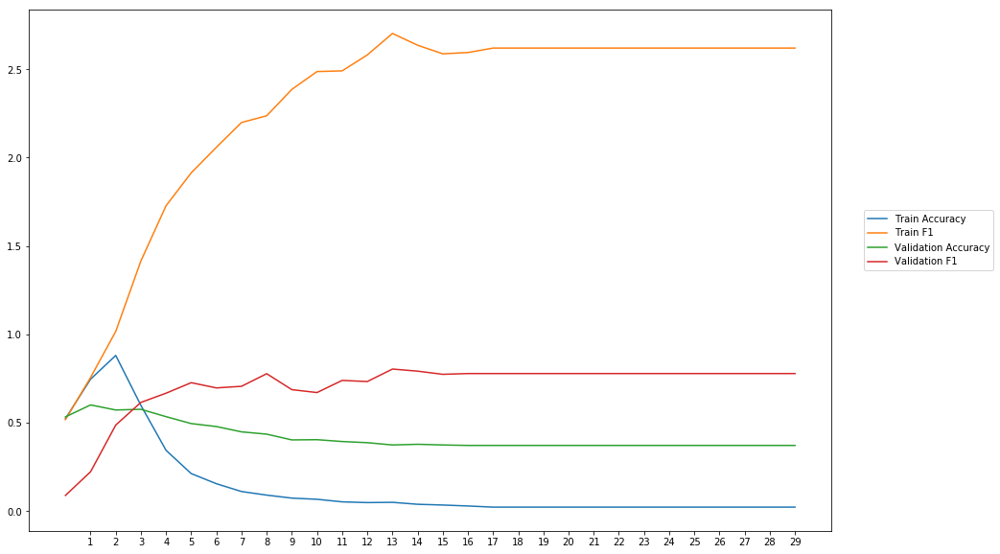

Average Accuracy: 41.92%
Average Precision: 69.56%
Average Recall: 76.07%
Average F1: 70.23%

-----Fold 3--------


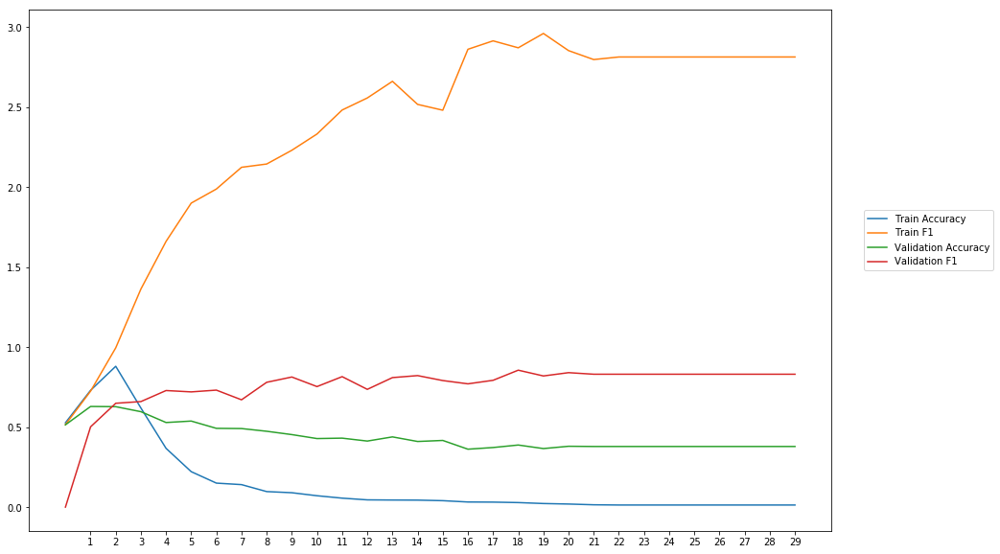

Average Accuracy: 43.87%
Average Precision: 75.40%
Average Recall: 78.12%
Average F1: 75.10%

-----Fold 4--------


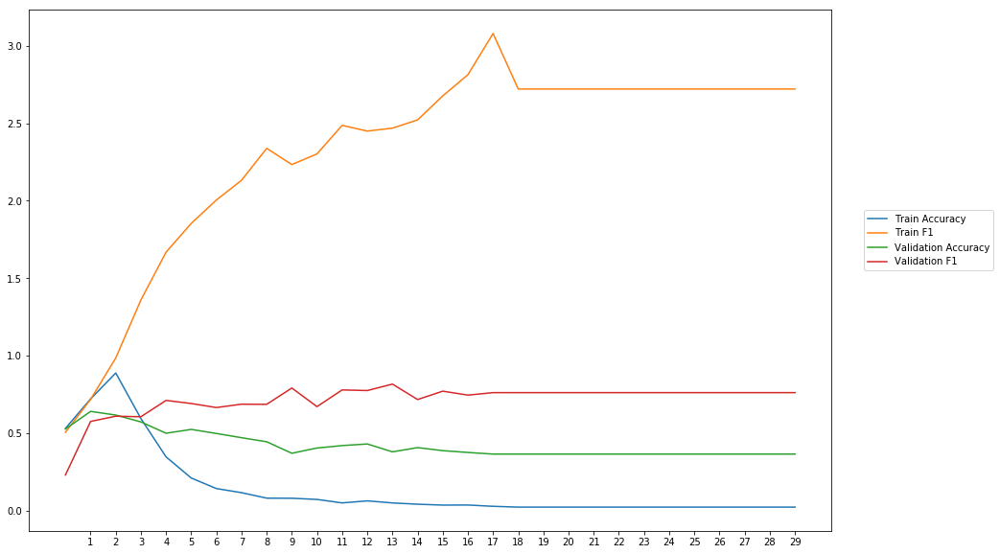

Average Accuracy: 42.30%
Average Precision: 74.78%
Average Recall: 70.73%
Average F1: 71.36%

-----Fold 5--------


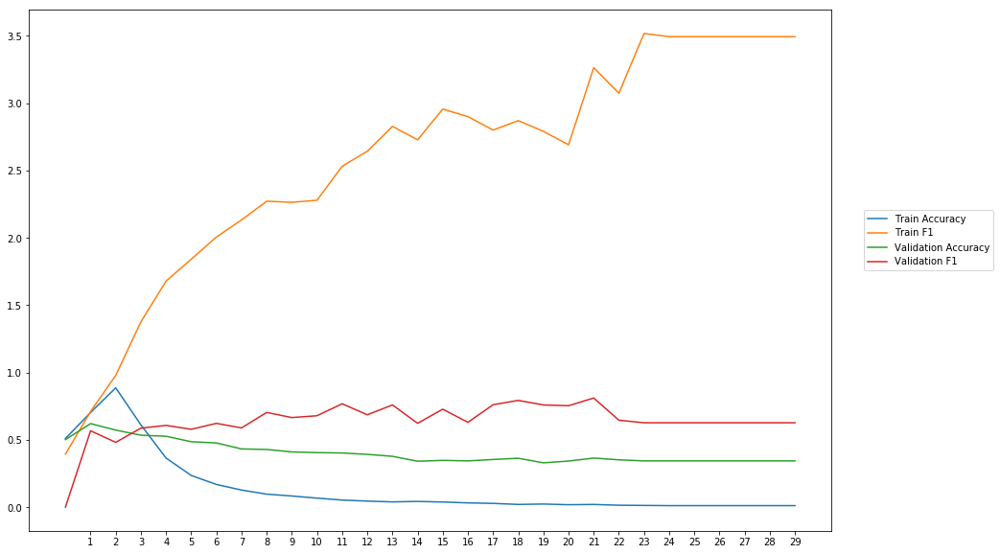

Average Accuracy: 40.33%
Average Precision: 74.56%
Average Recall: 61.24%
Average F1: 63.90%

-----Fold 6--------


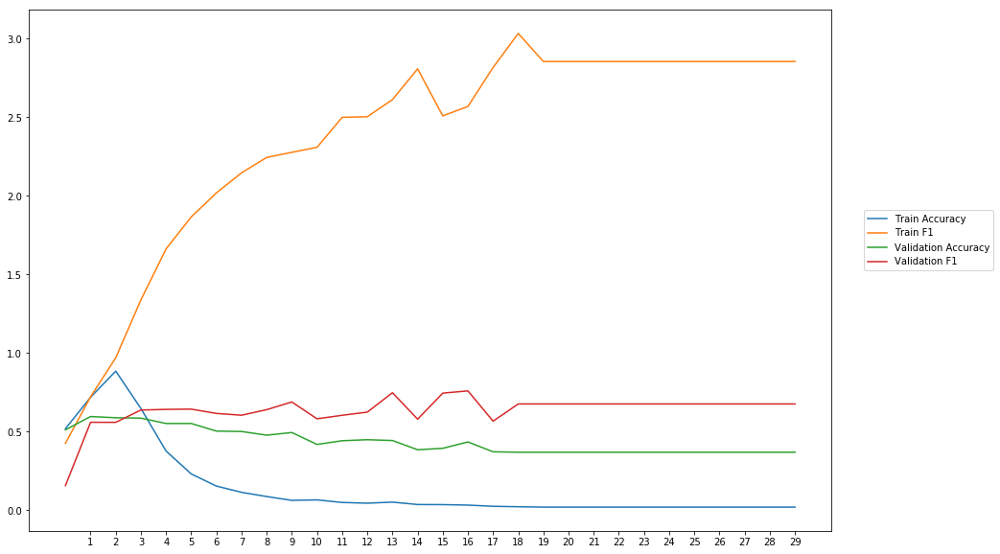

Average Accuracy: 43.67%
Average Precision: 77.02%
Average Recall: 56.81%
Average F1: 63.47%

-----Fold 7--------


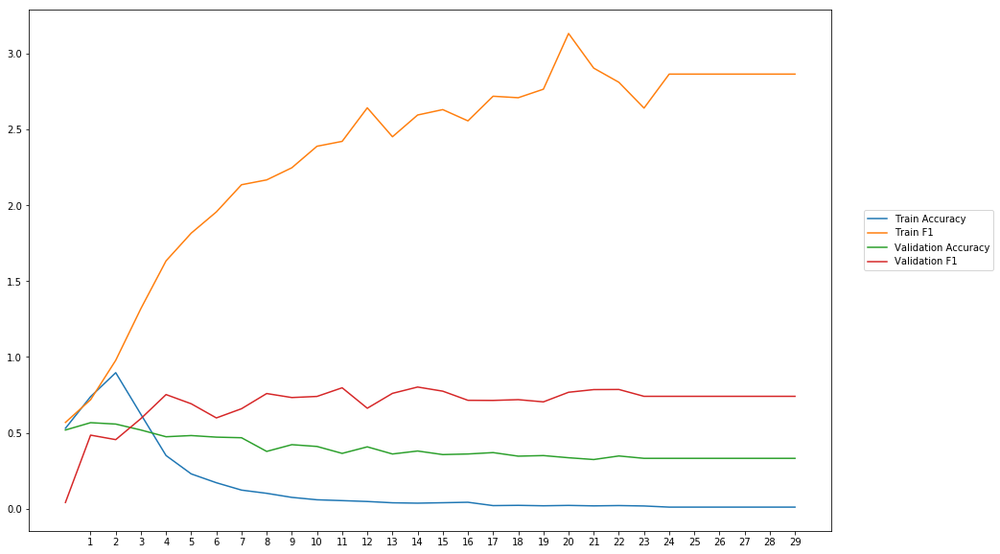

Average Accuracy: 39.62%
Average Precision: 62.71%
Average Recall: 83.75%
Average F1: 68.88%

-----Fold 8--------


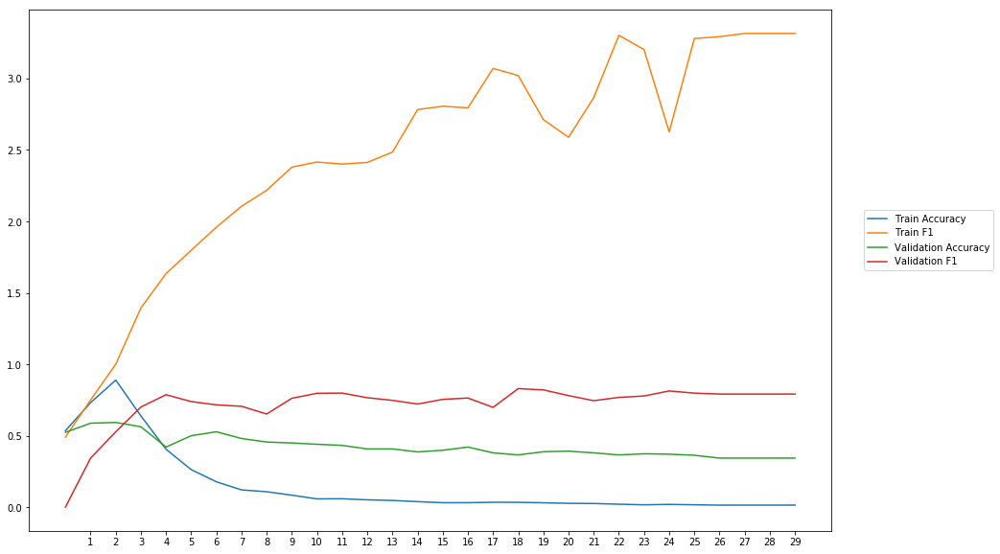

Average Accuracy: 42.47%
Average Precision: 74.61%
Average Recall: 74.43%
Average F1: 71.59%

-----Fold 9--------


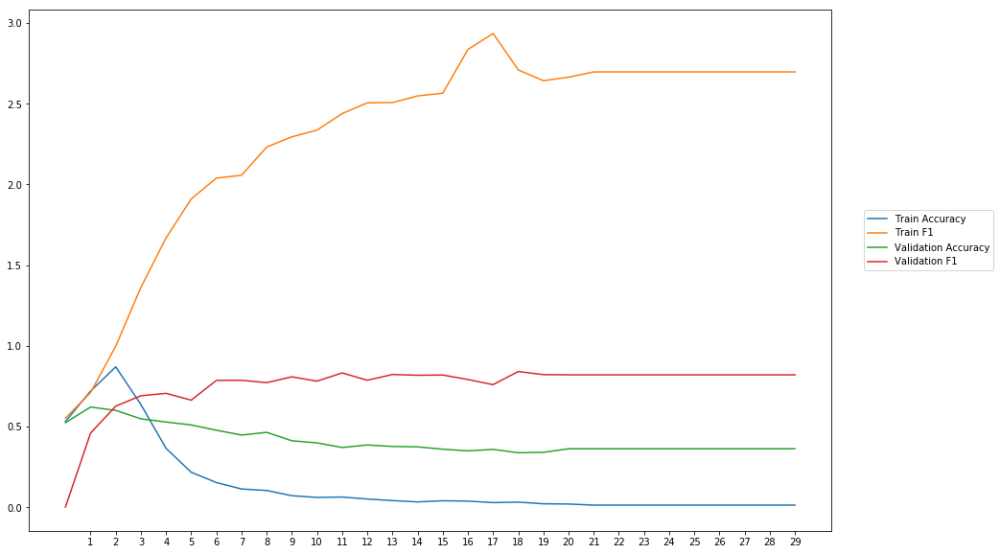

Average Accuracy: 41.28%
Average Precision: 64.64%
Average Recall: 93.12%
Average F1: 75.18%

-----Fold 10--------


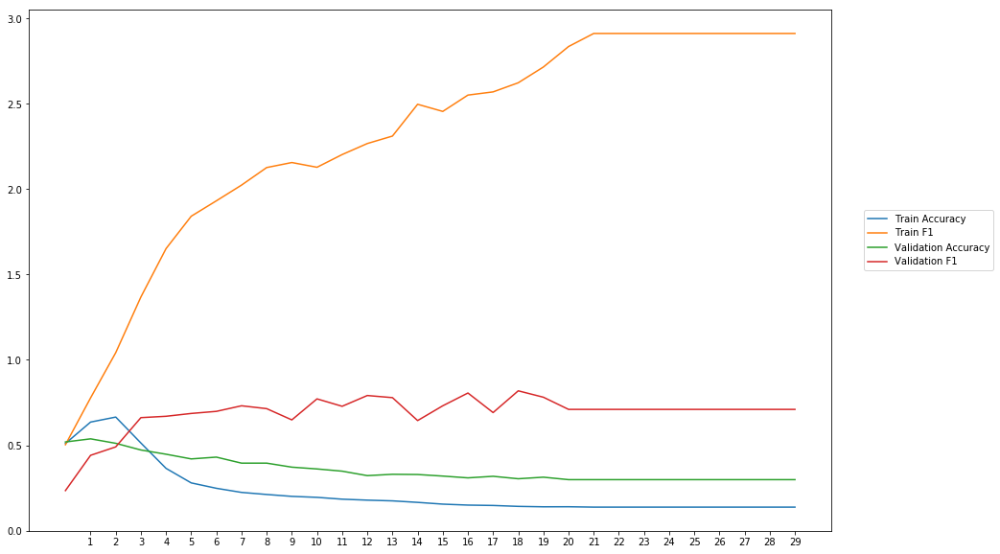

Average Accuracy: 35.84%
Average Precision: 72.08%
Average Recall: 72.15%
Average F1: 68.76%

-------Overallresults-------


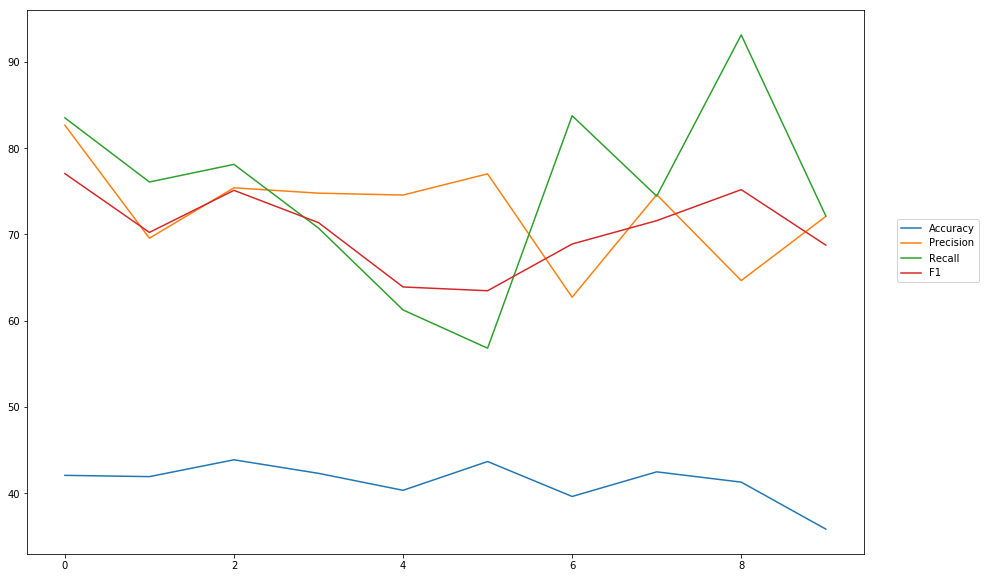

Accuracy: Mean = 41.34% (+/- 2.22%), Max = 43.87%, Min =  35.84%
Precision: Mean = 72.80% (+/- 5.58%), Max = 82.66%, Min =  62.71%
Recall: Mean = 74.99% (+/- 10.18%), Max = 93.12%, Min =  56.81%
F1: Mean = 70.55% (+/- 4.32%), Max = 77.05%, Min =  63.47%


In [45]:
cross_val(model_18, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'output_lineat')

### Combinations

In [11]:
wv_layer_19 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_19 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_19 = wv_layer_19(comment_input_19)

#First Dense Layer
x_19 = Dense(600, activation='softmax')(embedded_sequences_19)

x_19 = Flatten()(x_19)

#Output (Dense) Layer
preds_19 = Dense(2, activation='sigmoid')(x_19)

# build the model
model_19 = Model(inputs=[comment_input_19], outputs=preds_19)

Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.

-----Fold 1--------


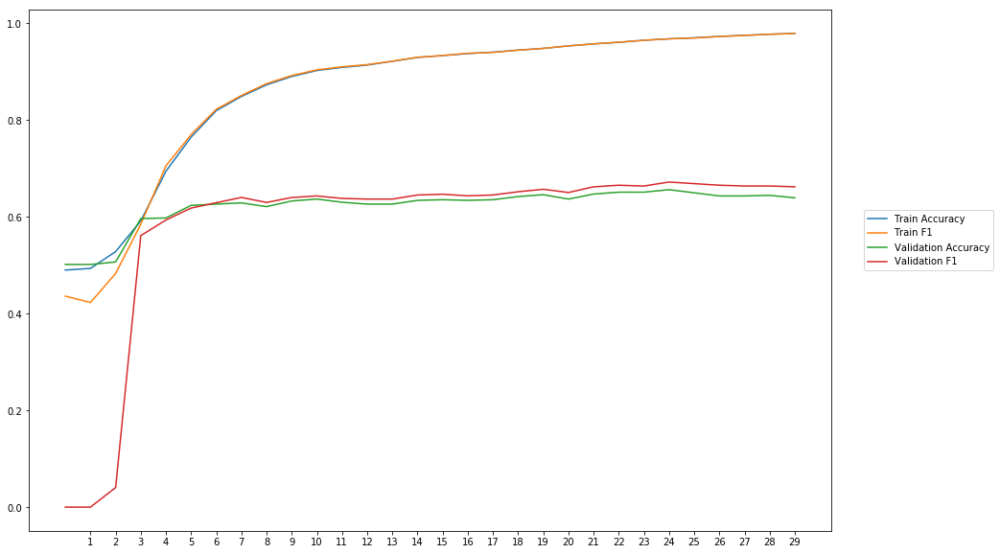

Average Accuracy: 62.12%
Average Precision: 58.49%
Average Recall: 59.90%
Average F1: 58.08%

-----Fold 2--------


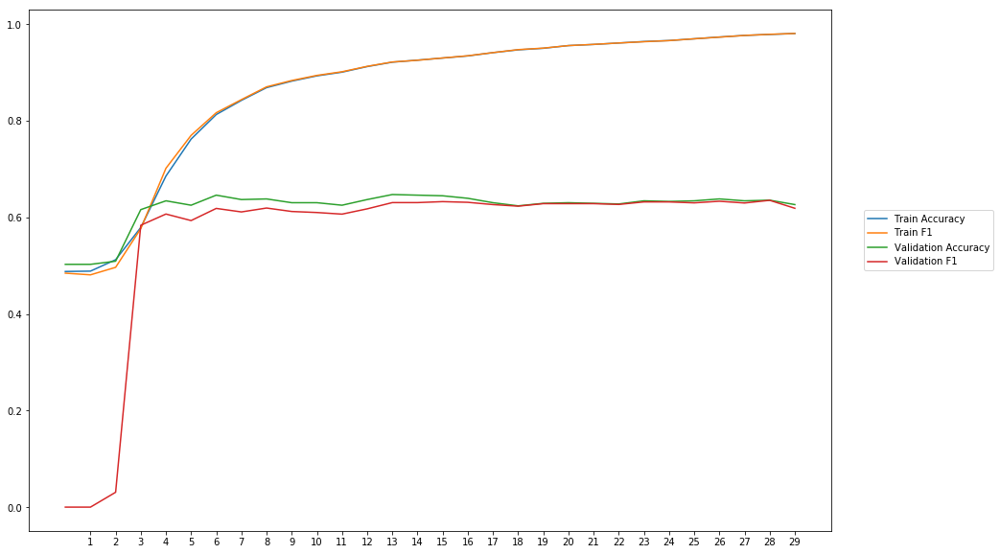

Average Accuracy: 62.04%
Average Precision: 60.04%
Average Recall: 54.50%
Average F1: 56.01%

-----Fold 3--------


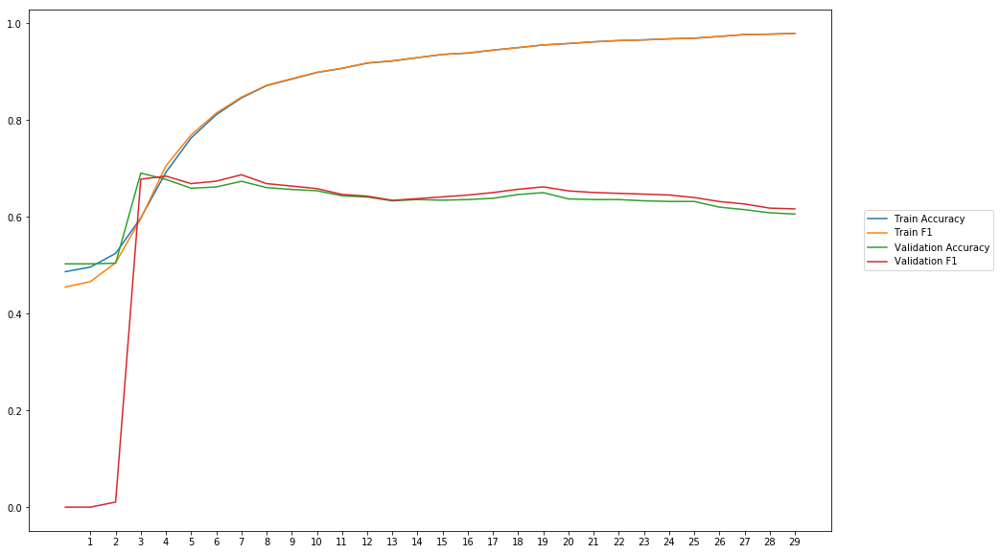

Average Accuracy: 62.82%
Average Precision: 60.28%
Average Recall: 60.31%
Average F1: 58.59%

-----Fold 4--------


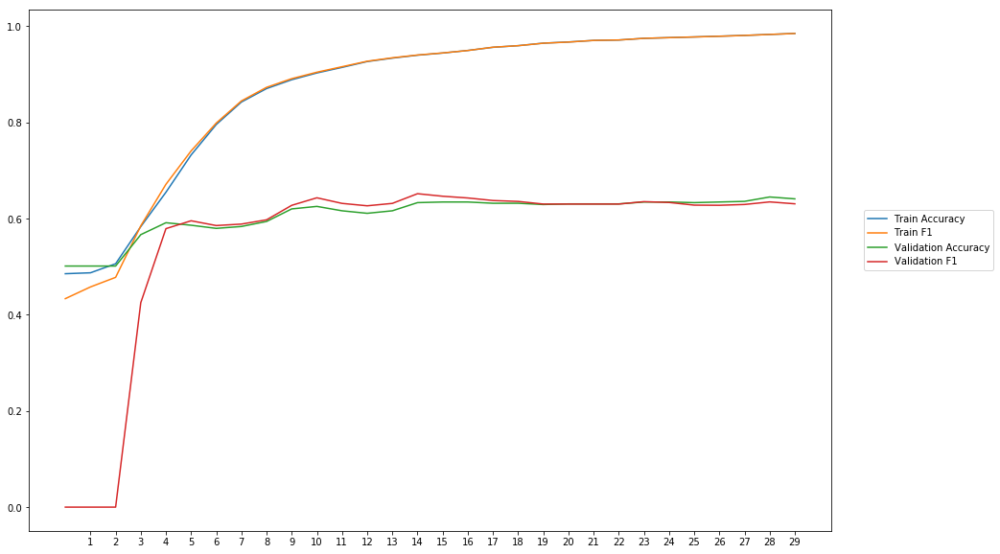

Average Accuracy: 60.80%
Average Precision: 55.74%
Average Recall: 55.92%
Average F1: 55.62%

-----Fold 5--------


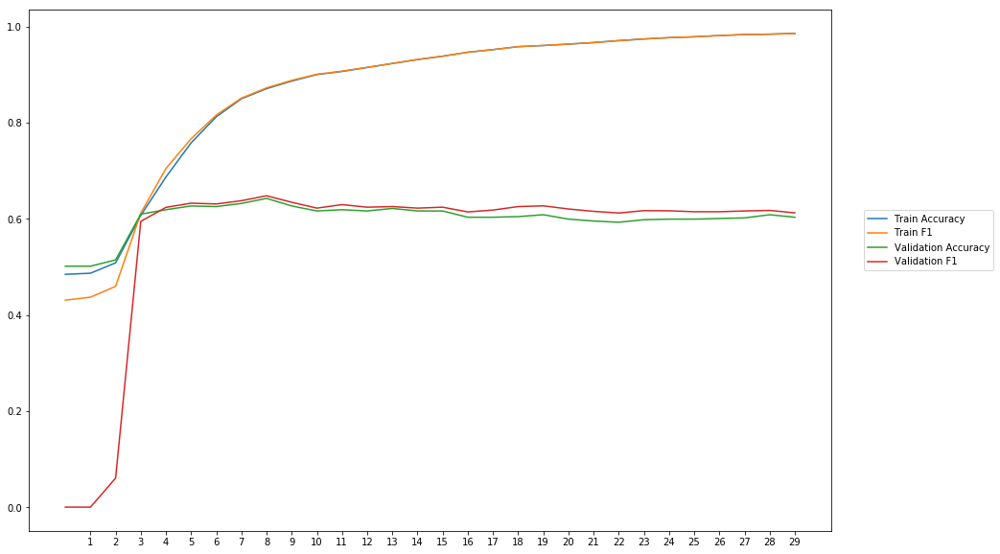

Average Accuracy: 60.07%
Average Precision: 56.89%
Average Recall: 57.77%
Average F1: 56.16%

-----Fold 6--------


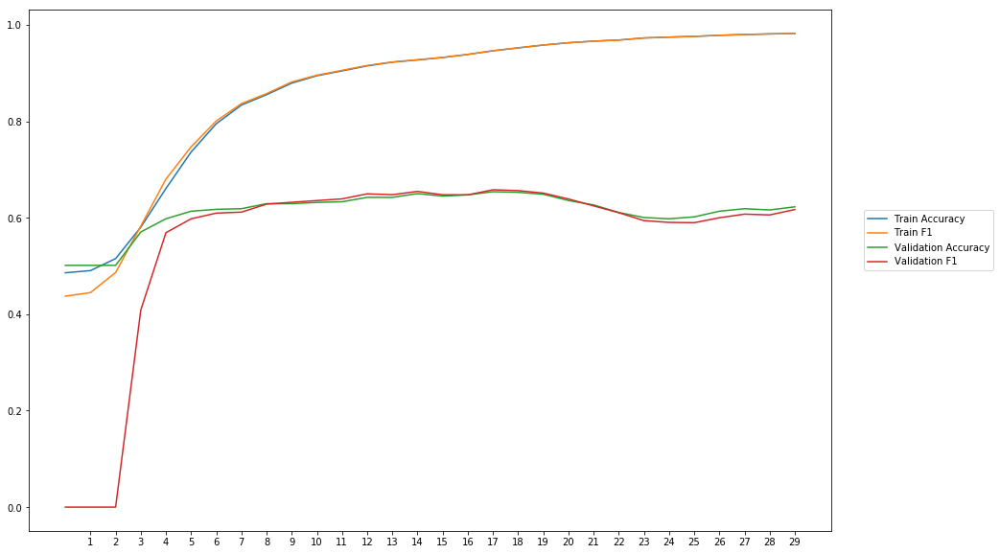

Average Accuracy: 61.24%
Average Precision: 56.53%
Average Recall: 54.78%
Average F1: 55.41%

-----Fold 7--------


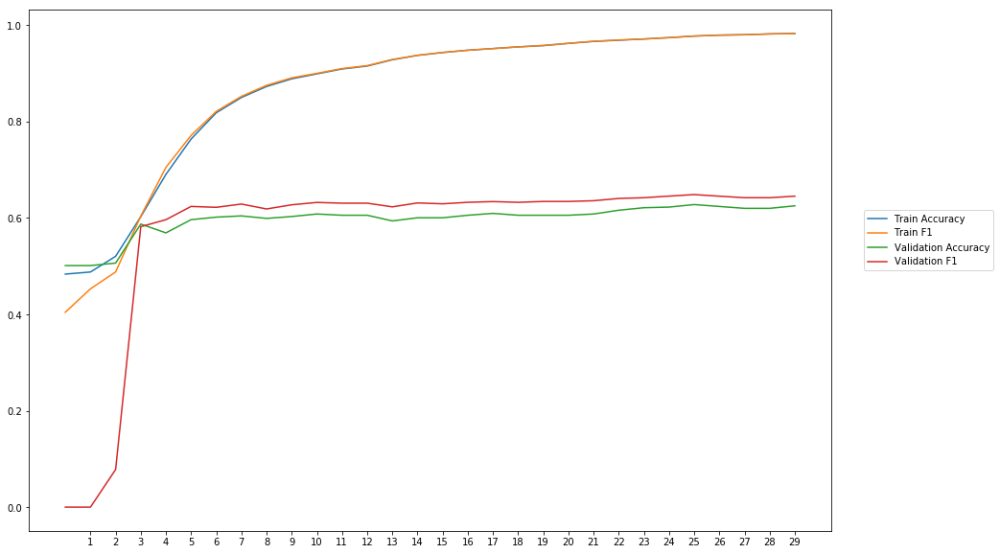

Average Accuracy: 59.68%
Average Precision: 55.29%
Average Recall: 60.80%
Average F1: 57.04%

-----Fold 8--------


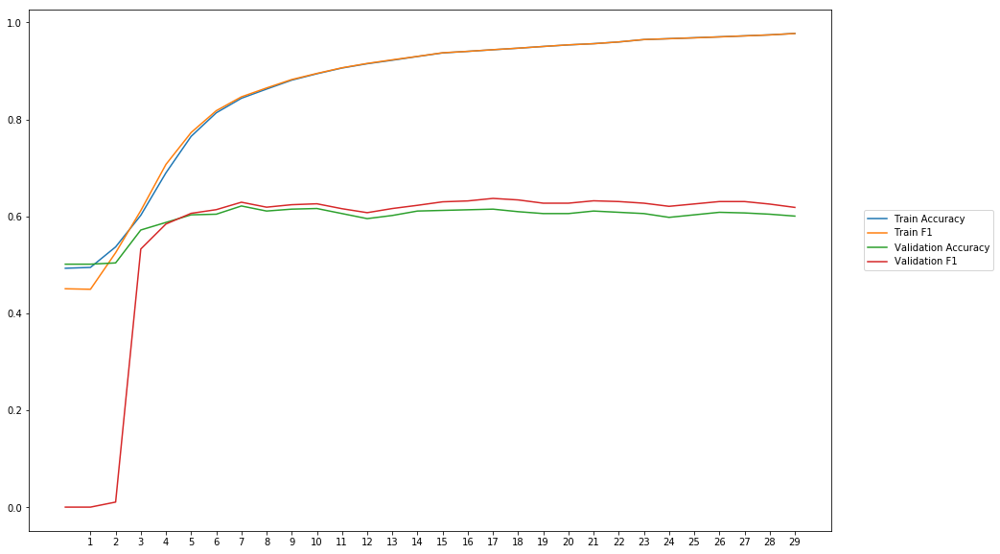

Average Accuracy: 59.53%
Average Precision: 57.08%
Average Recall: 58.03%
Average F1: 55.79%

-----Fold 9--------


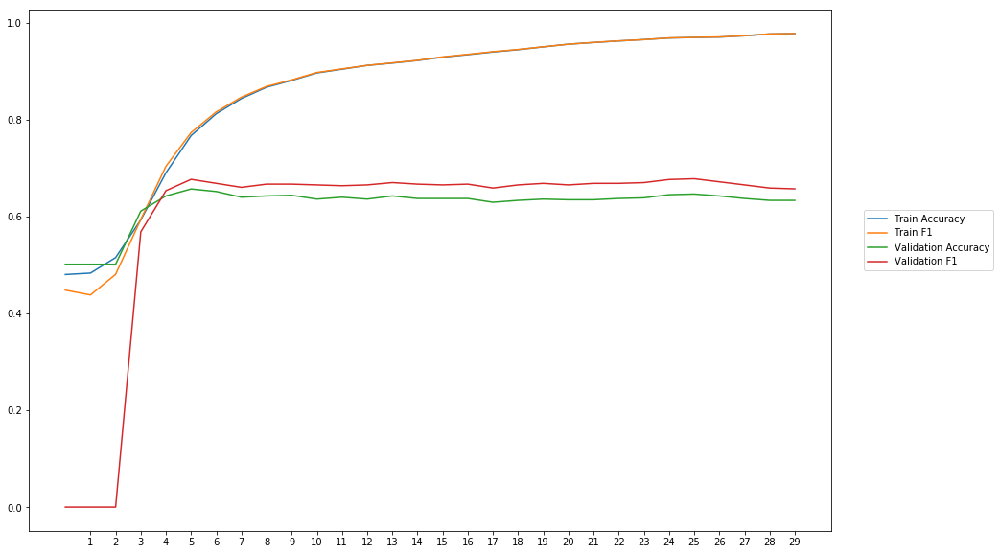

Average Accuracy: 62.45%
Average Precision: 55.73%
Average Recall: 64.31%
Average F1: 59.64%

-----Fold 10--------


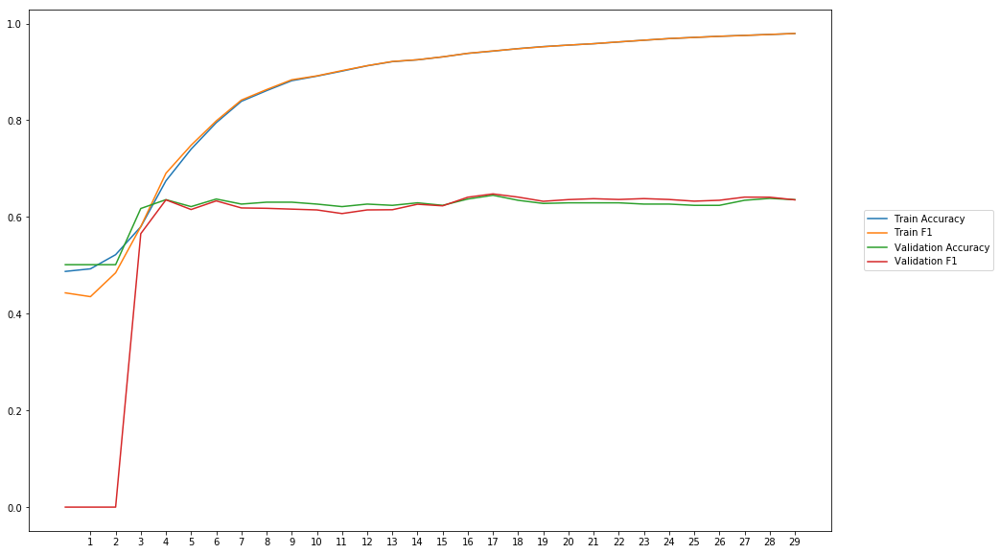

Average Accuracy: 61.66%
Average Precision: 56.61%
Average Recall: 56.40%
Average F1: 56.44%

-------Overallresults-------


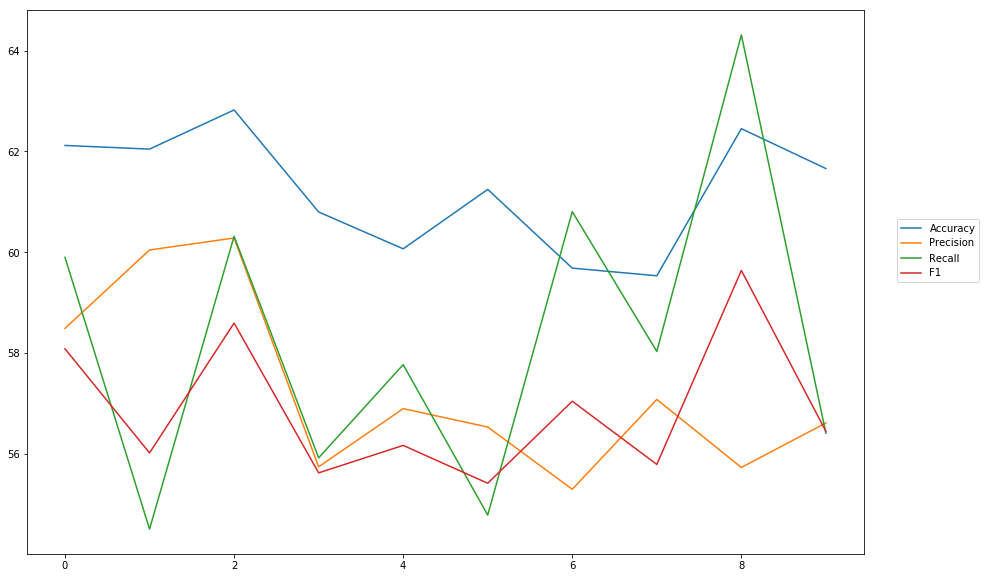

Accuracy: Mean = 61.24% (+/- 1.12%), Max = 62.82%, Min =  59.53%
Precision: Mean = 57.27% (+/- 1.67%), Max = 60.28%, Min =  55.29%
Recall: Mean = 58.27% (+/- 2.92%), Max = 64.31%, Min =  54.50%
F1: Mean = 56.88% (+/- 1.36%), Max = 59.64%, Min =  55.41%


In [9]:
cross_val(model_19, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'softmax_sigmoid')

In [10]:
wv_layer_20 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_20 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_20 = wv_layer_20(comment_input_20)

#First Dense Layer
x_20 = Dense(600, activation='softmax')(embedded_sequences_20)

x_20 = Flatten()(x_20)

#Output (Dense) Layer
preds_20 = Dense(2, activation='hard_sigmoid')(x_20)

# build the model
model_20 = Model(inputs=[comment_input_20], outputs=preds_20)


-----Fold 1--------


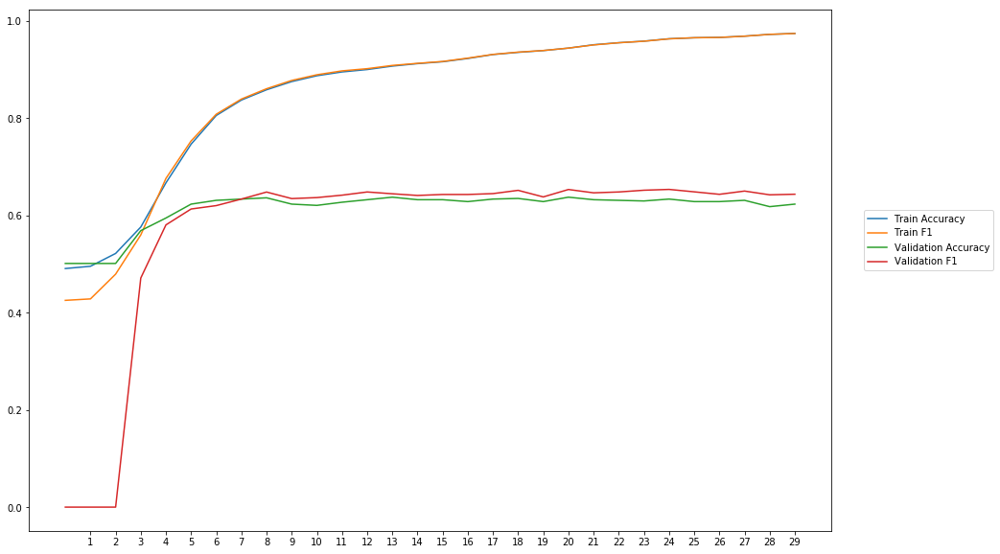

Average Accuracy: 61.40%
Average Precision: 55.67%
Average Recall: 58.84%
Average F1: 57.06%

-----Fold 2--------


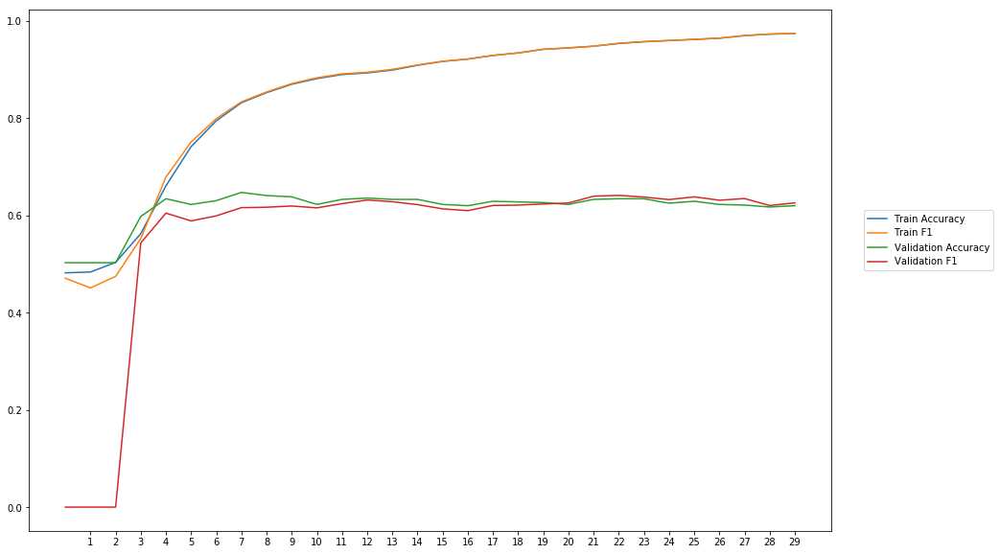

Average Accuracy: 61.52%
Average Precision: 56.80%
Average Recall: 54.90%
Average F1: 55.74%

-----Fold 3--------


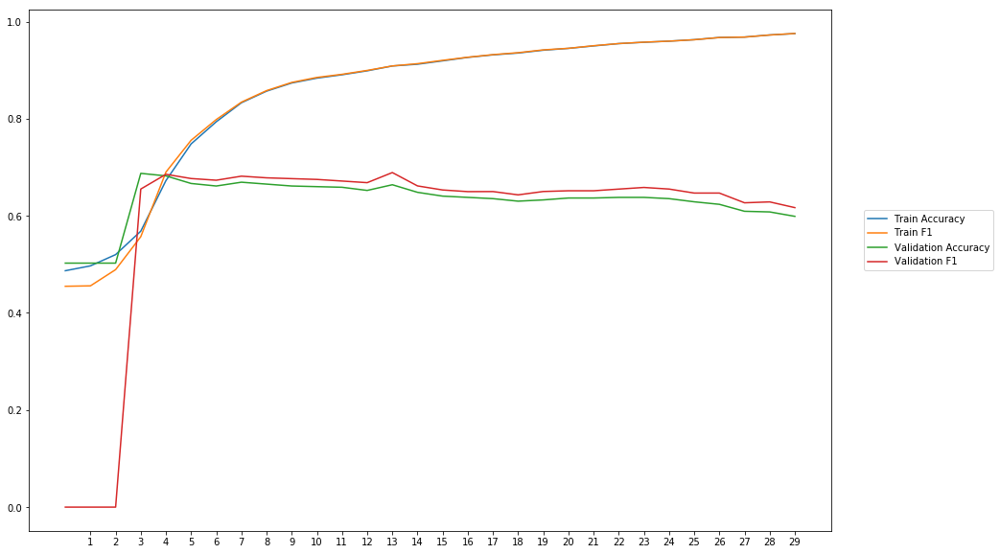

Average Accuracy: 63.06%
Average Precision: 56.95%
Average Recall: 61.88%
Average F1: 59.26%

-----Fold 4--------


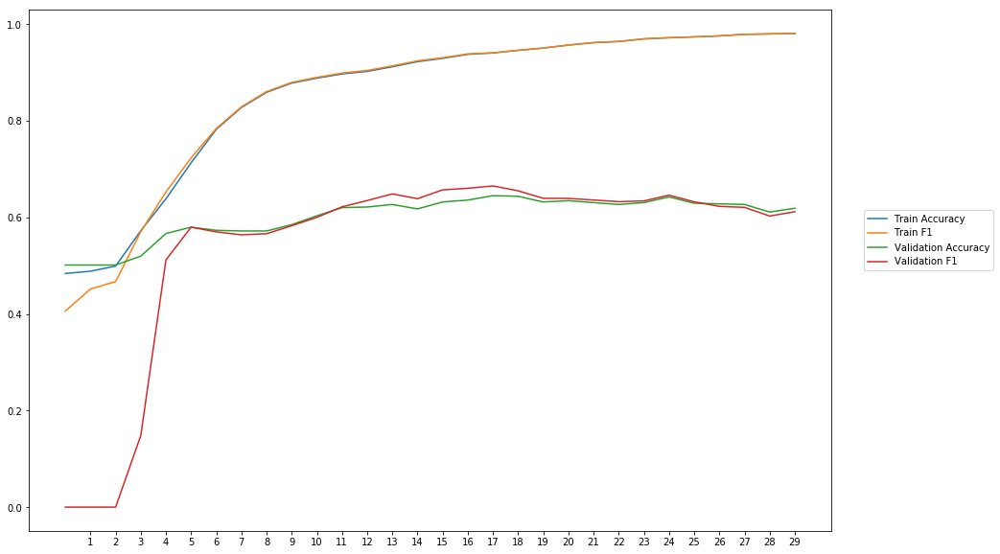

Average Accuracy: 60.09%
Average Precision: 55.09%
Average Recall: 54.62%
Average F1: 54.07%

-----Fold 5--------


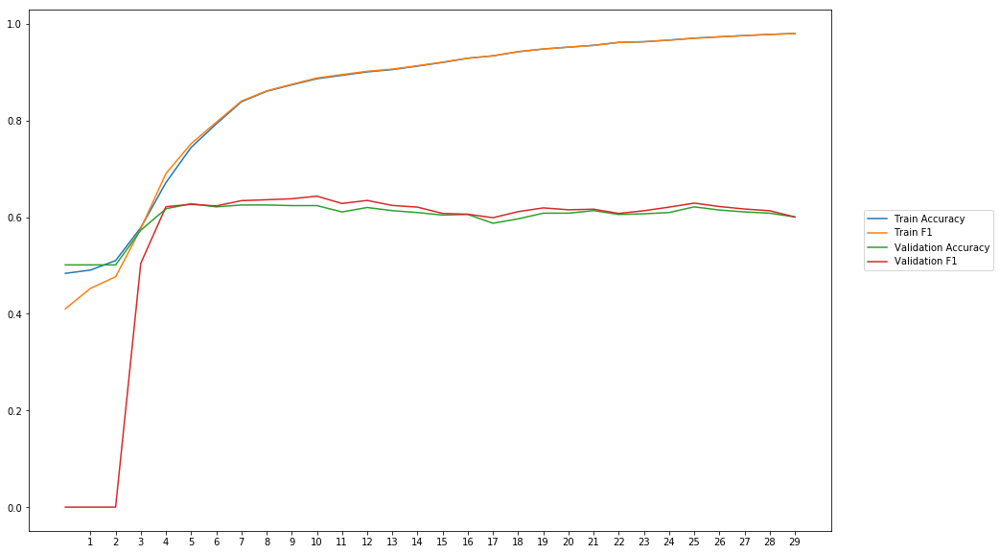

Average Accuracy: 60.00%
Average Precision: 54.59%
Average Recall: 56.49%
Average F1: 55.46%

-----Fold 6--------


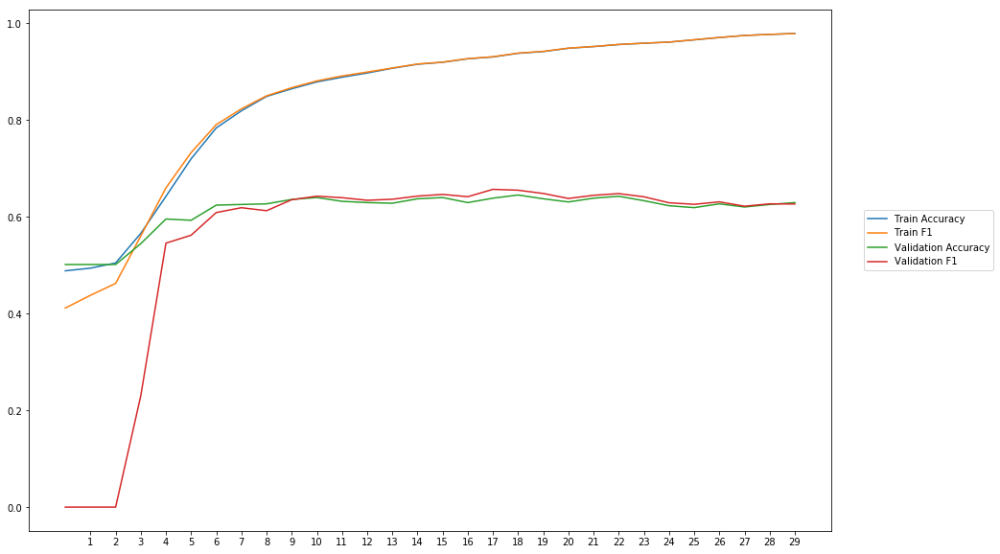

Average Accuracy: 61.30%
Average Precision: 56.74%
Average Recall: 55.36%
Average F1: 55.28%

-----Fold 7--------


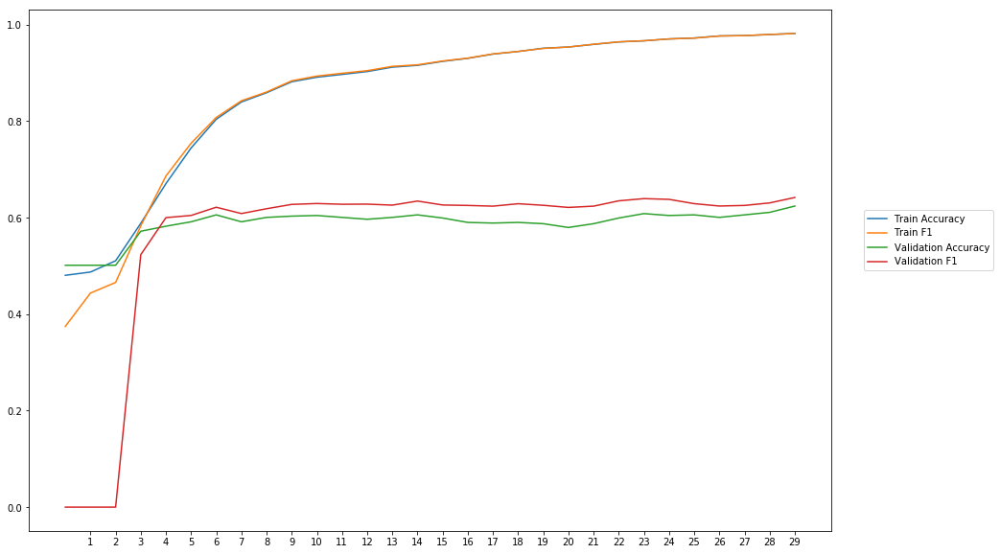

Average Accuracy: 58.80%
Average Precision: 52.65%
Average Recall: 59.88%
Average F1: 55.96%

-----Fold 8--------


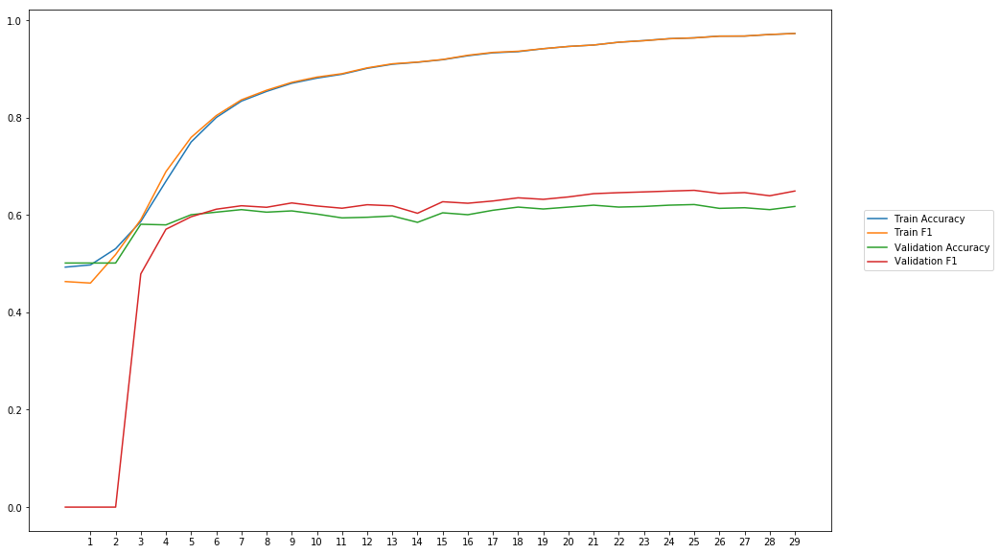

Average Accuracy: 59.60%
Average Precision: 53.68%
Average Recall: 58.87%
Average F1: 55.97%

-----Fold 9--------


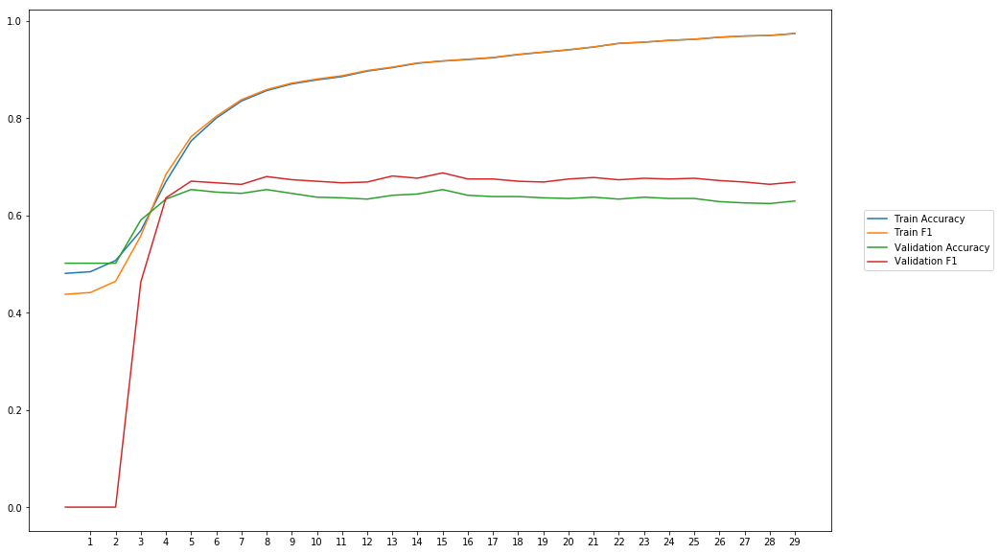

Average Accuracy: 62.28%
Average Precision: 55.45%
Average Recall: 65.32%
Average F1: 59.70%

-----Fold 10--------


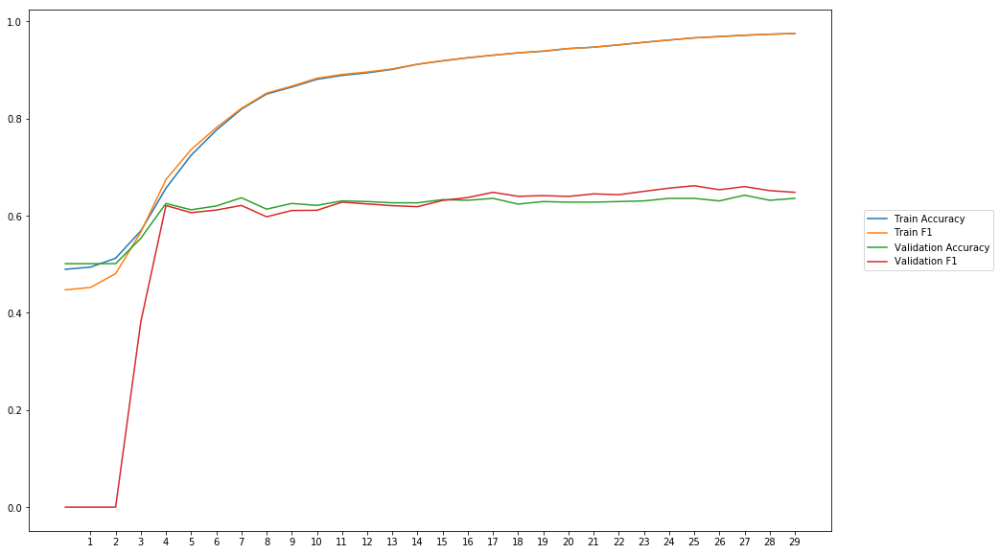

Average Accuracy: 61.36%
Average Precision: 56.08%
Average Recall: 56.93%
Average F1: 56.21%

-------Overallresults-------


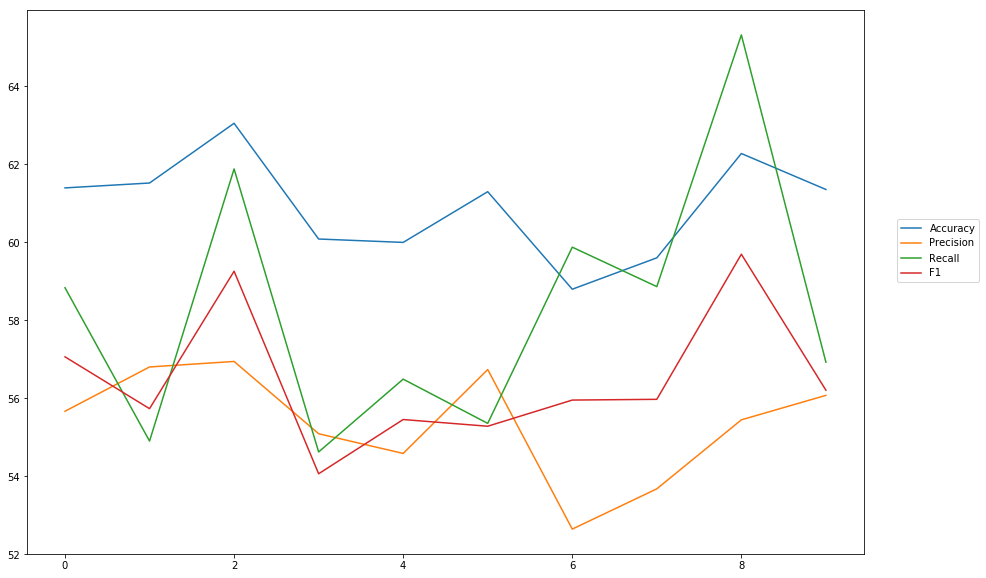

Accuracy: Mean = 60.94% (+/- 1.23%), Max = 63.06%, Min =  58.80%
Precision: Mean = 55.37% (+/- 1.34%), Max = 56.95%, Min =  52.65%
Recall: Mean = 58.31% (+/- 3.23%), Max = 65.32%, Min =  54.62%
F1: Mean = 56.47% (+/- 1.67%), Max = 59.70%, Min =  54.07%


In [12]:
cross_val(model_20, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'softmax_hard_sigmoid')

In [10]:
wv_layer_21 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_21 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_21 = wv_layer_21(comment_input_21)

#First Dense Layer
x_21 = Dense(600, activation='relu')(embedded_sequences_21)

x_21 = Flatten()(x_21)

#Output (Dense) Layer
preds_21 = Dense(2, activation='hard_sigmoid')(x_21)

# build the model
model_21 = Model(inputs=[comment_input_21], outputs=preds_21)


-----Fold 1--------


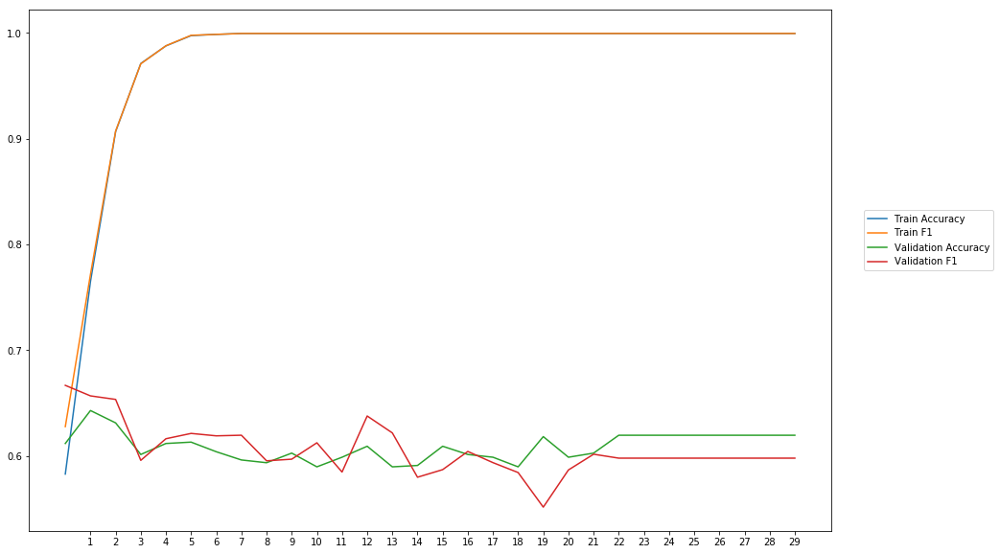

Average Accuracy: 60.87%
Average Precision: 60.96%
Average Recall: 60.54%
Average F1: 60.56%

-----Fold 2--------


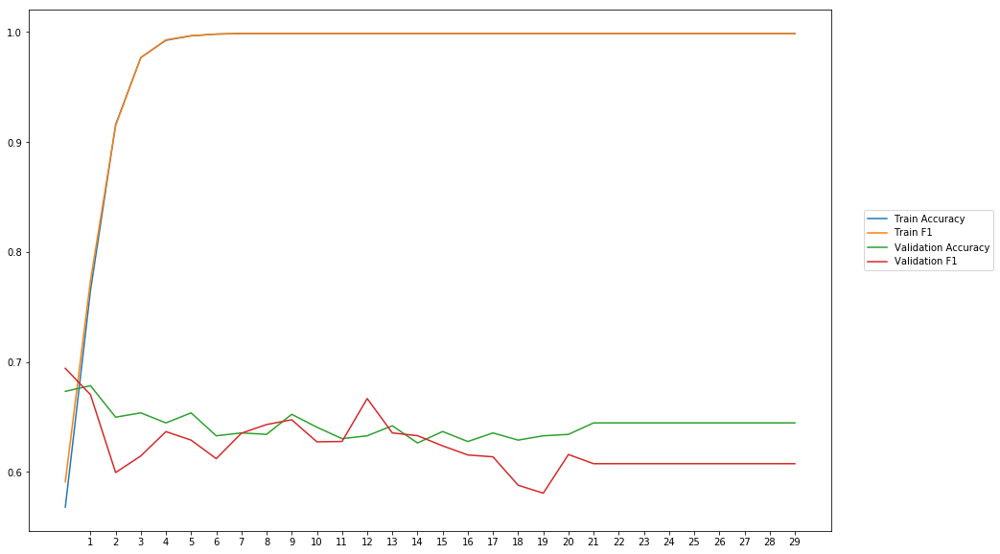

Average Accuracy: 64.25%
Average Precision: 65.40%
Average Recall: 59.79%
Average F1: 62.25%

-----Fold 3--------


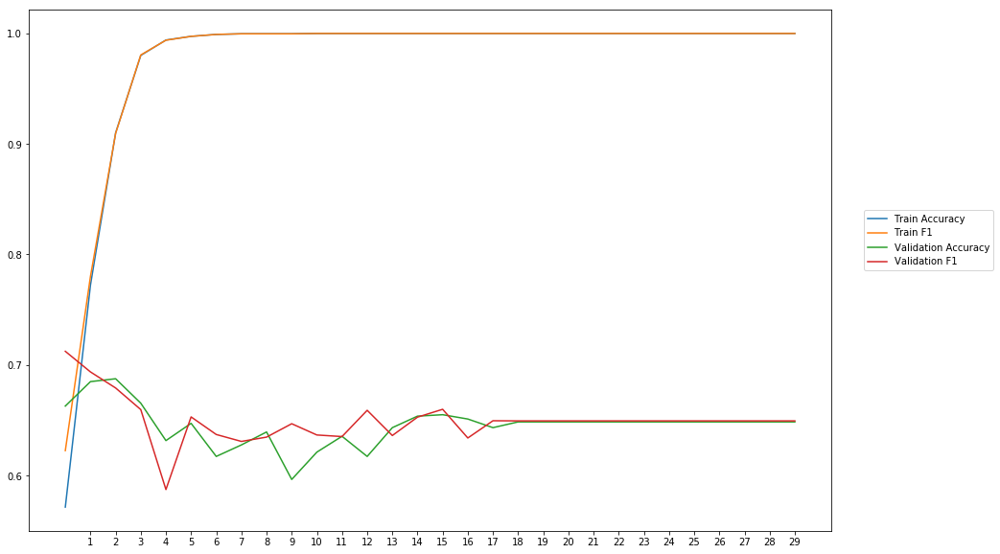

Average Accuracy: 64.54%
Average Precision: 64.12%
Average Recall: 66.11%
Average F1: 64.96%

-----Fold 4--------


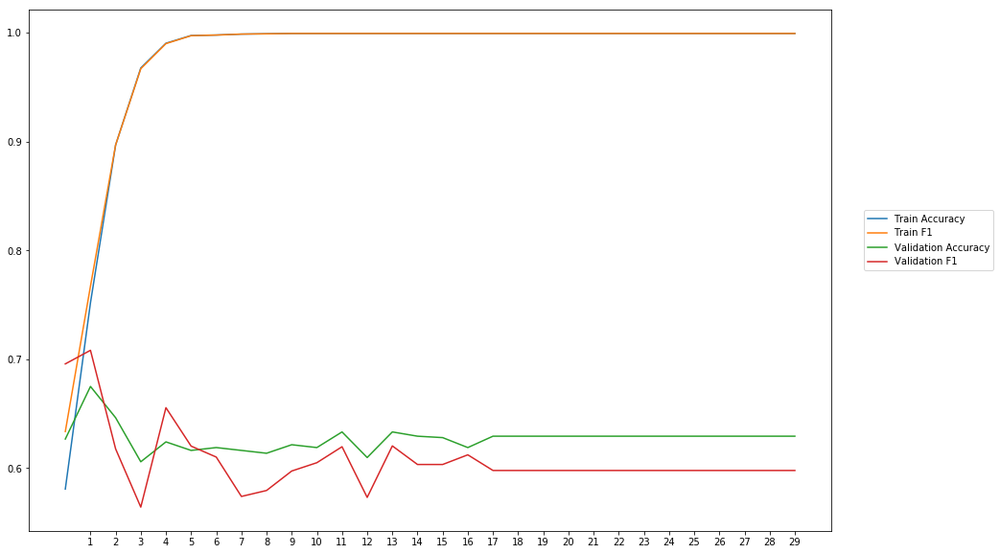

Average Accuracy: 62.72%
Average Precision: 63.31%
Average Recall: 58.83%
Average F1: 60.76%

-----Fold 5--------


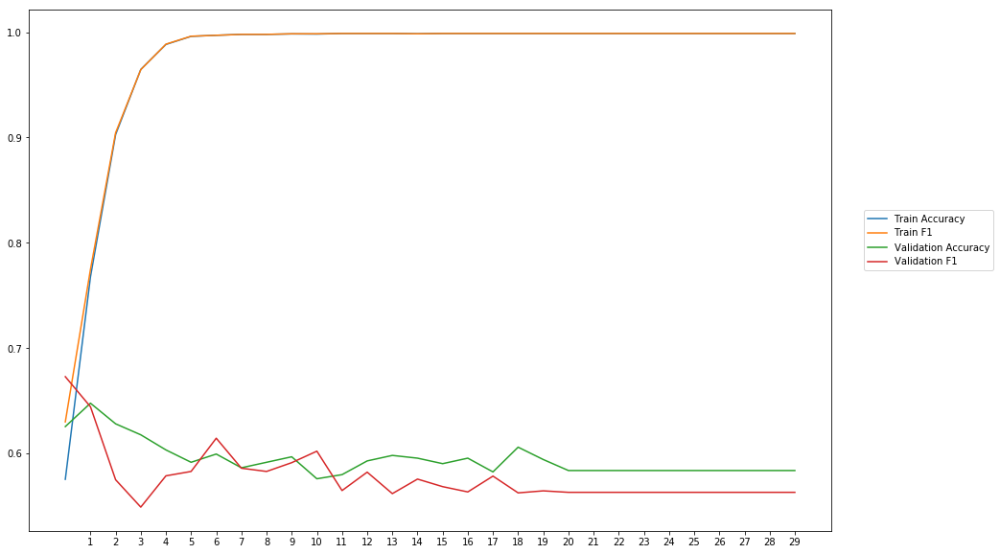

Average Accuracy: 59.43%
Average Precision: 59.97%
Average Recall: 56.06%
Average F1: 57.75%

-----Fold 6--------


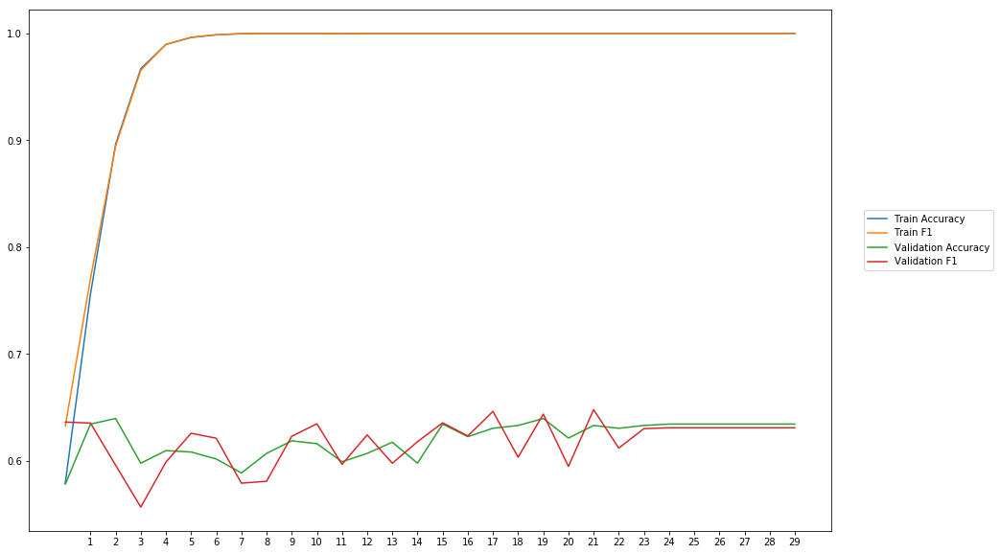

Average Accuracy: 62.03%
Average Precision: 62.44%
Average Recall: 61.54%
Average F1: 61.83%

-----Fold 7--------


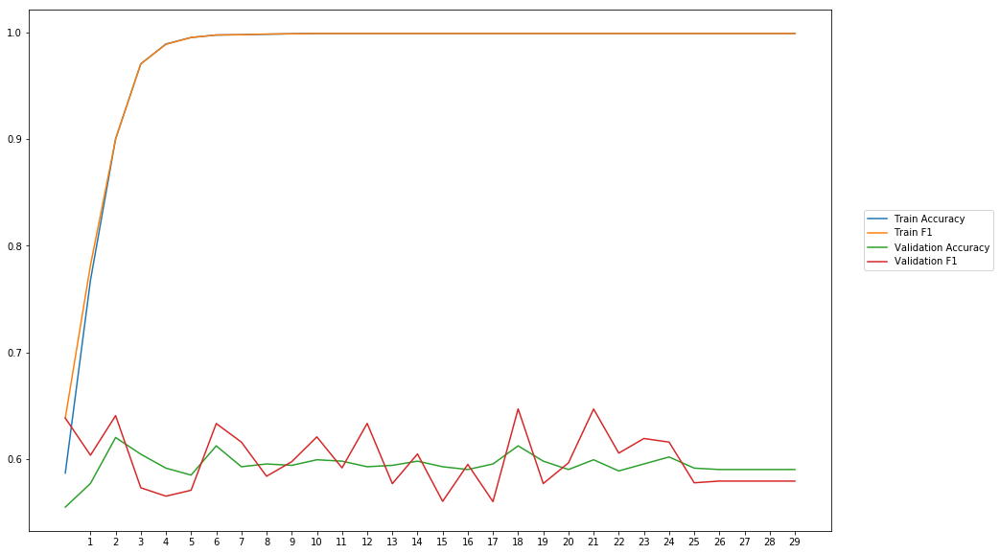

Average Accuracy: 59.41%
Average Precision: 59.43%
Average Recall: 60.84%
Average F1: 59.88%

-----Fold 8--------


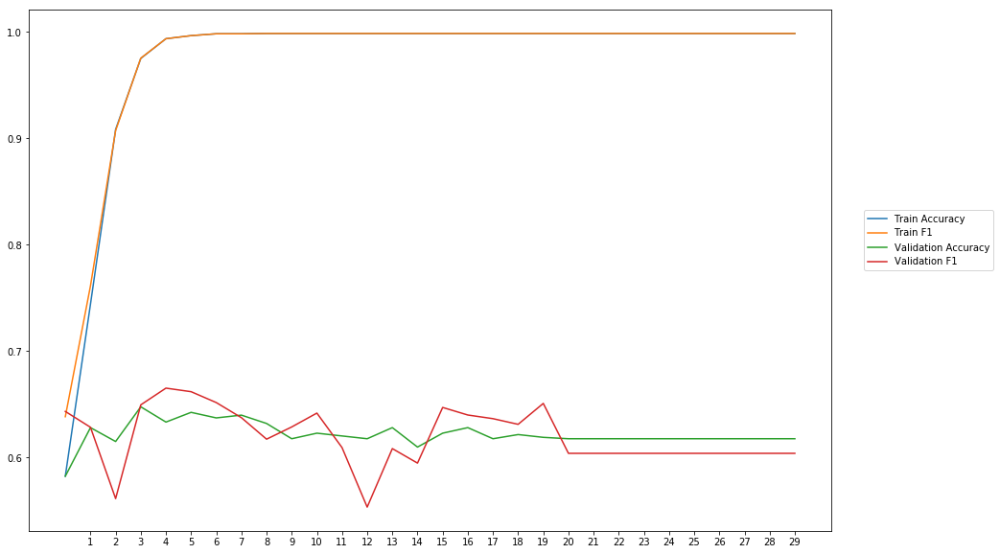

Average Accuracy: 62.18%
Average Precision: 62.29%
Average Recall: 62.13%
Average F1: 61.98%

-----Fold 9--------


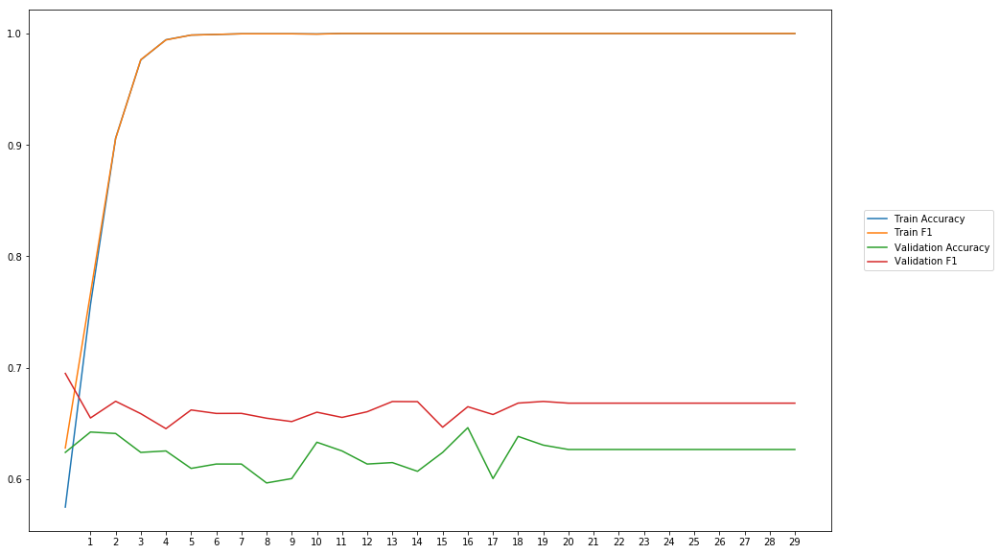

Average Accuracy: 62.30%
Average Precision: 59.87%
Average Recall: 74.71%
Average F1: 66.38%

-----Fold 10--------


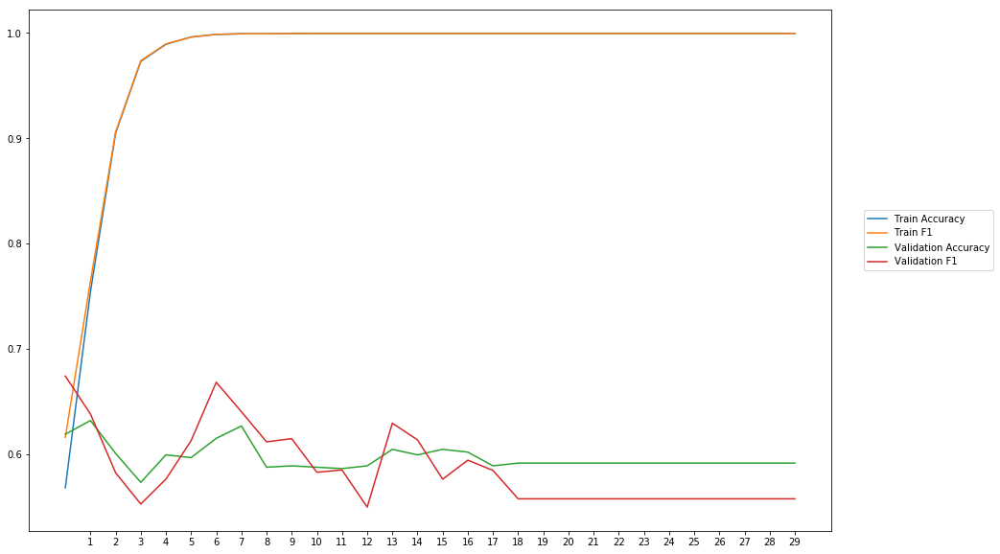

Average Accuracy: 59.65%
Average Precision: 60.42%
Average Recall: 57.49%
Average F1: 58.58%

-------Overallresults-------


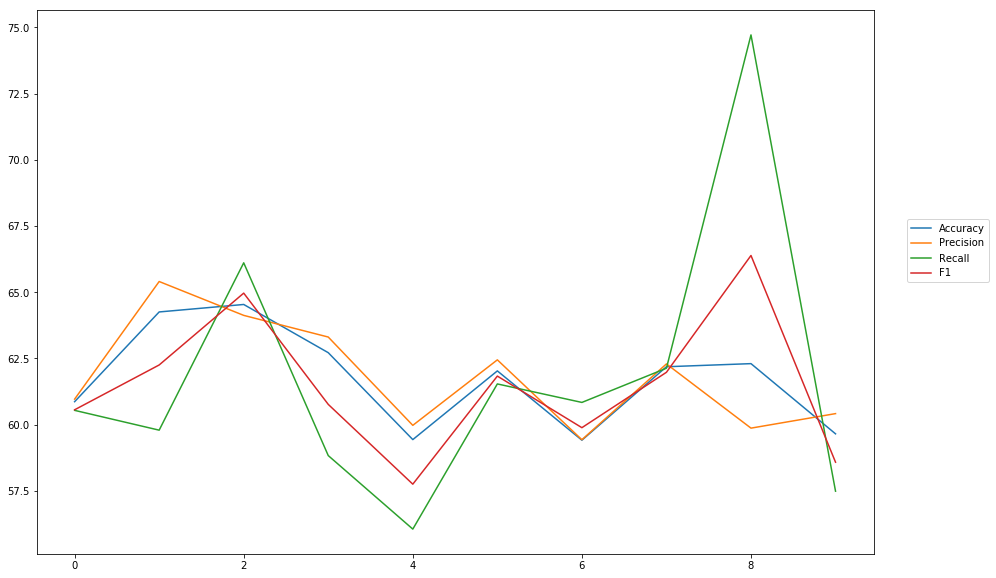

Accuracy: Mean = 61.74% (+/- 1.78%), Max = 64.54%, Min =  59.41%
Precision: Mean = 61.82% (+/- 1.91%), Max = 65.40%, Min =  59.43%
Recall: Mean = 61.80% (+/- 5.02%), Max = 74.71%, Min =  56.06%
F1: Mean = 61.49% (+/- 2.52%), Max = 66.38%, Min =  57.75%


In [20]:
cross_val(model_21, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'relu_hard_sigmoid')

In [22]:
wv_layer_22 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_22 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_22 = wv_layer_22(comment_input_22)

#First Dense Layer
x_22 = Dense(600, activation='relu')(embedded_sequences_22)

x_22 = Flatten()(x_22)

#Output (Dense) Layer
preds_22 = Dense(2, activation='sigmoid')(x_22)

# build the model
model_22 = Model(inputs=[comment_input_22], outputs=preds_22)


-----Fold 1--------


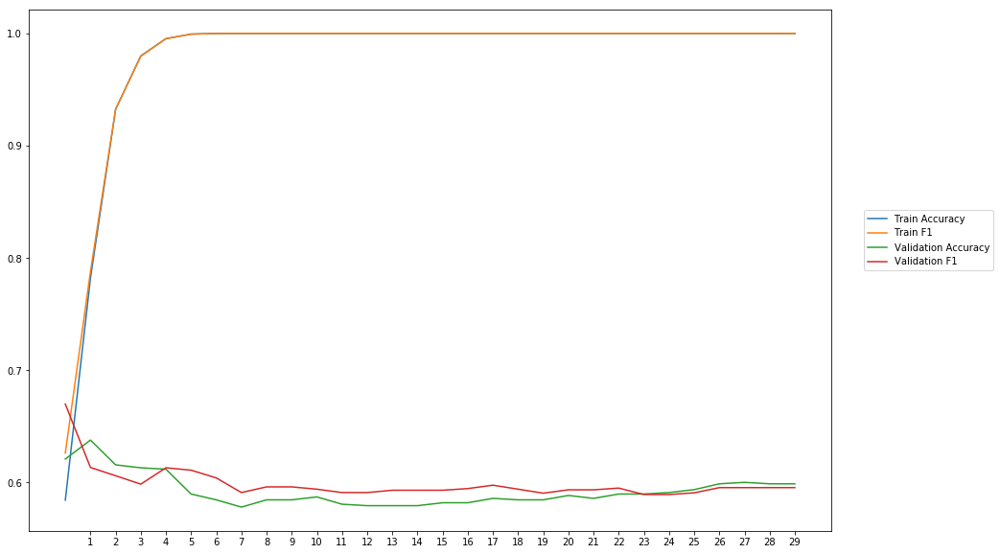

Average Accuracy: 59.26%
Average Precision: 58.82%
Average Recall: 61.08%
Average F1: 59.87%

-----Fold 2--------


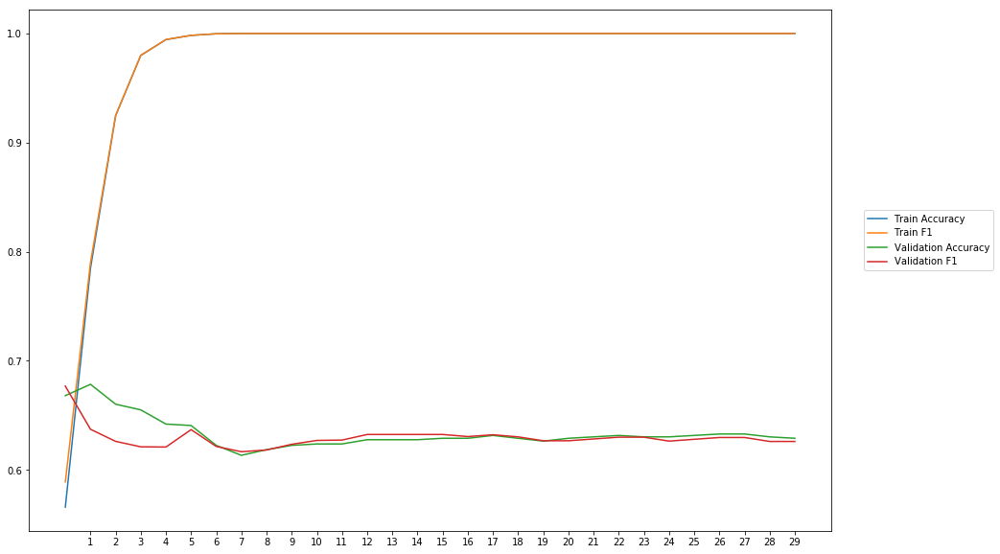

Average Accuracy: 63.34%
Average Precision: 63.54%
Average Recall: 62.51%
Average F1: 62.94%

-----Fold 3--------


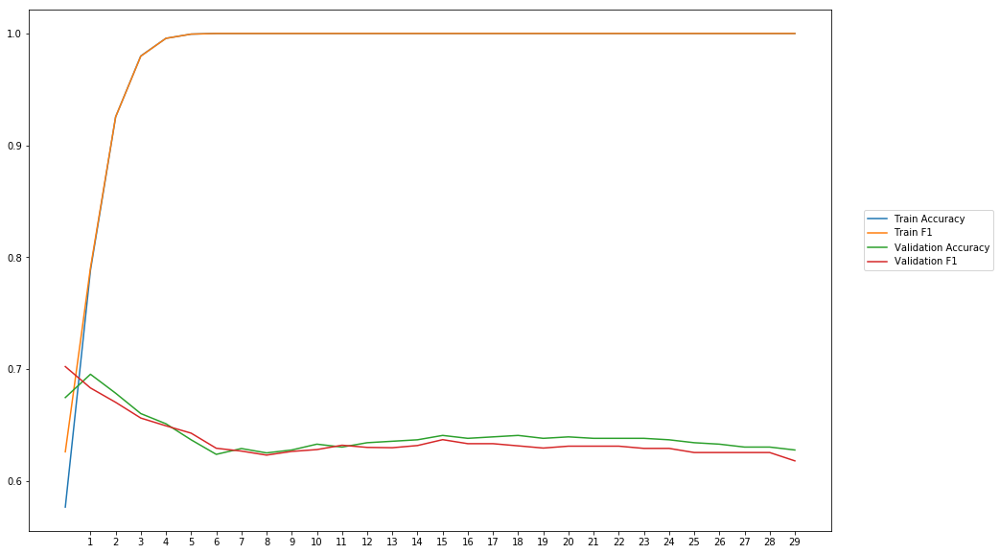

Average Accuracy: 64.04%
Average Precision: 64.32%
Average Recall: 63.05%
Average F1: 63.65%

-----Fold 4--------


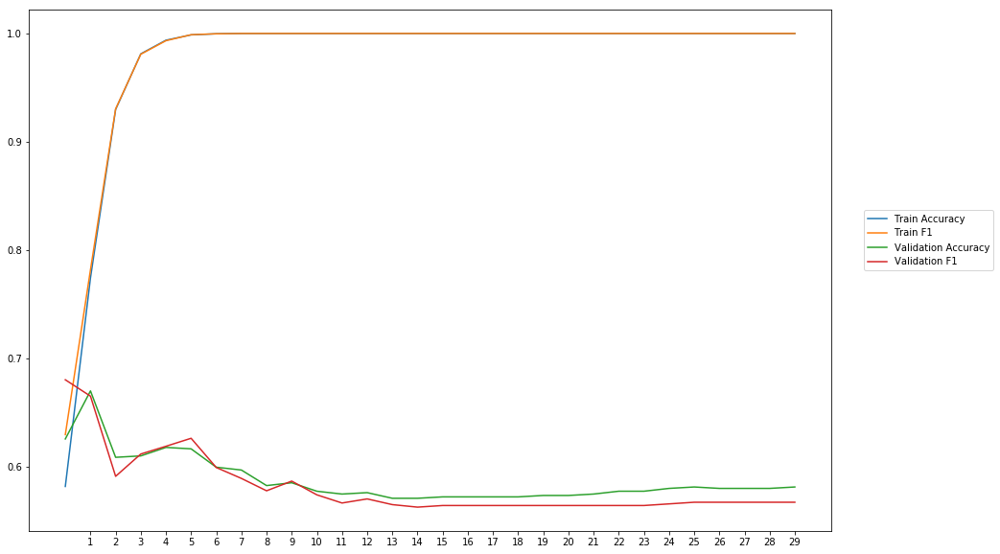

Average Accuracy: 58.73%
Average Precision: 58.50%
Average Recall: 57.99%
Average F1: 58.18%

-----Fold 5--------


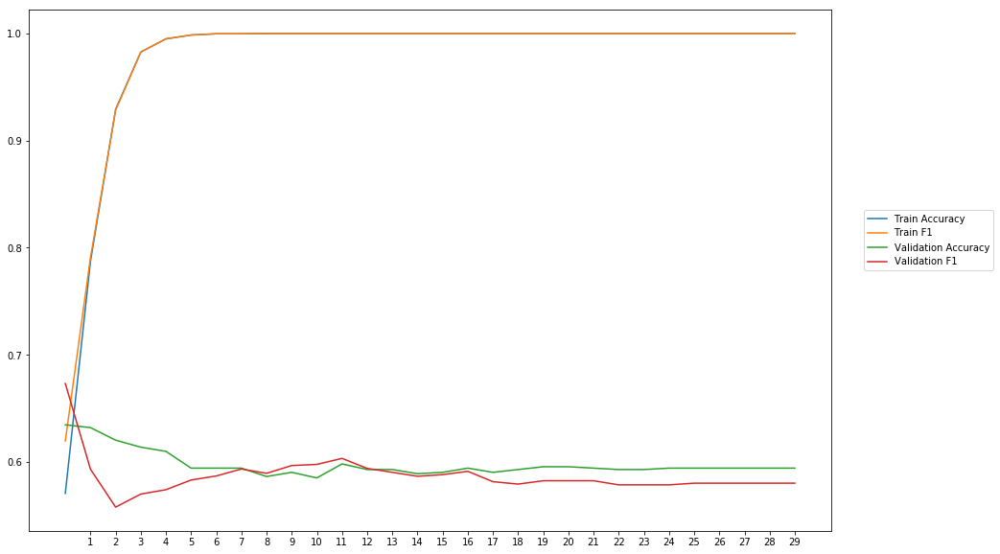

Average Accuracy: 59.75%
Average Precision: 60.26%
Average Recall: 57.43%
Average F1: 58.69%

-----Fold 6--------


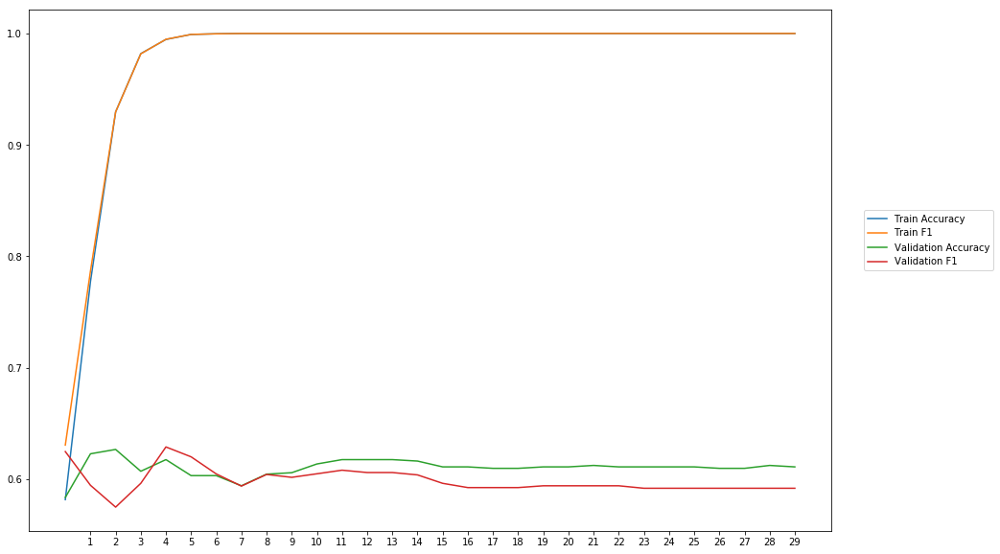

Average Accuracy: 61.04%
Average Precision: 61.59%
Average Recall: 58.45%
Average F1: 59.88%

-----Fold 7--------


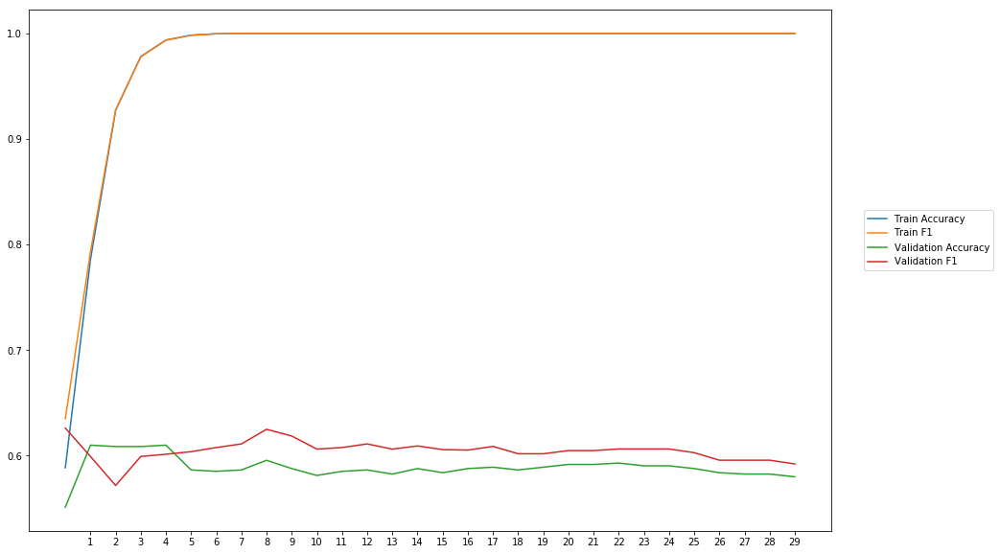

Average Accuracy: 58.85%
Average Precision: 58.22%
Average Recall: 63.04%
Average F1: 60.43%

-----Fold 8--------


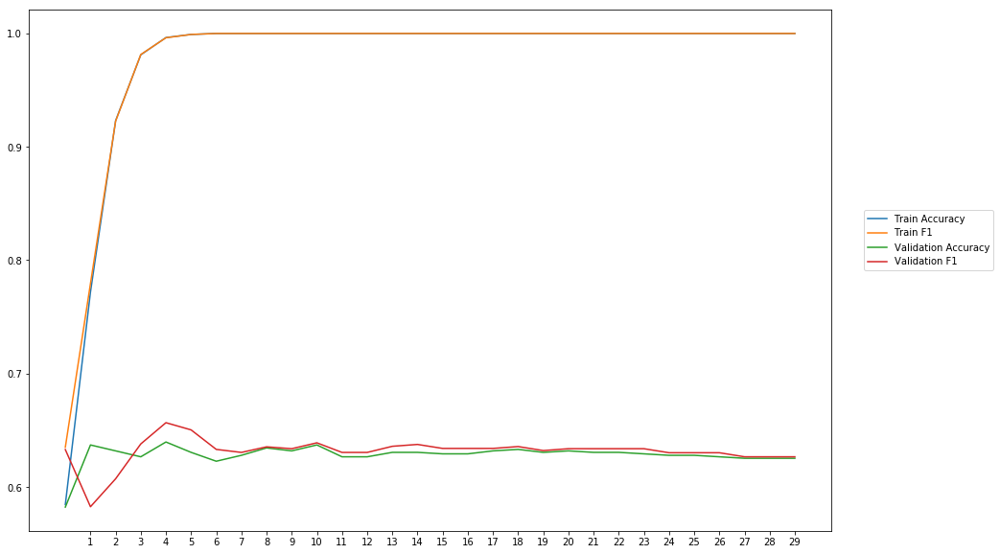

Average Accuracy: 62.84%
Average Precision: 62.56%
Average Recall: 64.00%
Average F1: 63.17%

-----Fold 9--------


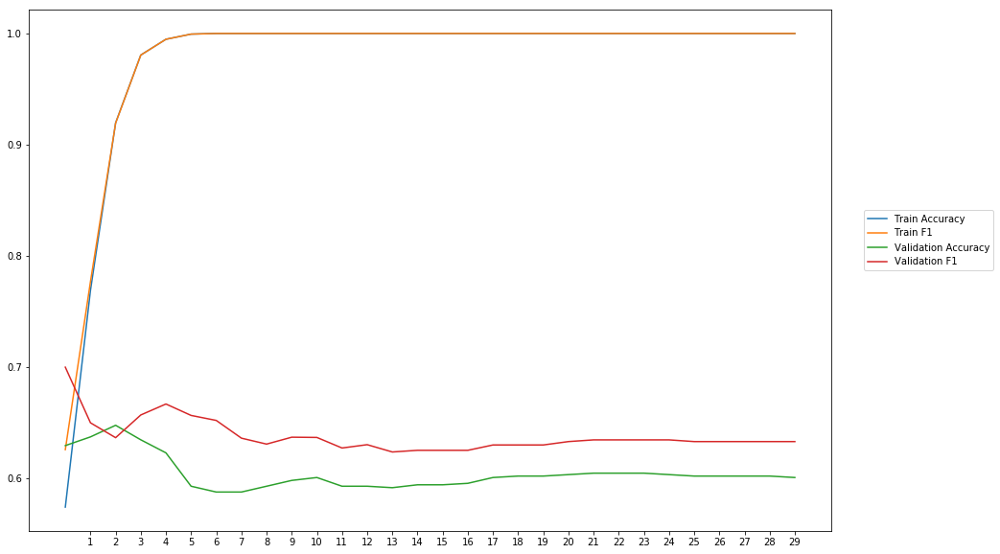

Average Accuracy: 60.40%
Average Precision: 58.75%
Average Recall: 69.97%
Average F1: 63.79%

-----Fold 10--------


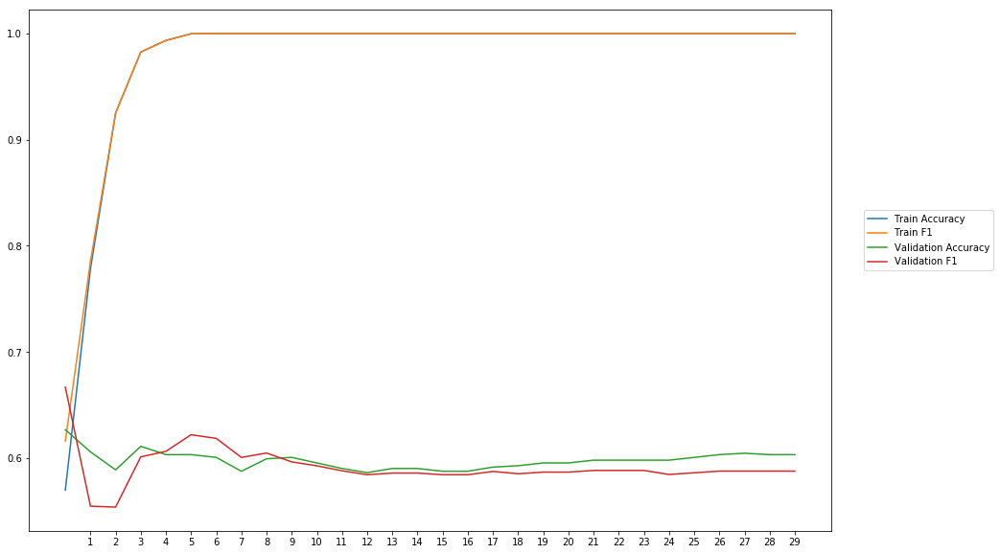

Average Accuracy: 59.78%
Average Precision: 59.83%
Average Recall: 58.78%
Average F1: 59.20%

-------Overallresults-------


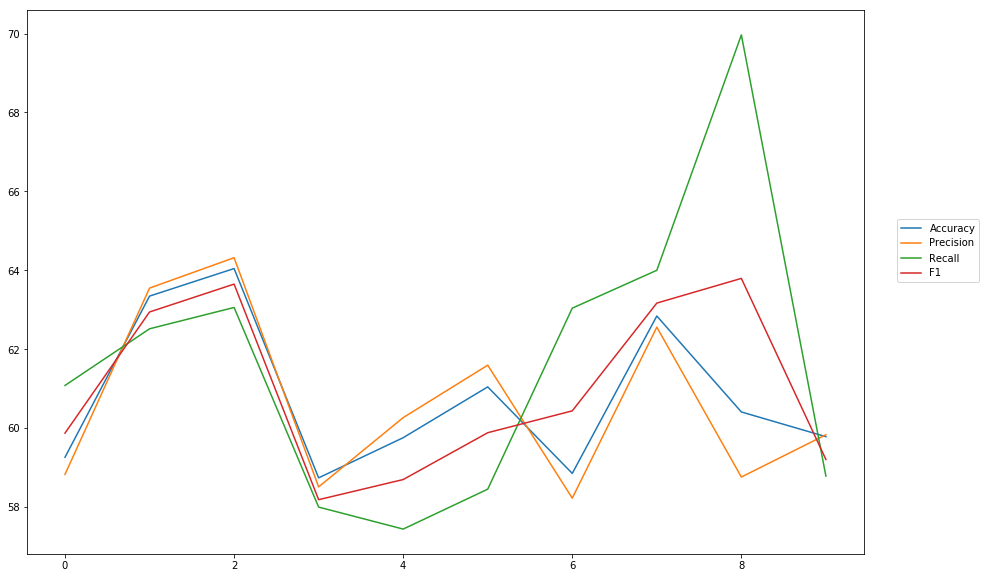

Accuracy: Mean = 60.80% (+/- 1.84%), Max = 64.04%, Min =  58.73%
Precision: Mean = 60.64% (+/- 2.11%), Max = 64.32%, Min =  58.22%
Recall: Mean = 61.63% (+/- 3.60%), Max = 69.97%, Min =  57.43%
F1: Mean = 60.98% (+/- 2.06%), Max = 63.79%, Min =  58.18%


In [23]:
cross_val(model_22, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'relu__sigmoid')

## Test the best model with heldout testdata

Instructions for updating:
Use tf.cast instead.


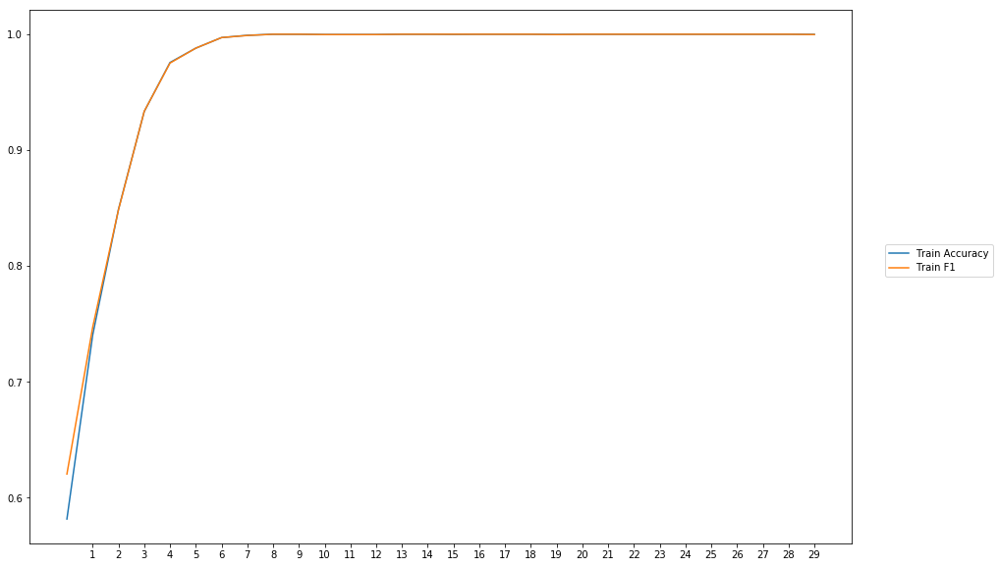


-----Test Scores----
Loss: 3.4497026813273526
Accuracy: 66.39030612244898
Precision: 56.488549603946936
Recall: 71.38263663299594
F1: 63.06817686809989


In [11]:
train_evaluate_final_model(model_21, EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, test_data, test_labels, softmax, outputpath, 'final_Activation')